# Import data and parameters

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from datetime import datetime
from dateutil.relativedelta import relativedelta
idx = pd.IndexSlice
import random 
from scipy import stats

from mine_simulation_tools import *
from refinery import *
from scrap_supply_tools import *
from demand_tools import *
from price_formation import *

In [2]:
def import_data():
    ## High level parameters
    historical_prod=pd.read_excel('Data/Production data compile.xlsx', sheet_name='Selected', index_col=0)
    historical_price=pd.read_excel('Data/Price data compile.xlsx', sheet_name='Price', index_col=0) # All prices 2017 constant

    # Specific prod and mine data
    historical_mining_prod=historical_prod.loc[:, 'Total mining production']
    historical_lme_price=historical_price.loc[:, 'LME']
    historical_tcrc=historical_price.loc[:, 'Annual TCRC']
    historical_no2=historical_price.loc[:, 'No.2 ref']
    historical_sp2=historical_lme_price-historical_no2


    ## Primary supply data and patameters
    operating_mine_pool=pd.read_excel('Data/primary supply/Operating mine pool.xls', sheet_name='Sheet1', index_col=0)
    open_parameter=pd.read_excel('Data/primary supply/Opening subsample parameter.xlsx', sheet_name='max5', index_col=0)
    incentive_pool=pd.read_excel('Data/primary supply/Incentive mine pool.xls', sheet_name='Sheet1', index_col=0)
    pri_hyper_param=pd.read_excel('Data/primary supply/Hyperparameters.xlsx', sheet_name='Sheet1', index_col=0)


    ## Refinery parameters
    ref_hyper_param=pd.read_excel('Data/refined supply/Refinery hyperparameter.xlsx', sheet_name='Parameters', index_col=0)
    conc_to_cathode_eff=ref_hyper_param.loc['conc to cathode eff', 'Value']
    scrap_to_cathode_eff=ref_hyper_param.loc['scrap to cathode eff', 'Value']


    ## Semis demand parameters
    gdp_growth_prediction_base=pd.read_excel('Data/semis demand/Demand prediction data.xlsx', sheet_name='GDP growth', index_col=0, usecols=np.arange(6))
    volume_prediction_base=pd.read_excel('Data/semis demand/Demand prediction data.xlsx', sheet_name='All sectors', index_col=0, header=[0,1])
    intensity_prediction=pd.read_excel('Data/semis demand/Intensity initial.xls', sheet_name='Sheet1', index_col=0, header=[0,1])
    elas_sec_reg=pd.read_excel('Data/semis demand/Elasticity estimates.xlsx', sheet_name='S+R S intercept only', index_col=0)
    sector_shape_matrix=pd.read_excel('Data/semis demand/Sector to shape matrix.xlsx', sheet_name='Sheet1', index_col=0)
    calibration_1718=pd.read_excel('Data/semis demand/2017 and 2018 calibration.xlsx', sheet_name='Sheet1', index_col=0)

    # Adjust demand in 2018 to scale it back to ICSG
    intensity_prediction.loc[2017, :] = intensity_prediction.loc[2017, :]\
    .mul(calibration_1718.loc[2017, 'ICSG refined usage']).div(calibration_1718.loc[2017, 'simulated refined usage'])
    intensity_prediction.loc[2018, :] = intensity_prediction.loc[2018, :]\
    .mul(calibration_1718.loc[2018, 'ICSG refined usage']).div(calibration_1718.loc[2018, 'simulated refined usage'])
    demand_prediction=volume_prediction_base.loc[2015:, :].mul(intensity_prediction.fillna(0))


    ## Scrap supply parameters
    use_sector_combined=pd.read_excel('Data/scrap supply/End use combined data.xlsx', sheet_name='Combined', index_col=0)
    sector_to_product=pd.read_excel('Data/scrap supply/All accounting matrix.xlsx', sheet_name='sector to product', index_col=0)
    product_to_waste=pd.read_excel('Data/scrap supply/All accounting matrix.xlsx', sheet_name='product to waste', index_col=0)
    product_life_and_eff=pd.read_excel('Data/scrap supply/All accounting matrix.xlsx', sheet_name='product lifetime and efficiency', index_col=0)
    product_to_cathode_alloy=pd.read_excel('Data/scrap supply/All accounting matrix.xlsx', sheet_name='product to copper or alloy', index_col=0)
    recycle_efficiency=pd.read_excel('Data/scrap supply/All accounting matrix.xlsx', sheet_name='recycling efficiency', index_col=0)

    # Home scrap ratio
    home_scrap_ratio_file=pd.read_excel('Data/scrap supply/Home scrap ratio.xls', sheet_name='Sheet1', index_col=0)
    home_scrap_ratio_series=home_scrap_ratio_file.loc[:, 'Calibrated ratio']
    exchange_scrap_ratio_series=0.9-home_scrap_ratio_series

    # Sector end use to product matrix 
    use_product_history=use_sector_combined.apply(lambda x: (x*sector_to_product).sum(axis=1),axis=1)
    # pd.DataFrame(np.matmul(use_sector_combined, sector_to_product.transpose()), 
    #                                  index=use_sector_combined.index, columns=sector_to_product.index)

    # Product to waste matrices
    product_to_waste_collectable=product_to_waste.iloc[:, :-2]
    product_to_waste_no_loss=product_to_waste_collectable.mul(1/product_to_waste_collectable.sum(axis=1), axis=0)

    # Product lifetime parameters and frequencies
    product_lifetime=product_life_and_eff.loc[:, 'Lifetime']
    product_lifetime_df=lifetime_df(product_lifetime)
    product_lifetime_freq_df=lifetime_freq_df(product_lifetime_df)

    # Recycling and fabrication efficiencies
    sort_eff=recycle_efficiency.iloc[:, 0]
    collect_rate=recycle_efficiency.iloc[:, 1]
    fab_eff=product_life_and_eff.loc[:, 'Fabrication efficiency']
    new_scrap_gen=1/fab_eff-1
    sort_eff_series=pd.DataFrame(np.array((list(sort_eff)*23)).reshape(23, 6), index=np.arange(2018, 2041), columns=sort_eff.index)
    collect_rate_series=pd.DataFrame(np.array((list(collect_rate)*23)).reshape(23, 6), index=np.arange(2018, 2041), columns=collect_rate.index)

    ## Price formation parameters
    price_formation_param=pd.read_excel('Data/price formation/Price formation.xlsx', sheet_name='Sheet1', index_col=0)
    cathode_sd_elas=price_formation_param.loc['Cathode SD elasticity', 'Value']
    conc_sd_elas=price_formation_param.loc['Concentrate SD elasticity', 'Value']
    cathode_sp2_elas=price_formation_param.loc['SP2 cathode elasticity', 'Value']
    sp2_sd_elas=price_formation_param.loc['SP2 SD elasticity', 'Value']
    globals().update(locals())
import_data()
print('Done')

/Users/danachoi/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


Done


# System initialization

In [3]:
def system_initialization():
    # Initialize simulation time
    history_start_time='19600101'
    simulation_start_time='20180101'
    simulation_end_time='20400101'
    simulation_time=pd.date_range(simulation_start_time, simulation_end_time, freq='AS')
    history_time=pd.date_range(history_start_time, simulation_start_time, freq='AS')

    # Cathode price
    cathode_price_series=pd.Series(0, index=history_time)
    cathode_price_series.loc[:'20180101']=historical_lme_price.values

    # TCRC
    tcrc_series=pd.Series(0, index=history_time)
    tcrc_series.loc[:'20180101']=historical_tcrc.values

    # No.2 scrap spread
    sp2_series=pd.Series(0, index=history_time)
    sp2_series.loc[:'20180101']=historical_sp2.values

    # Initialize mining stats
    mine_life_stats_panel_operating=mine_life_stats_panel_init(simulation_time, operating_mine_pool)
    mine_pool_new_last=pd.DataFrame()
    mine_life_stats_panel_new_last=pd.DataFrame()
    total_mining_prod=pd.Series(0, index=simulation_time)

    # Initilize sxew ids
    sxew_id_operating_bool=operating_mine_pool.loc[:, 'Payable percent (%)']==100
    sxew_id_operating=[i for i in sxew_id_operating_bool.index if sxew_id_operating_bool.loc[i]]
    sxew_id_new_bool=incentive_pool.loc[:, 'Payable percent (%)']==100
    sxew_id_new=[i for i in sxew_id_new_bool.index if sxew_id_new_bool.loc[i]]
    sxew_new=pd.Series(0, index=simulation_time)
    sxew_all=pd.Series(0, index=pd.date_range('20170101', simulation_end_time, freq='AS'))
    sxew_all.loc['20170101']=historical_prod.loc[2017, 'SX-EW production']

    # Initialize refinery stats
    ref_stats=ref_stats_init(simulation_time, ref_hyper_param)

    # Initialize concentrate prod, add 2017
    conc_prod_series=pd.Series(0, index=pd.date_range('20170101', simulation_end_time, freq='AS'))
    conc_prod_series.loc['20170101']=historical_prod.loc[2017, 'Concentrate production']

    # Initialize refined supply and demand
    ref_prod_series=pd.Series(0, index=simulation_time)
    ref_demand_series=pd.Series(0, index=pd.date_range('20170101', simulation_end_time, freq='AS'))
    ref_demand_series.loc['20170101']=historical_prod.loc[2017, 'Refined usage']

    # Initialize end use by product stats
    use_product_future=pd.DataFrame(0, index=np.arange(2019, 2041, 1), columns=use_product_history.columns)
    use_product_all_life=pd.concat([use_product_history, use_product_future])

    # Initialize old scrap history
    product_eol_history=product_reach_eol(use_product_history, product_lifetime_freq_df)
    waste_from_old_history=product_eol_history.apply(lambda x: (x*product_to_waste_collectable.T).sum(axis=1), axis=1).mul(sort_eff).mul(collect_rate)
    # pd.DataFrame(np.matmul(product_eol_history, product_to_waste_collectable), 
    #                                      index=product_eol_history.index, 
    #                                      columns=product_to_waste_collectable.columns).mul(sort_eff).mul(collect_rate)

    waste_from_old_future=pd.DataFrame(0, index=np.arange(2019, 2041, 1), columns=product_to_waste_collectable.columns)
    waste_from_old_all_life=pd.concat([waste_from_old_history, waste_from_old_future])

    # Initialize old scrap history
    waste_from_new_history=pd.DataFrame(0, index=waste_from_old_history.index, columns=product_to_waste_collectable.columns)
    for year_i in waste_from_new_history.index:
        home_scrap_ratio=home_scrap_ratio_series.loc[year_i]
        exchange_scrap_ratio=exchange_scrap_ratio_series.loc[year_i]
        waste_from_new_year_i=\
        simulate_new_scrap_one_year(year_i, use_product_history, new_scrap_gen, product_to_waste_no_loss, sort_eff, 
                                    home_scrap_ratio, exchange_scrap_ratio)
        waste_from_new_history.loc[year_i]=waste_from_new_year_i.values

    waste_from_new_future=pd.DataFrame(0, index=np.arange(2019, 2041, 1), columns=product_to_waste_collectable.columns)
    waste_from_new_all_life=pd.concat([waste_from_new_history, waste_from_new_future])

    waste_all_life=waste_from_old_all_life+waste_from_new_all_life

    # Initialize scrap demand
    direct_melt_scrap_demand=use_product_all_life.mul(product_to_cathode_alloy.loc[:, 'Alloyed']).sum(axis=1)
    refined_scrap_demand=historical_prod.loc[:, 'Secondary refining production'].div(scrap_to_cathode_eff)
    total_scrap_demand_all_life=pd.DataFrame({'Direct melt scrap': direct_melt_scrap_demand, 
                                              'Refined scrap': refined_scrap_demand})

    # Initialize scrap supply shock
    scrap_shock_file=pd.read_excel('Other scenarios/China import ban/Simulation scenarios.xlsx', sheet_name='Sheet1', index_col=0)
    scrap_shock=scrap_shock_file.loc[:, 'Baseline']
    globals().update(locals())
system_initialization()    
print('Done')

/Users/danachoi/Dropbox (MIT)/Group Research Folder_Olivetti/Displacement/00 Simulation/06 Module integration/mine_simulation_tools.py:386: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  init_time=pd.datetime(init_year, 1, 1)
/Users/danachoi/Dropbox (MIT)/Group Research Folder_Olivetti/Displacement/00 Simulation/06 Module integration/scrap_supply_tools.py:93: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the result takes the index/columns of the first DataFrame. In the future , the DataFrames/Series will be aligned before applying the ufunc.
Convert one of the arguments to a NumPy array (eg 'ufunc(df1, np.asarray(df2)') to keep the current behaviour, or align manually (eg 'df1, df2 = df1.align(df2)') before passing to the ufunc to obtain the future behaviour and silence this warning.
  pd.Series(np.matmu

Done


In [4]:
datetime(2020,1,1)
pd.datetime(2020,1,1)
product_to_cathode_alloy

,Copper,Alloyed
Plumbing,0.482413,0.517587
Building Plant,1.000000,0.000000
Architecture,0.516101,0.483899
Communications,1.000000,0.000000
Electrical Power,0.986363,0.013637
Telecommunications,0.999845,0.000155
Power Utility,0.928128,0.071872
Electrical Industrial,0.915842,0.084158
Non Elec. Industrial,0.088140,0.911860
Electrical Automotive,0.818238,0.181762


# Original Simulation

Some tuning parameters
1. **sec_coef**, describes to what extent secondary refinery capacity growth follows scrap supply
2. **open_parameter**, how many mines to assess for opening possibility
3. **sp2_sd_elas**, The elasticity of SP2 to scrap S-D. This is not estimated through regression, value just assigned

## Scenario parameters

Baseline

In [5]:
sort_eff_series=pd.DataFrame(np.array((list(sort_eff)*23)).reshape(23, 6), index=np.arange(2018, 2041), columns=sort_eff.index)
sp2_sd_elas=0.0845

China import ban:

In [6]:
scrap_shock=scrap_shock_file.loc[:, 'Reuter all']

5sm:

In [7]:
scrap_shock.loc[2019:2023]=1e-7

/Users/danachoi/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


prs_50:

In [8]:
sort_eff_series.loc[2019:, :]=[0.9, 0.55, 0.55, 0.75, 0.75, 0.3]
collect_rate_series.loc[2019:, :]=[0.82, 0.49, 0.69, 0.97, 0.76, 0.74]

prs_10:

In [9]:
sort_eff_series.loc[2019:, :]=[0.9, 0.55, 0.55, 0.7, 0.75, 0.2]
collect_rate_series.loc[2019:, :]=[0.74, 0.14, 0.64, 0.94, 0.68, 0.77]

## Simulation main

In [9]:
# 'b '+str(num_yrs)+' yr '+str(opp_pct)+' %'
import warnings
warnings.filterwarnings("ignore")

In [ ]:
scenarios = ['baseline_baseline_check']
import_data()
system_initialization()
collect_rate_df = pd.DataFrame([collect_rate.values,
                                [0.74,0.14,0.64,0.94,0.68,0.77],
                                [0.76,0.23,0.65,0.96,0.70,0.85],
                                [0.82,0.49,0.69,0.97,0.76,0.74],
                                [0.92,0.73,0.75,0.96,0.86,0.88]],
                               index = [0,10,20,50,100], columns = collect_rate.index)

sort_eff_df = pd.DataFrame([sort_eff.values,
                           [0.9,0.55,0.55,0.70,0.75,0.20],
                           [0.9,0.55,0.55,0.70,0.75,0.20],
                           [0.9,0.55,0.55,0.75,0.75,0.3],
                           [0.9,0.70,0.55,0.85,0.75,0.35]], 
                           index = [0,10,20,50,100], columns = sort_eff.index)
    
for num_yrs,opp_pct in [(0,0)]+[(a,b) for a in np.arange(1,21) for b in np.arange(5,101,5)]:
    import_data()
    system_initialization()
    
    if num_yrs != 0:
        sort_eff_series=pd.DataFrame(np.array((list(sort_eff)*23)).reshape(23, 6), index=np.arange(2018, 2041), columns=sort_eff.index)
        collect_rate_series=pd.DataFrame(np.array((list(collect_rate)*23)).reshape(23, 6), index=np.arange(2018, 2041), columns=collect_rate.index)

    # For supply shock scenarios
#         if opp_pct not in collect_rate_df.index:
#             collect_rate_df.loc[opp_pct,:] = np.nan
#             collect_rate_df = collect_rate_df.sort_index().interpolate()
#             sort_eff_df.loc[opp_pct,:] = np.nan
#             sort_eff_df = sort_eff_df.sort_index().interpolate()
    # For linear ramp scenarios
#         for waste_i in collect_rate.index:
#             collect_rate_series.loc[2018:2018+num_yrs,waste_i] = \
#                 np.linspace(collect_rate.loc[waste_i],collect_rate_df.loc[opp_pct,waste_i],num_yrs+1)
#             sort_eff_series.loc[2018:2018+num_yrs,waste_i] = \
#                 np.linspace(sort_eff.loc[waste_i],sort_eff_df.loc[opp_pct,waste_i],num_yrs+1)
#             collect_rate_series.loc[2019+num_yrs:,waste_i]=collect_rate_df.loc[opp_pct,waste_i]
#             sort_eff_series.loc[2019+num_yrs:,waste_i]=sort_eff_df.loc[opp_pct,waste_i]
    # For spike scenarios
#         for waste_i in collect_rate.index:
#             collect_rate_series.loc[2019:2019+num_yrs-1,waste_i] = \
#                 collect_rate_df.loc[opp_pct,waste_i]
#             sort_eff_series.loc[2019:2019+num_yrs-1,waste_i] = \
#                 sort_eff_df.loc[opp_pct,waste_i]
    # For demand shock scenarios - set demand opportunity as 20%, compare with 15% of total scrap generated
        pca = product_to_cathode_alloy.copy()
        pca_o=product_to_cathode_alloy.copy()
        pca.loc[:,'Copper']= product_to_cathode_alloy.loc[:,'Copper']*(1-opp_pct/100*0.2)
        pca.loc[:,'Alloyed'] = 1-pca.loc[:,'Copper']

        ssm = sector_shape_matrix.copy()
        ssm_o=sector_shape_matrix.copy()
        ssm.loc['Copper']= sector_shape_matrix.loc['Copper']*(1-opp_pct/100*0.2)
        ssm.loc['Tube ':] = (1-ssm.loc['Copper'])*sector_shape_matrix.loc['Tube ':]/sector_shape_matrix.loc['Tube ':].sum()

            
#     print(sort_eff_series)
#     print(collect_rate_series)
    scenario = 'd '+str(num_yrs)+' yr '+str(opp_pct)+' %'
    
    for year_i in np.arange(2018, 2041):
        print(year_i, scenario)
        t=pd.datetime(year_i, 1, 1)
        t_lag_1=pd.datetime(year_i-1, 1, 1)
        t_lag_2=pd.datetime(year_i-2, 1, 1)

        #### Scenario parameters ####
        sort_eff=sort_eff_series.loc[year_i]
        collect_rate=collect_rate_series.loc[year_i]

        if num_yrs != 0:
            if year_i-2018 <= num_yrs:
                product_to_cathode_alloy = pca_o+(pca-pca_o)*(year_i-2018)/num_yrs
                sector_shape_matrix = ssm_o+(ssm-ssm_o)*(year_i-2018)/num_yrs
        print(product_to_cathode_alloy,sector_shape_matrix)
        
        #### Price formation ####
        if year_i > 2018:        
            ### Cathode price ###
            cathode_bal_l1=ref_prod_series.loc[t_lag_1]-ref_demand_series.loc[t_lag_1]
            cathode_price_series.loc[t]=cathode_price_predict(cathode_price_series.loc[t_lag_1], 
                                                              cathode_balance=cathode_bal_l1, cathode_sd_elas=cathode_sd_elas)

            ### TCRC ###
            conc_bal_l1=conc_prod_series.loc[t_lag_1]-ref_stats.loc[t_lag_1, 'Primary production']/conc_to_cathode_eff
            tcrc_series.loc[t]=tcrc_predict(tcrc_series.loc[t_lag_1], 
                                            conc_balance=conc_bal_l1, conc_sd_elas=conc_sd_elas)

            ### SP2 ###
            scrap_bal_l1=waste_all_life.sum(axis=1).loc[year_i-1]-total_scrap_demand_all_life.sum(axis=1).loc[year_i-1]
            cathode_price_diff=cathode_price_series.loc[t]-cathode_price_series.loc[t_lag_1]
            sp2_series.loc[t]=sp2_predict(sp2_series.loc[t_lag_1], 
                                          scrap_balance=scrap_bal_l1, scrap_sd_elas=sp2_sd_elas, 
                                          cathode_diff=cathode_price_diff, cathode_sp2_elas=cathode_sp2_elas)

        # TCRC to cents per pound
        tcrc_cpp_series = tcrc_series.copy().div(22.0462)


        #### Production of operating mine ####
        for mine_id in operating_mine_pool.index:
            mine_data = operating_mine_pool.loc[mine_id]
            mine_life_stats = simulate_mine_life_stats_panel(simulation_time, year_i, 2018, 
                                                             mine_life_stats_panel_operating, mine_data, 
                                                             cathode_price_series, tcrc_cpp_series, pri_hyper_param)
            mine_life_stats_panel_operating.loc[:, idx[mine_id, :]]=mine_life_stats.loc[simulation_time, :].values

        # Total production statistics
        prod_operating=mine_life_stats_panel_operating.loc[:, idx[:, 'Recovered metal production (kt)']].sum(axis=1)
        sxew_operating=mine_life_stats_panel_operating.loc[:, idx[sxew_id_operating, 'Recovered metal production (kt)']].sum(axis=1)
        conc_operating=prod_operating-sxew_operating


        #### Production of new mines ####
        if year_i > 2018:
            # Read subsample size parameter and generate new incentive pool for year_i
            subsample_size=open_parameter.loc[year_i, 'Subsample size']
            mine_pool_new_year_i=new_mine_data(year_i, simulation_end_time, incentive_pool, cathode_price_series, tcrc_cpp_series,
                                               pri_hyper_param, subsample_size, irr_cutoff=0.15)
            print('New mines opening this year: ', mine_pool_new_year_i.shape[0])

            # Initialize mine life panel data for incentive pool year_i
            mine_life_stats_panel_new_year_i=mine_life_stats_panel_init(simulation_time, mine_pool_new_year_i)

            # Append new incentive pool at year_i
            mine_pool_new=pd.concat([mine_pool_new_last, mine_pool_new_year_i])
            mine_life_stats_panel_new=pd.concat([mine_life_stats_panel_new_last, mine_life_stats_panel_new_year_i], axis=1)

            for mine_id in mine_pool_new.index:
                mine_data = mine_pool_new.loc[mine_id]
                mine_life_stats = simulate_mine_life_stats_panel(simulation_time, year_i, mine_data.loc['Initial year'], 
                                                                 mine_life_stats_panel_new, mine_data, 
                                                                 cathode_price_series, tcrc_cpp_series, pri_hyper_param)
                mine_life_stats_panel_new.loc[:, idx[mine_id, :]]=mine_life_stats.loc[simulation_time, :].values


            # Total production statistics
            prod_new=mine_life_stats_panel_new.loc[:, idx[:, 'Recovered metal production (kt)']].sum(axis=1)
            sxew_new=mine_life_stats_panel_new.loc[:, idx[sxew_id_new, 'Recovered metal production (kt)']].sum(axis=1)
            conc_new=prod_new-sxew_new

            # Update incentive pool info
            mine_pool_new_last=mine_pool_new.copy()
            mine_life_stats_panel_new_last=mine_life_stats_panel_new.copy()


        #### Update total mining production ####
        if year_i == 2018:
            conc_new=pd.Series(0, index=simulation_time)
            prod_new=pd.Series(0, index=simulation_time)

        conc_prod_series.loc[t]=conc_operating.loc[t]+conc_new.loc[t]
        sxew_all.loc[t]=sxew_operating.loc[t]+sxew_new.loc[t]
        print('Total mining production: ', prod_operating.loc[t]+prod_new.loc[t])


        #### Demand for refined copper ####
        if year_i == 2018:
            pass
        else:
            intensity_next=intensity_prediction_one_year(year_i, cathode_price_series, gdp_growth_prediction_base, 
                                                         intensity_prediction.loc[year_i-1, :], volume_prediction_base, 
                                                         elas_sec_reg, method='sec and reg')
            intensity_prediction.loc[year_i, :]=intensity_next.values
            demand_prediction.loc[year_i, :]=intensity_prediction.loc[year_i, :].mul(volume_prediction_base.loc[year_i, :]).values

        # Demand by shape and refined copper demand
        demand_by_sector=demand_prediction.groupby(level=0, axis=1).sum()
        demand_by_shape=demand_by_sector.apply(lambda x: (x*sector_shape_matrix).sum(axis=1), axis=1)
#         pd.DataFrame(np.matmul(demand_by_sector, sector_shape_matrix.transpose()), 
#                                      index=demand_by_sector.index, columns=sector_shape_matrix.index)
        ref_demand_series.loc[t]=demand_by_shape.loc[year_i, 'Copper']


        #### Production of refineries ####
        if year_i == 2018:
            pass
        else:
            ref_stats_next=simulate_refinery_production_oneyear(year_i, tcrc_series, sp2_series, 
                                                                ref_demand_series, waste_all_life.sum(axis=1),
                                                                ref_stats, ref_hyper_param, growth_lag=1)
            ref_stats.loc[t, :]=ref_stats_next

        total_ref_prod=ref_stats.loc[t, 'Primary production']+ref_stats.loc[t, 'Secondary production']+sxew_all.loc[t]
        ref_prod_series.loc[t]=total_ref_prod

        

        #### Generation of old scrap ####use_product_all_life
        if year_i > 2018:
            # Calculate end use by sector and by product
            use_sector_year_i=demand_prediction.groupby(level=0, axis=1).sum()\
                              .loc[:, list(sector_to_product.columns)].loc[year_i, :]
            use_product_year_i=pd.Series(np.matmul(use_sector_year_i, sector_to_product.transpose()), 
                                         index=sector_to_product.index)
            use_product_all_life.loc[year_i]=use_product_year_i.values

            # Product reaching end of life and waste collected
            product_eol_year_i=product_reach_eol_oneyear(year_i, , product_lifetime_freq_df)
            waste_collected_year_i=waste_collected_oneyear(product_eol_year_i, product_to_waste_collectable, sort_eff, collect_rate)
            waste_from_old_future.loc[year_i]=waste_collected_year_i


        #### Generation of new scrap ####
        if year_i > 2018:
            home_scrap_ratio=home_scrap_ratio_series.loc[year_i]
            exchange_scrap_ratio=exchange_scrap_ratio_series.loc[year_i]
            waste_from_new_year_i=\
            simulate_new_scrap_one_year(year_i, use_product_all_life, new_scrap_gen, product_to_waste_no_loss, sort_eff,
                                        home_scrap_ratio, exchange_scrap_ratio)
            waste_from_new_future.loc[year_i]=waste_from_new_year_i

            scrap_supply_shock_year_i=scrap_shock.loc[year_i]/6 # Distribute evenly to six waste streams

            # All scrap
            waste_all_life.loc[year_i]=waste_from_new_year_i+waste_collected_year_i+scrap_supply_shock_year_i


        print('Total scrap supply: ', waste_all_life.sum(axis=1).loc[year_i])


        #### Demand of scrap
        direct_melt_scrap_demand_year_i=use_product_all_life.mul(product_to_cathode_alloy.loc[:, 'Alloyed']).sum(axis=1).loc[year_i]
        refined_scrap_demand_year_i=ref_stats.loc[t, 'Secondary production']/scrap_to_cathode_eff
        total_scrap_demand_all_life.loc[year_i, 'Direct melt scrap']=direct_melt_scrap_demand_year_i
        total_scrap_demand_all_life.loc[year_i, 'Refined scrap']=refined_scrap_demand_year_i


    ###################### SAVING RESULTS ##########################

    prices_simulated=pd.DataFrame({'Cathode': cathode_price_series, 'No.2 spread': sp2_series, 'TCRC': tcrc_series})

    mining_prod_df_future=pd.concat([conc_operating+conc_new, sxew_operating+sxew_new], axis=1)
    mining_prod_df_future.columns=['Concentrate production', 'SX-EW production']
    mining_prod_df_history=historical_prod.loc[:, ['Concentrate production', 'SX-EW production']].iloc[:-1, :]
    mining_prod_df_history.index=pd.date_range('19500101', '20170101', freq='AS')
    mining_prod_df_all=pd.concat([mining_prod_df_history, mining_prod_df_future])

    conc_demand_history=pd.Series(historical_prod.loc[1950:, 'Primary refining production'].values, 
                                  index=pd.date_range('19500101', '20180101', freq='AS')).div(0.99)
    conc_demand_all=pd.concat([conc_demand_history.loc[:'20170101'], ref_stats.loc[:, 'Primary production'].div(0.99)])
    conc_demand_all.name='Concentrate demand'


    ref_prod_df_history=\
    historical_prod.loc[:, ['Primary refining production', 'Secondary refining production', 'SX-EW production']].iloc[10:-1, :]
    ref_prod_df_history.index=pd.date_range('19600101', '20170101', freq='AS')
    ref_prod_df_future=pd.concat([ref_stats.loc[:, ['Primary production', 'Secondary production']], sxew_all.iloc[1:]], axis=1)
    ref_prod_df_future.columns=ref_prod_df_history.columns
    ref_prod_df_all=pd.concat([ref_prod_df_history, ref_prod_df_future])

    ref_demand_history=pd.Series(historical_prod.loc[1950:, 'Refined usage'].values, 
                                  index=pd.date_range('19500101', '20180101', freq='AS'))
    ref_demand_all=pd.concat([ref_demand_history, ref_demand_series.loc['20190101':]])
    ref_demand_all.name='Refined demand'


    scrap_supply=waste_all_life.loc[1950:].sum(axis=1)
    scrap_supply.index=pd.date_range('19500101', '20400101', freq='AS')
    scrap_supply.name='Scrap production'

    scrap_demand=total_scrap_demand_all_life.loc[1950:, :]
    scrap_demand.index=pd.date_range('19500101', '20400101', freq='AS')

    sd_simulated=pd.concat([mining_prod_df_all, conc_demand_all, ref_prod_df_all, ref_demand_all, scrap_supply, scrap_demand],axis=1)

    mine_life_stats_all_tp=pd.concat([mine_life_stats_panel_operating, mine_life_stats_panel_new], axis=1).transpose()

    prices_simulated.to_excel('Data/scenario results/John/05 Iterative/price '+scenario+'.xlsx')
    sd_simulated.to_excel('Data/scenario results/John/05 Iterative/S&D '+scenario+'.xlsx')
    mine_life_stats_all_tp.to_excel('Data/scenario results/John/05 Iterative/Mine level info/mine '+scenario+'.xlsx')

2018 d 0 yr 0 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565    0.035018    0.054608   0.013347  0.007488
RBS         0.099818    0.019135    0.259361   0.034184  0.035564
PSS   

New mines opening this year:  34
Total mining production:  21975.556103270086
Total scrap supply:  12395.895203129
2025 d 0 yr 0 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565   

New mines opening this year:  38
Total mining production:  24134.284914682226
Total scrap supply:  13834.923105651325
2032 d 0 yr 0 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  30
Total mining production:  25357.376778865008
Total scrap supply:  14875.259748000497
2039 d 0 yr 0 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  15
Total mining production:  21637.417642177385
Total scrap supply:  11884.974882886387
2023 d 1 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  38
Total mining production:  23409.81083242659
Total scrap supply:  13476.5918926218
2030 d 1 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721   

New mines opening this year:  17
Total mining production:  24723.385533346103
Total scrap supply:  14619.743274997687
2037 d 1 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  0
Total mining production:  21217.51074140364
Total scrap supply:  11390.666763011628
2021 d 1 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877 

New mines opening this year:  45
Total mining production:  22183.278375086542
Total scrap supply:  13163.46467709406
2028 d 1 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  52
Total mining production:  25713.1284432522
Total scrap supply:  14280.73604193364
2035 d 1 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877  

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 1 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033    0.053353    0.056230   0.014

New mines opening this year:  37
Total mining production:  20715.85549533261
Total scrap supply:  12690.720054268822
2026 d 1 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  42
Total mining production:  24329.673753185365
Total scrap supply:  13951.995303638867
2033 d 1 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  138
Total mining production:  26121.336194199073
Total scrap supply:  14979.674258955181
2040 d 1 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  55
Total mining production:  21384.691180014357
Total scrap supply:  12177.698862210436
2024 d 1 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  35
Total mining production:  22368.8726632851
Total scrap supply:  13600.025977079726
2031 d 1 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189 

New mines opening this year:  93
Total mining production:  26119.63401598354
Total scrap supply:  14689.80022938826
2038 d 1 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189 

New mines opening this year:  49
Total mining production:  20960.110646656653
Total scrap supply:  11644.004697590934
2022 d 1 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  44
Total mining production:  20899.955512125074
Total scrap supply:  13278.628046282549
2029 d 1 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  148
Total mining production:  26590.05267795529
Total scrap supply:  14371.111455685073
2036 d 1 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 1 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  16
Total mining production:  19215.495711360887
Total scrap supply:  12953.444107385654
2027 d 1 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  108
Total mining production:  23572.059461435303
Total scrap supply:  14086.054322770182
2034 d 1 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  79
Total mining production:  29011.12557027508
Total scrap supply:  14998.934620338372
2018 d 1 yr 35 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  29
Total mining production:  19908.821935587377
Total scrap supply:  12472.236099075051
2025 d 1 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  44
Total mining production:  21409.76112691316
Total scrap supply:  13775.056394187106
2032 d 1 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  76
Total mining production:  27589.74986428487
Total scrap supply:  14729.479808358992
2039 d 1 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  15
Total mining production:  20950.578911104305
Total scrap supply:  11957.750750198746
2023 d 1 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  34
Total mining production:  19669.90750621617
Total scrap supply:  13425.7227402133
2030 d 1 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813  

New mines opening this year:  42
Total mining production:  26735.012462988998
Total scrap supply:  14484.523551753975
2037 d 1 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  0
Total mining production:  20713.978246380968
Total scrap supply:  11390.666763011628
2021 d 1 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  37
Total mining production:  18411.25485746555
Total scrap supply:  13154.690109013554
2028 d 1 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  69
Total mining production:  23304.40812614293
Total scrap supply:  14250.289344837985
2035 d 1 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 1 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125    0.096135    0.060014   0.016

New mines opening this year:  32
Total mining production:  16158.717858700544
Total scrap supply:  12743.860405313582
2026 d 1 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  44
Total mining production:  19768.57250628338
Total scrap supply:  13967.486078484335
2033 d 1 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  302
Total mining production:  28843.3330773915
Total scrap supply:  14830.073665129275
2040 d 1 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  54
Total mining production:  20840.662894826062
Total scrap supply:  12255.715404789264
2024 d 1 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  33
Total mining production:  17048.986412906153
Total scrap supply:  13629.228916162752
2031 d 1 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  147
Total mining production:  24709.953373182005
Total scrap supply:  14618.351346748672
2038 d 1 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  49
Total mining production:  19965.72335871912
Total scrap supply:  11676.95327472883
2022 d 1 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436 

New mines opening this year:  33
Total mining production:  14949.721736470037
Total scrap supply:  13285.184743618169
2029 d 1 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  151
Total mining production:  21123.640408161555
Total scrap supply:  14409.27258208278
2036 d 1 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 1 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  12
Total mining production:  13179.95565744989
Total scrap supply:  13016.70907910057
2027 d 1 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.004592 

New mines opening this year:  85
Total mining production:  16876.71334203618
Total scrap supply:  14161.057821783234
2034 d 1 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.004592

New mines opening this year:  82
Total mining production:  28428.284068010937
Total scrap supply:  14947.46902687021
2018 d 1 yr 70 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  24
Total mining production:  15454.30010523678
Total scrap supply:  12545.769309655276
2025 d 1 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  32
Total mining production:  13499.895603687535
Total scrap supply:  13846.127707082613
2032 d 1 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  86
Total mining production:  21979.151470208984
Total scrap supply:  14745.956065471806
2039 d 1 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  15
Total mining production:  19940.705224666337
Total scrap supply:  12047.145512290417
2023 d 1 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  22
Total mining production:  10908.133369465848
Total scrap supply:  13473.069144161262
2030 d 1 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  41
Total mining production:  18449.332773918726
Total scrap supply:  14555.37703860669
2037 d 1 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  0
Total mining production:  19651.70777500237
Total scrap supply:  11390.666763011628
2021 d 1 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060 

New mines opening this year:  21
Total mining production:  8183.061277007656
Total scrap supply:  13205.544432524983
2028 d 1 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  62
Total mining production:  13244.91090808175
Total scrap supply:  14344.80917434901
2035 d 1 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060 

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 1 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216    0.138917    0.063798   0.018

New mines opening this year:  26
Total mining production:  6836.171334645667
Total scrap supply:  12850.005307944215
2026 d 1 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  31
Total mining production:  10500.21190438051
Total scrap supply:  14066.121384381151
2033 d 1 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  308
Total mining production:  20926.921214921902
Total scrap supply:  14873.769270583616
2040 d 1 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  48
Total mining production:  19535.25973508443
Total scrap supply:  12364.383607221915
2024 d 1 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  26
Total mining production:  6817.542284109645
Total scrap supply:  13707.267102405913
2031 d 1 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  145
Total mining production:  15079.628002317713
Total scrap supply:  14689.46368247833
2038 d 1 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  49
Total mining production:  18947.797698071976
Total scrap supply:  11713.905745960568
2022 d 1 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  14
Total mining production:  5764.286209107215
Total scrap supply:  13327.48151974209
2029 d 1 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528 

New mines opening this year:  133
Total mining production:  11876.50578080591
Total scrap supply:  14510.441633815703
2036 d 1 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 1 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  5
Total mining production:  4464.46497576472
Total scrap supply:  13125.201881970832
2027 d 1 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005684 

New mines opening this year:  59
Total mining production:  7844.124131089971
Total scrap supply:  14286.982288592282
2034 d 1 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  82
Total mining production:  20269.054221390812
Total scrap supply:  15005.263376611303
2018 d 2 yr 5 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21878.38771427645
Total scrap supply:  12407.05765244275
2025 d 2 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721  

New mines opening this year:  34
Total mining production:  24002.68373042116
Total scrap supply:  13839.131611966326
2032 d 2 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721 

New mines opening this year:  30
Total mining production:  25413.251389679
Total scrap supply:  14879.704135442751
2039 d 2 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721   

New mines opening this year:  15
Total mining production:  21582.291257953133
Total scrap supply:  11889.453318259792
2023 d 2 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  38
Total mining production:  23216.0322481111
Total scrap supply:  13477.261767282429
2030 d 2 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877 

New mines opening this year:  17
Total mining production:  24745.93713914452
Total scrap supply:  14623.332611601634
2037 d 2 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  0
Total mining production:  21239.900844359992
Total scrap supply:  11390.666763011628
2021 d 2 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  44
Total mining production:  22337.278890498048
Total scrap supply:  13176.215067612357
2028 d 2 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  38
Total mining production:  25113.68772447893
Total scrap supply:  14310.662575257515
2035 d 2 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 2 yr 20 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877    0.047241    0.055689   0.013

New mines opening this year:  37
Total mining production:  20964.295322665734
Total scrap supply:  12701.16687558896
2026 d 2 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  37
Total mining production:  24146.903744616495
Total scrap supply:  13980.428315158904
2033 d 2 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  131
Total mining production:  25906.70247896528
Total scrap supply:  14993.497758925221
2040 d 2 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  56
Total mining production:  21254.172975595757
Total scrap supply:  12186.786945719645
2024 d 2 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  33
Total mining production:  22575.131618665117
Total scrap supply:  13630.361324742948
2031 d 2 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  74
Total mining production:  25833.120226107952
Total scrap supply:  14726.51757760034
2038 d 2 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345

New mines opening this year:  49
Total mining production:  20898.264836801354
Total scrap supply:  11635.216843083965
2022 d 2 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  43
Total mining production:  21889.059926282214
Total scrap supply:  13316.292772955145
2029 d 2 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  98
Total mining production:  26048.083461264185
Total scrap supply:  14442.067265747426
2036 d 2 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 2 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  16
Total mining production:  21079.18484007708
Total scrap supply:  12966.76703984375
2027 d 2 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657 

New mines opening this year:  62
Total mining production:  24150.41408992175
Total scrap supply:  14145.426903265428
2034 d 2 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  70
Total mining production:  26688.26743624288
Total scrap supply:  15098.860703839031
2018 d 2 yr 40 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  29
Total mining production:  20734.809163807546
Total scrap supply:  12483.68113266028
2025 d 2 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  32
Total mining production:  22644.45970067151
Total scrap supply:  13809.290110268692
2032 d 2 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  57
Total mining production:  25461.185600176286
Total scrap supply:  14830.899396997018
2039 d 2 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  15
Total mining production:  20683.43728879947
Total scrap supply:  11942.6725446875
2023 d 2 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969  

New mines opening this year:  32
Total mining production:  21456.57917550218
Total scrap supply:  13470.511568312415
2030 d 2 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  31
Total mining production:  26349.387916309344
Total scrap supply:  14571.61069245194
2037 d 2 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  0
Total mining production:  21060.507395353365
Total scrap supply:  11390.666763011628
2021 d 2 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  37
Total mining production:  20410.25349096746
Total scrap supply:  13213.496783225966
2028 d 2 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  54
Total mining production:  24210.430001701265
Total scrap supply:  14296.34036799783
2035 d 2 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 2 yr 55 %
                         Copper   Alloyed
Plumbing               0.455880  0.544120
Building Plant         0.945000  0.055000
Architecture           0.487716  0.512284
Communications         0.945000  0.055000
Electrical Power       0.932113  0.067887
Telecommunications     0.944853  0.055147
Power Utility          0.877081  0.122919
Electrical Industrial  0.865471  0.134529
Non Elec. Industrial   0.083292  0.916708
Electrical Automotive  0.773235  0.226765
Non Elec. Automotive   0.478311  0.521689
Other Transport        0.511816  0.488184
Consumer               0.759268  0.240732
Cooling                0.930872  0.069128
Electronic             0.711742  0.288258
Diverse                0.479995  0.520005         Construction  Electrical  Industrial  Transport     Other
Copper      0.811497    0.893790    0.470126   0.669223  0.691852
Tube        0.003423    0.068632    0.057581   0.015

New mines opening this year:  33
Total mining production:  18642.968186661732
Total scrap supply:  12758.858078793619
2026 d 2 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  37
Total mining production:  21850.15520782356
Total scrap supply:  13981.650680125633
2033 d 2 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  280
Total mining production:  26858.06705969078
Total scrap supply:  14886.606827880712
2040 d 2 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  54
Total mining production:  20421.730203398525
Total scrap supply:  12272.248780621552
2024 d 2 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  30
Total mining production:  20056.359287234263
Total scrap supply:  13629.414363151196
2031 d 2 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  131
Total mining production:  26127.42293057895
Total scrap supply:  14655.14259252167
2038 d 2 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  49
Total mining production:  19823.687330475357
Total scrap supply:  11650.768653451985
2022 d 2 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  31
Total mining production:  18941.776916657815
Total scrap supply:  13312.697675265621
2029 d 2 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  133
Total mining production:  24064.861724126335
Total scrap supply:  14436.618858480482
2036 d 2 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 2 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  13
Total mining production:  17917.57724094947
Total scrap supply:  13035.827677992687
2027 d 2 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  70
Total mining production:  21025.187759391643
Total scrap supply:  14180.050548260375
2034 d 2 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  82
Total mining production:  27611.272284385755
Total scrap supply:  14996.043941489228
2018 d 2 yr 75 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  26
Total mining production:  18198.142521691316
Total scrap supply:  12574.954199018908
2025 d 2 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  29
Total mining production:  18202.92771095209
Total scrap supply:  13851.987997437318
2032 d 2 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  77
Total mining production:  25027.469036894876
Total scrap supply:  14771.498314103499
2039 d 2 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  15
Total mining production:  19581.667293884424
Total scrap supply:  12006.461427486767
2023 d 2 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  19
Total mining production:  15550.180944151864
Total scrap supply:  13477.714612633754
2030 d 2 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  36
Total mining production:  21573.82041691757
Total scrap supply:  14584.874465654326
2037 d 2 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  0
Total mining production:  20764.403662647594
Total scrap supply:  11390.666763011628
2021 d 2 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  21
Total mining production:  14529.027730110021
Total scrap supply:  13248.06082292061
2028 d 2 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  54
Total mining production:  18000.582573747997
Total scrap supply:  14370.535287667748
2035 d 2 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 2 yr 90 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969    0.090023    0.059474   0.016

New mines opening this year:  26
Total mining production:  13445.510770587633
Total scrap supply:  12868.859640914543
2026 d 2 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  29
Total mining production:  14888.52171236349
Total scrap supply:  14078.352607749774
2033 d 2 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  303
Total mining production:  23537.553771848172
Total scrap supply:  14896.617725518843
2040 d 2 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.0053

New mines opening this year:  54
Total mining production:  19307.51641081403
Total scrap supply:  12389.216735894523
2024 d 2 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528

New mines opening this year:  17
Total mining production:  11923.015867390492
Total scrap supply:  13699.743470864545
2031 d 2 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  134
Total mining production:  18677.852161689963
Total scrap supply:  14721.8199491127
2038 d 2 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528

New mines opening this year:  49
Total mining production:  18810.465196876663
Total scrap supply:  11667.167634854273
2022 d 2 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  14
Total mining production:  10079.08848810988
Total scrap supply:  13354.446892230337
2029 d 2 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  118
Total mining production:  14746.552048946623
Total scrap supply:  14544.408779977051
2036 d 2 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 3 yr 5 %
                         Copper   Alloyed
Plumbing               0.479197  0.520803
Building Plant         0.993333  0.006667
Architecture           0.512660  0.487340
Communications         0.993333  0.006667
Electrical Power       0.979787  0.020213
Telecommunications     0.993179  0.006821
Power Utility          0.921941  0.078059
Electrical Industrial  0.909736  0.090264
Non Elec. Industrial   0.087552  0.912448
Electrical Automotive  0.812783  0.187217
Non Elec. Automotive   0.502775  0.497225
Other Transport        0.537994  0.462006
Consumer               0.798102  0.201898
Cooling                0.978482  0.021518
Electronic             0.748145  0.251855
Diverse                0.504545  0.495455         Construction  Electrical  Industrial  Transport     Other
Copper      0.853002    0.939504    0.494171   0.703451  0.727238
Tube        0.00266

New mines opening this year:  21
Total mining production:  22700.40648439583
Total scrap supply:  12923.617655502547
2027 d 3 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721 

New mines opening this year:  56
Total mining production:  24485.516304479894
Total scrap supply:  14170.696305837266
2034 d 3 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  37
Total mining production:  26443.869441732477
Total scrap supply:  15146.12059698032
2018 d 3 yr 10 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21814.996003756994
Total scrap supply:  12417.405383845755
2025 d 3 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  34
Total mining production:  23994.551375303774
Total scrap supply:  13823.701486139875
2032 d 3 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  31
Total mining production:  25174.130189736617
Total scrap supply:  14885.102126277892
2039 d 3 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 3 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  37
Total mining production:  23007.78877875249
Total scrap supply:  13479.47777401466
2030 d 3 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033 

New mines opening this year:  20
Total mining production:  25304.20553757486
Total scrap supply:  14624.087994632773
2037 d 3 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  0
Total mining production:  21246.585434870773
Total scrap supply:  11390.666763011628
2021 d 3 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  43
Total mining production:  21997.429535725067
Total scrap supply:  13185.781959115531
2028 d 3 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  41
Total mining production:  25046.414668738995
Total scrap supply:  14305.601426269764
2035 d 3 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 3 yr 25 %
                         Copper   Alloyed
Plumbing               0.474372  0.525628
Building Plant         0.983333  0.016667
Architecture           0.507499  0.492501
Communications         0.983333  0.016667
Electrical Power       0.969923  0.030077
Telecommunications     0.983181  0.016819
Power Utility          0.912659  0.087341
Electrical Industrial  0.900578  0.099422
Non Elec. Industrial   0.086671  0.913329
Electrical Automotive  0.804601  0.195399
Non Elec. Automotive   0.497713  0.502287
Other Transport        0.532578  0.467422
Consumer               0.790067  0.209933
Cooling                0.968632  0.031368
Electronic             0.740613  0.259387
Diverse                0.499466  0.500534         Construction  Electrical  Industrial  Transport     Other
Copper      0.844415    0.930046    0.489196   0.696370  0.719917
Tube        0.002825    0.045204    0.055509   0.013

New mines opening this year:  37
Total mining production:  20972.602033207353
Total scrap supply:  12711.702839693484
2026 d 3 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  35
Total mining production:  23939.066354478076
Total scrap supply:  13977.443904428203
2033 d 3 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  138
Total mining production:  26009.239034693503
Total scrap supply:  14989.026472048958
2040 d 3 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  56
Total mining production:  21107.22238771411
Total scrap supply:  12186.07751513342
2024 d 3 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501 

New mines opening this year:  33
Total mining production:  22400.23464974769
Total scrap supply:  13630.032306213807
2031 d 3 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

New mines opening this year:  74
Total mining production:  25886.83059587112
Total scrap supply:  14723.68431245713
2038 d 3 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501 

New mines opening this year:  49
Total mining production:  21004.908244783303
Total scrap supply:  11632.3439542817
2022 d 3 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657 

New mines opening this year:  40
Total mining production:  21871.174171341903
Total scrap supply:  13326.598578588857
2029 d 3 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  92
Total mining production:  25477.381812351607
Total scrap supply:  14454.69775598447
2036 d 3 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 3 yr 40 %
                         Copper   Alloyed
Plumbing               0.456684  0.543316
Building Plant         0.946667  0.053333
Architecture           0.488576  0.511424
Communications         0.946667  0.053333
Electrical Power       0.933757  0.066243
Telecommunications     0.946520  0.053480
Power Utility          0.878628  0.121372
Electrical Industrial  0.866997  0.133003
Non Elec. Industrial   0.083439  0.916561
Electrical Automotive  0.774598  0.225402
Non Elec. Automotive   0.479155  0.520845
Other Transport        0.512719  0.487281
Consumer               0.760607  0.239393
Cooling                0.932513  0.067487
Electronic             0.712997  0.287003
Diverse                0.480841  0.519159         Construction  Electrical  Industrial  Transport     Other
Copper      0.812928    0.895366    0.470955   0.670403  0.693073
Tube        0.0033

New mines opening this year:  16
Total mining production:  20988.221685085187
Total scrap supply:  12974.715059387936
2027 d 3 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  60
Total mining production:  24023.483721867404
Total scrap supply:  14155.919572981267
2034 d 3 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  69
Total mining production:  26283.851556837202
Total scrap supply:  15106.990830783234
2018 d 3 yr 45 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  32
Total mining production:  20756.195711108514
Total scrap supply:  12497.36169947466
2025 d 3 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  32
Total mining production:  22496.093271972753
Total scrap supply:  13811.280279768373
2032 d 3 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  57
Total mining production:  25617.892085181735
Total scrap supply:  14835.403709340597
2039 d 3 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  15
Total mining production:  20474.819668046766
Total scrap supply:  11923.867509229649
2023 d 3 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  31
Total mining production:  20560.445080524747
Total scrap supply:  13452.228101600256
2030 d 3 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  35
Total mining production:  26343.836391446486
Total scrap supply:  14539.497955655152
2037 d 3 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  0
Total mining production:  21137.450054863973
Total scrap supply:  11390.666763011628
2021 d 3 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  37
Total mining production:  18955.88547596532
Total scrap supply:  13216.242333789456
2028 d 3 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  59
Total mining production:  23183.46375459301
Total scrap supply:  14289.98961513373
2035 d 3 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280 

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 3 yr 60 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189    0.059465    0.056770   0.014

New mines opening this year:  34
Total mining production:  18150.72373311634
Total scrap supply:  12783.484482706392
2026 d 3 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  35
Total mining production:  20049.004034902173
Total scrap supply:  13988.815939481294
2033 d 3 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  295
Total mining production:  27836.85949892349
Total scrap supply:  14867.109210786664
2040 d 3 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  55
Total mining production:  20158.784630454807
Total scrap supply:  12257.038226011377
2024 d 3 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  29
Total mining production:  17088.872439268413
Total scrap supply:  13626.381766021897
2031 d 3 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  131
Total mining production:  23705.68621587165
Total scrap supply:  14666.801977762856
2038 d 3 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  49
Total mining production:  20476.34175805776
Total scrap supply:  11642.522052219785
2022 d 3 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  30
Total mining production:  15608.799535385999
Total scrap supply:  13339.30742838112
2029 d 3 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  125
Total mining production:  20768.90361439764
Total scrap supply:  14460.988945413426
2036 d 3 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 3 yr 75 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  13
Total mining production:  14228.773259484666
Total scrap supply:  13054.259355676715
2027 d 3 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  60
Total mining production:  17626.27503443478
Total scrap supply:  14188.689522633756
2034 d 3 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  82
Total mining production:  28014.82637895308
Total scrap supply:  14973.11261736174
2018 d 3 yr 80 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565 

New mines opening this year:  29
Total mining production:  18837.861421607424
Total scrap supply:  12589.821606624784
2025 d 3 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  29
Total mining production:  15728.849864256428
Total scrap supply:  13844.796446622493
2032 d 3 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  76
Total mining production:  22423.919918713356
Total scrap supply:  14784.394840576875
2039 d 3 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  15
Total mining production:  19483.879501746815
Total scrap supply:  11962.600639973663
2023 d 3 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  19
Total mining production:  13789.010185458803
Total scrap supply:  13477.289999468538
2030 d 3 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  35
Total mining production:  19589.80035764857
Total scrap supply:  14602.815968167022
2037 d 3 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  0
Total mining production:  20997.17433467372
Total scrap supply:  11390.666763011628
2021 d 3 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372 

New mines opening this year:  23
Total mining production:  12434.051371285113
Total scrap supply:  13264.972442112148
2028 d 3 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  48
Total mining production:  16045.808465348853
Total scrap supply:  14379.737828521163
2035 d 3 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 3 yr 95 %
                         Copper   Alloyed
Plumbing               0.451860  0.548140
Building Plant         0.936667  0.063333
Architecture           0.483415  0.516585
Communications         0.936667  0.063333
Electrical Power       0.923893  0.076107
Telecommunications     0.936521  0.063479
Power Utility          0.869347  0.130653
Electrical Industrial  0.857839  0.142161
Non Elec. Industrial   0.082557  0.917443
Electrical Automotive  0.766416  0.233584
Non Elec. Automotive   0.474093  0.525907
Other Transport        0.507303  0.492697
Consumer               0.752573  0.247427
Cooling                0.922663  0.077337
Electronic             0.705465  0.294535
Diverse                0.475762  0.524238         Construction  Electrical  Industrial  Transport     Other
Copper      0.804341    0.885908    0.465980   0.663321  0.685751
Tube        0.003553    0.073725    0.058032   0.015

New mines opening this year:  28
Total mining production:  13749.865604201805
Total scrap supply:  12891.424978074676
2026 d 3 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  29
Total mining production:  13201.144200273822
Total scrap supply:  14072.850955458485
2033 d 3 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  303
Total mining production:  21621.34412050106
Total scrap supply:  14900.549003077738
2040 d 3 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  54
Total mining production:  19130.56729122055
Total scrap supply:  12345.193149218745
2024 d 3 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  17
Total mining production:  10333.97316774922
Total scrap supply:  13686.228613380215
2031 d 3 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  129
Total mining production:  16888.085760410057
Total scrap supply:  14732.205302038172
2038 d 3 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  49
Total mining production:  21229.967480316198
Total scrap supply:  11623.540302337995
2022 d 4 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  49
Total mining production:  23443.729276960585
Total scrap supply:  13328.123812665803
2029 d 4 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  60
Total mining production:  24247.863116376808
Total scrap supply:  14478.82575812124
2036 d 4 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721 

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 4 yr 10 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.0027

New mines opening this year:  21
Total mining production:  22213.13050280854
Total scrap supply:  12934.561021094225
2027 d 4 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  58
Total mining production:  24756.53285191319
Total scrap supply:  14160.137339585848
2034 d 4 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  37
Total mining production:  26373.08935453663
Total scrap supply:  15133.420144085183
2018 d 4 yr 15 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21658.903006705914
Total scrap supply:  12423.832059694276
2025 d 4 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  34
Total mining production:  23757.15640874835
Total scrap supply:  13814.40784639456
2032 d 4 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033 

New mines opening this year:  31
Total mining production:  24690.905174213236
Total scrap supply:  14893.488887026306
2039 d 4 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 4 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  36
Total mining production:  22623.3662792805
Total scrap supply:  13476.089362685057
2030 d 4 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189 

New mines opening this year:  23
Total mining production:  25684.771041097203
Total scrap supply:  14610.251823941
2037 d 4 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189  

New mines opening this year:  0
Total mining production:  21249.852168724523
Total scrap supply:  11390.666763011628
2021 d 4 yr 25 %
                         Copper   Alloyed
Plumbing               0.464322  0.535678
Building Plant         0.962500  0.037500
Architecture           0.496747  0.503253
Communications         0.962500  0.037500
Electrical Power       0.949374  0.050626
Telecommunications     0.962351  0.037649
Power Utility          0.893323  0.106677
Electrical Industrial  0.881498  0.118502
Non Elec. Industrial   0.084834  0.915166
Electrical Automotive  0.787554  0.212446
Non Elec. Automotive   0.487169  0.512831
Other Transport        0.521295  0.478705
Consumer               0.773329  0.226671
Cooling                0.948110  0.051890
Electronic             0.724922  0.275078
Diverse                0.488884  0.511116         Construction  Electrical  Industrial  Transport     Other
Copper      0.826524    0.910342    0.478832   0.681616  0.704664
Tube        0.003150

New mines opening this year:  43
Total mining production:  21821.195705970487
Total scrap supply:  13194.607290132255
2028 d 4 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  39
Total mining production:  24934.373768428995
Total scrap supply:  14307.327203820498
2035 d 4 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 4 yr 30 %
                         Copper   Alloyed
Plumbing               0.475176  0.524824
Building Plant         0.985000  0.015000
Architecture           0.508360  0.491640
Communications         0.985000  0.015000
Electrical Power       0.971567  0.028433
Telecommunications     0.984847  0.015153
Power Utility          0.914206  0.085794
Electrical Industrial  0.902104  0.097896
Non Elec. Industrial   0.086818  0.913182
Electrical Automotive  0.805964  0.194036
Non Elec. Automotive   0.498557  0.501443
Other Transport        0.533481  0.466519
Consumer               0.791406  0.208594
Cooling                0.970274  0.029726
Electronic             0.741868  0.258132
Diverse                0.500312  0.499688         Construction  Electrical  Industrial  Transport     Other
Copper      0.845846    0.931622    0.490025   0.697550  0.721137
Tube        0.002799    0.044185    0.055419   0.013

New mines opening this year:  38
Total mining production:  20964.31808049312
Total scrap supply:  12722.417038661573
2026 d 4 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

New mines opening this year:  34
Total mining production:  23867.58581645105
Total scrap supply:  13983.12881962374
2033 d 4 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501 

New mines opening this year:  138
Total mining production:  25952.10442444225
Total scrap supply:  14991.115186317083
2040 d 4 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  56
Total mining production:  20933.55074335782
Total scrap supply:  12179.175034867181
2024 d 4 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  33
Total mining production:  22206.490573584226
Total scrap supply:  13629.995831215254
2031 d 4 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  78
Total mining production:  25806.45541276357
Total scrap supply:  14723.362746763352
2038 d 4 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  49
Total mining production:  21053.36598251017
Total scrap supply:  11630.917799320869
2022 d 4 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  40
Total mining production:  21312.391628249832
Total scrap supply:  13334.413535028443
2029 d 4 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  99
Total mining production:  25585.77040282882
Total scrap supply:  14436.751253759829
2036 d 4 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 4 yr 45 %
                         Copper   Alloyed
Plumbing               0.460704  0.539296
Building Plant         0.955000  0.045000
Architecture           0.492877  0.507123
Communications         0.955000  0.045000
Electrical Power       0.941976  0.058024
Telecommunications     0.954852  0.045148
Power Utility          0.886362  0.113638
Electrical Industrial  0.874629  0.125371
Non Elec. Industrial   0.084173  0.915827
Electrical Automotive  0.781417  0.218583
Non Elec. Automotive   0.483372  0.516628
Other Transport        0.517233  0.482767
Consumer               0.767303  0.232697
Cooling                0.940722  0.059278
Electronic             0.719273  0.280727
Diverse                0.485074  0.514926         Construction  Electrical  Industrial  Transport     Other
Copper      0.820084    0.903248    0.475101   0.676305  0.699173
Tube        0.0032

New mines opening this year:  16
Total mining production:  20212.86176684763
Total scrap supply:  12988.887087949388
2027 d 4 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  61
Total mining production:  23529.572009293657
Total scrap supply:  14133.467795081746
2034 d 4 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  72
Total mining production:  27248.19089727461
Total scrap supply:  15067.416754035901
2018 d 4 yr 50 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  33
Total mining production:  20586.776134243097
Total scrap supply:  12495.389676933513
2025 d 4 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  32
Total mining production:  21400.26658320015
Total scrap supply:  13781.807825785585
2032 d 4 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  70
Total mining production:  26708.508871735197
Total scrap supply:  14770.392857309611
2039 d 4 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  15
Total mining production:  20824.31257218972
Total scrap supply:  11914.88666138223
2023 d 4 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280 

New mines opening this year:  31
Total mining production:  20115.742086200666
Total scrap supply:  13447.884395282528
2030 d 4 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  35
Total mining production:  25944.299528252148
Total scrap supply:  14544.233676199556
2037 d 4 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  0
Total mining production:  21169.808871843794
Total scrap supply:  11390.666763011628
2021 d 4 yr 60 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  37
Total mining production:  18633.32056221667
Total scrap supply:  13227.473424108099
2028 d 4 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  57
Total mining production:  22896.6466884214
Total scrap supply:  14294.730511538966
2035 d 4 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436 

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 4 yr 65 %
                         Copper   Alloyed
Plumbing               0.466734  0.533266
Building Plant         0.967500  0.032500
Architecture           0.499328  0.500672
Communications         0.967500  0.032500
Electrical Power       0.954306  0.045694
Telecommunications     0.967350  0.032650
Power Utility          0.897964  0.102036
Electrical Industrial  0.886077  0.113923
Non Elec. Industrial   0.085275  0.914725
Electrical Automotive  0.791645  0.208355
Non Elec. Automotive   0.489699  0.510301
Other Transport        0.524003  0.475997
Consumer               0.777346  0.222654
Cooling                0.953035  0.046965
Electronic             0.728688  0.271312
Diverse                0.491423  0.508577         Construction  Electrical  Industrial  Transport     Other
Copper      0.830818    0.915071    0.481319   0.685157  0.708325
Tube        0.003072    0.054881    0.056365   0.014

New mines opening this year:  34
Total mining production:  18556.568670008466
Total scrap supply:  12799.513833817748
2026 d 4 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  35
Total mining production:  20739.70166241265
Total scrap supply:  13986.66055121288
2033 d 4 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.004592 

New mines opening this year:  283
Total mining production:  27483.18195106718
Total scrap supply:  14882.847939540063
2040 d 4 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  55
Total mining production:  20017.84873935462
Total scrap supply:  12230.09140822529
2024 d 4 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748 

New mines opening this year:  29
Total mining production:  19046.88515295304
Total scrap supply:  13620.529383075505
2031 d 4 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  121
Total mining production:  24721.899293303275
Total scrap supply:  14679.954531873762
2038 d 4 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  49
Total mining production:  20718.431308966887
Total scrap supply:  11638.482163507504
2022 d 4 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  31
Total mining production:  17210.675839224816
Total scrap supply:  13355.938029345132
2029 d 4 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  114
Total mining production:  21935.17233118284
Total scrap supply:  14472.147401629874
2036 d 4 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 4 yr 80 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  14
Total mining production:  16002.839820087775
Total scrap supply:  13078.180078712585
2027 d 4 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  59
Total mining production:  18920.664598504845
Total scrap supply:  14195.692045292612
2034 d 4 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  82
Total mining production:  28440.06986739392
Total scrap supply:  14987.845221504813
2018 d 4 yr 85 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  29
Total mining production:  19055.218935388395
Total scrap supply:  12579.0719528151
2025 d 4 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216 

New mines opening this year:  29
Total mining production:  16887.660392545622
Total scrap supply:  13840.865203860665
2032 d 4 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  73
Total mining production:  22820.448592956316
Total scrap supply:  14807.696328506052
2039 d 4 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  15
Total mining production:  20049.46180220424
Total scrap supply:  11942.6725446875
2023 d 4 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372  

New mines opening this year:  18
Total mining production:  15788.911118756692
Total scrap supply:  13487.688571934488
2030 d 4 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  32
Total mining production:  20631.511356809213
Total scrap supply:  14629.870366023773
2037 d 4 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  0
Total mining production:  21079.973899053235
Total scrap supply:  11390.666763011628
2021 d 4 yr 95 %
                         Copper   Alloyed
Plumbing               0.413669  0.586331
Building Plant         0.857500  0.142500
Architecture           0.442557  0.557443
Communications         0.857500  0.142500
Electrical Power       0.845806  0.154194
Telecommunications     0.857367  0.142633
Power Utility          0.795870  0.204130
Electrical Industrial  0.785334  0.214666
Non Elec. Industrial   0.075580  0.924420
Electrical Automotive  0.701639  0.298361
Non Elec. Automotive   0.434023  0.565977
Other Transport        0.464426  0.535574
Consumer               0.688965  0.311035
Cooling                0.844680  0.155320
Electronic             0.645840  0.354160
Diverse                0.435551  0.564449         Construction  Electrical  Industrial  Transport     Other
Copper      0.736358    0.811032    0.426596   0.607258  0.627792
Tube        0.004787

New mines opening this year:  25
Total mining production:  14921.28630474177
Total scrap supply:  13304.42751700002
2028 d 4 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528 

New mines opening this year:  42
Total mining production:  17838.255564165367
Total scrap supply:  14393.922842460866
2035 d 4 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 4 yr 100 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345    0.065576    0.057311   0.01

New mines opening this year:  31
Total mining production:  15343.441370535016
Total scrap supply:  12911.24904387699
2026 d 4 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  27
Total mining production:  15924.150985437316
Total scrap supply:  14065.625218352272
2033 d 4 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  297
Total mining production:  23530.670884556
Total scrap supply:  14919.350036421147
2040 d 4 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005684

New mines opening this year:  57
Total mining production:  21577.05109414833
Total scrap supply:  12139.051901776713
2024 d 5 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721 

New mines opening this year:  36
Total mining production:  23414.455624921808
Total scrap supply:  13659.394308492148
2031 d 5 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  44
Total mining production:  25081.916899401396
Total scrap supply:  14748.453518645196
2038 d 5 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  49
Total mining production:  21217.33355876583
Total scrap supply:  11624.165553057144
2022 d 5 yr 10 %
                         Copper   Alloyed
Plumbing               0.474694  0.525306
Building Plant         0.984000  0.016000
Architecture           0.507843  0.492157
Communications         0.984000  0.016000
Electrical Power       0.970581  0.029419
Telecommunications     0.983847  0.016153
Power Utility          0.913278  0.086722
Electrical Industrial  0.901188  0.098812
Non Elec. Industrial   0.086729  0.913271
Electrical Automotive  0.805146  0.194854
Non Elec. Automotive   0.498051  0.501949
Other Transport        0.532939  0.467061
Consumer               0.790603  0.209397
Cooling                0.969289  0.030711
Electronic             0.741115  0.258885
Diverse                0.499804  0.500196         Construction  Electrical  Industrial  Transport     Other
Copper      0.844987    0.930676    0.489528   0.696842  0.720405
Tube        0.002815

New mines opening this year:  48
Total mining production:  23116.66659504278
Total scrap supply:  13330.395614276691
2029 d 5 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  64
Total mining production:  24638.350983200937
Total scrap supply:  14483.15817718756
2036 d 5 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 5 yr 15 %
                         Copper   Alloyed
Plumbing               0.476624  0.523376
Building Plant         0.988000  0.012000
Architecture           0.509908  0.490092
Communications         0.988000  0.012000
Electrical Power       0.974526  0.025474
Telecommunications     0.987847  0.012153
Power Utility          0.916991  0.083009
Electrical Industrial  0.904852  0.095148
Non Elec. Industrial   0.087082  0.912918
Electrical Automotive  0.808419  0.191581
Non Elec. Automotive   0.500075  0.499925
Other Transport        0.535105  0.464895
Consumer               0.793817  0.206183
Cooling                0.973229  0.026771
Electronic             0.744128  0.255872
Diverse                0.501836  0.498164         Construction  Electrical  Industrial  Transport     Other
Copper      0.848422    0.934460    0.491518   0.699674  0.723333
Tube        0.0027

New mines opening this year:  21
Total mining production:  22153.368712948548
Total scrap supply:  12945.079280878546
2027 d 5 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  55
Total mining production:  24641.343426202897
Total scrap supply:  14170.214756333218
2034 d 5 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  37
Total mining production:  26388.001720184162
Total scrap supply:  15141.137228898839
2018 d 5 yr 20 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21577.859673020386
Total scrap supply:  12425.765414579373
2025 d 5 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  32
Total mining production:  23638.84482436614
Total scrap supply:  13817.455736111151
2032 d 5 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  31
Total mining production:  24777.803792426195
Total scrap supply:  14893.398552443568
2039 d 5 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 5 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  35
Total mining production:  22595.369620074387
Total scrap supply:  13483.2746570493
2030 d 5 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345 

New mines opening this year:  21
Total mining production:  25599.263096799834
Total scrap supply:  14621.08467543565
2037 d 5 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345

New mines opening this year:  0
Total mining production:  21251.78453898252
Total scrap supply:  11390.666763011628
2021 d 5 yr 30 %
                         Copper   Alloyed
Plumbing               0.465046  0.534954
Building Plant         0.964000  0.036000
Architecture           0.497521  0.502479
Communications         0.964000  0.036000
Electrical Power       0.950853  0.049147
Telecommunications     0.963850  0.036150
Power Utility          0.894716  0.105284
Electrical Industrial  0.882872  0.117128
Non Elec. Industrial   0.084967  0.915033
Electrical Automotive  0.788781  0.211219
Non Elec. Automotive   0.487928  0.512072
Other Transport        0.522107  0.477893
Consumer               0.774534  0.225466
Cooling                0.949588  0.050412
Electronic             0.726052  0.273948
Diverse                0.489646  0.510354         Construction  Electrical  Industrial  Transport     Other
Copper      0.827812    0.911760    0.479578   0.682678  0.705763
Tube        0.003127 

New mines opening this year:  43
Total mining production:  21842.87150487341
Total scrap supply:  13203.270071835657
2028 d 5 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

New mines opening this year:  36
Total mining production:  24812.17533526171
Total scrap supply:  14319.497069143987
2035 d 5 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 5 yr 35 %
                         Copper   Alloyed
Plumbing               0.475659  0.524341
Building Plant         0.986000  0.014000
Architecture           0.508876  0.491124
Communications         0.986000  0.014000
Electrical Power       0.972553  0.027447
Telecommunications     0.985847  0.014153
Power Utility          0.915134  0.084866
Electrical Industrial  0.903020  0.096980
Non Elec. Industrial   0.086906  0.913094
Electrical Automotive  0.806783  0.193217
Non Elec. Automotive   0.499063  0.500937
Other Transport        0.534022  0.465978
Consumer               0.792210  0.207790
Cooling                0.971259  0.028741
Electronic             0.742622  0.257378
Diverse                0.500820  0.499180         Construction  Electrical  Industrial  Transport     Other
Copper      0.846704    0.932568    0.490523   0.698258  0.721869
Tube        0.002784    0.043574    0.055365   0.013

New mines opening this year:  38
Total mining production:  20928.722219311094
Total scrap supply:  12726.17265658585
2026 d 5 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  33
Total mining production:  23860.112171578614
Total scrap supply:  13993.011243180332
2033 d 5 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  133
Total mining production:  25699.636057585096
Total scrap supply:  15006.963462818227
2040 d 5 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  56
Total mining production:  21031.89624505408
Total scrap supply:  12175.082036418515
2024 d 5 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  32
Total mining production:  22485.243227350926
Total scrap supply:  13650.726162728857
2031 d 5 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  57
Total mining production:  25158.075912848966
Total scrap supply:  14760.860210207922
2038 d 5 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  49
Total mining production:  21078.926475214314
Total scrap supply:  11630.06536365698
2022 d 5 yr 45 %
                         Copper   Alloyed
Plumbing               0.447679  0.552321
Building Plant         0.928000  0.072000
Architecture           0.478942  0.521058
Communications         0.928000  0.072000
Electrical Power       0.915344  0.084656
Telecommunications     0.927856  0.072144
Power Utility          0.861303  0.138697
Electrical Industrial  0.849901  0.150099
Non Elec. Industrial   0.081794  0.918206
Electrical Automotive  0.759325  0.240675
Non Elec. Automotive   0.469706  0.530294
Other Transport        0.502609  0.497391
Consumer               0.745609  0.254391
Cooling                0.914126  0.085874
Electronic             0.698938  0.301062
Diverse                0.471360  0.528640         Construction  Electrical  Industrial  Transport     Other
Copper      0.796898    0.877711    0.461668   0.657184  0.679406
Tube        0.003688

New mines opening this year:  40
Total mining production:  21456.922817289233
Total scrap supply:  13350.414594767693
2029 d 5 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  87
Total mining production:  25018.289378124544
Total scrap supply:  14462.656857473492
2036 d 5 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 5 yr 50 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  16
Total mining production:  20327.84612310103
Total scrap supply:  13003.484707044572
2027 d 5 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  57
Total mining production:  23510.150061046606
Total scrap supply:  14152.044190810971
2034 d 5 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  71
Total mining production:  26263.354873373297
Total scrap supply:  15100.645497477855
2018 d 5 yr 55 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  33
Total mining production:  20356.962677494306
Total scrap supply:  12482.62084779613
2025 d 5 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  29
Total mining production:  22191.326409564663
Total scrap supply:  13816.955336387891
2032 d 5 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  50
Total mining production:  24879.680659400055
Total scrap supply:  14862.242269387683
2039 d 5 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  15
Total mining production:  21023.566748793215
Total scrap supply:  11909.555605235428
2023 d 5 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  30
Total mining production:  20612.369388551306
Total scrap supply:  13475.859211560879
2030 d 5 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  31
Total mining production:  25322.83055199181
Total scrap supply:  14573.689040568494
2037 d 5 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  0
Total mining production:  21187.028817004044
Total scrap supply:  11390.666763011628
2021 d 5 yr 65 %
                         Copper   Alloyed
Plumbing               0.444784  0.555216
Building Plant         0.922000  0.078000
Architecture           0.475845  0.524155
Communications         0.922000  0.078000
Electrical Power       0.909426  0.090574
Telecommunications     0.921857  0.078143
Power Utility          0.855734  0.144266
Electrical Industrial  0.844406  0.155594
Non Elec. Industrial   0.081265  0.918735
Electrical Automotive  0.754415  0.245585
Non Elec. Automotive   0.466670  0.533330
Other Transport        0.499360  0.500640
Consumer               0.740788  0.259212
Cooling                0.908216  0.091784
Electronic             0.694419  0.305581
Diverse                0.468312  0.531688         Construction  Electrical  Industrial  Transport     Other
Copper      0.791746    0.872036    0.458684   0.652935  0.675014
Tube        0.003782

New mines opening this year:  38
Total mining production:  19484.982776930654
Total scrap supply:  13248.012793790798
2028 d 5 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  49
Total mining production:  23266.215515683645
Total scrap supply:  14307.28836129126
2035 d 5 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.004592

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 5 yr 70 %
                         Copper   Alloyed
Plumbing               0.468905  0.531095
Building Plant         0.972000  0.028000
Architecture           0.501650  0.498350
Communications         0.972000  0.028000
Electrical Power       0.958744  0.041256
Telecommunications     0.971849  0.028151
Power Utility          0.902141  0.097859
Electrical Industrial  0.890198  0.109802
Non Elec. Industrial   0.085672  0.914328
Electrical Automotive  0.795327  0.204673
Non Elec. Automotive   0.491977  0.508023
Other Transport        0.526440  0.473560
Consumer               0.780961  0.219039
Cooling                0.957468  0.042532
Electronic             0.732077  0.267923
Diverse                0.493709  0.506291         Construction  Electrical  Industrial  Transport     Other
Copper      0.834682    0.919327    0.483558   0.688344  0.711620
Tube        0.003002    0.052131    0.056122   0.014

New mines opening this year:  34
Total mining production:  18729.482427909927
Total scrap supply:  12795.359296407003
2026 d 5 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  33
Total mining production:  21274.74238296188
Total scrap supply:  13982.361287008716
2033 d 5 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  265
Total mining production:  26556.35173492264
Total scrap supply:  14906.465024180941
2040 d 5 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  55
Total mining production:  20272.77083945255
Total scrap supply:  12215.074955982696
2024 d 5 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  29
Total mining production:  19508.30140212491
Total scrap supply:  13617.602201687005
2031 d 5 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  116
Total mining production:  24918.287729810036
Total scrap supply:  14691.11632344861
2038 d 5 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  49
Total mining production:  20852.562759457363
Total scrap supply:  11636.084118410361
2022 d 5 yr 80 %
                         Copper   Alloyed
Plumbing               0.420664  0.579336
Building Plant         0.872000  0.128000
Architecture           0.450040  0.549960
Communications         0.872000  0.128000
Electrical Power       0.860108  0.139892
Telecommunications     0.871865  0.128135
Power Utility          0.809328  0.190672
Electrical Industrial  0.798614  0.201386
Non Elec. Industrial   0.076858  0.923142
Electrical Automotive  0.713503  0.286497
Non Elec. Automotive   0.441362  0.558638
Other Transport        0.472279  0.527721
Consumer               0.700616  0.299384
Cooling                0.858963  0.141037
Electronic             0.656761  0.343239
Diverse                0.442916  0.557084         Construction  Electrical  Industrial  Transport     Other
Copper      0.748810    0.824746    0.433809   0.617526  0.638408
Tube        0.00456

New mines opening this year:  32
Total mining production:  18732.31944719339
Total scrap supply:  13366.050013398417
2029 d 5 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  100
Total mining production:  22627.352214268132
Total scrap supply:  14475.464186281457
2036 d 5 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.0050

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 5 yr 85 %
                         Copper   Alloyed
Plumbing               0.449609  0.550391
Building Plant         0.932000  0.068000
Architecture           0.481006  0.518994
Communications         0.932000  0.068000
Electrical Power       0.919290  0.080710
Telecommunications     0.931855  0.068145
Power Utility          0.865015  0.134985
Electrical Industrial  0.853565  0.146435
Non Elec. Industrial   0.082146  0.917854
Electrical Automotive  0.762598  0.237402
Non Elec. Automotive   0.471731  0.528269
Other Transport        0.504776  0.495224
Consumer               0.748823  0.251177
Cooling                0.918066  0.081934
Electronic             0.701951  0.298049
Diverse                0.473392  0.526608         Construction  Electrical  Industrial  Transport     Other
Copper      0.800333    0.881494    0.463658   0.660017  0.682335
Tube        0.0036

New mines opening this year:  15
Total mining production:  17443.34483699524
Total scrap supply:  13093.138538581472
2027 d 5 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  57
Total mining production:  20611.046762628903
Total scrap supply:  14189.450583859825
2034 d 5 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  82
Total mining production:  27315.18220182768
Total scrap supply:  15017.962714422052
2018 d 5 yr 90 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  32
Total mining production:  19046.48970515105
Total scrap supply:  12545.507097664497
2025 d 5 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  28
Total mining production:  18232.552969510445
Total scrap supply:  13830.3120190251
2032 d 5 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372 

New mines opening this year:  70
Total mining production:  23693.52981587755
Total scrap supply:  14820.594705857815
2039 d 5 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  15
Total mining production:  20308.967675109594
Total scrap supply:  11931.248788696725
2023 d 5 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  18
Total mining production:  17179.555821012575
Total scrap supply:  13496.603547348774
2030 d 5 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  31
Total mining production:  21600.51544835538
Total scrap supply:  14639.784023680275
2037 d 5 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528

New mines opening this year:  0
Total mining production:  21121.0915714281
Total scrap supply:  11390.666763011628
2021 d 5 yr 100 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436 

New mines opening this year:  29
Total mining production:  16217.43703805544
Total scrap supply:  13337.081655869548
2028 d 5 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  37
Total mining production:  19033.10572219217
Total scrap supply:  14396.912510701257
2035 d 5 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 6 yr 5 %
                         Copper   Alloyed
Plumbing               0.481609  0.518391
Building Plant         0.998333  0.001667
Architecture           0.515241  0.484759
Communications         0.998333  0.001667
Electrical Power       0.984719  0.015281
Telecommunications     0.998178  0.001822
Power Utility          0.926581  0.073419
Electrical Industrial  0.914315  0.085685
Non Elec. Industrial   0.087993  0.912007
Electrical Automotive  0.816874  0.183126
Non Elec. Automotive   0.505306  0.494694
Other Transport        0.540702  0.459298
Consumer               0.802119  0.197881
Cooling                0.983408  0.016592
Electronic             0.751911  0.248089
Diverse                0.507084  0.492916         Construction  Electrical  Industrial  Transport     Other
Copper      0.857295    0.944233    0.496658   0.706992  0.730899
Tube        0.002591    0.036036    0.054698   0.0134

New mines opening this year:  43
Total mining production:  22120.7103970923
Total scrap supply:  12663.721999448502
2026 d 6 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721  

New mines opening this year:  35
Total mining production:  24577.82199811276
Total scrap supply:  14008.508646935192
2033 d 6 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721 

New mines opening this year:  102
Total mining production:  25966.160317344278
Total scrap supply:  15014.412544106983
2040 d 6 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.00272

New mines opening this year:  57
Total mining production:  21552.171203388367
Total scrap supply:  12142.326556267004
2024 d 6 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  35
Total mining production:  23423.962317749043
Total scrap supply:  13649.221080845806
2031 d 6 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  45
Total mining production:  24848.091406892847
Total scrap supply:  14763.07370067682
2038 d 6 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  49
Total mining production:  21208.684334156314
Total scrap supply:  11624.583117338756
2022 d 6 yr 15 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  47
Total mining production:  23039.366098414204
Total scrap supply:  13338.933760420281
2029 d 6 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  60
Total mining production:  24473.101053022765
Total scrap supply:  14490.53933980939
2036 d 6 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 6 yr 20 %
                         Copper   Alloyed
Plumbing               0.475980  0.524020
Building Plant         0.986667  0.013333
Architecture           0.509220  0.490780
Communications         0.986667  0.013333
Electrical Power       0.973211  0.026789
Telecommunications     0.986514  0.013486
Power Utility          0.915753  0.084247
Electrical Industrial  0.903631  0.096369
Non Elec. Industrial   0.086964  0.913036
Electrical Automotive  0.807328  0.192672
Non Elec. Automotive   0.499401  0.500599
Other Transport        0.534383  0.465617
Consumer               0.792745  0.207255
Cooling                0.971915  0.028085
Electronic             0.743124  0.256876
Diverse                0.501159  0.498841         Construction  Electrical  Industrial  Transport     Other
Copper      0.847277    0.933199    0.490854   0.698730  0.722357
Tube        0.0027

New mines opening this year:  21
Total mining production:  22040.615415776483
Total scrap supply:  12952.103217344253
2027 d 6 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  53
Total mining production:  24625.1283014452
Total scrap supply:  14175.391306382153
2034 d 6 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189 

New mines opening this year:  37
Total mining production:  26327.154593213603
Total scrap supply:  15146.995037999786
2018 d 6 yr 25 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21559.353757504385
Total scrap supply:  12427.057884519982
2025 d 6 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  32
Total mining production:  23614.625989552715
Total scrap supply:  13825.811533699789
2032 d 6 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  31
Total mining production:  24770.350723517706
Total scrap supply:  14901.839610861345
2039 d 6 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 6 yr 30 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22553.749773209838
Total scrap supply:  13490.96014655166
2030 d 6 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

New mines opening this year:  20
Total mining production:  25343.071322501986
Total scrap supply:  14630.6541613673
2037 d 6 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501 

New mines opening this year:  0
Total mining production:  21253.203389818795
Total scrap supply:  11390.666763011628
2021 d 6 yr 35 %
                         Copper   Alloyed
Plumbing               0.465528  0.534472
Building Plant         0.965000  0.035000
Architecture           0.498038  0.501962
Communications         0.965000  0.035000
Electrical Power       0.951840  0.048160
Telecommunications     0.964850  0.035150
Power Utility          0.895644  0.104356
Electrical Industrial  0.883787  0.116213
Non Elec. Industrial   0.085055  0.914945
Electrical Automotive  0.789600  0.210400
Non Elec. Automotive   0.488434  0.511566
Other Transport        0.522649  0.477351
Consumer               0.775337  0.224663
Cooling                0.950573  0.049427
Electronic             0.726805  0.273195
Diverse                0.490153  0.509847         Construction  Electrical  Industrial  Transport     Other
Copper      0.828671    0.912706    0.480076   0.683386  0.706495
Tube        0.003111

New mines opening this year:  43
Total mining production:  21803.909329344744
Total scrap supply:  13214.970126054259
2028 d 6 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  32
Total mining production:  24634.795804019745
Total scrap supply:  14328.46991720596
2035 d 6 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 6 yr 40 %
                         Copper   Alloyed
Plumbing               0.475980  0.524020
Building Plant         0.986667  0.013333
Architecture           0.509220  0.490780
Communications         0.986667  0.013333
Electrical Power       0.973211  0.026789
Telecommunications     0.986514  0.013486
Power Utility          0.915753  0.084247
Electrical Industrial  0.903631  0.096369
Non Elec. Industrial   0.086964  0.913036
Electrical Automotive  0.807328  0.192672
Non Elec. Automotive   0.499401  0.500599
Other Transport        0.534383  0.465617
Consumer               0.792745  0.207255
Cooling                0.971915  0.028085
Electronic             0.743124  0.256876
Diverse                0.501159  0.498841         Construction  Electrical  Industrial  Transport     Other
Copper      0.847277    0.933199    0.490854   0.698730  0.722357
Tube        0.002773    0.043167    0.055329   0.013

New mines opening this year:  38
Total mining production:  20840.619088410123
Total scrap supply:  12722.802941300162
2026 d 6 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  31
Total mining production:  23776.765182911917
Total scrap supply:  14000.674072833646
2033 d 6 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  131
Total mining production:  25380.13508541781
Total scrap supply:  15019.307378975871
2040 d 6 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  56
Total mining production:  21093.639624341376
Total scrap supply:  12172.377274595194
2024 d 6 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  32
Total mining production:  22465.86234905262
Total scrap supply:  13658.367161477507
2031 d 6 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  52
Total mining production:  24692.802993460555
Total scrap supply:  14779.825755031943
2038 d 6 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  49
Total mining production:  21094.160700935212
Total scrap supply:  11629.498422361685
2022 d 6 yr 50 %
                         Copper   Alloyed
Plumbing               0.450252  0.549748
Building Plant         0.933333  0.066667
Architecture           0.481694  0.518306
Communications         0.933333  0.066667
Electrical Power       0.920605  0.079395
Telecommunications     0.933189  0.066811
Power Utility          0.866253  0.133747
Electrical Industrial  0.854786  0.145214
Non Elec. Industrial   0.082264  0.917736
Electrical Automotive  0.763689  0.236311
Non Elec. Automotive   0.472406  0.527594
Other Transport        0.505498  0.494502
Consumer               0.749894  0.250106
Cooling                0.919379  0.080621
Electronic             0.702955  0.297045
Diverse                0.474069  0.525931         Construction  Electrical  Industrial  Transport     Other
Copper      0.801478    0.882755    0.464322   0.660961  0.683311
Tube        0.00360

New mines opening this year:  40
Total mining production:  22032.255294604
Total scrap supply:  13360.618463308541
2029 d 6 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125  

New mines opening this year:  60
Total mining production:  24368.747807138385
Total scrap supply:  14515.255941147305
2036 d 6 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 6 yr 55 %
                         Copper   Alloyed
Plumbing               0.464724  0.535276
Building Plant         0.963333  0.036667
Architecture           0.497177  0.502823
Communications         0.963333  0.036667
Electrical Power       0.950196  0.049804
Telecommunications     0.963184  0.036816
Power Utility          0.894097  0.105903
Electrical Industrial  0.882261  0.117739
Non Elec. Industrial   0.084908  0.915092
Electrical Automotive  0.788236  0.211764
Non Elec. Automotive   0.487590  0.512410
Other Transport        0.521746  0.478254
Consumer               0.773998  0.226002
Cooling                0.948931  0.051069
Electronic             0.725550  0.274450
Diverse                0.489307  0.510693         Construction  Electrical  Industrial  Transport     Other
Copper      0.827240    0.911130    0.479246   0.682206  0.705274
Tube        0.0031

New mines opening this year:  16
Total mining production:  20375.122424779154
Total scrap supply:  13007.609074693273
2027 d 6 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  53
Total mining production:  23469.85287857784
Total scrap supply:  14163.506634279845
2034 d 6 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  69
Total mining production:  25753.68924440757
Total scrap supply:  15122.464843884389
2018 d 6 yr 60 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  33
Total mining production:  20623.13805875274
Total scrap supply:  12474.224260918214
2025 d 6 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  29
Total mining production:  22287.720480175576
Total scrap supply:  13830.443817436751
2032 d 6 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  39
Total mining production:  24091.72459351515
Total scrap supply:  14903.519332398337
2039 d 6 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  15
Total mining production:  21131.288840040914
Total scrap supply:  11906.208876681538
2023 d 6 yr 65 %
                         Copper   Alloyed
Plumbing               0.430151  0.569849
Building Plant         0.891667  0.108333
Architecture           0.460190  0.539810
Communications         0.891667  0.108333
Electrical Power       0.879507  0.120493
Telecommunications     0.891528  0.108472
Power Utility          0.827581  0.172419
Electrical Industrial  0.816626  0.183374
Non Elec. Industrial   0.078591  0.921409
Electrical Automotive  0.729595  0.270405
Non Elec. Automotive   0.451316  0.548684
Other Transport        0.482931  0.517069
Consumer               0.716417  0.283583
Cooling                0.878336  0.121664
Electronic             0.671573  0.328427
Diverse                0.452905  0.547095         Construction  Electrical  Industrial  Transport     Other
Copper      0.765698    0.843347    0.443593   0.631454  0.652806
Tube        0.00425

New mines opening this year:  30
Total mining production:  20712.886446669632
Total scrap supply:  13501.244015994005
2030 d 6 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  28
Total mining production:  24822.200630160936
Total scrap supply:  14603.855789488625
2037 d 6 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  0
Total mining production:  21200.44825678122
Total scrap supply:  11390.666763011628
2021 d 6 yr 70 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657 

New mines opening this year:  38
Total mining production:  19760.149485518432
Total scrap supply:  13261.551191137545
2028 d 6 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  38
Total mining production:  23200.845860116333
Total scrap supply:  14318.315640154811
2035 d 6 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 6 yr 75 %
                         Copper   Alloyed
Plumbing               0.470352  0.529648
Building Plant         0.975000  0.025000
Architecture           0.503199  0.496801
Communications         0.975000  0.025000
Electrical Power       0.961703  0.038297
Telecommunications     0.974849  0.025151
Power Utility          0.904925  0.095075
Electrical Industrial  0.892946  0.107054
Non Elec. Industrial   0.085936  0.914064
Electrical Automotive  0.797782  0.202218
Non Elec. Automotive   0.493495  0.506505
Other Transport        0.528065  0.471935
Consumer               0.783372  0.216628
Cooling                0.960423  0.039577
Electronic             0.734337  0.265663
Diverse                0.495233  0.504767         Construction  Electrical  Industrial  Transport     Other
Copper      0.837258    0.922164    0.485050   0.690468  0.713816
Tube        0.002955    0.050297    0.055960   0.014

New mines opening this year:  34
Total mining production:  18948.545706215024
Total scrap supply:  12781.480379985864
2026 d 6 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  29
Total mining production:  21914.416418154404
Total scrap supply:  13989.72786219873
2033 d 6 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  212
Total mining production:  25034.780967305902
Total scrap supply:  14971.086138924726
2040 d 6 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  56
Total mining production:  20419.89142490721
Total scrap supply:  12205.077506792992
2024 d 6 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  29
Total mining production:  19609.404128369824
Total scrap supply:  13624.536201870525
2031 d 6 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  102
Total mining production:  24352.730558667965
Total scrap supply:  14709.498671177838
2038 d 6 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.0050

New mines opening this year:  49
Total mining production:  20928.302333120802
Total scrap supply:  11634.496029170778
2022 d 6 yr 85 %
                         Copper   Alloyed
Plumbing               0.427739  0.572261
Building Plant         0.886667  0.113333
Architecture           0.457610  0.542390
Communications         0.886667  0.113333
Electrical Power       0.874575  0.125425
Telecommunications     0.886529  0.113471
Power Utility          0.822940  0.177060
Electrical Industrial  0.812046  0.187954
Non Elec. Industrial   0.078150  0.921850
Electrical Automotive  0.725504  0.274496
Non Elec. Automotive   0.448786  0.551214
Other Transport        0.480223  0.519777
Consumer               0.712400  0.287600
Cooling                0.873410  0.126590
Electronic             0.667807  0.332193
Diverse                0.450366  0.549634         Construction  Electrical  Industrial  Transport     Other
Copper      0.761404    0.838618    0.441106   0.627913  0.649145
Tube        0.00433

New mines opening this year:  33
Total mining production:  19015.1057665896
Total scrap supply:  13379.837589989804
2029 d 6 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216 

New mines opening this year:  96
Total mining production:  22902.251527996374
Total scrap supply:  14475.17914776097
2036 d 6 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 6 yr 90 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  15
Total mining production:  17252.47822671898
Total scrap supply:  13083.533458175058
2027 d 6 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  56
Total mining production:  20138.07586813601
Total scrap supply:  14179.670768719488
2034 d 6 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  82
Total mining production:  27530.744485777745
Total scrap supply:  15016.503876264378
2018 d 6 yr 95 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  32
Total mining production:  19560.386355939998
Total scrap supply:  12524.821829917768
2025 d 6 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  29
Total mining production:  17556.37450860661
Total scrap supply:  13818.83717382762
2032 d 6 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528 

New mines opening this year:  67
Total mining production:  23099.034261874353
Total scrap supply:  14819.602769433483
2039 d 6 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  15
Total mining production:  20474.819668046766
Total scrap supply:  11923.867509229649
2023 d 6 yr 100 %
                         Copper   Alloyed
Plumbing               0.402011  0.597989
Building Plant         0.833333  0.166667
Architecture           0.430084  0.569916
Communications         0.833333  0.166667
Electrical Power       0.821969  0.178031
Telecommunications     0.833204  0.166796
Power Utility          0.773440  0.226560
Electrical Industrial  0.763202  0.236798
Non Elec. Industrial   0.073450  0.926550
Electrical Automotive  0.681865  0.318135
Non Elec. Automotive   0.421791  0.578209
Other Transport        0.451337  0.548663
Consumer               0.669548  0.330452
Cooling                0.820874  0.179126
Electronic             0.627638  0.372362
Diverse                0.423276  0.576724         Construction  Electrical  Industrial  Transport     Other
Copper      0.715606    0.788174    0.414573   0.590144  0.610099
Tube        0.0051

New mines opening this year:  19
Total mining production:  15718.816812285913
Total scrap supply:  13492.802442955977
2030 d 6 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  31
Total mining production:  20449.884913345624
Total scrap supply:  14633.07351159446
2037 d 6 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  0
Total mining production:  21290.920119362178
Total scrap supply:  11390.666763011628
2021 d 7 yr 5 %
                         Copper   Alloyed
Plumbing               0.480345  0.519655
Building Plant         0.995714  0.004286
Architecture           0.513889  0.486111
Communications         0.995714  0.004286
Electrical Power       0.982135  0.017865
Telecommunications     0.995560  0.004440
Power Utility          0.924151  0.075849
Electrical Industrial  0.911917  0.088083
Non Elec. Industrial   0.087762  0.912238
Electrical Automotive  0.814731  0.185269
Non Elec. Automotive   0.503980  0.496020
Other Transport        0.539284  0.460716
Consumer               0.800015  0.199985
Cooling                0.980828  0.019172
Electronic             0.749938  0.250062
Diverse                0.505754  0.494246         Construction  Electrical  Industrial  Transport     Other
Copper      0.855046    0.941756    0.495355   0.705137  0.728981
Tube        0.002632 

New mines opening this year:  50
Total mining production:  23136.781114420148
Total scrap supply:  13169.430653263424
2028 d 7 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  30
Total mining production:  24005.862521363757
Total scrap supply:  14325.488980377222
2035 d 7 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 7 yr 10 %
                         Copper   Alloyed
Plumbing               0.481034  0.518966
Building Plant         0.997143  0.002857
Architecture           0.514627  0.485373
Communications         0.997143  0.002857
Electrical Power       0.983544  0.016456
Telecommunications     0.996988  0.003012
Power Utility          0.925476  0.074524
Electrical Industrial  0.913225  0.086775
Non Elec. Industrial   0.087888  0.912112
Electrical Automotive  0.815900  0.184100
Non Elec. Automotive   0.504703  0.495297
Other Transport        0.540057  0.459943
Consumer               0.801163  0.198837
Cooling                0.982235  0.017765
Electronic             0.751014  0.248986
Diverse                0.506480  0.493520         Construction  Electrical  Industrial  Transport     Other
Copper      0.856273    0.943107    0.496066   0.706149  0.730027
Tube        0.002610    0.036764    0.054762   0.013

New mines opening this year:  43
Total mining production:  21884.990861812104
Total scrap supply:  12669.53039045807
2026 d 7 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  35
Total mining production:  24510.593836288666
Total scrap supply:  13997.76822891958
2033 d 7 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

New mines opening this year:  100
Total mining production:  25916.98005526024
Total scrap supply:  15012.237357928727
2040 d 7 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  57
Total mining production:  21530.018181002877
Total scrap supply:  12144.685152176426
2024 d 7 yr 15 %
                         Copper   Alloyed
Plumbing               0.470008  0.529992
Building Plant         0.974286  0.025714
Architecture           0.502830  0.497170
Communications         0.974286  0.025714
Electrical Power       0.960999  0.039001
Telecommunications     0.974135  0.025865
Power Utility          0.904262  0.095738
Electrical Industrial  0.892292  0.107708
Non Elec. Industrial   0.085873  0.914127
Electrical Automotive  0.797197  0.202803
Non Elec. Automotive   0.493134  0.506866
Other Transport        0.527678  0.472322
Consumer               0.782798  0.217202
Cooling                0.959720  0.040280
Electronic             0.733799  0.266201
Diverse                0.494870  0.505130         Construction  Electrical  Industrial  Transport     Other
Copper      0.836645    0.921489    0.484695   0.689962  0.713293
Tube        0.00296

New mines opening this year:  34
Total mining production:  23312.473707007437
Total scrap supply:  13657.255501156958
2031 d 7 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  45
Total mining production:  24949.963466683213
Total scrap supply:  14769.132952789594
2038 d 7 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  49
Total mining production:  21202.34016477666
Total scrap supply:  11624.881736330446
2022 d 7 yr 20 %
                         Copper   Alloyed
Plumbing               0.471386  0.528614
Building Plant         0.977143  0.022857
Architecture           0.504305  0.495695
Communications         0.977143  0.022857
Electrical Power       0.963817  0.036183
Telecommunications     0.976991  0.023009
Power Utility          0.906914  0.093086
Electrical Industrial  0.894908  0.105092
Non Elec. Industrial   0.086125  0.913875
Electrical Automotive  0.799535  0.200465
Non Elec. Automotive   0.494580  0.505420
Other Transport        0.529225  0.470775
Consumer               0.785093  0.214907
Cooling                0.962534  0.037466
Electronic             0.735951  0.264049
Diverse                0.496321  0.503679         Construction  Electrical  Industrial  Transport     Other
Copper      0.839099    0.924191    0.486116   0.691986  0.715385
Tube        0.002922

New mines opening this year:  47
Total mining production:  22923.835683784564
Total scrap supply:  13347.788661807142
2029 d 7 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  59
Total mining production:  24431.847365819987
Total scrap supply:  14495.7963272598
2036 d 7 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189 

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 7 yr 25 %
                         Copper   Alloyed
Plumbing               0.475521  0.524479
Building Plant         0.985714  0.014286
Architecture           0.508728  0.491272
Communications         0.985714  0.014286
Electrical Power       0.972272  0.027728
Telecommunications     0.985561  0.014439
Power Utility          0.914869  0.085131
Electrical Industrial  0.902758  0.097242
Non Elec. Industrial   0.086880  0.913120
Electrical Automotive  0.806549  0.193451
Non Elec. Automotive   0.498918  0.501082
Other Transport        0.533868  0.466132
Consumer               0.791980  0.208020
Cooling                0.970977  0.029023
Electronic             0.742406  0.257594
Diverse                0.500675  0.499325         Construction  Electrical  Industrial  Transport     Other
Copper      0.846459    0.932298    0.490381   0.698056  0.721660
Tube        0.0027

New mines opening this year:  21
Total mining production:  22010.147006252715
Total scrap supply:  12953.24248958857
2027 d 7 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345

New mines opening this year:  53
Total mining production:  24483.522192402794
Total scrap supply:  14181.094901134558
2034 d 7 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  38
Total mining production:  26237.270698477892
Total scrap supply:  15157.190490168246
2018 d 7 yr 30 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21548.175712390617
Total scrap supply:  12427.983349166938
2025 d 7 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  32
Total mining production:  23523.592449073392
Total scrap supply:  13830.414607038063
2032 d 7 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  31
Total mining production:  24716.456542124342
Total scrap supply:  14909.550791903712
2039 d 7 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 7 yr 35 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345

New mines opening this year:  34
Total mining production:  22375.13886872092
Total scrap supply:  13495.521143056443
2030 d 7 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  21
Total mining production:  25292.15999743304
Total scrap supply:  14628.901181061523
2037 d 7 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  0
Total mining production:  21254.163661427003
Total scrap supply:  11390.666763011628
2021 d 7 yr 40 %
                         Copper   Alloyed
Plumbing               0.465873  0.534127
Building Plant         0.965714  0.034286
Architecture           0.498406  0.501594
Communications         0.965714  0.034286
Electrical Power       0.952544  0.047456
Telecommunications     0.965564  0.034436
Power Utility          0.896307  0.103693
Electrical Industrial  0.884442  0.115558
Non Elec. Industrial   0.085118  0.914882
Electrical Automotive  0.790184  0.209816
Non Elec. Automotive   0.488795  0.511205
Other Transport        0.523035  0.476965
Consumer               0.775911  0.224089
Cooling                0.951276  0.048724
Electronic             0.727343  0.272657
Diverse                0.490516  0.509484         Construction  Electrical  Industrial  Transport     Other
Copper      0.829285    0.913382    0.480431   0.683892  0.707018
Tube        0.003100

New mines opening this year:  43
Total mining production:  21615.130442615162
Total scrap supply:  13219.997486081274
2028 d 7 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  31
Total mining production:  24520.53040450689
Total scrap supply:  14327.891119323012
2035 d 7 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 7 yr 45 %
                         Copper   Alloyed
Plumbing               0.476210  0.523790
Building Plant         0.987143  0.012857
Architecture           0.509466  0.490534
Communications         0.987143  0.012857
Electrical Power       0.973681  0.026319
Telecommunications     0.986990  0.013010
Power Utility          0.916195  0.083805
Electrical Industrial  0.904067  0.095933
Non Elec. Industrial   0.087006  0.912994
Electrical Automotive  0.807718  0.192282
Non Elec. Automotive   0.499642  0.500358
Other Transport        0.534641  0.465359
Consumer               0.793128  0.206872
Cooling                0.972384  0.027616
Electronic             0.743482  0.256518
Diverse                0.501400  0.498600         Construction  Electrical  Industrial  Transport     Other
Copper      0.847686    0.933649    0.491091   0.699067  0.722706
Tube        0.002766    0.042876    0.055303   0.013

New mines opening this year:  38
Total mining production:  20880.716041485466
Total scrap supply:  12720.341492071304
2026 d 7 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  30
Total mining production:  23633.522720566736
Total scrap supply:  13997.612399815298
2033 d 7 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  131
Total mining production:  25017.788953876618
Total scrap supply:  15025.894815706783
2040 d 7 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

New mines opening this year:  57
Total mining production:  21145.81256256494
Total scrap supply:  12170.457170398611
2024 d 7 yr 50 %
                         Copper   Alloyed
Plumbing               0.441063  0.558937
Building Plant         0.914286  0.085714
Architecture           0.471864  0.528136
Communications         0.914286  0.085714
Electrical Power       0.901817  0.098183
Telecommunications     0.914144  0.085856
Power Utility          0.848574  0.151426
Electrical Industrial  0.837341  0.162659
Non Elec. Industrial   0.080585  0.919415
Electrical Automotive  0.748103  0.251897
Non Elec. Automotive   0.462765  0.537235
Other Transport        0.495181  0.504819
Consumer               0.734590  0.265410
Cooling                0.900617  0.099383
Electronic             0.688609  0.311391
Diverse                0.464394  0.535606         Construction  Electrical  Industrial  Transport     Other
Copper      0.785121    0.864740    0.454846   0.647472  0.669366
Tube        0.003902

New mines opening this year:  32
Total mining production:  22324.449521252216
Total scrap supply:  13659.595531719926
2031 d 7 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  50
Total mining production:  24300.21655542245
Total scrap supply:  14790.504499101207
2038 d 7 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  49
Total mining production:  21104.40505274826
Total scrap supply:  11629.094122579587
2022 d 7 yr 55 %
                         Copper   Alloyed
Plumbing               0.452090  0.547910
Building Plant         0.937143  0.062857
Architecture           0.483660  0.516340
Communications         0.937143  0.062857
Electrical Power       0.924363  0.075637
Telecommunications     0.936997  0.063003
Power Utility          0.869789  0.130211
Electrical Industrial  0.858275  0.141725
Non Elec. Industrial   0.082599  0.917401
Electrical Automotive  0.766806  0.233194
Non Elec. Automotive   0.474334  0.525666
Other Transport        0.507561  0.492439
Consumer               0.752955  0.247045
Cooling                0.923132  0.076868
Electronic             0.705824  0.294176
Diverse                0.476004  0.523996         Construction  Electrical  Industrial  Transport     Other
Copper      0.804750    0.886358    0.466217   0.663659  0.686100
Tube        0.003545

New mines opening this year:  40
Total mining production:  21162.458729917224
Total scrap supply:  13370.842109045698
2029 d 7 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  74
Total mining production:  24534.447404149956
Total scrap supply:  14468.401983241018
2036 d 7 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 7 yr 60 %
                         Copper   Alloyed
Plumbing               0.465873  0.534127
Building Plant         0.965714  0.034286
Architecture           0.498406  0.501594
Communications         0.965714  0.034286
Electrical Power       0.952544  0.047456
Telecommunications     0.965564  0.034436
Power Utility          0.896307  0.103693
Electrical Industrial  0.884442  0.115558
Non Elec. Industrial   0.085118  0.914882
Electrical Automotive  0.790184  0.209816
Non Elec. Automotive   0.488795  0.511205
Other Transport        0.523035  0.476965
Consumer               0.775911  0.224089
Cooling                0.951276  0.048724
Electronic             0.727343  0.272657
Diverse                0.490516  0.509484         Construction  Electrical  Industrial  Transport     Other
Copper      0.829285    0.913382    0.480431   0.683892  0.707018
Tube        0.0031

New mines opening this year:  18
Total mining production:  20170.59707792822
Total scrap supply:  13003.349589593961
2027 d 7 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  55
Total mining production:  23074.39472909284
Total scrap supply:  14142.578494465206
2034 d 7 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  71
Total mining production:  26153.938920071494
Total scrap supply:  15096.580684765377
2018 d 7 yr 65 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  33
Total mining production:  20770.575644030738
Total scrap supply:  12468.528347109619
2025 d 7 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  29
Total mining production:  20687.777739500383
Total scrap supply:  13774.346554250425
2032 d 7 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  62
Total mining production:  25688.330894906434
Total scrap supply:  14794.162306372395
2039 d 7 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  15
Total mining production:  21200.132804271656
Total scrap supply:  11903.769263530374
2023 d 7 yr 70 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  30
Total mining production:  19456.003285849572
Total scrap supply:  13491.67194020079
2030 d 7 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  31
Total mining production:  24159.6510838205
Total scrap supply:  14571.623208350637
2037 d 7 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748 

New mines opening this year:  0
Total mining production:  21210.286491158087
Total scrap supply:  11390.666763011628
2021 d 7 yr 75 %
                         Copper   Alloyed
Plumbing               0.451400  0.548600
Building Plant         0.935714  0.064286
Architecture           0.482923  0.517077
Communications         0.935714  0.064286
Electrical Power       0.922954  0.077046
Telecommunications     0.935569  0.064431
Power Utility          0.868463  0.131537
Electrical Industrial  0.856966  0.143034
Non Elec. Industrial   0.082473  0.917527
Electrical Automotive  0.765637  0.234363
Non Elec. Automotive   0.473611  0.526389
Other Transport        0.506787  0.493213
Consumer               0.751807  0.248193
Cooling                0.921725  0.078275
Electronic             0.704748  0.295252
Diverse                0.475278  0.524722         Construction  Electrical  Industrial  Transport     Other
Copper      0.803523    0.885007    0.465506   0.662647  0.685054
Tube        0.003568

New mines opening this year:  39
Total mining production:  17969.95252770123
Total scrap supply:  13265.568427416367
2028 d 7 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  46
Total mining production:  21925.77639251708
Total scrap supply:  14303.64570193152
2035 d 7 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904 

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 7 yr 80 %
                         Copper   Alloyed
Plumbing               0.471386  0.528614
Building Plant         0.977143  0.022857
Architecture           0.504305  0.495695
Communications         0.977143  0.022857
Electrical Power       0.963817  0.036183
Telecommunications     0.976991  0.023009
Power Utility          0.906914  0.093086
Electrical Industrial  0.894908  0.105092
Non Elec. Industrial   0.086125  0.913875
Electrical Automotive  0.799535  0.200465
Non Elec. Automotive   0.494580  0.505420
Other Transport        0.529225  0.470775
Consumer               0.785093  0.214907
Cooling                0.962534  0.037466
Electronic             0.735951  0.264049
Diverse                0.496321  0.503679         Construction  Electrical  Industrial  Transport     Other
Copper      0.839099    0.924191    0.486116   0.691986  0.715385
Tube        0.002922    0.048987    0.055844   0.014

New mines opening this year:  35
Total mining production:  19290.935087927854
Total scrap supply:  12770.070698932284
2026 d 7 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  31
Total mining production:  20615.170602099784
Total scrap supply:  13972.227303890182
2033 d 7 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  261
Total mining production:  26544.216609868607
Total scrap supply:  14910.468755488935
2040 d 7 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.0050

New mines opening this year:  56
Total mining production:  20524.375339662256
Total scrap supply:  12198.088556860725
2024 d 7 yr 85 %
                         Copper   Alloyed
Plumbing               0.412118  0.587882
Building Plant         0.854286  0.145714
Architecture           0.440898  0.559102
Communications         0.854286  0.145714
Electrical Power       0.842635  0.157365
Telecommunications     0.854153  0.145847
Power Utility          0.792887  0.207113
Electrical Industrial  0.782391  0.217609
Non Elec. Industrial   0.075296  0.924704
Electrical Automotive  0.699009  0.300991
Non Elec. Automotive   0.432396  0.567604
Other Transport        0.462685  0.537315
Consumer               0.686383  0.313617
Cooling                0.841514  0.158486
Electronic             0.643419  0.356581
Diverse                0.433918  0.566082         Construction  Electrical  Industrial  Transport     Other
Copper      0.733598    0.807991    0.424997   0.604982  0.625439
Tube        0.00483

New mines opening this year:  29
Total mining production:  18077.274969380327
Total scrap supply:  13617.922728844116
2031 d 7 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  107
Total mining production:  23262.786926032775
Total scrap supply:  14700.186174203634
2038 d 7 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  49
Total mining production:  20971.74352445426
Total scrap supply:  11633.366819960935
2022 d 7 yr 90 %
                         Copper   Alloyed
Plumbing               0.432793  0.567207
Building Plant         0.897143  0.102857
Architecture           0.463016  0.536984
Communications         0.897143  0.102857
Electrical Power       0.884908  0.115092
Telecommunications     0.897004  0.102996
Power Utility          0.832664  0.167336
Electrical Industrial  0.821641  0.178359
Non Elec. Industrial   0.079074  0.920926
Electrical Automotive  0.734076  0.265924
Non Elec. Automotive   0.454088  0.545912
Other Transport        0.485897  0.514103
Consumer               0.720817  0.279183
Cooling                0.883730  0.116270
Electronic             0.675697  0.324303
Diverse                0.455687  0.544313         Construction  Electrical  Industrial  Transport     Other
Copper      0.770400    0.848526    0.446317   0.635332  0.656815
Tube        0.004169

New mines opening this year:  34
Total mining production:  16080.868674183304
Total scrap supply:  13403.98011464012
2029 d 7 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  98
Total mining production:  20295.583031219227
Total scrap supply:  14473.874870240308
2036 d 7 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 7 yr 95 %
                         Copper   Alloyed
Plumbing               0.456225  0.543775
Building Plant         0.945714  0.054286
Architecture           0.488084  0.511916
Communications         0.945714  0.054286
Electrical Power       0.932817  0.067183
Telecommunications     0.945568  0.054432
Power Utility          0.877744  0.122256
Electrical Industrial  0.866125  0.133875
Non Elec. Industrial   0.083355  0.916645
Electrical Automotive  0.773819  0.226181
Non Elec. Automotive   0.478673  0.521327
Other Transport        0.512203  0.487797
Consumer               0.759842  0.240158
Cooling                0.931575  0.068425
Electronic             0.712280  0.287720
Diverse                0.480358  0.519642         Construction  Electrical  Industrial  Transport     Other
Copper      0.812110    0.894465    0.470481   0.669729  0.692375
Tube        0.0034

New mines opening this year:  16
Total mining production:  16391.490293967403
Total scrap supply:  13061.534276089807
2027 d 7 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  57
Total mining production:  18450.811141047292
Total scrap supply:  14168.718453658394
2034 d 7 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  82
Total mining production:  27330.438334365597
Total scrap supply:  14996.13518056229
2018 d 7 yr 100 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  32
Total mining production:  19876.713618335598
Total scrap supply:  12510.313722849596
2025 d 7 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  29
Total mining production:  16389.99900078807
Total scrap supply:  13807.840647571102
2032 d 7 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  67
Total mining production:  22022.616962922184
Total scrap supply:  14816.087652814784
2039 d 7 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  15
Total mining production:  21675.155598890677
Total scrap supply:  11877.426514565132
2023 d 8 yr 5 %
                         Copper   Alloyed
Plumbing               0.479398  0.520602
Building Plant         0.993750  0.006250
Architecture           0.512875  0.487125
Communications         0.993750  0.006250
Electrical Power       0.980198  0.019802
Telecommunications     0.993596  0.006404
Power Utility          0.922327  0.077673
Electrical Industrial  0.910118  0.089882
Non Elec. Industrial   0.087589  0.912411
Electrical Automotive  0.813124  0.186876
Non Elec. Automotive   0.502986  0.497014
Other Transport        0.538220  0.461780
Consumer               0.798437  0.201563
Cooling                0.978893  0.021107
Electronic             0.748459  0.251541
Diverse                0.504756  0.495244         Construction  Electrical  Industrial  Transport     Other
Copper      0.853360    0.939898    0.494378   0.703746  0.727543
Tube        0.002663

New mines opening this year:  38
Total mining production:  23380.909008252118
Total scrap supply:  13491.198046956446
2030 d 8 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  17
Total mining production:  24849.608653151732
Total scrap supply:  14617.687320573034
2037 d 8 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  0
Total mining production:  21287.204789100026
Total scrap supply:  11390.666763011628
2021 d 8 yr 10 %
                         Copper   Alloyed
Plumbing               0.478795  0.521205
Building Plant         0.992500  0.007500
Architecture           0.512230  0.487770
Communications         0.992500  0.007500
Electrical Power       0.978965  0.021035
Telecommunications     0.992346  0.007654
Power Utility          0.921167  0.078833
Electrical Industrial  0.908973  0.091027
Non Elec. Industrial   0.087479  0.912521
Electrical Automotive  0.812101  0.187899
Non Elec. Automotive   0.502353  0.497647
Other Transport        0.537543  0.462457
Consumer               0.797432  0.202568
Cooling                0.977661  0.022339
Electronic             0.747517  0.252483
Diverse                0.504122  0.495878         Construction  Electrical  Industrial  Transport     Other
Copper      0.852286    0.938716    0.493756   0.702861  0.726628
Tube        0.002682

New mines opening this year:  49
Total mining production:  22907.176863859782
Total scrap supply:  13174.703829096712
2028 d 8 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  30
Total mining production:  24171.658995140053
Total scrap supply:  14326.015335339991
2035 d 8 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 8 yr 15 %
                         Copper   Alloyed
Plumbing               0.480604  0.519396
Building Plant         0.996250  0.003750
Architecture           0.514166  0.485834
Communications         0.996250  0.003750
Electrical Power       0.982664  0.017336
Telecommunications     0.996095  0.003905
Power Utility          0.924648  0.075352
Electrical Industrial  0.912407  0.087593
Non Elec. Industrial   0.087809  0.912191
Electrical Automotive  0.815169  0.184831
Non Elec. Automotive   0.504251  0.495749
Other Transport        0.539574  0.460426
Consumer               0.800445  0.199555
Cooling                0.981355  0.018645
Electronic             0.750342  0.249658
Diverse                0.506026  0.493974         Construction  Electrical  Industrial  Transport     Other
Copper      0.855506    0.942263    0.495622   0.705517  0.729373
Tube        0.002624    0.037310    0.054811   0.013

New mines opening this year:  42
Total mining production:  21817.290539625028
Total scrap supply:  12673.94050709745
2026 d 8 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  34
Total mining production:  24386.77112422452
Total scrap supply:  14005.096998665927
2033 d 8 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  102
Total mining production:  25921.75646278063
Total scrap supply:  15018.165644643102
2040 d 8 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  57
Total mining production:  21512.91805428263
Total scrap supply:  12146.464840570774
2024 d 8 yr 20 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  34
Total mining production:  23174.67576516801
Total scrap supply:  13663.481733299788
2031 d 8 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  44
Total mining production:  25150.61268845216
Total scrap supply:  14761.736813607597
2038 d 8 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  49
Total mining production:  21197.151270736867
Total scrap supply:  11625.105897175787
2022 d 8 yr 25 %
                         Copper   Alloyed
Plumbing               0.470352  0.529648
Building Plant         0.975000  0.025000
Architecture           0.503199  0.496801
Communications         0.975000  0.025000
Electrical Power       0.961703  0.038297
Telecommunications     0.974849  0.025151
Power Utility          0.904925  0.095075
Electrical Industrial  0.892946  0.107054
Non Elec. Industrial   0.085936  0.914064
Electrical Automotive  0.797782  0.202218
Non Elec. Automotive   0.493495  0.506505
Other Transport        0.528065  0.471935
Consumer               0.783372  0.216628
Cooling                0.960423  0.039577
Electronic             0.734337  0.265663
Diverse                0.495233  0.504767         Construction  Electrical  Industrial  Transport     Other
Copper      0.837258    0.922164    0.485050   0.690468  0.713816
Tube        0.00295

New mines opening this year:  47
Total mining production:  22854.191078820906
Total scrap supply:  13353.572785988925
2029 d 8 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  59
Total mining production:  24509.606229391247
Total scrap supply:  14498.348167896891
2036 d 8 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 8 yr 30 %
                         Copper   Alloyed
Plumbing               0.475176  0.524824
Building Plant         0.985000  0.015000
Architecture           0.508360  0.491640
Communications         0.985000  0.015000
Electrical Power       0.971567  0.028433
Telecommunications     0.984847  0.015153
Power Utility          0.914206  0.085794
Electrical Industrial  0.902104  0.097896
Non Elec. Industrial   0.086818  0.913182
Electrical Automotive  0.805964  0.194036
Non Elec. Automotive   0.498557  0.501443
Other Transport        0.533481  0.466519
Consumer               0.791406  0.208594
Cooling                0.970274  0.029726
Electronic             0.741868  0.258132
Diverse                0.500312  0.499688         Construction  Electrical  Industrial  Transport     Other
Copper      0.845846    0.931622    0.490025   0.697550  0.721137
Tube        0.0027

New mines opening this year:  21
Total mining production:  21721.552541167337
Total scrap supply:  12955.363367678923
2027 d 8 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  53
Total mining production:  24452.157356463904
Total scrap supply:  14176.430582314733
2034 d 8 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  40
Total mining production:  26327.566924392297
Total scrap supply:  15148.210032188395
2018 d 8 yr 35 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21532.94301742197
Total scrap supply:  12428.678183032684
2025 d 8 yr 35 %
                         Copper   Alloyed
Plumbing               0.452865  0.547135
Building Plant         0.938750  0.061250
Architecture           0.484490  0.515510
Communications         0.938750  0.061250
Electrical Power       0.925948  0.074052
Telecommunications     0.938604  0.061396
Power Utility          0.871280  0.128720
Electrical Industrial  0.859747  0.140253
Non Elec. Industrial   0.082741  0.917259
Electrical Automotive  0.768121  0.231879
Non Elec. Automotive   0.475148  0.524852
Other Transport        0.508431  0.491569
Consumer               0.754246  0.245754
Cooling                0.924715  0.075285
Electronic             0.707035  0.292965
Diverse                0.476820  0.523180         Construction  Electrical  Industrial  Transport     Other
Copper      0.806130    0.887879    0.467016   0.664797  0.687277
Tube        0.003520

New mines opening this year:  32
Total mining production:  23375.071998251704
Total scrap supply:  13829.915271840144
2032 d 8 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  31
Total mining production:  24667.27170516887
Total scrap supply:  14910.122485488953
2039 d 8 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 8 yr 40 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22334.22118988524
Total scrap supply:  13503.87267582395
2030 d 8 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813 

New mines opening this year:  18
Total mining production:  25054.93352882631
Total scrap supply:  14636.582041994414
2037 d 8 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  0
Total mining production:  21254.91083410857
Total scrap supply:  11390.666763011628
2021 d 8 yr 45 %
                         Copper   Alloyed
Plumbing               0.466131  0.533869
Building Plant         0.966250  0.033750
Architecture           0.498683  0.501317
Communications         0.966250  0.033750
Electrical Power       0.953073  0.046927
Telecommunications     0.966100  0.033900
Power Utility          0.896804  0.103196
Electrical Industrial  0.884932  0.115068
Non Elec. Industrial   0.085165  0.914835
Electrical Automotive  0.790622  0.209378
Non Elec. Automotive   0.489067  0.510933
Other Transport        0.523326  0.476674
Consumer               0.776341  0.223659
Cooling                0.951804  0.048196
Electronic             0.727747  0.272253
Diverse                0.490788  0.509212         Construction  Electrical  Industrial  Transport     Other
Copper      0.829745    0.913888    0.480697   0.684272  0.707410
Tube        0.003092 

New mines opening this year:  43
Total mining production:  21604.183185516173
Total scrap supply:  13219.156937419868
2028 d 8 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  30
Total mining production:  24430.172435141812
Total scrap supply:  14334.835739071144
2035 d 8 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 8 yr 50 %
                         Copper   Alloyed
Plumbing               0.476382  0.523618
Building Plant         0.987500  0.012500
Architecture           0.509650  0.490350
Communications         0.987500  0.012500
Electrical Power       0.974033  0.025967
Telecommunications     0.987347  0.012653
Power Utility          0.916527  0.083473
Electrical Industrial  0.904394  0.095606
Non Elec. Industrial   0.087038  0.912962
Electrical Automotive  0.808010  0.191990
Non Elec. Automotive   0.499822  0.500178
Other Transport        0.534835  0.465165
Consumer               0.793415  0.206585
Cooling                0.972736  0.027264
Electronic             0.743751  0.256249
Diverse                0.501582  0.498418         Construction  Electrical  Industrial  Transport     Other
Copper      0.847993    0.933987    0.491269   0.699320  0.722967
Tube        0.002760    0.042657    0.055284   0.013

New mines opening this year:  38
Total mining production:  20895.770939642465
Total scrap supply:  12718.477530441334
2026 d 8 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  30
Total mining production:  23583.511782219226
Total scrap supply:  14004.956794545957
2033 d 8 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  125
Total mining production:  24529.17496437098
Total scrap supply:  15046.63768889351
2040 d 8 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  57
Total mining production:  21184.687546952497
Total scrap supply:  12169.023676588631
2024 d 8 yr 55 %
                         Copper   Alloyed
Plumbing               0.442614  0.557386
Building Plant         0.917500  0.082500
Architecture           0.473523  0.526477
Communications         0.917500  0.082500
Electrical Power       0.904988  0.095012
Telecommunications     0.917358  0.082642
Power Utility          0.851558  0.148442
Electrical Industrial  0.840285  0.159715
Non Elec. Industrial   0.080868  0.919132
Electrical Automotive  0.750733  0.249267
Non Elec. Automotive   0.464392  0.535608
Other Transport        0.496922  0.503078
Consumer               0.737173  0.262827
Cooling                0.903783  0.096217
Electronic             0.691030  0.308970
Diverse                0.466027  0.533973         Construction  Electrical  Industrial  Transport     Other
Copper      0.787882    0.867780    0.456445   0.649748  0.671719
Tube        0.00385

New mines opening this year:  32
Total mining production:  22297.562940682215
Total scrap supply:  13667.77635402409
2031 d 8 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  46
Total mining production:  23537.621149969535
Total scrap supply:  14811.56767629044
2038 d 8 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  49
Total mining production:  21112.5628635146
Total scrap supply:  11628.79125678285
2022 d 8 yr 60 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501  

New mines opening this year:  42
Total mining production:  21760.41808210461
Total scrap supply:  13376.437261096135
2029 d 8 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  59
Total mining production:  23825.65286264023
Total scrap supply:  14534.924334916168
2036 d 8 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 8 yr 65 %
                         Copper   Alloyed
Plumbing               0.466734  0.533266
Building Plant         0.967500  0.032500
Architecture           0.499328  0.500672
Communications         0.967500  0.032500
Electrical Power       0.954306  0.045694
Telecommunications     0.967350  0.032650
Power Utility          0.897964  0.102036
Electrical Industrial  0.886077  0.113923
Non Elec. Industrial   0.085275  0.914725
Electrical Automotive  0.791645  0.208355
Non Elec. Automotive   0.489699  0.510301
Other Transport        0.524003  0.475997
Consumer               0.777346  0.222654
Cooling                0.953035  0.046965
Electronic             0.728688  0.271312
Diverse                0.491423  0.508577         Construction  Electrical  Industrial  Transport     Other
Copper      0.830818    0.915071    0.481319   0.685157  0.708325
Tube        0.0030

New mines opening this year:  18
Total mining production:  20314.398938755927
Total scrap supply:  12999.133509865913
2027 d 8 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  53
Total mining production:  23079.85861681603
Total scrap supply:  14154.897124055835
2034 d 8 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.004592

New mines opening this year:  69
Total mining production:  25176.87672175524
Total scrap supply:  15124.440155971866
2018 d 8 yr 70 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  33
Total mining production:  20813.72415395014
Total scrap supply:  12464.061921527924
2025 d 8 yr 70 %
                         Copper   Alloyed
Plumbing               0.423317  0.576683
Building Plant         0.877500  0.122500
Architecture           0.452879  0.547121
Communications         0.877500  0.122500
Electrical Power       0.865533  0.134467
Telecommunications     0.877364  0.122636
Power Utility          0.814432  0.185568
Electrical Industrial  0.803651  0.196349
Non Elec. Industrial   0.077342  0.922658
Electrical Automotive  0.718004  0.281996
Non Elec. Automotive   0.444146  0.555854
Other Transport        0.475258  0.524742
Consumer               0.705035  0.294965
Cooling                0.864381  0.135619
Electronic             0.660903  0.339097
Diverse                0.445709  0.554291         Construction  Electrical  Industrial  Transport     Other
Copper      0.753533    0.829948    0.436545   0.621421  0.642434
Tube        0.004475

New mines opening this year:  29
Total mining production:  21625.927123287147
Total scrap supply:  13814.716427580583
2032 d 8 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  44
Total mining production:  23959.179556390263
Total scrap supply:  14876.544006528185
2039 d 8 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  15
Total mining production:  21258.36062296228
Total scrap supply:  11901.94748855116
2023 d 8 yr 75 %
                         Copper   Alloyed
Plumbing               0.437186  0.562814
Building Plant         0.906250  0.093750
Architecture           0.467717  0.532283
Communications         0.906250  0.093750
Electrical Power       0.893891  0.106109
Telecommunications     0.906109  0.093891
Power Utility          0.841116  0.158884
Electrical Industrial  0.829982  0.170018
Non Elec. Industrial   0.079877  0.920123
Electrical Automotive  0.741528  0.258472
Non Elec. Automotive   0.458698  0.541302
Other Transport        0.490829  0.509171
Consumer               0.728134  0.271866
Cooling                0.892701  0.107299
Electronic             0.682557  0.317443
Diverse                0.460312  0.539688         Construction  Electrical  Industrial  Transport     Other
Copper      0.778221    0.857140    0.450848   0.641781  0.663483
Tube        0.004027 

New mines opening this year:  31
Total mining production:  19718.082191700953
Total scrap supply:  13503.067016837043
2030 d 8 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  31
Total mining production:  24303.969346997354
Total scrap supply:  14576.876517189963
2037 d 8 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  0
Total mining production:  21217.51074140364
Total scrap supply:  11390.666763011628
2021 d 8 yr 80 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501 

New mines opening this year:  40
Total mining production:  18420.432662925596
Total scrap supply:  13255.708701675982
2028 d 8 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  43
Total mining production:  22253.585365067294
Total scrap supply:  14299.801259556327
2035 d 8 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 8 yr 85 %
                         Copper   Alloyed
Plumbing               0.472161  0.527839
Building Plant         0.978750  0.021250
Architecture           0.505134  0.494866
Communications         0.978750  0.021250
Electrical Power       0.965402  0.034598
Telecommunications     0.978598  0.021402
Power Utility          0.908405  0.091595
Electrical Industrial  0.896380  0.103620
Non Elec. Industrial   0.086267  0.913733
Electrical Automotive  0.800850  0.199150
Non Elec. Automotive   0.495394  0.504606
Other Transport        0.530096  0.469904
Consumer               0.786385  0.213615
Cooling                0.964117  0.035883
Electronic             0.737161  0.262839
Diverse                0.497137  0.502863         Construction  Electrical  Industrial  Transport     Other
Copper      0.840479    0.925711    0.486916   0.693124  0.716561
Tube        0.002897    0.048005    0.055757   0.014

New mines opening this year:  36
Total mining production:  19893.055785100863
Total scrap supply:  12761.015412675994
2026 d 8 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  30
Total mining production:  20574.02452080859
Total scrap supply:  13967.338938986793
2033 d 8 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  247
Total mining production:  26103.620569113464
Total scrap supply:  14925.53983874747
2040 d 8 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  56
Total mining production:  20614.895987369793
Total scrap supply:  12193.052114662445
2024 d 8 yr 90 %
                         Copper   Alloyed
Plumbing               0.417287  0.582713
Building Plant         0.865000  0.135000
Architecture           0.446427  0.553573
Communications         0.865000  0.135000
Electrical Power       0.853204  0.146796
Telecommunications     0.864866  0.135134
Power Utility          0.802831  0.197169
Electrical Industrial  0.792203  0.207797
Non Elec. Industrial   0.076241  0.923759
Electrical Automotive  0.707776  0.292224
Non Elec. Automotive   0.437819  0.562181
Other Transport        0.468488  0.531512
Consumer               0.694991  0.305009
Cooling                0.852068  0.147932
Electronic             0.651489  0.348511
Diverse                0.439360  0.560640         Construction  Electrical  Industrial  Transport     Other
Copper      0.742799    0.818125    0.430327   0.612569  0.633283
Tube        0.00467

New mines opening this year:  29
Total mining production:  19221.831059826804
Total scrap supply:  13633.831222872732
2031 d 8 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  94
Total mining production:  23836.878409919664
Total scrap supply:  14715.056246459742
2038 d 8 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  49
Total mining production:  20999.80318775847
Total scrap supply:  11632.522703260203
2022 d 8 yr 95 %
                         Copper   Alloyed
Plumbing               0.436583  0.563417
Building Plant         0.905000  0.095000
Architecture           0.467072  0.532928
Communications         0.905000  0.095000
Electrical Power       0.892658  0.107342
Telecommunications     0.904860  0.095140
Power Utility          0.839956  0.160044
Electrical Industrial  0.828837  0.171163
Non Elec. Industrial   0.079766  0.920234
Electrical Automotive  0.740505  0.259495
Non Elec. Automotive   0.458065  0.541935
Other Transport        0.490152  0.509848
Consumer               0.727130  0.272870
Cooling                0.891470  0.108530
Electronic             0.681615  0.318385
Diverse                0.459678  0.540322         Construction  Electrical  Industrial  Transport     Other
Copper      0.777148    0.855957    0.450226   0.640896  0.662568
Tube        0.004047

New mines opening this year:  35
Total mining production:  18023.442040298658
Total scrap supply:  13405.007881890384
2029 d 8 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  94
Total mining production:  22193.49268956967
Total scrap supply:  14467.678252907772
2036 d 8 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.005528

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 8 yr 100 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003

New mines opening this year:  16
Total mining production:  17198.189724069634
Total scrap supply:  13049.425165526845
2027 d 8 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  56
Total mining production:  19321.513040093756
Total scrap supply:  14162.06108479837
2034 d 8 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.00568

New mines opening this year:  82
Total mining production:  27348.081264598106
Total scrap supply:  15011.908508896728
2018 d 9 yr 5 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21919.86575696704
Total scrap supply:  12399.910696799334
2025 d 9 yr 5 %
                         Copper   Alloyed
Plumbing               0.478661  0.521339
Building Plant         0.992222  0.007778
Architecture           0.512087  0.487913
Communications         0.992222  0.007778
Electrical Power       0.978691  0.021309
Telecommunications     0.992068  0.007932
Power Utility          0.920909  0.079091
Electrical Industrial  0.908719  0.091281
Non Elec. Industrial   0.087454  0.912546
Electrical Automotive  0.811874  0.188126
Non Elec. Automotive   0.502212  0.497788
Other Transport        0.537392  0.462608
Consumer               0.797209  0.202791
Cooling                0.977388  0.022612
Electronic             0.747308  0.252692
Diverse                0.503980  0.496020         Construction  Electrical  Industrial  Transport     Other
Copper      0.852048    0.938453    0.493618   0.702664  0.726425
Tube        0.002687 

New mines opening this year:  34
Total mining production:  24015.19525242979
Total scrap supply:  13838.45991693991
2032 d 9 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721  

New mines opening this year:  30
Total mining production:  25355.832147907535
Total scrap supply:  14879.7110808437
2039 d 9 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721  

New mines opening this year:  15
Total mining production:  21660.093927916358
Total scrap supply:  11878.740256114708
2023 d 9 yr 10 %
                         Copper   Alloyed
Plumbing               0.477052  0.522948
Building Plant         0.988889  0.011111
Architecture           0.510367  0.489633
Communications         0.988889  0.011111
Electrical Power       0.975403  0.024597
Telecommunications     0.988735  0.011265
Power Utility          0.917816  0.082184
Electrical Industrial  0.905666  0.094334
Non Elec. Industrial   0.087160  0.912840
Electrical Automotive  0.809146  0.190854
Non Elec. Automotive   0.500525  0.499475
Other Transport        0.535587  0.464413
Consumer               0.794531  0.205469
Cooling                0.974104  0.025896
Electronic             0.744797  0.255203
Diverse                0.502287  0.497713         Construction  Electrical  Industrial  Transport     Other
Copper      0.849185    0.935300    0.491960   0.700304  0.723984
Tube        0.00273

New mines opening this year:  38
Total mining production:  23224.221066181577
Total scrap supply:  13496.990900205285
2030 d 9 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  17
Total mining production:  25130.863695314445
Total scrap supply:  14616.419239558094
2037 d 9 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  0
Total mining production:  21284.287161582233
Total scrap supply:  11390.666763011628
2021 d 9 yr 15 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  49
Total mining production:  22725.003998055283
Total scrap supply:  13180.499501023558
2028 d 9 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  30
Total mining production:  24372.932792882624
Total scrap supply:  14331.308211099858
2035 d 9 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 9 yr 20 %
                         Copper   Alloyed
Plumbing               0.480269  0.519731
Building Plant         0.995556  0.004444
Architecture           0.513807  0.486193
Communications         0.995556  0.004444
Electrical Power       0.981979  0.018021
Telecommunications     0.995401  0.004599
Power Utility          0.924003  0.075997
Electrical Industrial  0.911771  0.088229
Non Elec. Industrial   0.087748  0.912252
Electrical Automotive  0.814601  0.185399
Non Elec. Automotive   0.503900  0.496100
Other Transport        0.539198  0.460802
Consumer               0.799887  0.200113
Cooling                0.980671  0.019329
Electronic             0.749819  0.250181
Diverse                0.505674  0.494326         Construction  Electrical  Industrial  Transport     Other
Copper      0.854910    0.941606    0.495277   0.705025  0.728865
Tube        0.002635    0.037734    0.054848   0.013

New mines opening this year:  42
Total mining production:  21774.285670290676
Total scrap supply:  12677.3902283438
2026 d 9 yr 20 %
                         Copper   Alloyed
Plumbing               0.465260  0.534740
Building Plant         0.964444  0.035556
Architecture           0.497751  0.502249
Communications         0.964444  0.035556
Electrical Power       0.951292  0.048708
Telecommunications     0.964295  0.035705
Power Utility          0.895128  0.104872
Electrical Industrial  0.883279  0.116721
Non Elec. Industrial   0.085006  0.914994
Electrical Automotive  0.789145  0.210855
Non Elec. Automotive   0.488153  0.511847
Other Transport        0.522348  0.477652
Consumer               0.774891  0.225109
Cooling                0.950025  0.049975
Electronic             0.726387  0.273613
Diverse                0.489871  0.510129         Construction  Electrical  Industrial  Transport     Other
Copper      0.828194    0.912181    0.479799   0.682993  0.706088
Tube        0.003120 

New mines opening this year:  33
Total mining production:  24296.943541887435
Total scrap supply:  14011.708176914772
2033 d 9 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  106
Total mining production:  25905.172568755806
Total scrap supply:  15023.367444204747
2040 d 9 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  57
Total mining production:  21499.043584837724
Total scrap supply:  12147.855409516664
2024 d 9 yr 25 %
                         Copper   Alloyed
Plumbing               0.466332  0.533668
Building Plant         0.966667  0.033333
Architecture           0.498898  0.501102
Communications         0.966667  0.033333
Electrical Power       0.953484  0.046516
Telecommunications     0.966517  0.033483
Power Utility          0.897191  0.102809
Electrical Industrial  0.885314  0.114686
Non Elec. Industrial   0.085202  0.914798
Electrical Automotive  0.790963  0.209037
Non Elec. Automotive   0.489278  0.510722
Other Transport        0.523551  0.476449
Consumer               0.776676  0.223324
Cooling                0.952214  0.047786
Electronic             0.728060  0.271940
Diverse                0.491000  0.509000         Construction  Electrical  Industrial  Transport     Other
Copper      0.830102    0.914282    0.480905   0.684567  0.707715
Tube        0.00308

New mines opening this year:  33
Total mining production:  23086.820942017865
Total scrap supply:  13670.209634617024
2031 d 9 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  44
Total mining production:  25071.507288058998
Total scrap supply:  14767.6125199761
2038 d 9 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345 

New mines opening this year:  49
Total mining production:  21193.565606073025
Total scrap supply:  11625.280361175324
2022 d 9 yr 30 %
                         Copper   Alloyed
Plumbing               0.469548  0.530452
Building Plant         0.973333  0.026667
Architecture           0.502338  0.497662
Communications         0.973333  0.026667
Electrical Power       0.960060  0.039940
Telecommunications     0.973182  0.026818
Power Utility          0.903378  0.096622
Electrical Industrial  0.891419  0.108581
Non Elec. Industrial   0.085789  0.914211
Electrical Automotive  0.796418  0.203582
Non Elec. Automotive   0.492652  0.507348
Other Transport        0.527162  0.472838
Consumer               0.782033  0.217967
Cooling                0.958781  0.041219
Electronic             0.733082  0.266918
Diverse                0.494386  0.505614         Construction  Electrical  Industrial  Transport     Other
Copper      0.835827    0.920588    0.484221   0.689288  0.712596
Tube        0.00298

New mines opening this year:  47
Total mining production:  22748.84651139017
Total scrap supply:  13355.919041339786
2029 d 9 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

New mines opening this year:  57
Total mining production:  24376.41911302413
Total scrap supply:  14501.301096293908
2036 d 9 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003501

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 9 yr 35 %
                         Copper   Alloyed
Plumbing               0.474908  0.525092
Building Plant         0.984444  0.015556
Architecture           0.508073  0.491927
Communications         0.984444  0.015556
Electrical Power       0.971019  0.028981
Telecommunications     0.984292  0.015708
Power Utility          0.913691  0.086309
Electrical Industrial  0.901595  0.098405
Non Elec. Industrial   0.086769  0.913231
Electrical Automotive  0.805510  0.194490
Non Elec. Automotive   0.498276  0.501724
Other Transport        0.533180  0.466820
Consumer               0.790960  0.209040
Cooling                0.969726  0.030274
Electronic             0.741450  0.258550
Diverse                0.500030  0.499970         Construction  Electrical  Industrial  Transport     Other
Copper      0.845369    0.931097    0.489749   0.697156  0.720730
Tube        0.0028

New mines opening this year:  21
Total mining production:  21600.329411245842
Total scrap supply:  12957.01593604054
2027 d 9 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  53
Total mining production:  24357.70993824728
Total scrap supply:  14176.695396834044
2034 d 9 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  41
Total mining production:  26235.98965819307
Total scrap supply:  15150.777696415404
2018 d 9 yr 40 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21526.058613925645
Total scrap supply:  12429.21893584723
2025 d 9 yr 40 %
                         Copper   Alloyed
Plumbing               0.452396  0.547604
Building Plant         0.937778  0.062222
Architecture           0.483988  0.516012
Communications         0.937778  0.062222
Electrical Power       0.924989  0.075011
Telecommunications     0.937632  0.062368
Power Utility          0.870378  0.129622
Electrical Industrial  0.858856  0.141144
Non Elec. Industrial   0.082655  0.917345
Electrical Automotive  0.767325  0.232675
Non Elec. Automotive   0.474655  0.525345
Other Transport        0.507905  0.492095
Consumer               0.753465  0.246535
Cooling                0.923757  0.076243
Electronic             0.706302  0.293698
Diverse                0.476326  0.523674         Construction  Electrical  Industrial  Transport     Other
Copper      0.805295    0.886959    0.466533   0.664108  0.686565
Tube        0.003535

New mines opening this year:  32
Total mining production:  23320.071576635095
Total scrap supply:  13838.012477364258
2032 d 9 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  31
Total mining production:  24541.051388451146
Total scrap supply:  14916.60260023294
2039 d 9 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 9 yr 45 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345

New mines opening this year:  34
Total mining production:  22296.659126869265
Total scrap supply:  13507.89074707492
2030 d 9 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  17
Total mining production:  24729.09672204629
Total scrap supply:  14645.865404903594
2037 d 9 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  0
Total mining production:  21255.47853469499
Total scrap supply:  11390.666763011628
2021 d 9 yr 50 %
                         Copper   Alloyed
Plumbing               0.466332  0.533668
Building Plant         0.966667  0.033333
Architecture           0.498898  0.501102
Communications         0.966667  0.033333
Electrical Power       0.953484  0.046516
Telecommunications     0.966517  0.033483
Power Utility          0.897191  0.102809
Electrical Industrial  0.885314  0.114686
Non Elec. Industrial   0.085202  0.914798
Electrical Automotive  0.790963  0.209037
Non Elec. Automotive   0.489278  0.510722
Other Transport        0.523551  0.476449
Consumer               0.776676  0.223324
Cooling                0.952214  0.047786
Electronic             0.728060  0.271940
Diverse                0.491000  0.509000         Construction  Electrical  Industrial  Transport     Other
Copper      0.830102    0.914282    0.480905   0.684567  0.707715
Tube        0.003085 

New mines opening this year:  43
Total mining production:  21610.662138989515
Total scrap supply:  13218.469682404231
2028 d 9 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  29
Total mining production:  24218.012933612263
Total scrap supply:  14345.476199158684
2035 d 9 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 9 yr 55 %
                         Copper   Alloyed
Plumbing               0.476516  0.523484
Building Plant         0.987778  0.012222
Architecture           0.509793  0.490207
Communications         0.987778  0.012222
Electrical Power       0.974307  0.025693
Telecommunications     0.987625  0.012375
Power Utility          0.916784  0.083216
Electrical Industrial  0.904648  0.095352
Non Elec. Industrial   0.087062  0.912938
Electrical Automotive  0.808237  0.191763
Non Elec. Automotive   0.499963  0.500037
Other Transport        0.534985  0.465015
Consumer               0.793638  0.206362
Cooling                0.973010  0.026990
Electronic             0.743961  0.256039
Diverse                0.501723  0.498277         Construction  Electrical  Industrial  Transport     Other
Copper      0.848231    0.934249    0.491407   0.699517  0.723171
Tube        0.002756    0.042488    0.055269   0.013

New mines opening this year:  38
Total mining production:  20920.093670182883
Total scrap supply:  12717.016300944284
2026 d 9 yr 55 %
                         Copper   Alloyed
Plumbing               0.435243  0.564757
Building Plant         0.902222  0.097778
Architecture           0.465638  0.534362
Communications         0.902222  0.097778
Electrical Power       0.889918  0.110082
Telecommunications     0.902082  0.097918
Power Utility          0.837378  0.162622
Electrical Industrial  0.826293  0.173707
Non Elec. Industrial   0.079522  0.920478
Electrical Automotive  0.738232  0.261768
Non Elec. Automotive   0.456659  0.543341
Other Transport        0.488648  0.511352
Consumer               0.724898  0.275102
Cooling                0.888733  0.111267
Electronic             0.679523  0.320477
Diverse                0.458267  0.541733         Construction  Electrical  Industrial  Transport     Other
Copper      0.774762    0.853330    0.448844   0.638929  0.660534
Tube        0.00409

New mines opening this year:  30
Total mining production:  23508.632035853854
Total scrap supply:  14018.75142630728
2033 d 9 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.004280

New mines opening this year:  106
Total mining production:  23157.143644954922
Total scrap supply:  15060.810750829698
2040 d 9 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  57
Total mining production:  21210.977162274463
Total scrap supply:  12167.912656704075
2024 d 9 yr 60 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  32
Total mining production:  22219.662256774594
Total scrap supply:  13675.655141861202
2031 d 9 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  45
Total mining production:  23223.295295129057
Total scrap supply:  14827.423982008746
2038 d 9 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  49
Total mining production:  21118.458061707835
Total scrap supply:  11628.55590684078
2022 d 9 yr 65 %
                         Copper   Alloyed
Plumbing               0.454540  0.545460
Building Plant         0.942222  0.057778
Architecture           0.486282  0.513718
Communications         0.942222  0.057778
Electrical Power       0.929373  0.070627
Telecommunications     0.942076  0.057924
Power Utility          0.874503  0.125497
Electrical Industrial  0.862927  0.137073
Non Elec. Industrial   0.083047  0.916953
Electrical Automotive  0.770962  0.229038
Non Elec. Automotive   0.476905  0.523095
Other Transport        0.510312  0.489688
Consumer               0.757036  0.242964
Cooling                0.928135  0.071865
Electronic             0.709650  0.290350
Diverse                0.478584  0.521416         Construction  Electrical  Industrial  Transport     Other
Copper      0.809111    0.891163    0.468744   0.667256  0.689819
Tube        0.003466

New mines opening this year:  43
Total mining production:  21770.009912464193
Total scrap supply:  13373.716360042657
2029 d 9 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  53
Total mining production:  22877.916415480682
Total scrap supply:  14553.645870517397
2036 d 9 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 9 yr 70 %
                         Copper   Alloyed
Plumbing               0.467404  0.532596
Building Plant         0.968889  0.031111
Architecture           0.500045  0.499955
Communications         0.968889  0.031111
Electrical Power       0.955676  0.044324
Telecommunications     0.968739  0.031261
Power Utility          0.899253  0.100747
Electrical Industrial  0.887349  0.112651
Non Elec. Industrial   0.085397  0.914603
Electrical Automotive  0.792782  0.207218
Non Elec. Automotive   0.490402  0.509598
Other Transport        0.524755  0.475245
Consumer               0.778462  0.221538
Cooling                0.954403  0.045597
Electronic             0.729734  0.270266
Diverse                0.492129  0.507871         Construction  Electrical  Industrial  Transport     Other
Copper      0.832011    0.916384    0.482010   0.686140  0.709342
Tube        0.0030

New mines opening this year:  18
Total mining production:  20568.041424806353
Total scrap supply:  12995.892951841299
2027 d 9 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  52
Total mining production:  23157.14803514206
Total scrap supply:  14192.08725444239
2034 d 9 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748 

New mines opening this year:  36
Total mining production:  21547.16691483449
Total scrap supply:  15177.764876156003
2018 d 9 yr 75 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  33
Total mining production:  20869.39418916586
Total scrap supply:  12460.5845457072
2025 d 9 yr 75 %
                         Copper   Alloyed
Plumbing               0.426131  0.573869
Building Plant         0.883333  0.116667
Architecture           0.455889  0.544111
Communications         0.883333  0.116667
Electrical Power       0.871287  0.128713
Telecommunications     0.883196  0.116804
Power Utility          0.819847  0.180153
Electrical Industrial  0.808994  0.191006
Non Elec. Industrial   0.077857  0.922143
Electrical Automotive  0.722777  0.277223
Non Elec. Automotive   0.447098  0.552902
Other Transport        0.478418  0.521582
Consumer               0.709721  0.290279
Cooling                0.870127  0.129873
Electronic             0.665297  0.334703
Diverse                0.448672  0.551328         Construction  Electrical  Industrial  Transport     Other
Copper      0.758542    0.835465    0.439447   0.625552  0.646705
Tube        0.004384  

New mines opening this year:  29
Total mining production:  22028.41540296004
Total scrap supply:  13849.686076892393
2032 d 9 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  31
Total mining production:  22383.313661811888
Total scrap supply:  14960.93106807351
2039 d 9 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  15
Total mining production:  21294.892129821586
Total scrap supply:  11900.536418965885
2023 d 9 yr 80 %
                         Copper   Alloyed
Plumbing               0.439531  0.560469
Building Plant         0.911111  0.088889
Architecture           0.470225  0.529775
Communications         0.911111  0.088889
Electrical Power       0.898686  0.101314
Telecommunications     0.910970  0.089030
Power Utility          0.845628  0.154372
Electrical Industrial  0.834434  0.165566
Non Elec. Industrial   0.080305  0.919695
Electrical Automotive  0.745506  0.254494
Non Elec. Automotive   0.461158  0.538842
Other Transport        0.493462  0.506538
Consumer               0.732040  0.267960
Cooling                0.897489  0.102511
Electronic             0.686218  0.313782
Diverse                0.462782  0.537218         Construction  Electrical  Industrial  Transport     Other
Copper      0.782395    0.861737    0.453266   0.645224  0.667042
Tube        0.00395

New mines opening this year:  31
Total mining production:  20509.574909617273
Total scrap supply:  13523.878583689026
2030 d 9 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  22
Total mining production:  23477.01921155453
Total scrap supply:  14647.38541429943
2037 d 9 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060 

New mines opening this year:  0
Total mining production:  21223.036374637435
Total scrap supply:  11390.666763011628
2021 d 9 yr 85 %
                         Copper   Alloyed
Plumbing               0.455076  0.544924
Building Plant         0.943333  0.056667
Architecture           0.486855  0.513145
Communications         0.943333  0.056667
Electrical Power       0.930469  0.069531
Telecommunications     0.943187  0.056813
Power Utility          0.875534  0.124466
Electrical Industrial  0.863944  0.136056
Non Elec. Industrial   0.083145  0.916855
Electrical Automotive  0.771871  0.228129
Non Elec. Automotive   0.477467  0.522533
Other Transport        0.510914  0.489086
Consumer               0.757929  0.242071
Cooling                0.929230  0.070770
Electronic             0.710487  0.289513
Diverse                0.479148  0.520852         Construction  Electrical  Industrial  Transport     Other
Copper      0.810065    0.892214    0.469297   0.668043  0.690632
Tube        0.003449

New mines opening this year:  41
Total mining production:  18740.410411391877
Total scrap supply:  13250.27431589012
2028 d 9 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

New mines opening this year:  42
Total mining production:  22501.796170076632
Total scrap supply:  14297.17639970515
2035 d 9 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.005216

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 9 yr 90 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877    0.047241    0.055689   0.013

New mines opening this year:  36
Total mining production:  20104.49661197197
Total scrap supply:  12754.925059852398
2026 d 9 yr 90 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  30
Total mining production:  21046.584298338283
Total scrap supply:  13965.14556612208
2033 d 9 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  217
Total mining production:  24673.924717116028
Total scrap supply:  14954.078187834497
2040 d 9 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.0053

New mines opening this year:  56
Total mining production:  20706.50767902197
Total scrap supply:  12189.168269851558
2024 d 9 yr 95 %
                         Copper   Alloyed
Plumbing               0.421307  0.578693
Building Plant         0.873333  0.126667
Architecture           0.450728  0.549272
Communications         0.873333  0.126667
Electrical Power       0.861423  0.138577
Telecommunications     0.873198  0.126802
Power Utility          0.810565  0.189435
Electrical Industrial  0.799835  0.200165
Non Elec. Industrial   0.076975  0.923025
Electrical Automotive  0.714594  0.285406
Non Elec. Automotive   0.442037  0.557963
Other Transport        0.473001  0.526999
Consumer               0.701687  0.298313
Cooling                0.860276  0.139724
Electronic             0.657765  0.342235
Diverse                0.443593  0.556407         Construction  Electrical  Industrial  Transport     Other
Copper      0.749955    0.826007    0.434472   0.618471  0.639384
Tube        0.004540

New mines opening this year:  29
Total mining production:  19231.369435747423
Total scrap supply:  13644.549931643736
2031 d 9 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  92
Total mining production:  23696.676345347423
Total scrap supply:  14724.233696995569
2038 d 9 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  49
Total mining production:  21019.554934735308
Total scrap supply:  11631.867812433518
2022 d 9 yr 100 %
                         Copper   Alloyed
Plumbing               0.439531  0.560469
Building Plant         0.911111  0.088889
Architecture           0.470225  0.529775
Communications         0.911111  0.088889
Electrical Power       0.898686  0.101314
Telecommunications     0.910970  0.089030
Power Utility          0.845628  0.154372
Electrical Industrial  0.834434  0.165566
Non Elec. Industrial   0.080305  0.919695
Electrical Automotive  0.745506  0.254494
Non Elec. Automotive   0.461158  0.538842
Other Transport        0.493462  0.506538
Consumer               0.732040  0.267960
Cooling                0.897489  0.102511
Electronic             0.686218  0.313782
Diverse                0.462782  0.537218         Construction  Electrical  Industrial  Transport     Other
Copper      0.782395    0.861737    0.453266   0.645224  0.667042
Tube        0.0039

New mines opening this year:  36
Total mining production:  18359.061200948156
Total scrap supply:  13404.893726307304
2029 d 9 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  90
Total mining production:  22394.60693204767
Total scrap supply:  14465.81261186597
2036 d 9 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005684

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 10 yr 5 %
                         Copper   Alloyed
Plumbing               0.481448  0.518552
Building Plant         0.998000  0.002000
Architecture           0.515069  0.484931
Communications         0.998000  0.002000
Electrical Power       0.984390  0.015610
Telecommunications     0.997845  0.002155
Power Utility          0.926272  0.073728
Electrical Industrial  0.914010  0.085990
Non Elec. Industrial   0.087963  0.912037
Electrical Automotive  0.816601  0.183399
Non Elec. Automotive   0.505137  0.494863
Other Transport        0.540522  0.459478
Consumer               0.801851  0.198149
Cooling                0.983079  0.016921
Electronic             0.751660  0.248340
Diverse                0.506915  0.493085         Construction  Electrical  Industrial  Transport     Other
Copper      0.857009    0.943918    0.496493   0.706756  0.730655
Tube        0.0025

New mines opening this year:  22
Total mining production:  22770.62540993585
Total scrap supply:  12918.058939891878
2027 d 10 yr 5 %
                         Copper   Alloyed
Plumbing               0.478071  0.521929
Building Plant         0.991000  0.009000
Architecture           0.511456  0.488544
Communications         0.991000  0.009000
Electrical Power       0.977485  0.022515
Telecommunications     0.990846  0.009154
Power Utility          0.919775  0.080225
Electrical Industrial  0.907599  0.092401
Non Elec. Industrial   0.087346  0.912654
Electrical Automotive  0.810874  0.189126
Non Elec. Automotive   0.501594  0.498406
Other Transport        0.536730  0.463270
Consumer               0.796227  0.203773
Cooling                0.976184  0.023816
Electronic             0.746387  0.253613
Diverse                0.503360  0.496640         Construction  Electrical  Industrial  Transport     Other
Copper      0.850998    0.937297    0.493010   0.701799  0.725530
Tube        0.002706

New mines opening this year:  56
Total mining production:  24422.816867156704
Total scrap supply:  14166.364996966737
2034 d 10 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.00272

New mines opening this year:  36
Total mining production:  26325.863433511608
Total scrap supply:  15144.866502206327
2018 d 10 yr 10 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21895.15482341373
Total scrap supply:  12403.155414514162
2025 d 10 yr 10 %
                         Copper   Alloyed
Plumbing               0.475659  0.524341
Building Plant         0.986000  0.014000
Architecture           0.508876  0.491124
Communications         0.986000  0.014000
Electrical Power       0.972553  0.027447
Telecommunications     0.985847  0.014153
Power Utility          0.915134  0.084866
Electrical Industrial  0.903020  0.096980
Non Elec. Industrial   0.086906  0.913094
Electrical Automotive  0.806783  0.193217
Non Elec. Automotive   0.499063  0.500937
Other Transport        0.534022  0.465978
Consumer               0.792210  0.207790
Cooling                0.971259  0.028741
Electronic             0.742622  0.257378
Diverse                0.500820  0.499180         Construction  Electrical  Industrial  Transport     Other
Copper      0.846704    0.932568    0.490523   0.698258  0.721869
Tube        0.00278

New mines opening this year:  34
Total mining production:  23960.332900437694
Total scrap supply:  13845.981737842312
2032 d 10 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  30
Total mining production:  25434.479781884595
Total scrap supply:  14886.057894751244
2039 d 10 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  15
Total mining production:  21647.518813522584
Total scrap supply:  11879.795251655123
2023 d 10 yr 15 %
                         Copper   Alloyed
Plumbing               0.475176  0.524824
Building Plant         0.985000  0.015000
Architecture           0.508360  0.491640
Communications         0.985000  0.015000
Electrical Power       0.971567  0.028433
Telecommunications     0.984847  0.015153
Power Utility          0.914206  0.085794
Electrical Industrial  0.902104  0.097896
Non Elec. Industrial   0.086818  0.913182
Electrical Automotive  0.805964  0.194036
Non Elec. Automotive   0.498557  0.501443
Other Transport        0.533481  0.466519
Consumer               0.791406  0.208594
Cooling                0.970274  0.029726
Electronic             0.741868  0.258132
Diverse                0.500312  0.499688         Construction  Electrical  Industrial  Transport     Other
Copper      0.845846    0.931622    0.490025   0.697550  0.721137
Tube        0.0027

New mines opening this year:  38
Total mining production:  23192.57176960933
Total scrap supply:  13489.202094738414
2030 d 10 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  17
Total mining production:  24911.083598294084
Total scrap supply:  14623.582613736622
2037 d 10 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  0
Total mining production:  21281.934678012916
Total scrap supply:  11390.666763011628
2021 d 10 yr 20 %
                         Copper   Alloyed
Plumbing               0.476624  0.523376
Building Plant         0.988000  0.012000
Architecture           0.509908  0.490092
Communications         0.988000  0.012000
Electrical Power       0.974526  0.025474
Telecommunications     0.987847  0.012153
Power Utility          0.916991  0.083009
Electrical Industrial  0.904852  0.095148
Non Elec. Industrial   0.087082  0.912918
Electrical Automotive  0.808419  0.191581
Non Elec. Automotive   0.500075  0.499925
Other Transport        0.535105  0.464895
Consumer               0.793817  0.206183
Cooling                0.973229  0.026771
Electronic             0.744128  0.255872
Diverse                0.501836  0.498164         Construction  Electrical  Industrial  Transport     Other
Copper      0.848422    0.934460    0.491518   0.699674  0.723333
Tube        0.00275

New mines opening this year:  48
Total mining production:  22688.389348263026
Total scrap supply:  13184.691392790859
2028 d 10 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  29
Total mining production:  24029.104944418268
Total scrap supply:  14336.24457897971
2035 d 10 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 10 yr 25 %
                         Copper   Alloyed
Plumbing               0.480001  0.519999
Building Plant         0.995000  0.005000
Architecture           0.513521  0.486479
Communications         0.995000  0.005000
Electrical Power       0.981431  0.018569
Telecommunications     0.994846  0.005154
Power Utility          0.923488  0.076512
Electrical Industrial  0.911263  0.088737
Non Elec. Industrial   0.087699  0.912301
Electrical Automotive  0.814147  0.185853
Non Elec. Automotive   0.503618  0.496382
Other Transport        0.538897  0.461103
Consumer               0.799441  0.200559
Cooling                0.980124  0.019876
Electronic             0.749400  0.250600
Diverse                0.505391  0.494609         Construction  Electrical  Industrial  Transport     Other
Copper      0.854433    0.941080    0.495000   0.704632  0.728458
Tube        0.002643    0.038073    0.054878   0.01

New mines opening this year:  41
Total mining production:  21746.023468412175
Total scrap supply:  12680.170470404973
2026 d 10 yr 25 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  31
Total mining production:  24247.41161145452
Total scrap supply:  14019.31505934363
2033 d 10 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003345

New mines opening this year:  105
Total mining production:  25872.807353570963
Total scrap supply:  15028.85007232928
2040 d 10 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  57
Total mining production:  21487.816091268236
Total scrap supply:  12148.971864833029
2024 d 10 yr 30 %
                         Copper   Alloyed
Plumbing               0.465046  0.534954
Building Plant         0.964000  0.036000
Architecture           0.497521  0.502479
Communications         0.964000  0.036000
Electrical Power       0.950853  0.049147
Telecommunications     0.963850  0.036150
Power Utility          0.894716  0.105284
Electrical Industrial  0.882872  0.117128
Non Elec. Industrial   0.084967  0.915033
Electrical Automotive  0.788781  0.211219
Non Elec. Automotive   0.487928  0.512072
Other Transport        0.522107  0.477893
Consumer               0.774534  0.225466
Cooling                0.949588  0.050412
Electronic             0.726052  0.273948
Diverse                0.489646  0.510354         Construction  Electrical  Industrial  Transport     Other
Copper      0.827812    0.911760    0.479578   0.682678  0.705763
Tube        0.0031

New mines opening this year:  33
Total mining production:  23023.260387917617
Total scrap supply:  13675.679899027438
2031 d 10 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  42
Total mining production:  24981.481859502583
Total scrap supply:  14772.766626267117
2038 d 10 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  49
Total mining production:  21190.583410879455
Total scrap supply:  11625.420005963593
2022 d 10 yr 35 %
                         Copper   Alloyed
Plumbing               0.468905  0.531095
Building Plant         0.972000  0.028000
Architecture           0.501650  0.498350
Communications         0.972000  0.028000
Electrical Power       0.958744  0.041256
Telecommunications     0.971849  0.028151
Power Utility          0.902141  0.097859
Electrical Industrial  0.890198  0.109802
Non Elec. Industrial   0.085672  0.914328
Electrical Automotive  0.795327  0.204673
Non Elec. Automotive   0.491977  0.508023
Other Transport        0.526440  0.473560
Consumer               0.780961  0.219039
Cooling                0.957468  0.042532
Electronic             0.732077  0.267923
Diverse                0.493709  0.506291         Construction  Electrical  Industrial  Transport     Other
Copper      0.834682    0.919327    0.483558   0.688344  0.711620
Tube        0.0030

New mines opening this year:  46
Total mining production:  22603.6289920208
Total scrap supply:  13357.87313340659
2029 d 10 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657 

New mines opening this year:  57
Total mining production:  24537.31158006715
Total scrap supply:  14502.107052662137
2036 d 10 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 10 yr 40 %
                         Copper   Alloyed
Plumbing               0.474694  0.525306
Building Plant         0.984000  0.016000
Architecture           0.507843  0.492157
Communications         0.984000  0.016000
Electrical Power       0.970581  0.029419
Telecommunications     0.983847  0.016153
Power Utility          0.913278  0.086722
Electrical Industrial  0.901188  0.098812
Non Elec. Industrial   0.086729  0.913271
Electrical Automotive  0.805146  0.194854
Non Elec. Automotive   0.498051  0.501949
Other Transport        0.532939  0.467061
Consumer               0.790603  0.209397
Cooling                0.969289  0.030711
Electronic             0.741115  0.258885
Diverse                0.499804  0.500196         Construction  Electrical  Industrial  Transport     Other
Copper      0.844987    0.930676    0.489528   0.696842  0.720405
Tube        0.002

New mines opening this year:  21
Total mining production:  21594.936593868704
Total scrap supply:  12958.331605442128
2027 d 10 yr 40 %
                         Copper   Alloyed
Plumbing               0.447679  0.552321
Building Plant         0.928000  0.072000
Architecture           0.478942  0.521058
Communications         0.928000  0.072000
Electrical Power       0.915344  0.084656
Telecommunications     0.927856  0.072144
Power Utility          0.861303  0.138697
Electrical Industrial  0.849901  0.150099
Non Elec. Industrial   0.081794  0.918206
Electrical Automotive  0.759325  0.240675
Non Elec. Automotive   0.469706  0.530294
Other Transport        0.502609  0.497391
Consumer               0.745609  0.254391
Cooling                0.914126  0.085874
Electronic             0.698938  0.301062
Diverse                0.471360  0.528640         Construction  Electrical  Industrial  Transport     Other
Copper      0.796898    0.877711    0.461668   0.657184  0.679406
Tube        0.0036

New mines opening this year:  53
Total mining production:  23921.134909468215
Total scrap supply:  14183.621787082257
2034 d 10 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  40
Total mining production:  26044.582745784483
Total scrap supply:  15160.93976797286
2018 d 10 yr 45 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21520.301948983448
Total scrap supply:  12429.651666529531
2025 d 10 yr 45 %
                         Copper   Alloyed
Plumbing               0.452021  0.547979
Building Plant         0.937000  0.063000
Architecture           0.483587  0.516413
Communications         0.937000  0.063000
Electrical Power       0.924222  0.075778
Telecommunications     0.936855  0.063145
Power Utility          0.869656  0.130344
Electrical Industrial  0.858144  0.141856
Non Elec. Industrial   0.082587  0.917413
Electrical Automotive  0.766689  0.233311
Non Elec. Automotive   0.474262  0.525738
Other Transport        0.507484  0.492516
Consumer               0.752840  0.247160
Cooling                0.922991  0.077009
Electronic             0.705716  0.294284
Diverse                0.475931  0.524069         Construction  Electrical  Industrial  Transport     Other
Copper      0.804627    0.886223    0.466146   0.663558  0.685995
Tube        0.0035

New mines opening this year:  32
Total mining production:  23175.18809980916
Total scrap supply:  13840.160625803925
2032 d 10 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  31
Total mining production:  24305.636304124724
Total scrap supply:  14921.861959807897
2039 d 10 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 10 yr 50 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22260.76190282951
Total scrap supply:  13507.89074707492
2030 d 10 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  17
Total mining production:  24046.84745410579
Total scrap supply:  14659.934624771802
2037 d 10 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  0
Total mining production:  21255.92747464295
Total scrap supply:  11390.666763011628
2021 d 10 yr 55 %
                         Copper   Alloyed
Plumbing               0.466493  0.533507
Building Plant         0.967000  0.033000
Architecture           0.499070  0.500930
Communications         0.967000  0.033000
Electrical Power       0.953813  0.046187
Telecommunications     0.966850  0.033150
Power Utility          0.897500  0.102500
Electrical Industrial  0.885619  0.114381
Non Elec. Industrial   0.085231  0.914769
Electrical Automotive  0.791236  0.208764
Non Elec. Automotive   0.489446  0.510554
Other Transport        0.523732  0.476268
Consumer               0.776944  0.223056
Cooling                0.952543  0.047457
Electronic             0.728311  0.271689
Diverse                0.491169  0.508831         Construction  Electrical  Industrial  Transport     Other
Copper      0.830389    0.914598    0.481070   0.684803  0.707959
Tube        0.003080

New mines opening this year:  43
Total mining production:  21612.202806768037
Total scrap supply:  13217.948115063768
2028 d 10 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  27
Total mining production:  23647.670776560568
Total scrap supply:  14358.64349529659
2035 d 10 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 10 yr 60 %
                         Copper   Alloyed
Plumbing               0.476624  0.523376
Building Plant         0.988000  0.012000
Architecture           0.509908  0.490092
Communications         0.988000  0.012000
Electrical Power       0.974526  0.025474
Telecommunications     0.987847  0.012153
Power Utility          0.916991  0.083009
Electrical Industrial  0.904852  0.095148
Non Elec. Industrial   0.087082  0.912918
Electrical Automotive  0.808419  0.191581
Non Elec. Automotive   0.500075  0.499925
Other Transport        0.535105  0.464895
Consumer               0.793817  0.206183
Cooling                0.973229  0.026771
Electronic             0.744128  0.255872
Diverse                0.501836  0.498164         Construction  Electrical  Industrial  Transport     Other
Copper      0.848422    0.934460    0.491518   0.699674  0.723333
Tube        0.002752    0.042352    0.055257   0.01

New mines opening this year:  38
Total mining production:  20926.218524227705
Total scrap supply:  12715.852547321136
2026 d 10 yr 60 %
                         Copper   Alloyed
Plumbing               0.436101  0.563899
Building Plant         0.904000  0.096000
Architecture           0.466555  0.533445
Communications         0.904000  0.096000
Electrical Power       0.891672  0.108328
Telecommunications     0.903860  0.096140
Power Utility          0.839028  0.160972
Electrical Industrial  0.827921  0.172079
Non Elec. Industrial   0.079678  0.920322
Electrical Automotive  0.739687  0.260313
Non Elec. Automotive   0.457559  0.542441
Other Transport        0.489611  0.510389
Consumer               0.726326  0.273674
Cooling                0.890485  0.109515
Electronic             0.680862  0.319138
Diverse                0.459170  0.540830         Construction  Electrical  Industrial  Transport     Other
Copper      0.776289    0.855012    0.449729   0.640188  0.661835
Tube        0.0040

New mines opening this year:  30
Total mining production:  23341.902423006322
Total scrap supply:  14027.896119274401
2033 d 10 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  99
Total mining production:  22629.55743919716
Total scrap supply:  15061.97266819558
2040 d 10 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  57
Total mining production:  21229.06324262457
Total scrap supply:  12167.0263146156
2024 d 10 yr 65 %
                         Copper   Alloyed
Plumbing               0.444784  0.555216
Building Plant         0.922000  0.078000
Architecture           0.475845  0.524155
Communications         0.922000  0.078000
Electrical Power       0.909426  0.090574
Telecommunications     0.921857  0.078143
Power Utility          0.855734  0.144266
Electrical Industrial  0.844406  0.155594
Non Elec. Industrial   0.081265  0.918735
Electrical Automotive  0.754415  0.245585
Non Elec. Automotive   0.466670  0.533330
Other Transport        0.499360  0.500640
Consumer               0.740788  0.259212
Cooling                0.908216  0.091784
Electronic             0.694419  0.305581
Diverse                0.468312  0.531688         Construction  Electrical  Industrial  Transport     Other
Copper      0.791746    0.872036    0.458684   0.652935  0.675014
Tube        0.003782 

New mines opening this year:  32
Total mining production:  22170.611064023837
Total scrap supply:  13679.230434816724
2031 d 10 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  42
Total mining production:  21688.273035929968
Total scrap supply:  14830.892056432649
2038 d 10 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  49
Total mining production:  21123.016836137445
Total scrap supply:  11628.367760460402
2022 d 10 yr 70 %
                         Copper   Alloyed
Plumbing               0.455398  0.544602
Building Plant         0.944000  0.056000
Architecture           0.487199  0.512801
Communications         0.944000  0.056000
Electrical Power       0.931126  0.068874
Telecommunications     0.943854  0.056146
Power Utility          0.876153  0.123847
Electrical Industrial  0.864555  0.135445
Non Elec. Industrial   0.083204  0.916796
Electrical Automotive  0.772417  0.227583
Non Elec. Automotive   0.477805  0.522195
Other Transport        0.511275  0.488725
Consumer               0.758465  0.241535
Cooling                0.929887  0.070113
Electronic             0.710989  0.289011
Diverse                0.479487  0.520513         Construction  Electrical  Industrial  Transport     Other
Copper      0.810638    0.892844    0.469628   0.668515  0.691120
Tube        0.0034

New mines opening this year:  44
Total mining production:  21822.329846546454
Total scrap supply:  13371.986774755915
2029 d 10 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  53
Total mining production:  22781.471818282902
Total scrap supply:  14562.739355701116
2036 d 10 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 10 yr 75 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003

New mines opening this year:  18
Total mining production:  20879.18860812521
Total scrap supply:  12992.97890134063
2027 d 10 yr 75 %
                         Copper   Alloyed
Plumbing               0.417287  0.582713
Building Plant         0.865000  0.135000
Architecture           0.446427  0.553573
Communications         0.865000  0.135000
Electrical Power       0.853204  0.146796
Telecommunications     0.864866  0.135134
Power Utility          0.802831  0.197169
Electrical Industrial  0.792203  0.207797
Non Elec. Industrial   0.076241  0.923759
Electrical Automotive  0.707776  0.292224
Non Elec. Automotive   0.437819  0.562181
Other Transport        0.468488  0.531512
Consumer               0.694991  0.305009
Cooling                0.852068  0.147932
Electronic             0.651489  0.348511
Diverse                0.439360  0.560640         Construction  Electrical  Industrial  Transport     Other
Copper      0.742799    0.818125    0.430327   0.612569  0.633283
Tube        0.004670

New mines opening this year:  45
Total mining production:  22170.627392399343
Total scrap supply:  14239.555776576717
2034 d 10 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  30
Total mining production:  23516.993094450707
Total scrap supply:  15198.657876055237
2018 d 10 yr 80 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  33
Total mining production:  20955.005623276196
Total scrap supply:  12457.846764796335
2025 d 10 yr 80 %
                         Copper   Alloyed
Plumbing               0.428382  0.571618
Building Plant         0.888000  0.112000
Architecture           0.458298  0.541702
Communications         0.888000  0.112000
Electrical Power       0.875890  0.124110
Telecommunications     0.887862  0.112138
Power Utility          0.824178  0.175822
Electrical Industrial  0.813268  0.186732
Non Elec. Industrial   0.078268  0.921732
Electrical Automotive  0.726595  0.273405
Non Elec. Automotive   0.449460  0.550540
Other Transport        0.480945  0.519055
Consumer               0.713471  0.286529
Cooling                0.874724  0.125276
Electronic             0.668811  0.331189
Diverse                0.451043  0.548957         Construction  Electrical  Industrial  Transport     Other
Copper      0.762549    0.839879    0.441769   0.628857  0.650122
Tube        0.0043

New mines opening this year:  29
Total mining production:  22017.013370796507
Total scrap supply:  13855.60347104394
2032 d 10 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  30
Total mining production:  20555.32837079143
Total scrap supply:  14973.14508808708
2039 d 10 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  15
Total mining production:  21324.001189767674
Total scrap supply:  11899.411501893836
2023 d 10 yr 85 %
                         Copper   Alloyed
Plumbing               0.441408  0.558592
Building Plant         0.915000  0.085000
Architecture           0.472233  0.527767
Communications         0.915000  0.085000
Electrical Power       0.902522  0.097478
Telecommunications     0.914858  0.085142
Power Utility          0.849237  0.150763
Electrical Industrial  0.837995  0.162005
Non Elec. Industrial   0.080648  0.919352
Electrical Automotive  0.748688  0.251312
Non Elec. Automotive   0.463126  0.536874
Other Transport        0.495568  0.504432
Consumer               0.735164  0.264836
Cooling                0.901320  0.098680
Electronic             0.689147  0.310853
Diverse                0.464757  0.535243         Construction  Electrical  Industrial  Transport     Other
Copper      0.785735    0.865416    0.455201   0.647978  0.669889
Tube        0.0038

New mines opening this year:  32
Total mining production:  20954.699504983368
Total scrap supply:  13522.88367865255
2030 d 10 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  17
Total mining production:  22418.61148713734
Total scrap supply:  14703.218058309933
2037 d 10 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  0
Total mining production:  21227.149346903676
Total scrap supply:  11390.666763011628
2021 d 10 yr 90 %
                         Copper   Alloyed
Plumbing               0.456362  0.543638
Building Plant         0.946000  0.054000
Architecture           0.488232  0.511768
Communications         0.946000  0.054000
Electrical Power       0.933099  0.066901
Telecommunications     0.945853  0.054147
Power Utility          0.878009  0.121991
Electrical Industrial  0.866386  0.133614
Non Elec. Industrial   0.083380  0.916620
Electrical Automotive  0.774053  0.225947
Non Elec. Automotive   0.478817  0.521183
Other Transport        0.512358  0.487642
Consumer               0.760071  0.239929
Cooling                0.931857  0.068143
Electronic             0.712495  0.287505
Diverse                0.480503  0.519497         Construction  Electrical  Industrial  Transport     Other
Copper      0.812355    0.894736    0.470623   0.669931  0.692584
Tube        0.00340

New mines opening this year:  41
Total mining production:  19595.50783839094
Total scrap supply:  13245.292646491946
2028 d 10 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  29
Total mining production:  22517.31991321939
Total scrap supply:  14359.645918286911
2035 d 10 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 10 yr 95 %
                         Copper   Alloyed
Plumbing               0.473247  0.526753
Building Plant         0.981000  0.019000
Architecture           0.506295  0.493705
Communications         0.981000  0.019000
Electrical Power       0.967622  0.032378
Telecommunications     0.980848  0.019152
Power Utility          0.910494  0.089506
Electrical Industrial  0.898441  0.101559
Non Elec. Industrial   0.086465  0.913535
Electrical Automotive  0.802691  0.197309
Non Elec. Automotive   0.496532  0.503468
Other Transport        0.531314  0.468686
Consumer               0.788192  0.211808
Cooling                0.966333  0.033667
Electronic             0.738856  0.261144
Diverse                0.498280  0.501720         Construction  Electrical  Industrial  Transport     Other
Copper      0.842411    0.927839    0.488035   0.694717  0.718209
Tube        0.002862    0.046630    0.055635   0.01

New mines opening this year:  36
Total mining production:  20201.62769354688
Total scrap supply:  12750.246272623686
2026 d 10 yr 95 %
                         Copper   Alloyed
Plumbing               0.409086  0.590914
Building Plant         0.848000  0.152000
Architecture           0.437654  0.562346
Communications         0.848000  0.152000
Electrical Power       0.836435  0.163565
Telecommunications     0.847868  0.152132
Power Utility          0.787053  0.212947
Electrical Industrial  0.776634  0.223366
Non Elec. Industrial   0.074742  0.925258
Electrical Automotive  0.693866  0.306134
Non Elec. Automotive   0.429215  0.570785
Other Transport        0.459281  0.540719
Consumer               0.681333  0.318667
Cooling                0.835322  0.164678
Electronic             0.638685  0.361315
Diverse                0.430726  0.569274         Construction  Electrical  Industrial  Transport     Other
Copper      0.728200    0.802046    0.421869   0.600530  0.620837
Tube        0.00493

New mines opening this year:  30
Total mining production:  21283.50627108527
Total scrap supply:  13972.071511550126
2033 d 10 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  173
Total mining production:  23261.802684470524
Total scrap supply:  14990.11088839932
2040 d 10 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.0055

New mines opening this year:  56
Total mining production:  20789.39022883686
Total scrap supply:  12186.07751513342
2024 d 10 yr 100 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  29
Total mining production:  19632.715155149348
Total scrap supply:  13649.015686103656
2031 d 10 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  80
Total mining production:  23144.991882622235
Total scrap supply:  14748.498357274464
2038 d 10 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  49
Total mining production:  21242.533334456955
Total scrap supply:  11622.878589288117
2022 d 11 yr 5 %
                         Copper   Alloyed
Plumbing               0.480658  0.519342
Building Plant         0.996364  0.003636
Architecture           0.514224  0.485776
Communications         0.996364  0.003636
Electrical Power       0.982776  0.017224
Telecommunications     0.996209  0.003791
Power Utility          0.924753  0.075247
Electrical Industrial  0.912512  0.087488
Non Elec. Industrial   0.087819  0.912181
Electrical Automotive  0.815262  0.184738
Non Elec. Automotive   0.504309  0.495691
Other Transport        0.539635  0.460365
Consumer               0.800537  0.199463
Cooling                0.981467  0.018533
Electronic             0.750427  0.249573
Diverse                0.506084  0.493916         Construction  Electrical  Industrial  Transport     Other
Copper      0.855604    0.942370    0.495679   0.705597  0.729457
Tube        0.00262

New mines opening this year:  50
Total mining production:  23438.82247154769
Total scrap supply:  13326.469401822129
2029 d 11 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  59
Total mining production:  23817.041540586775
Total scrap supply:  14477.721828039968
2036 d 11 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.00272

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 11 yr 10 %
                         Copper   Alloyed
Plumbing               0.480658  0.519342
Building Plant         0.996364  0.003636
Architecture           0.514224  0.485776
Communications         0.996364  0.003636
Electrical Power       0.982776  0.017224
Telecommunications     0.996209  0.003791
Power Utility          0.924753  0.075247
Electrical Industrial  0.912512  0.087488
Non Elec. Industrial   0.087819  0.912181
Electrical Automotive  0.815262  0.184738
Non Elec. Automotive   0.504309  0.495691
Other Transport        0.539635  0.460365
Consumer               0.800537  0.199463
Cooling                0.981467  0.018533
Electronic             0.750427  0.249573
Diverse                0.506084  0.493916         Construction  Electrical  Industrial  Transport     Other
Copper      0.855604    0.942370    0.495679   0.705597  0.729457
Tube        0.002

New mines opening this year:  21
Total mining production:  22676.201341081556
Total scrap supply:  12922.882744185044
2027 d 11 yr 10 %
                         Copper   Alloyed
Plumbing               0.474519  0.525481
Building Plant         0.983636  0.016364
Architecture           0.507656  0.492344
Communications         0.983636  0.016364
Electrical Power       0.970222  0.029778
Telecommunications     0.983484  0.016516
Power Utility          0.912941  0.087059
Electrical Industrial  0.900855  0.099145
Non Elec. Industrial   0.086697  0.913303
Electrical Automotive  0.804848  0.195152
Non Elec. Automotive   0.497867  0.502133
Other Transport        0.532742  0.467258
Consumer               0.790311  0.209689
Cooling                0.968930  0.031070
Electronic             0.740841  0.259159
Diverse                0.499619  0.500381         Construction  Electrical  Industrial  Transport     Other
Copper      0.844675    0.930332    0.489347   0.696584  0.720139
Tube        0.0028

New mines opening this year:  54
Total mining production:  24107.523102727297
Total scrap supply:  14173.088671582724
2034 d 11 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  36
Total mining production:  26252.37472240415
Total scrap supply:  15157.814573963837
2018 d 11 yr 15 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21876.071637075314
Total scrap supply:  12405.830980533583
2025 d 11 yr 15 %
                         Copper   Alloyed
Plumbing               0.473203  0.526797
Building Plant         0.980909  0.019091
Architecture           0.506248  0.493752
Communications         0.980909  0.019091
Electrical Power       0.967532  0.032468
Telecommunications     0.980757  0.019243
Power Utility          0.910409  0.089591
Electrical Industrial  0.898358  0.101642
Non Elec. Industrial   0.086457  0.913543
Electrical Automotive  0.802617  0.197383
Non Elec. Automotive   0.496486  0.503514
Other Transport        0.531265  0.468735
Consumer               0.788119  0.211881
Cooling                0.966244  0.033756
Electronic             0.738787  0.261213
Diverse                0.498234  0.501766         Construction  Electrical  Industrial  Transport     Other
Copper      0.842333    0.927753    0.487990   0.694653  0.718142
Tube        0.0028

New mines opening this year:  34
Total mining production:  23876.866995890206
Total scrap supply:  13833.1116901905
2032 d 11 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  30
Total mining production:  25307.344222053616
Total scrap supply:  14886.488923003297
2039 d 11 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  15
Total mining production:  21637.939068435604
Total scrap supply:  11880.661090152173
2023 d 11 yr 20 %
                         Copper   Alloyed
Plumbing               0.473641  0.526359
Building Plant         0.981818  0.018182
Architecture           0.506717  0.493283
Communications         0.981818  0.018182
Electrical Power       0.968429  0.031571
Telecommunications     0.981666  0.018334
Power Utility          0.911253  0.088747
Electrical Industrial  0.899190  0.100810
Non Elec. Industrial   0.086537  0.913463
Electrical Automotive  0.803361  0.196639
Non Elec. Automotive   0.496946  0.503054
Other Transport        0.531757  0.468243
Consumer               0.788850  0.211150
Cooling                0.967139  0.032861
Electronic             0.739472  0.260528
Diverse                0.498696  0.501304         Construction  Electrical  Industrial  Transport     Other
Copper      0.843113    0.928613    0.488442   0.695297  0.718808
Tube        0.0028

New mines opening this year:  38
Total mining production:  23139.46037587332
Total scrap supply:  13493.963285094758
2030 d 11 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  17
Total mining production:  24812.309139014433
Total scrap supply:  14629.139590252535
2037 d 11 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  0
Total mining production:  21279.997288136725
Total scrap supply:  11390.666763011628
2021 d 11 yr 25 %
                         Copper   Alloyed
Plumbing               0.475834  0.524166
Building Plant         0.986364  0.013636
Architecture           0.509063  0.490937
Communications         0.986364  0.013636
Electrical Power       0.972912  0.027088
Telecommunications     0.986211  0.013789
Power Utility          0.915472  0.084528
Electrical Industrial  0.903353  0.096647
Non Elec. Industrial   0.086938  0.913062
Electrical Automotive  0.807080  0.192920
Non Elec. Automotive   0.499247  0.500753
Other Transport        0.534219  0.465781
Consumer               0.792502  0.207498
Cooling                0.971617  0.028383
Electronic             0.742895  0.257105
Diverse                0.501005  0.498995         Construction  Electrical  Industrial  Transport     Other
Copper      0.847017    0.932912    0.490704   0.698515  0.722135
Tube        0.00277

New mines opening this year:  48
Total mining production:  22645.650994619755
Total scrap supply:  13188.189349647731
2028 d 11 yr 25 %
                         Copper   Alloyed
Plumbing               0.460485  0.539515
Building Plant         0.954545  0.045455
Architecture           0.492642  0.507358
Communications         0.954545  0.045455
Electrical Power       0.941528  0.058472
Telecommunications     0.954397  0.045603
Power Utility          0.885941  0.114059
Electrical Industrial  0.874213  0.125787
Non Elec. Industrial   0.084133  0.915867
Electrical Automotive  0.781045  0.218955
Non Elec. Automotive   0.483142  0.516858
Other Transport        0.516986  0.483014
Consumer               0.766937  0.233063
Cooling                0.940274  0.059726
Electronic             0.718931  0.281069
Diverse                0.484843  0.515157         Construction  Electrical  Industrial  Transport     Other
Copper      0.819694    0.902818    0.474874   0.675983  0.698841
Tube        0.0032

New mines opening this year:  29
Total mining production:  23892.67258855584
Total scrap supply:  14342.715872387833
2035 d 11 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 11 yr 30 %
                         Copper   Alloyed
Plumbing               0.479781  0.520219
Building Plant         0.994545  0.005455
Architecture           0.513286  0.486714
Communications         0.994545  0.005455
Electrical Power       0.980982  0.019018
Telecommunications     0.994391  0.005609
Power Utility          0.923066  0.076934
Electrical Industrial  0.910846  0.089154
Non Elec. Industrial   0.087659  0.912341
Electrical Automotive  0.813775  0.186225
Non Elec. Automotive   0.503388  0.496612
Other Transport        0.538651  0.461349
Consumer               0.799076  0.200924
Cooling                0.979676  0.020324
Electronic             0.749058  0.250942
Diverse                0.505160  0.494840         Construction  Electrical  Industrial  Transport     Other
Copper      0.854043    0.940650    0.494774   0.704310  0.728125
Tube        0.002650    0.038351    0.054903   0.01

New mines opening this year:  41
Total mining production:  21727.631895531955
Total scrap supply:  12682.456759498356
2026 d 11 yr 30 %
                         Copper   Alloyed
Plumbing               0.461362  0.538638
Building Plant         0.956364  0.043636
Architecture           0.493580  0.506420
Communications         0.956364  0.043636
Electrical Power       0.943321  0.056679
Telecommunications     0.956215  0.043785
Power Utility          0.887628  0.112372
Electrical Industrial  0.875878  0.124122
Non Elec. Industrial   0.084294  0.915706
Electrical Automotive  0.782533  0.217467
Non Elec. Automotive   0.484063  0.515937
Other Transport        0.517971  0.482029
Consumer               0.768398  0.231602
Cooling                0.942065  0.057935
Electronic             0.720301  0.279699
Diverse                0.485767  0.514233         Construction  Electrical  Industrial  Transport     Other
Copper      0.821255    0.904538    0.475779   0.677270  0.700172
Tube        0.0032

New mines opening this year:  31
Total mining production:  24164.851776398318
Total scrap supply:  14024.349353883781
2033 d 11 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  102
Total mining production:  25768.771461786477
Total scrap supply:  15033.297787382522
2040 d 11 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.003

New mines opening this year:  57
Total mining production:  21478.21146731639
Total scrap supply:  12149.887959542546
2024 d 11 yr 35 %
                         Copper   Alloyed
Plumbing               0.463993  0.536007
Building Plant         0.961818  0.038182
Architecture           0.496395  0.503605
Communications         0.961818  0.038182
Electrical Power       0.948701  0.051299
Telecommunications     0.961669  0.038331
Power Utility          0.892691  0.107309
Electrical Industrial  0.880873  0.119127
Non Elec. Industrial   0.084774  0.915226
Electrical Automotive  0.786996  0.213004
Non Elec. Automotive   0.486823  0.513177
Other Transport        0.520925  0.479075
Consumer               0.772781  0.227219
Cooling                0.947438  0.052562
Electronic             0.724409  0.275591
Diverse                0.488537  0.511463         Construction  Electrical  Industrial  Transport     Other
Copper      0.825939    0.909697    0.478493   0.681133  0.704165
Tube        0.00316

New mines opening this year:  33
Total mining production:  22947.459328544977
Total scrap supply:  13678.058010476108
2031 d 11 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  42
Total mining production:  24889.62429444251
Total scrap supply:  14776.621758838692
2038 d 11 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  49
Total mining production:  21188.115424450625
Total scrap supply:  11625.534309487803
2022 d 11 yr 40 %
                         Copper   Alloyed
Plumbing               0.468379  0.531621
Building Plant         0.970909  0.029091
Architecture           0.501087  0.498913
Communications         0.970909  0.029091
Electrical Power       0.957668  0.042332
Telecommunications     0.970758  0.029242
Power Utility          0.901128  0.098872
Electrical Industrial  0.889199  0.110801
Non Elec. Industrial   0.085576  0.914424
Electrical Automotive  0.794435  0.205565
Non Elec. Automotive   0.491425  0.508575
Other Transport        0.525849  0.474151
Consumer               0.780085  0.219915
Cooling                0.956393  0.043607
Electronic             0.731256  0.268744
Diverse                0.493155  0.506845         Construction  Electrical  Industrial  Transport     Other
Copper      0.833745    0.918295    0.483015   0.687571  0.710821
Tube        0.0030

New mines opening this year:  46
Total mining production:  22777.287009919193
Total scrap supply:  13355.255450131091
2029 d 11 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  53
Total mining production:  24130.32121546966
Total scrap supply:  14511.163899413707
2036 d 11 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 11 yr 45 %
                         Copper   Alloyed
Plumbing               0.474519  0.525481
Building Plant         0.983636  0.016364
Architecture           0.507656  0.492344
Communications         0.983636  0.016364
Electrical Power       0.970222  0.029778
Telecommunications     0.983484  0.016516
Power Utility          0.912941  0.087059
Electrical Industrial  0.900855  0.099145
Non Elec. Industrial   0.086697  0.913303
Electrical Automotive  0.804848  0.195152
Non Elec. Automotive   0.497867  0.502133
Other Transport        0.532742  0.467258
Consumer               0.790311  0.209689
Cooling                0.968930  0.031070
Electronic             0.740841  0.259159
Diverse                0.499619  0.500381         Construction  Electrical  Industrial  Transport     Other
Copper      0.844675    0.930332    0.489347   0.696584  0.720139
Tube        0.002

New mines opening this year:  21
Total mining production:  21590.384799996376
Total scrap supply:  12959.405862319842
2027 d 11 yr 45 %
                         Copper   Alloyed
Plumbing               0.446890  0.553110
Building Plant         0.926364  0.073636
Architecture           0.478097  0.521903
Communications         0.926364  0.073636
Electrical Power       0.913730  0.086270
Telecommunications     0.926220  0.073780
Power Utility          0.859784  0.140216
Electrical Industrial  0.848403  0.151597
Non Elec. Industrial   0.081649  0.918351
Electrical Automotive  0.757986  0.242014
Non Elec. Automotive   0.468878  0.531122
Other Transport        0.501723  0.498277
Consumer               0.744294  0.255706
Cooling                0.912514  0.087486
Electronic             0.697706  0.302294
Diverse                0.470529  0.529471         Construction  Electrical  Industrial  Transport     Other
Copper      0.795493    0.876163    0.460854   0.656025  0.678208
Tube        0.0037

New mines opening this year:  53
Total mining production:  23813.167016214113
Total scrap supply:  14191.988816086792
2034 d 11 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

New mines opening this year:  38
Total mining production:  25921.79673201256
Total scrap supply:  15166.15242726568
2018 d 11 yr 50 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21455.658373080292
Total scrap supply:  12430.005747037056
2025 d 11 yr 50 %
                         Copper   Alloyed
Plumbing               0.451714  0.548286
Building Plant         0.936364  0.063636
Architecture           0.483258  0.516742
Communications         0.936364  0.063636
Electrical Power       0.923594  0.076406
Telecommunications     0.936218  0.063782
Power Utility          0.869065  0.130935
Electrical Industrial  0.857561  0.142439
Non Elec. Industrial   0.082531  0.917469
Electrical Automotive  0.766168  0.233832
Non Elec. Automotive   0.473940  0.526060
Other Transport        0.507139  0.492861
Consumer               0.752329  0.247671
Cooling                0.922364  0.077636
Electronic             0.705237  0.294763
Diverse                0.475608  0.524392         Construction  Electrical  Industrial  Transport     Other
Copper      0.804080    0.885621    0.465829   0.663107  0.685529
Tube        0.0035

New mines opening this year:  32
Total mining production:  23211.719369969745
Total scrap supply:  13859.98193108571
2032 d 11 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  29
Total mining production:  24600.495372898527
Total scrap supply:  14921.980687499952
2039 d 11 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 11 yr 55 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22260.76190282951
Total scrap supply:  13507.890747074922
2030 d 11 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  17
Total mining production:  23841.514237975694
Total scrap supply:  14671.250026233425
2037 d 11 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  0
Total mining production:  21256.29214030097
Total scrap supply:  11390.666763011628
2021 d 11 yr 60 %
                         Copper   Alloyed
Plumbing               0.466625  0.533375
Building Plant         0.967273  0.032727
Architecture           0.499211  0.500789
Communications         0.967273  0.032727
Electrical Power       0.954082  0.045918
Telecommunications     0.967123  0.032877
Power Utility          0.897753  0.102247
Electrical Industrial  0.885869  0.114131
Non Elec. Industrial   0.085255  0.914745
Electrical Automotive  0.791459  0.208541
Non Elec. Automotive   0.489584  0.510416
Other Transport        0.523879  0.476121
Consumer               0.777163  0.222837
Cooling                0.952811  0.047189
Electronic             0.728517  0.271483
Diverse                0.491308  0.508692         Construction  Electrical  Industrial  Transport     Other
Copper      0.830623    0.914856    0.481206   0.684996  0.708159
Tube        0.003076

New mines opening this year:  43
Total mining production:  21616.988721151654
Total scrap supply:  13217.529634953917
2028 d 11 yr 60 %
                         Copper   Alloyed
Plumbing               0.429786  0.570214
Building Plant         0.890909  0.109091
Architecture           0.459799  0.540201
Communications         0.890909  0.109091
Electrical Power       0.878759  0.121241
Telecommunications     0.890771  0.109229
Power Utility          0.826878  0.173122
Electrical Industrial  0.815932  0.184068
Non Elec. Industrial   0.078524  0.921476
Electrical Automotive  0.728976  0.271024
Non Elec. Automotive   0.450933  0.549067
Other Transport        0.482521  0.517479
Consumer               0.715808  0.284192
Cooling                0.877589  0.122411
Electronic             0.671002  0.328998
Diverse                0.452520  0.547480         Construction  Electrical  Industrial  Transport     Other
Copper      0.765047    0.842630    0.443216   0.630917  0.652251
Tube        0.0042

New mines opening this year:  26
Total mining production:  23341.86665266235
Total scrap supply:  14369.61074343398
2035 d 11 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 11 yr 65 %
                         Copper   Alloyed
Plumbing               0.476711  0.523289
Building Plant         0.988182  0.011818
Architecture           0.510002  0.489998
Communications         0.988182  0.011818
Electrical Power       0.974706  0.025294
Telecommunications     0.988029  0.011971
Power Utility          0.917159  0.082841
Electrical Industrial  0.905018  0.094982
Non Elec. Industrial   0.087098  0.912902
Electrical Automotive  0.808568  0.191432
Non Elec. Automotive   0.500167  0.499833
Other Transport        0.535204  0.464796
Consumer               0.793963  0.206037
Cooling                0.973408  0.026592
Electronic             0.744265  0.255735
Diverse                0.501928  0.498072         Construction  Electrical  Industrial  Transport     Other
Copper      0.848578    0.934632    0.491608   0.699803  0.723467
Tube        0.002750    0.042241    0.055247   0.01

New mines opening this year:  38
Total mining production:  20931.830781590546
Total scrap supply:  12714.92173770649
2026 d 11 yr 65 %
                         Copper   Alloyed
Plumbing               0.436803  0.563197
Building Plant         0.905455  0.094545
Architecture           0.467306  0.532694
Communications         0.905455  0.094545
Electrical Power       0.893106  0.106894
Telecommunications     0.905314  0.094686
Power Utility          0.840378  0.159622
Electrical Industrial  0.829253  0.170747
Non Elec. Industrial   0.079806  0.920194
Electrical Automotive  0.740877  0.259123
Non Elec. Automotive   0.458295  0.541705
Other Transport        0.490398  0.509602
Consumer               0.727495  0.272505
Cooling                0.891917  0.108083
Electronic             0.681958  0.318042
Diverse                0.459908  0.540092         Construction  Electrical  Industrial  Transport     Other
Copper      0.777538    0.856387    0.450452   0.641218  0.662900
Tube        0.00404

New mines opening this year:  30
Total mining production:  23221.72881486867
Total scrap supply:  14035.361107483199
2033 d 11 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  97
Total mining production:  23663.34130875458
Total scrap supply:  15065.881847058974
2040 d 11 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  57
Total mining production:  21242.7921816805
Total scrap supply:  12166.302762231675
2024 d 11 yr 70 %
                         Copper   Alloyed
Plumbing               0.445574  0.554426
Building Plant         0.923636  0.076364
Architecture           0.476690  0.523310
Communications         0.923636  0.076364
Electrical Power       0.911040  0.088960
Telecommunications     0.923493  0.076507
Power Utility          0.857253  0.142747
Electrical Industrial  0.845905  0.154095
Non Elec. Industrial   0.081409  0.918591
Electrical Automotive  0.755754  0.244246
Non Elec. Automotive   0.467498  0.532502
Other Transport        0.500246  0.499754
Consumer               0.742103  0.257897
Cooling                0.909827  0.090173
Electronic             0.695651  0.304349
Diverse                0.469144  0.530856         Construction  Electrical  Industrial  Transport     Other
Copper      0.793151    0.873584    0.459498   0.654094  0.676212
Tube        0.003756

New mines opening this year:  32
Total mining production:  22144.65138240483
Total scrap supply:  13678.891386398936
2031 d 11 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  42
Total mining production:  22062.139130757387
Total scrap supply:  14837.816990958865
2038 d 11 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  49
Total mining production:  21126.675218428638
Total scrap supply:  11628.213910718861
2022 d 11 yr 75 %
                         Copper   Alloyed
Plumbing               0.456099  0.543901
Building Plant         0.945455  0.054545
Architecture           0.487950  0.512050
Communications         0.945455  0.054545
Electrical Power       0.932561  0.067439
Telecommunications     0.945308  0.054692
Power Utility          0.877503  0.122497
Electrical Industrial  0.865887  0.134113
Non Elec. Industrial   0.083332  0.916668
Electrical Automotive  0.773607  0.226393
Non Elec. Automotive   0.478541  0.521459
Other Transport        0.512063  0.487937
Consumer               0.759633  0.240367
Cooling                0.931319  0.068681
Electronic             0.712084  0.287916
Diverse                0.480226  0.519774         Construction  Electrical  Industrial  Transport     Other
Copper      0.811887    0.894220    0.470352   0.669545  0.692185
Tube        0.0034

New mines opening this year:  44
Total mining production:  21842.1407177737
Total scrap supply:  13370.800428382427
2029 d 11 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

New mines opening this year:  52
Total mining production:  22234.636765229734
Total scrap supply:  14573.950669837419
2036 d 11 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 11 yr 80 %
                         Copper   Alloyed
Plumbing               0.468379  0.531621
Building Plant         0.970909  0.029091
Architecture           0.501087  0.498913
Communications         0.970909  0.029091
Electrical Power       0.957668  0.042332
Telecommunications     0.970758  0.029242
Power Utility          0.901128  0.098872
Electrical Industrial  0.889199  0.110801
Non Elec. Industrial   0.085576  0.914424
Electrical Automotive  0.794435  0.205565
Non Elec. Automotive   0.491425  0.508575
Other Transport        0.525849  0.474151
Consumer               0.780085  0.219915
Cooling                0.956393  0.043607
Electronic             0.731256  0.268744
Diverse                0.493155  0.506845         Construction  Electrical  Industrial  Transport     Other
Copper      0.833745    0.918295    0.483015   0.687571  0.710821
Tube        0.003

New mines opening this year:  20
Total mining production:  20915.409365516316
Total scrap supply:  12990.970696558235
2027 d 11 yr 80 %
                         Copper   Alloyed
Plumbing               0.419260  0.580740
Building Plant         0.869091  0.130909
Architecture           0.448539  0.551461
Communications         0.869091  0.130909
Electrical Power       0.857239  0.142761
Telecommunications     0.868956  0.131044
Power Utility          0.806628  0.193372
Electrical Industrial  0.795950  0.204050
Non Elec. Industrial   0.076601  0.923399
Electrical Automotive  0.711123  0.288877
Non Elec. Automotive   0.439890  0.560110
Other Transport        0.470704  0.529296
Consumer               0.698278  0.301722
Cooling                0.856097  0.143903
Electronic             0.654570  0.345430
Diverse                0.441438  0.558562         Construction  Electrical  Industrial  Transport     Other
Copper      0.746312    0.821994    0.432362   0.615466  0.636278
Tube        0.0046

New mines opening this year:  49
Total mining production:  22048.48063048708
Total scrap supply:  14245.523451901558
2034 d 11 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  27
Total mining production:  22819.803462835327
Total scrap supply:  15199.278608928147
2018 d 11 yr 85 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  33
Total mining production:  20981.69405578997
Total scrap supply:  12455.59412805699
2025 d 11 yr 85 %
                         Copper   Alloyed
Plumbing               0.430224  0.569776
Building Plant         0.891818  0.108182
Architecture           0.460268  0.539732
Communications         0.891818  0.108182
Electrical Power       0.879656  0.120344
Telecommunications     0.891680  0.108320
Power Utility          0.827722  0.172278
Electrical Industrial  0.816764  0.183236
Non Elec. Industrial   0.078604  0.921396
Electrical Automotive  0.729719  0.270281
Non Elec. Automotive   0.451393  0.548607
Other Transport        0.483013  0.516987
Consumer               0.716539  0.283461
Cooling                0.878485  0.121515
Electronic             0.671687  0.328313
Diverse                0.452982  0.547018         Construction  Electrical  Industrial  Transport     Other
Copper      0.765828    0.843490    0.443668   0.631561  0.652917
Tube        0.004252

New mines opening this year:  29
Total mining production:  21969.422016620403
Total scrap supply:  13887.993832202634
2032 d 11 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  25
Total mining production:  21319.11012613293
Total scrap supply:  14959.992014349225
2039 d 11 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  15
Total mining production:  21346.67938578589
Total scrap supply:  11898.49379255447
2023 d 11 yr 90 %
                         Copper   Alloyed
Plumbing               0.442942  0.557058
Building Plant         0.918182  0.081818
Architecture           0.473875  0.526125
Communications         0.918182  0.081818
Electrical Power       0.905660  0.094340
Telecommunications     0.918039  0.081961
Power Utility          0.852190  0.147810
Electrical Industrial  0.840909  0.159091
Non Elec. Industrial   0.080928  0.919072
Electrical Automotive  0.751291  0.248709
Non Elec. Automotive   0.464737  0.535263
Other Transport        0.497292  0.502708
Consumer               0.737721  0.262279
Cooling                0.904454  0.095546
Electronic             0.691543  0.308457
Diverse                0.466373  0.533627         Construction  Electrical  Industrial  Transport     Other
Copper      0.788467    0.868425    0.456784   0.650231  0.672218
Tube        0.003841

New mines opening this year:  32
Total mining production:  21159.08013355907
Total scrap supply:  13524.76444970865
2030 d 11 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.005372

New mines opening this year:  16
Total mining production:  21725.41590626404
Total scrap supply:  14731.782896672328
2037 d 11 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  0
Total mining production:  21230.3479367046
Total scrap supply:  11390.666763011628
2021 d 11 yr 95 %
                         Copper   Alloyed
Plumbing               0.457415  0.542585
Building Plant         0.948182  0.051818
Architecture           0.489358  0.510642
Communications         0.948182  0.051818
Electrical Power       0.935251  0.064749
Telecommunications     0.948035  0.051965
Power Utility          0.880034  0.119966
Electrical Industrial  0.868385  0.131615
Non Elec. Industrial   0.083572  0.916428
Electrical Automotive  0.775838  0.224162
Non Elec. Automotive   0.479921  0.520079
Other Transport        0.513540  0.486460
Consumer               0.761824  0.238176
Cooling                0.934006  0.065994
Electronic             0.714138  0.285862
Diverse                0.481611  0.518389         Construction  Electrical  Industrial  Transport     Other
Copper      0.814229    0.896799    0.471709   0.671476  0.694182
Tube        0.003373 

New mines opening this year:  41
Total mining production:  20107.681457809857
Total scrap supply:  13241.777135894552
2028 d 11 yr 95 %
                         Copper   Alloyed
Plumbing               0.399087  0.600913
Building Plant         0.827273  0.172727
Architecture           0.426956  0.573044
Communications         0.827273  0.172727
Electrical Power       0.815991  0.184009
Telecommunications     0.827144  0.172856
Power Utility          0.767815  0.232185
Electrical Industrial  0.757651  0.242349
Non Elec. Industrial   0.072915  0.927085
Electrical Automotive  0.676906  0.323094
Non Elec. Automotive   0.418723  0.581277
Other Transport        0.448055  0.551945
Consumer               0.664679  0.335321
Cooling                0.814904  0.185096
Electronic             0.623074  0.376926
Diverse                0.420197  0.579803         Construction  Electrical  Industrial  Transport     Other
Copper      0.710401    0.782442    0.411558   0.585852  0.605662
Tube        0.0052

New mines opening this year:  26
Total mining production:  21891.12085063709
Total scrap supply:  14393.880345514657
2035 d 11 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 11 yr 100 %
                         Copper   Alloyed
Plumbing               0.473641  0.526359
Building Plant         0.981818  0.018182
Architecture           0.506717  0.493283
Communications         0.981818  0.018182
Electrical Power       0.968429  0.031571
Telecommunications     0.981666  0.018334
Power Utility          0.911253  0.088747
Electrical Industrial  0.899190  0.100810
Non Elec. Industrial   0.086537  0.913463
Electrical Automotive  0.803361  0.196639
Non Elec. Automotive   0.496946  0.503054
Other Transport        0.531757  0.468243
Consumer               0.788850  0.211150
Cooling                0.967139  0.032861
Electronic             0.739472  0.260528
Diverse                0.498696  0.501304         Construction  Electrical  Industrial  Transport     Other
Copper      0.843113    0.928613    0.488442   0.695297  0.718808
Tube        0.002849    0.046130    0.055591   0.0

New mines opening this year:  36
Total mining production:  20307.905086546187
Total scrap supply:  12746.128676731943
2026 d 11 yr 100 %
                         Copper   Alloyed
Plumbing               0.412244  0.587756
Building Plant         0.854545  0.145455
Architecture           0.441032  0.558968
Communications         0.854545  0.145455
Electrical Power       0.842892  0.157108
Telecommunications     0.854413  0.145587
Power Utility          0.793128  0.206872
Electrical Industrial  0.782629  0.217371
Non Elec. Industrial   0.075319  0.924681
Electrical Automotive  0.699221  0.300779
Non Elec. Automotive   0.432527  0.567473
Other Transport        0.462826  0.537174
Consumer               0.686592  0.313408
Cooling                0.841769  0.158231
Electronic             0.643615  0.356385
Diverse                0.434050  0.565950         Construction  Electrical  Industrial  Transport     Other
Copper      0.733821    0.808237    0.425126   0.605165  0.625629
Tube        0.004

New mines opening this year:  28
Total mining production:  21682.742537986214
Total scrap supply:  14013.395164872456
2033 d 11 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  117
Total mining production:  19872.58016727337
Total scrap supply:  15084.10949143994
2040 d 11 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  57
Total mining production:  21601.347079573017
Total scrap supply:  12136.212571676559
2024 d 12 yr 5 %
                         Copper   Alloyed
Plumbing               0.480001  0.519999
Building Plant         0.995000  0.005000
Architecture           0.513521  0.486479
Communications         0.995000  0.005000
Electrical Power       0.981431  0.018569
Telecommunications     0.994846  0.005154
Power Utility          0.923488  0.076512
Electrical Industrial  0.911263  0.088737
Non Elec. Industrial   0.087699  0.912301
Electrical Automotive  0.814147  0.185853
Non Elec. Automotive   0.503618  0.496382
Other Transport        0.538897  0.461103
Consumer               0.799441  0.200559
Cooling                0.980124  0.019876
Electronic             0.749400  0.250600
Diverse                0.505391  0.494609         Construction  Electrical  Industrial  Transport     Other
Copper      0.854433    0.941080    0.495000   0.704632  0.728458
Tube        0.00264

New mines opening this year:  37
Total mining production:  23426.783365684576
Total scrap supply:  13660.32013937167
2031 d 12 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  42
Total mining production:  24765.469580215628
Total scrap supply:  14746.118502186773
2038 d 12 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.00272

New mines opening this year:  49
Total mining production:  21236.572418281477
Total scrap supply:  11623.193507313223
2022 d 12 yr 10 %
                         Copper   Alloyed
Plumbing               0.479197  0.520803
Building Plant         0.993333  0.006667
Architecture           0.512660  0.487340
Communications         0.993333  0.006667
Electrical Power       0.979787  0.020213
Telecommunications     0.993179  0.006821
Power Utility          0.921941  0.078059
Electrical Industrial  0.909736  0.090264
Non Elec. Industrial   0.087552  0.912448
Electrical Automotive  0.812783  0.187217
Non Elec. Automotive   0.502775  0.497225
Other Transport        0.537994  0.462006
Consumer               0.798102  0.201898
Cooling                0.978482  0.021518
Electronic             0.748145  0.251855
Diverse                0.504545  0.495455         Construction  Electrical  Industrial  Transport     Other
Copper      0.853002    0.939504    0.494171   0.703451  0.727238
Tube        0.0026

New mines opening this year:  50
Total mining production:  23351.057446252034
Total scrap supply:  13330.221322874539
2029 d 12 yr 10 %
                         Copper   Alloyed
Plumbing               0.473568  0.526432
Building Plant         0.981667  0.018333
Architecture           0.506639  0.493361
Communications         0.981667  0.018333
Electrical Power       0.968279  0.031721
Telecommunications     0.981514  0.018486
Power Utility          0.911113  0.088887
Electrical Industrial  0.899051  0.100949
Non Elec. Industrial   0.086524  0.913476
Electrical Automotive  0.803237  0.196763
Non Elec. Automotive   0.496870  0.503130
Other Transport        0.531675  0.468325
Consumer               0.788728  0.211272
Cooling                0.966990  0.033010
Electronic             0.739358  0.260642
Diverse                0.498619  0.501381         Construction  Electrical  Industrial  Transport     Other
Copper      0.842983    0.928470    0.488367   0.695189  0.718697
Tube        0.0028

New mines opening this year:  59
Total mining production:  24392.17094470634
Total scrap supply:  14479.425821654188
2036 d 12 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 12 yr 15 %
                         Copper   Alloyed
Plumbing               0.480001  0.519999
Building Plant         0.995000  0.005000
Architecture           0.513521  0.486479
Communications         0.995000  0.005000
Electrical Power       0.981431  0.018569
Telecommunications     0.994846  0.005154
Power Utility          0.923488  0.076512
Electrical Industrial  0.911263  0.088737
Non Elec. Industrial   0.087699  0.912301
Electrical Automotive  0.814147  0.185853
Non Elec. Automotive   0.503618  0.496382
Other Transport        0.538897  0.461103
Consumer               0.799441  0.200559
Cooling                0.980124  0.019876
Electronic             0.749400  0.250600
Diverse                0.505391  0.494609         Construction  Electrical  Industrial  Transport     Other
Copper      0.854433    0.941080    0.495000   0.704632  0.728458
Tube        0.002

New mines opening this year:  21
Total mining production:  22453.17596883167
Total scrap supply:  12926.911750133642
2027 d 12 yr 15 %
                         Copper   Alloyed
Plumbing               0.471558  0.528442
Building Plant         0.977500  0.022500
Architecture           0.504489  0.495511
Communications         0.977500  0.022500
Electrical Power       0.964169  0.035831
Telecommunications     0.977348  0.022652
Power Utility          0.907245  0.092755
Electrical Industrial  0.895235  0.104765
Non Elec. Industrial   0.086156  0.913844
Electrical Automotive  0.799827  0.200173
Non Elec. Automotive   0.494761  0.505239
Other Transport        0.529419  0.470581
Consumer               0.785380  0.214620
Cooling                0.962886  0.037114
Electronic             0.736220  0.263780
Diverse                0.496503  0.503497         Construction  Electrical  Industrial  Transport     Other
Copper      0.839405    0.924529    0.486294   0.692238  0.715646
Tube        0.00291

New mines opening this year:  56
Total mining production:  24364.74521711993
Total scrap supply:  14173.483226015194
2034 d 12 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  36
Total mining production:  26233.31706106996
Total scrap supply:  15151.55738388962
2018 d 12 yr 20 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21863.38320135913
Total scrap supply:  12408.073795366265
2025 d 12 yr 20 %
                         Copper   Alloyed
Plumbing               0.471156  0.528844
Building Plant         0.976667  0.023333
Architecture           0.504059  0.495941
Communications         0.976667  0.023333
Electrical Power       0.963347  0.036653
Telecommunications     0.976515  0.023485
Power Utility          0.906472  0.093528
Electrical Industrial  0.894472  0.105528
Non Elec. Industrial   0.086083  0.913917
Electrical Automotive  0.799146  0.200854
Non Elec. Automotive   0.494339  0.505661
Other Transport        0.528967  0.471033
Consumer               0.784711  0.215289
Cooling                0.962065  0.037935
Electronic             0.735592  0.264408
Diverse                0.496079  0.503921         Construction  Electrical  Industrial  Transport     Other
Copper      0.838690    0.923740    0.485880   0.691648  0.715036
Tube        0.00292

New mines opening this year:  34
Total mining production:  23793.89299381285
Total scrap supply:  13837.85478382353
2032 d 12 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  30
Total mining production:  25349.71040267453
Total scrap supply:  14889.648680673656
2039 d 12 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  15
Total mining production:  21629.67944995381
Total scrap supply:  11881.38445905031
2023 d 12 yr 25 %
                         Copper   Alloyed
Plumbing               0.472362  0.527638
Building Plant         0.979167  0.020833
Architecture           0.505349  0.494651
Communications         0.979167  0.020833
Electrical Power       0.965813  0.034187
Telecommunications     0.979015  0.020985
Power Utility          0.908792  0.091208
Electrical Industrial  0.896762  0.103238
Non Elec. Industrial   0.086303  0.913697
Electrical Automotive  0.801191  0.198809
Non Elec. Automotive   0.495604  0.504396
Other Transport        0.530321  0.469679
Consumer               0.786719  0.213281
Cooling                0.964527  0.035473
Electronic             0.737475  0.262525
Diverse                0.497349  0.502651         Construction  Electrical  Industrial  Transport     Other
Copper      0.840836    0.926105    0.487123   0.693419  0.716866
Tube        0.002890

New mines opening this year:  38
Total mining production:  23106.57108699287
Total scrap supply:  13497.054069158065
2030 d 12 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  17
Total mining production:  24709.46145274666
Total scrap supply:  14633.899628939756
2037 d 12 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  0
Total mining production:  21278.37380900899
Total scrap supply:  11390.666763011628
2021 d 12 yr 30 %
                         Copper   Alloyed
Plumbing               0.475176  0.524824
Building Plant         0.985000  0.015000
Architecture           0.508360  0.491640
Communications         0.985000  0.015000
Electrical Power       0.971567  0.028433
Telecommunications     0.984847  0.015153
Power Utility          0.914206  0.085794
Electrical Industrial  0.902104  0.097896
Non Elec. Industrial   0.086818  0.913182
Electrical Automotive  0.805964  0.194036
Non Elec. Automotive   0.498557  0.501443
Other Transport        0.533481  0.466519
Consumer               0.791406  0.208594
Cooling                0.970274  0.029726
Electronic             0.741868  0.258132
Diverse                0.500312  0.499688         Construction  Electrical  Industrial  Transport     Other
Copper      0.845846    0.931622    0.490025   0.697550  0.721137
Tube        0.002799

New mines opening this year:  48
Total mining production:  22610.547294279244
Total scrap supply:  13191.213339137574
2028 d 12 yr 30 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  26
Total mining production:  23815.825017735093
Total scrap supply:  14348.176935005264
2035 d 12 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 12 yr 35 %
                         Copper   Alloyed
Plumbing               0.479599  0.520401
Building Plant         0.994167  0.005833
Architecture           0.513091  0.486909
Communications         0.994167  0.005833
Electrical Power       0.980609  0.019391
Telecommunications     0.994012  0.005988
Power Utility          0.922714  0.077286
Electrical Industrial  0.910499  0.089501
Non Elec. Industrial   0.087625  0.912375
Electrical Automotive  0.813465  0.186535
Non Elec. Automotive   0.503197  0.496803
Other Transport        0.538445  0.461555
Consumer               0.798771  0.201229
Cooling                0.979303  0.020697
Electronic             0.748772  0.251228
Diverse                0.504968  0.495032         Construction  Electrical  Industrial  Transport     Other
Copper      0.853717    0.940292    0.494586   0.704041  0.727848
Tube        0.002656    0.038583    0.054923   0.01

New mines opening this year:  41
Total mining production:  21710.136006406818
Total scrap supply:  12684.361709794333
2026 d 12 yr 35 %
                         Copper   Alloyed
Plumbing               0.459900  0.540100
Building Plant         0.953333  0.046667
Architecture           0.492016  0.507984
Communications         0.953333  0.046667
Electrical Power       0.940332  0.059668
Telecommunications     0.953185  0.046815
Power Utility          0.884816  0.115184
Electrical Industrial  0.873103  0.126897
Non Elec. Industrial   0.084026  0.915974
Electrical Automotive  0.780053  0.219947
Non Elec. Automotive   0.482529  0.517471
Other Transport        0.516330  0.483670
Consumer               0.765963  0.234037
Cooling                0.939080  0.060920
Electronic             0.718018  0.281982
Diverse                0.484228  0.515772         Construction  Electrical  Industrial  Transport     Other
Copper      0.818653    0.901672    0.474271   0.675124  0.697953
Tube        0.0032

New mines opening this year:  31
Total mining production:  24102.417535351437
Total scrap supply:  14029.35208466419
2033 d 12 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  99
Total mining production:  25685.4347490435
Total scrap supply:  15038.239270322973
2040 d 12 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  57
Total mining production:  21469.994286927467
Total scrap supply:  12150.653167983162
2024 d 12 yr 40 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  33
Total mining production:  22912.47548563833
Total scrap supply:  13678.446417383966
2031 d 12 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  42
Total mining production:  24724.208281966618
Total scrap supply:  14784.023251836017
2038 d 12 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  49
Total mining production:  21186.116658696686
Total scrap supply:  11625.629595928696
2022 d 12 yr 45 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  46
Total mining production:  22606.25274284187
Total scrap supply:  13354.823164516938
2029 d 12 yr 45 %
                         Copper   Alloyed
Plumbing               0.442614  0.557386
Building Plant         0.917500  0.082500
Architecture           0.473523  0.526477
Communications         0.917500  0.082500
Electrical Power       0.904988  0.095012
Telecommunications     0.917358  0.082642
Power Utility          0.851558  0.148442
Electrical Industrial  0.840285  0.159715
Non Elec. Industrial   0.080868  0.919132
Electrical Automotive  0.750733  0.249267
Non Elec. Automotive   0.464392  0.535608
Other Transport        0.496922  0.503078
Consumer               0.737173  0.262827
Cooling                0.903783  0.096217
Electronic             0.691030  0.308970
Diverse                0.466027  0.533973         Construction  Electrical  Industrial  Transport     Other
Copper      0.787882    0.867780    0.456445   0.649748  0.671719
Tube        0.00385

New mines opening this year:  55
Total mining production:  23770.649813604672
Total scrap supply:  14514.32676562916
2036 d 12 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 12 yr 50 %
                         Copper   Alloyed
Plumbing               0.474372  0.525628
Building Plant         0.983333  0.016667
Architecture           0.507499  0.492501
Communications         0.983333  0.016667
Electrical Power       0.969923  0.030077
Telecommunications     0.983181  0.016819
Power Utility          0.912659  0.087341
Electrical Industrial  0.900578  0.099422
Non Elec. Industrial   0.086671  0.913329
Electrical Automotive  0.804601  0.195399
Non Elec. Automotive   0.497713  0.502287
Other Transport        0.532578  0.467422
Consumer               0.790067  0.209933
Cooling                0.968632  0.031368
Electronic             0.740613  0.259387
Diverse                0.499466  0.500534         Construction  Electrical  Industrial  Transport     Other
Copper      0.844415    0.930046    0.489196   0.696370  0.719917
Tube        0.002

New mines opening this year:  21
Total mining production:  21585.441187622062
Total scrap supply:  12960.287490635383
2027 d 12 yr 50 %
                         Copper   Alloyed
Plumbing               0.446232  0.553768
Building Plant         0.925000  0.075000
Architecture           0.477394  0.522606
Communications         0.925000  0.075000
Electrical Power       0.912385  0.087615
Telecommunications     0.924857  0.075143
Power Utility          0.858519  0.141481
Electrical Industrial  0.847154  0.152846
Non Elec. Industrial   0.081529  0.918471
Electrical Automotive  0.756870  0.243130
Non Elec. Automotive   0.468188  0.531812
Other Transport        0.500984  0.499016
Consumer               0.743199  0.256801
Cooling                0.911171  0.088829
Electronic             0.696678  0.303322
Diverse                0.469836  0.530164         Construction  Electrical  Industrial  Transport     Other
Copper      0.794322    0.874874    0.460176   0.655059  0.677210
Tube        0.0037

New mines opening this year:  53
Total mining production:  23682.546672463082
Total scrap supply:  14199.760025218646
2034 d 12 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  34
Total mining production:  25508.722655067548
Total scrap supply:  15171.11620526577
2018 d 12 yr 55 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21449.594795146593
Total scrap supply:  12430.300790387777
2025 d 12 yr 55 %
                         Copper   Alloyed
Plumbing               0.451458  0.548542
Building Plant         0.935833  0.064167
Architecture           0.482985  0.517015
Communications         0.935833  0.064167
Electrical Power       0.923071  0.076929
Telecommunications     0.935688  0.064312
Power Utility          0.868573  0.131427
Electrical Industrial  0.857075  0.142925
Non Elec. Industrial   0.082484  0.917516
Electrical Automotive  0.765734  0.234266
Non Elec. Automotive   0.473671  0.526329
Other Transport        0.506852  0.493148
Consumer               0.751903  0.248097
Cooling                0.921842  0.078158
Electronic             0.704838  0.295162
Diverse                0.475339  0.524661         Construction  Electrical  Industrial  Transport     Other
Copper      0.803625    0.885120    0.465565   0.662731  0.685141
Tube        0.0035

New mines opening this year:  32
Total mining production:  23162.06304219875
Total scrap supply:  13858.637838334096
2032 d 12 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  28
Total mining production:  24192.50855337496
Total scrap supply:  14929.242611197218
2039 d 12 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 12 yr 60 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  34
Total mining production:  22260.761902829505
Total scrap supply:  13507.89074707492
2030 d 12 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  17
Total mining production:  23403.016637257817
Total scrap supply:  14681.970969410766
2037 d 12 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  0
Total mining production:  21256.59449556013
Total scrap supply:  11390.666763011628
2021 d 12 yr 65 %
                         Copper   Alloyed
Plumbing               0.466734  0.533266
Building Plant         0.967500  0.032500
Architecture           0.499328  0.500672
Communications         0.967500  0.032500
Electrical Power       0.954306  0.045694
Telecommunications     0.967350  0.032650
Power Utility          0.897964  0.102036
Electrical Industrial  0.886077  0.113923
Non Elec. Industrial   0.085275  0.914725
Electrical Automotive  0.791645  0.208355
Non Elec. Automotive   0.489699  0.510301
Other Transport        0.524003  0.475997
Consumer               0.777346  0.222654
Cooling                0.953035  0.046965
Electronic             0.728688  0.271312
Diverse                0.491423  0.508577         Construction  Electrical  Industrial  Transport     Other
Copper      0.830818    0.915071    0.481319   0.685157  0.708325
Tube        0.003072

New mines opening this year:  43
Total mining production:  21618.12167057499
Total scrap supply:  13217.152508789564
2028 d 12 yr 65 %
                         Copper   Alloyed
Plumbing               0.430151  0.569849
Building Plant         0.891667  0.108333
Architecture           0.460190  0.539810
Communications         0.891667  0.108333
Electrical Power       0.879507  0.120493
Telecommunications     0.891528  0.108472
Power Utility          0.827581  0.172419
Electrical Industrial  0.816626  0.183374
Non Elec. Industrial   0.078591  0.921409
Electrical Automotive  0.729595  0.270405
Non Elec. Automotive   0.451316  0.548684
Other Transport        0.482931  0.517069
Consumer               0.716417  0.283583
Cooling                0.878336  0.121664
Electronic             0.671573  0.328427
Diverse                0.452905  0.547095         Construction  Electrical  Industrial  Transport     Other
Copper      0.765698    0.843347    0.443593   0.631454  0.652806
Tube        0.00425

New mines opening this year:  26
Total mining production:  23040.210819525826
Total scrap supply:  14377.247161143703
2035 d 12 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 12 yr 70 %
                         Copper   Alloyed
Plumbing               0.476784  0.523216
Building Plant         0.988333  0.011667
Architecture           0.510080  0.489920
Communications         0.988333  0.011667
Electrical Power       0.974855  0.025145
Telecommunications     0.988180  0.011820
Power Utility          0.917300  0.082700
Electrical Industrial  0.905157  0.094843
Non Elec. Industrial   0.087111  0.912889
Electrical Automotive  0.808692  0.191308
Non Elec. Automotive   0.500244  0.499756
Other Transport        0.535286  0.464714
Consumer               0.794085  0.205915
Cooling                0.973557  0.026443
Electronic             0.744379  0.255621
Diverse                0.502005  0.497995         Construction  Electrical  Industrial  Transport     Other
Copper      0.848708    0.934775    0.491684   0.699910  0.723577
Tube        0.002747    0.042148    0.055239   0.01

New mines opening this year:  38
Total mining production:  20951.41247506395
Total scrap supply:  12714.168147727285
2026 d 12 yr 70 %
                         Copper   Alloyed
Plumbing               0.437387  0.562613
Building Plant         0.906667  0.093333
Architecture           0.467932  0.532068
Communications         0.906667  0.093333
Electrical Power       0.894302  0.105698
Telecommunications     0.906526  0.093474
Power Utility          0.841503  0.158497
Electrical Industrial  0.830363  0.169637
Non Elec. Industrial   0.079913  0.920087
Electrical Automotive  0.741869  0.258131
Non Elec. Automotive   0.458909  0.541091
Other Transport        0.491055  0.508945
Consumer               0.728469  0.271531
Cooling                0.893111  0.106889
Electronic             0.682870  0.317130
Diverse                0.460524  0.539476         Construction  Electrical  Industrial  Transport     Other
Copper      0.778579    0.857534    0.451055   0.642076  0.663788
Tube        0.00402

New mines opening this year:  30
Total mining production:  23106.7314475524
Total scrap supply:  14038.024011655481
2033 d 12 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  92
Total mining production:  23026.586967230283
Total scrap supply:  15067.904338709135
2040 d 12 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  57
Total mining production:  21253.039831175458
Total scrap supply:  12165.700927170585
2024 d 12 yr 75 %
                         Copper   Alloyed
Plumbing               0.446232  0.553768
Building Plant         0.925000  0.075000
Architecture           0.477394  0.522606
Communications         0.925000  0.075000
Electrical Power       0.912385  0.087615
Telecommunications     0.924857  0.075143
Power Utility          0.858519  0.141481
Electrical Industrial  0.847154  0.152846
Non Elec. Industrial   0.081529  0.918471
Electrical Automotive  0.756870  0.243130
Non Elec. Automotive   0.468188  0.531812
Other Transport        0.500984  0.499016
Consumer               0.743199  0.256801
Cooling                0.911171  0.088829
Electronic             0.696678  0.303322
Diverse                0.469836  0.530164         Construction  Electrical  Industrial  Transport     Other
Copper      0.794322    0.874874    0.460176   0.655059  0.677210
Tube        0.0037

New mines opening this year:  32
Total mining production:  22161.443149322644
Total scrap supply:  13677.595426538344
2031 d 12 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  42
Total mining production:  21167.526145911237
Total scrap supply:  14848.446170934967
2038 d 12 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  49
Total mining production:  21129.70341951199
Total scrap supply:  11628.085763182793
2022 d 12 yr 80 %
                         Copper   Alloyed
Plumbing               0.456684  0.543316
Building Plant         0.946667  0.053333
Architecture           0.488576  0.511424
Communications         0.946667  0.053333
Electrical Power       0.933757  0.066243
Telecommunications     0.946520  0.053480
Power Utility          0.878628  0.121372
Electrical Industrial  0.866997  0.133003
Non Elec. Industrial   0.083439  0.916561
Electrical Automotive  0.774598  0.225402
Non Elec. Automotive   0.479155  0.520845
Other Transport        0.512719  0.487281
Consumer               0.760607  0.239393
Cooling                0.932513  0.067487
Electronic             0.712997  0.287003
Diverse                0.480841  0.519159         Construction  Electrical  Industrial  Transport     Other
Copper      0.812928    0.895366    0.470955   0.670403  0.693073
Tube        0.00339

New mines opening this year:  44
Total mining production:  21825.597512643304
Total scrap supply:  13371.191091645445
2029 d 12 yr 80 %
                         Copper   Alloyed
Plumbing               0.411659  0.588341
Building Plant         0.853333  0.146667
Architecture           0.440406  0.559594
Communications         0.853333  0.146667
Electrical Power       0.841696  0.158304
Telecommunications     0.853201  0.146799
Power Utility          0.792003  0.207997
Electrical Industrial  0.781518  0.218482
Non Elec. Industrial   0.075212  0.924788
Electrical Automotive  0.698230  0.301770
Non Elec. Automotive   0.431914  0.568086
Other Transport        0.462169  0.537831
Consumer               0.685618  0.314382
Cooling                0.840575  0.159425
Electronic             0.642702  0.357298
Diverse                0.433434  0.566566         Construction  Electrical  Industrial  Transport     Other
Copper      0.732780    0.807091    0.424523   0.604307  0.624741
Tube        0.0048

New mines opening this year:  52
Total mining production:  21589.1860873401
Total scrap supply:  14580.046967823388
2036 d 12 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.005060

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 12 yr 85 %
                         Copper   Alloyed
Plumbing               0.468744  0.531256
Building Plant         0.971667  0.028333
Architecture           0.501478  0.498522
Communications         0.971667  0.028333
Electrical Power       0.958416  0.041584
Telecommunications     0.971516  0.028484
Power Utility          0.901831  0.098169
Electrical Industrial  0.889893  0.110107
Non Elec. Industrial   0.085642  0.914358
Electrical Automotive  0.795054  0.204946
Non Elec. Automotive   0.491808  0.508192
Other Transport        0.526259  0.473741
Consumer               0.780694  0.219306
Cooling                0.957140  0.042860
Electronic             0.731826  0.268174
Diverse                0.493540  0.506460         Construction  Electrical  Industrial  Transport     Other
Copper      0.834396    0.919011    0.483392   0.688107  0.711375
Tube        0.003

New mines opening this year:  20
Total mining production:  20939.476108775372
Total scrap supply:  12989.304288755542
2027 d 12 yr 85 %
                         Copper   Alloyed
Plumbing               0.420905  0.579095
Building Plant         0.872500  0.127500
Architecture           0.450298  0.549702
Communications         0.872500  0.127500
Electrical Power       0.860601  0.139399
Telecommunications     0.872365  0.127635
Power Utility          0.809792  0.190208
Electrical Industrial  0.799072  0.200928
Non Elec. Industrial   0.076902  0.923098
Electrical Automotive  0.713913  0.286087
Non Elec. Automotive   0.441615  0.558385
Other Transport        0.472550  0.527450
Consumer               0.701017  0.298983
Cooling                0.859456  0.140544
Electronic             0.657137  0.342863
Diverse                0.443170  0.556830         Construction  Electrical  Industrial  Transport     Other
Copper      0.749239    0.825219    0.434058   0.617880  0.638774
Tube        0.0045

New mines opening this year:  50
Total mining production:  21892.234531148217
Total scrap supply:  14250.338692122943
2034 d 12 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  24
Total mining production:  21031.585954886003
Total scrap supply:  15185.026982287643
2018 d 12 yr 90 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  33
Total mining production:  21001.15630635792
Total scrap supply:  12453.720781228069
2025 d 12 yr 90 %
                         Copper   Alloyed
Plumbing               0.431759  0.568241
Building Plant         0.895000  0.105000
Architecture           0.461910  0.538090
Communications         0.895000  0.105000
Electrical Power       0.882794  0.117206
Telecommunications     0.894861  0.105139
Power Utility          0.830675  0.169325
Electrical Industrial  0.819679  0.180321
Non Elec. Industrial   0.078885  0.921115
Electrical Automotive  0.732323  0.267677
Non Elec. Automotive   0.453004  0.546996
Other Transport        0.484736  0.515264
Consumer               0.719095  0.280905
Cooling                0.881619  0.118381
Electronic             0.674084  0.325916
Diverse                0.454598  0.545402         Construction  Electrical  Industrial  Transport     Other
Copper      0.768560    0.846499    0.445251   0.633814  0.655246
Tube        0.00420

New mines opening this year:  29
Total mining production:  22026.65262399363
Total scrap supply:  13884.461240998015
2032 d 12 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  24
Total mining production:  19370.622077667318
Total scrap supply:  14960.303234982897
2039 d 12 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.0053

New mines opening this year:  15
Total mining production:  21364.74751229502
Total scrap supply:  11897.73090244617
2023 d 12 yr 95 %
                         Copper   Alloyed
Plumbing               0.444222  0.555778
Building Plant         0.920833  0.079167
Architecture           0.475243  0.524757
Communications         0.920833  0.079167
Electrical Power       0.908276  0.091724
Telecommunications     0.920690  0.079310
Power Utility          0.854651  0.145349
Electrical Industrial  0.843338  0.156662
Non Elec. Industrial   0.081162  0.918838
Electrical Automotive  0.753461  0.246539
Non Elec. Automotive   0.466079  0.533921
Other Transport        0.498728  0.501272
Consumer               0.739851  0.260149
Cooling                0.907066  0.092934
Electronic             0.693540  0.306460
Diverse                0.467720  0.532280         Construction  Electrical  Industrial  Transport     Other
Copper      0.790744    0.870933    0.458103   0.652109  0.674159
Tube        0.003800

New mines opening this year:  32
Total mining production:  21183.45856729435
Total scrap supply:  13522.083989435847
2030 d 12 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  16
Total mining production:  21217.305824705887
Total scrap supply:  14738.355851639593
2037 d 12 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.0055

New mines opening this year:  0
Total mining production:  21232.943777638495
Total scrap supply:  11390.666763011628
2021 d 12 yr 100 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  42
Total mining production:  20497.774265221204
Total scrap supply:  13238.229997911578
2028 d 12 yr 100 %
                         Copper   Alloyed
Plumbing               0.402011  0.597989
Building Plant         0.833333  0.166667
Architecture           0.430084  0.569916
Communications         0.833333  0.166667
Electrical Power       0.821969  0.178031
Telecommunications     0.833204  0.166796
Power Utility          0.773440  0.226560
Electrical Industrial  0.763202  0.236798
Non Elec. Industrial   0.073450  0.926550
Electrical Automotive  0.681865  0.318135
Non Elec. Automotive   0.421791  0.578209
Other Transport        0.451337  0.548663
Consumer               0.669548  0.330452
Cooling                0.820874  0.179126
Electronic             0.627638  0.372362
Diverse                0.423276  0.576724         Construction  Electrical  Industrial  Transport     Other
Copper      0.715606    0.788174    0.414573   0.590144  0.610099
Tube        0.005

New mines opening this year:  26
Total mining production:  21161.559436619034
Total scrap supply:  14426.576977831408
2035 d 12 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 13 yr 5 %
                         Copper   Alloyed
Plumbing               0.482042  0.517958
Building Plant         0.999231  0.000769
Architecture           0.515704  0.484296
Communications         0.999231  0.000769
Electrical Power       0.985604  0.014396
Telecommunications     0.999076  0.000924
Power Utility          0.927414  0.072586
Electrical Industrial  0.915137  0.084863
Non Elec. Industrial   0.088072  0.911928
Electrical Automotive  0.817608  0.182392
Non Elec. Automotive   0.505760  0.494240
Other Transport        0.541188  0.458812
Consumer               0.802840  0.197160
Cooling                0.984292  0.015708
Electronic             0.752587  0.247413
Diverse                0.507540  0.492460         Construction  Electrical  Industrial  Transport     Other
Copper      0.858066    0.945082    0.497105   0.707628  0.731556
Tube        0.002577    0.035488    0.054650   0.013

New mines opening this year:  43
Total mining production:  22195.74518768172
Total scrap supply:  12659.382268600766
2026 d 13 yr 5 %
                         Copper   Alloyed
Plumbing               0.479444  0.520556
Building Plant         0.993846  0.006154
Architecture           0.512925  0.487075
Communications         0.993846  0.006154
Electrical Power       0.980293  0.019707
Telecommunications     0.993692  0.006308
Power Utility          0.922417  0.077583
Electrical Industrial  0.910206  0.089794
Non Elec. Industrial   0.087597  0.912403
Electrical Automotive  0.813203  0.186797
Non Elec. Automotive   0.503034  0.496966
Other Transport        0.538272  0.461728
Consumer               0.798514  0.201486
Cooling                0.978988  0.021012
Electronic             0.748531  0.251469
Diverse                0.504805  0.495195         Construction  Electrical  Industrial  Transport     Other
Copper      0.853442    0.939989    0.494426   0.703814  0.727613
Tube        0.002661

New mines opening this year:  35
Total mining production:  24595.88202515639
Total scrap supply:  14007.7234034787
2033 d 13 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721  

New mines opening this year:  99
Total mining production:  25828.867129730468
Total scrap supply:  15012.026824724619
2040 d 13 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.00272

New mines opening this year:  57
Total mining production:  21586.34835744817
Total scrap supply:  12137.925764312942
2024 d 13 yr 10 %
                         Copper   Alloyed
Plumbing               0.477960  0.522040
Building Plant         0.990769  0.009231
Architecture           0.511337  0.488663
Communications         0.990769  0.009231
Electrical Power       0.977258  0.022742
Telecommunications     0.990616  0.009384
Power Utility          0.919561  0.080439
Electrical Industrial  0.907388  0.092612
Non Elec. Industrial   0.087326  0.912674
Electrical Automotive  0.810685  0.189315
Non Elec. Automotive   0.501477  0.498523
Other Transport        0.536605  0.463395
Consumer               0.796042  0.203958
Cooling                0.975957  0.024043
Electronic             0.746214  0.253786
Diverse                0.503242  0.496758         Construction  Electrical  Industrial  Transport     Other
Copper      0.850800    0.937079    0.492895   0.701635  0.725361
Tube        0.00270

New mines opening this year:  36
Total mining production:  23344.108311035845
Total scrap supply:  13665.073632749603
2031 d 13 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  42
Total mining production:  25158.277209170148
Total scrap supply:  14749.701646079859
2038 d 13 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  49
Total mining production:  21231.508411006576
Total scrap supply:  11623.46023685592
2022 d 13 yr 15 %
                         Copper   Alloyed
Plumbing               0.477960  0.522040
Building Plant         0.990769  0.009231
Architecture           0.511337  0.488663
Communications         0.990769  0.009231
Electrical Power       0.977258  0.022742
Telecommunications     0.990616  0.009384
Power Utility          0.919561  0.080439
Electrical Industrial  0.907388  0.092612
Non Elec. Industrial   0.087326  0.912674
Electrical Automotive  0.810685  0.189315
Non Elec. Automotive   0.501477  0.498523
Other Transport        0.536605  0.463395
Consumer               0.796042  0.203958
Cooling                0.975957  0.024043
Electronic             0.746214  0.253786
Diverse                0.503242  0.496758         Construction  Electrical  Industrial  Transport     Other
Copper      0.850800    0.937079    0.492895   0.701635  0.725361
Tube        0.00270

New mines opening this year:  49
Total mining production:  23283.763861235602
Total scrap supply:  13334.778717149162
2029 d 13 yr 15 %
                         Copper   Alloyed
Plumbing               0.470167  0.529833
Building Plant         0.974615  0.025385
Architecture           0.503000  0.497000
Communications         0.974615  0.025385
Electrical Power       0.961324  0.038676
Telecommunications     0.974464  0.025536
Power Utility          0.904568  0.095432
Electrical Industrial  0.892594  0.107406
Non Elec. Industrial   0.085902  0.914098
Electrical Automotive  0.797467  0.202533
Non Elec. Automotive   0.493301  0.506699
Other Transport        0.527856  0.472144
Consumer               0.783063  0.216937
Cooling                0.960044  0.039956
Electronic             0.734047  0.265953
Diverse                0.495037  0.504963         Construction  Electrical  Industrial  Transport     Other
Copper      0.836928    0.921800    0.484859   0.690196  0.713534
Tube        0.0029

New mines opening this year:  58
Total mining production:  24405.605987373034
Total scrap supply:  14485.020715699338
2036 d 13 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 13 yr 20 %
                         Copper   Alloyed
Plumbing               0.479444  0.520556
Building Plant         0.993846  0.006154
Architecture           0.512925  0.487075
Communications         0.993846  0.006154
Electrical Power       0.980293  0.019707
Telecommunications     0.993692  0.006308
Power Utility          0.922417  0.077583
Electrical Industrial  0.910206  0.089794
Non Elec. Industrial   0.087597  0.912403
Electrical Automotive  0.813203  0.186797
Non Elec. Automotive   0.503034  0.496966
Other Transport        0.538272  0.461728
Consumer               0.798514  0.201486
Cooling                0.978988  0.021012
Electronic             0.748531  0.251469
Diverse                0.504805  0.495195         Construction  Electrical  Industrial  Transport     Other
Copper      0.853442    0.939989    0.494426   0.703814  0.727613
Tube        0.002

New mines opening this year:  21
Total mining production:  22260.099967401795
Total scrap supply:  12930.427282655306
2027 d 13 yr 20 %
                         Copper   Alloyed
Plumbing               0.469053  0.530947
Building Plant         0.972308  0.027692
Architecture           0.501809  0.498191
Communications         0.972308  0.027692
Electrical Power       0.959048  0.040952
Telecommunications     0.972157  0.027843
Power Utility          0.902426  0.097574
Electrical Industrial  0.890480  0.109520
Non Elec. Industrial   0.085699  0.914301
Electrical Automotive  0.795579  0.204421
Non Elec. Automotive   0.492133  0.507867
Other Transport        0.526606  0.473394
Consumer               0.781209  0.218791
Cooling                0.957771  0.042229
Electronic             0.732309  0.267691
Diverse                0.493865  0.506135         Construction  Electrical  Industrial  Transport     Other
Copper      0.834947    0.919618    0.483711   0.688561  0.711845
Tube        0.0029

New mines opening this year:  56
Total mining production:  24291.544627795978
Total scrap supply:  14175.87210077469
2034 d 13 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  35
Total mining production:  26144.02719976746
Total scrap supply:  15155.1012424733
2018 d 13 yr 25 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565 

New mines opening this year:  34
Total mining production:  21828.03774674971
Total scrap supply:  12409.978796402967
2025 d 13 yr 25 %
                         Copper   Alloyed
Plumbing               0.469425  0.530575
Building Plant         0.973077  0.026923
Architecture           0.502206  0.497794
Communications         0.973077  0.026923
Electrical Power       0.959807  0.040193
Telecommunications     0.972926  0.027074
Power Utility          0.903140  0.096860
Electrical Industrial  0.891185  0.108815
Non Elec. Industrial   0.085767  0.914233
Electrical Automotive  0.796208  0.203792
Non Elec. Automotive   0.492522  0.507478
Other Transport        0.527023  0.472977
Consumer               0.781827  0.218173
Cooling                0.958529  0.041471
Electronic             0.732888  0.267112
Diverse                0.494256  0.505744         Construction  Electrical  Industrial  Transport     Other
Copper      0.835607    0.920345    0.484094   0.689106  0.712408
Tube        0.00298

New mines opening this year:  33
Total mining production:  23669.259174438524
Total scrap supply:  13841.96012248784
2032 d 13 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  29
Total mining production:  25268.316666082028
Total scrap supply:  14893.733823789387
2039 d 13 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  15
Total mining production:  21622.513910562804
Total scrap supply:  11881.997849241021
2023 d 13 yr 30 %
                         Copper   Alloyed
Plumbing               0.471280  0.528720
Building Plant         0.976923  0.023077
Architecture           0.504191  0.495809
Communications         0.976923  0.023077
Electrical Power       0.963600  0.036400
Telecommunications     0.976772  0.023228
Power Utility          0.906710  0.093290
Electrical Industrial  0.894707  0.105293
Non Elec. Industrial   0.086106  0.913894
Electrical Automotive  0.799355  0.200645
Non Elec. Automotive   0.494469  0.505531
Other Transport        0.529106  0.470894
Consumer               0.784917  0.215083
Cooling                0.962317  0.037683
Electronic             0.735785  0.264215
Diverse                0.496210  0.503790         Construction  Electrical  Industrial  Transport     Other
Copper      0.838910    0.923983    0.486007   0.691830  0.715224
Tube        0.0029

New mines opening this year:  38
Total mining production:  23067.946623287935
Total scrap supply:  13499.15766519688
2030 d 13 yr 30 %
                         Copper   Alloyed
Plumbing               0.455694  0.544306
Building Plant         0.944615  0.055385
Architecture           0.487517  0.512483
Communications         0.944615  0.055385
Electrical Power       0.931733  0.068267
Telecommunications     0.944469  0.055531
Power Utility          0.876724  0.123276
Electrical Industrial  0.865118  0.134882
Non Elec. Industrial   0.083258  0.916742
Electrical Automotive  0.772920  0.227080
Non Elec. Automotive   0.478116  0.521884
Other Transport        0.511608  0.488392
Consumer               0.758959  0.241041
Cooling                0.930493  0.069507
Electronic             0.711452  0.288548
Diverse                0.479799  0.520201         Construction  Electrical  Industrial  Transport     Other
Copper      0.811166    0.893426    0.469934   0.668951  0.691571
Tube        0.00342

New mines opening this year:  16
Total mining production:  24683.437610914196
Total scrap supply:  14638.913713870641
2037 d 13 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  0
Total mining production:  21276.993512611538
Total scrap supply:  11390.666763011628
2021 d 13 yr 35 %
                         Copper   Alloyed
Plumbing               0.474620  0.525380
Building Plant         0.983846  0.016154
Architecture           0.507764  0.492236
Communications         0.983846  0.016154
Electrical Power       0.970429  0.029571
Telecommunications     0.983694  0.016306
Power Utility          0.913135  0.086865
Electrical Industrial  0.901048  0.098952
Non Elec. Industrial   0.086716  0.913284
Electrical Automotive  0.805020  0.194980
Non Elec. Automotive   0.497973  0.502027
Other Transport        0.532856  0.467144
Consumer               0.790479  0.209521
Cooling                0.969137  0.030863
Electronic             0.740999  0.259001
Diverse                0.499726  0.500274         Construction  Electrical  Industrial  Transport     Other
Copper      0.844855    0.930531    0.489451   0.696733  0.720292
Tube        0.00281

New mines opening this year:  47
Total mining production:  22540.028932117708
Total scrap supply:  13193.735690117812
2028 d 13 yr 35 %
                         Copper   Alloyed
Plumbing               0.456437  0.543563
Building Plant         0.946154  0.053846
Architecture           0.488311  0.511689
Communications         0.946154  0.053846
Electrical Power       0.933251  0.066749
Telecommunications     0.946007  0.053993
Power Utility          0.878152  0.121848
Electrical Industrial  0.866527  0.133473
Non Elec. Industrial   0.083394  0.916606
Electrical Automotive  0.774179  0.225821
Non Elec. Automotive   0.478895  0.521105
Other Transport        0.512441  0.487559
Consumer               0.760195  0.239805
Cooling                0.932008  0.067992
Electronic             0.712611  0.287389
Diverse                0.480581  0.519419         Construction  Electrical  Industrial  Transport     Other
Copper      0.812488    0.894881    0.470700   0.670040  0.692697
Tube        0.0034

New mines opening this year:  26
Total mining production:  23811.54006197727
Total scrap supply:  14354.126193229562
2035 d 13 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 13 yr 40 %
                         Copper   Alloyed
Plumbing               0.479444  0.520556
Building Plant         0.993846  0.006154
Architecture           0.512925  0.487075
Communications         0.993846  0.006154
Electrical Power       0.980293  0.019707
Telecommunications     0.993692  0.006308
Power Utility          0.922417  0.077583
Electrical Industrial  0.910206  0.089794
Non Elec. Industrial   0.087597  0.912403
Electrical Automotive  0.813203  0.186797
Non Elec. Automotive   0.503034  0.496966
Other Transport        0.538272  0.461728
Consumer               0.798514  0.201486
Cooling                0.978988  0.021012
Electronic             0.748531  0.251469
Diverse                0.504805  0.495195         Construction  Electrical  Industrial  Transport     Other
Copper      0.853442    0.939989    0.494426   0.703814  0.727613
Tube        0.002661    0.038779    0.054941   0.01

New mines opening this year:  41
Total mining production:  21695.230236335276
Total scrap supply:  12685.95839705902
2026 d 13 yr 40 %
                         Copper   Alloyed
Plumbing               0.458663  0.541337
Building Plant         0.950769  0.049231
Architecture           0.490693  0.509307
Communications         0.950769  0.049231
Electrical Power       0.937803  0.062197
Telecommunications     0.950622  0.049378
Power Utility          0.882436  0.117564
Electrical Industrial  0.870754  0.129246
Non Elec. Industrial   0.083800  0.916200
Electrical Automotive  0.777955  0.222045
Non Elec. Automotive   0.481231  0.518769
Other Transport        0.514941  0.485059
Consumer               0.763903  0.236097
Cooling                0.936555  0.063445
Electronic             0.716087  0.283913
Diverse                0.482925  0.517075         Construction  Electrical  Industrial  Transport     Other
Copper      0.816451    0.899246    0.472996   0.673309  0.696076
Tube        0.00333

New mines opening this year:  31
Total mining production:  24013.063835781606
Total scrap supply:  14031.31797542237
2033 d 13 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  99
Total mining production:  25507.828737316824
Total scrap supply:  15042.483580720143
2040 d 13 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  57
Total mining production:  21462.873627485686
Total scrap supply:  12151.301916150056
2024 d 13 yr 45 %
                         Copper   Alloyed
Plumbing               0.462374  0.537626
Building Plant         0.958462  0.041538
Architecture           0.494663  0.505337
Communications         0.958462  0.041538
Electrical Power       0.945391  0.054609
Telecommunications     0.958313  0.041687
Power Utility          0.889575  0.110425
Electrical Industrial  0.877799  0.122201
Non Elec. Industrial   0.084478  0.915522
Electrical Automotive  0.784249  0.215751
Non Elec. Automotive   0.485125  0.514875
Other Transport        0.519107  0.480893
Consumer               0.770084  0.229916
Cooling                0.944132  0.055868
Electronic             0.721881  0.278119
Diverse                0.486832  0.513168         Construction  Electrical  Industrial  Transport     Other
Copper      0.823056    0.906522    0.476823   0.678756  0.701708
Tube        0.0032

New mines opening this year:  33
Total mining production:  22893.167991814204
Total scrap supply:  13680.30483873289
2031 d 13 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  42
Total mining production:  24166.53601317085
Total scrap supply:  14788.202740226006
2038 d 13 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  49
Total mining production:  21184.407928324286
Total scrap supply:  11625.71024672151
2022 d 13 yr 50 %
                         Copper   Alloyed
Plumbing               0.467569  0.532431
Building Plant         0.969231  0.030769
Architecture           0.500221  0.499779
Communications         0.969231  0.030769
Electrical Power       0.956013  0.043987
Telecommunications     0.969080  0.030920
Power Utility          0.899570  0.100430
Electrical Industrial  0.887662  0.112338
Non Elec. Industrial   0.085428  0.914572
Electrical Automotive  0.793061  0.206939
Non Elec. Automotive   0.490575  0.509425
Other Transport        0.524940  0.475060
Consumer               0.778736  0.221264
Cooling                0.954740  0.045260
Electronic             0.729992  0.270008
Diverse                0.492302  0.507698         Construction  Electrical  Industrial  Transport     Other
Copper      0.832304    0.916708    0.482180   0.686382  0.709592
Tube        0.00304

New mines opening this year:  45
Total mining production:  22595.31969543684
Total scrap supply:  13355.95253159589
2029 d 13 yr 50 %
                         Copper   Alloyed
Plumbing               0.441593  0.558407
Building Plant         0.915385  0.084615
Architecture           0.472431  0.527569
Communications         0.915385  0.084615
Electrical Power       0.902901  0.097099
Telecommunications     0.915243  0.084757
Power Utility          0.849594  0.150406
Electrical Industrial  0.838348  0.161652
Non Elec. Industrial   0.080682  0.919318
Electrical Automotive  0.749002  0.250998
Non Elec. Automotive   0.463321  0.536679
Other Transport        0.495777  0.504223
Consumer               0.735473  0.264527
Cooling                0.901699  0.098301
Electronic             0.689437  0.310563
Diverse                0.464952  0.535048         Construction  Electrical  Industrial  Transport     Other
Copper      0.786065    0.865779    0.455392   0.648250  0.670170
Tube        0.003885

New mines opening this year:  53
Total mining production:  23116.549907873232
Total scrap supply:  14522.91749456302
2036 d 13 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 13 yr 55 %
                         Copper   Alloyed
Plumbing               0.474249  0.525751
Building Plant         0.983077  0.016923
Architecture           0.507367  0.492633
Communications         0.983077  0.016923
Electrical Power       0.969670  0.030330
Telecommunications     0.982924  0.017076
Power Utility          0.912421  0.087579
Electrical Industrial  0.900343  0.099657
Non Elec. Industrial   0.086648  0.913352
Electrical Automotive  0.804391  0.195609
Non Elec. Automotive   0.497584  0.502416
Other Transport        0.532439  0.467561
Consumer               0.789861  0.210139
Cooling                0.968379  0.031621
Electronic             0.740420  0.259580
Diverse                0.499335  0.500665         Construction  Electrical  Industrial  Transport     Other
Copper      0.844194    0.929803    0.489069   0.696188  0.719729
Tube        0.002

New mines opening this year:  21
Total mining production:  21545.404168085257
Total scrap supply:  12961.020491514902
2027 d 13 yr 55 %
                         Copper   Alloyed
Plumbing               0.445675  0.554325
Building Plant         0.923846  0.076154
Architecture           0.476798  0.523202
Communications         0.923846  0.076154
Electrical Power       0.911247  0.088753
Telecommunications     0.923703  0.076297
Power Utility          0.857448  0.142552
Electrical Industrial  0.846097  0.153903
Non Elec. Industrial   0.081427  0.918573
Electrical Automotive  0.755926  0.244074
Non Elec. Automotive   0.467604  0.532396
Other Transport        0.500359  0.499641
Consumer               0.742272  0.257728
Cooling                0.910034  0.089966
Electronic             0.695809  0.304191
Diverse                0.469250  0.530750         Construction  Electrical  Industrial  Transport     Other
Copper      0.793331    0.873782    0.459602   0.654242  0.676365
Tube        0.0037

New mines opening this year:  53
Total mining production:  23566.072694068764
Total scrap supply:  14202.167452310425
2034 d 13 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  33
Total mining production:  25196.645841994985
Total scrap supply:  15178.740618801336
2018 d 13 yr 60 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21446.914302994475
Total scrap supply:  12430.550392055175
2025 d 13 yr 60 %
                         Copper   Alloyed
Plumbing               0.451241  0.548759
Building Plant         0.935385  0.064615
Architecture           0.482753  0.517247
Communications         0.935385  0.064615
Electrical Power       0.922628  0.077372
Telecommunications     0.935240  0.064760
Power Utility          0.868157  0.131843
Electrical Industrial  0.856664  0.143336
Non Elec. Industrial   0.082444  0.917556
Electrical Automotive  0.765367  0.234633
Non Elec. Automotive   0.473444  0.526556
Other Transport        0.506609  0.493391
Consumer               0.751542  0.248458
Cooling                0.921400  0.078600
Electronic             0.704500  0.295500
Diverse                0.475111  0.524889         Construction  Electrical  Industrial  Transport     Other
Copper      0.803240    0.884696    0.465342   0.662414  0.684813
Tube        0.0035

New mines opening this year:  31
Total mining production:  23143.03213147771
Total scrap supply:  13859.230054840751
2032 d 13 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  28
Total mining production:  23507.819063446783
Total scrap supply:  14937.055734234425
2039 d 13 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 13 yr 65 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22260.761902829505
Total scrap supply:  13507.890747074922
2030 d 13 yr 65 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  17
Total mining production:  22920.74354914508
Total scrap supply:  14690.748959536351
2037 d 13 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  0
Total mining production:  21256.849371676217
Total scrap supply:  11390.666763011628
2021 d 13 yr 70 %
                         Copper   Alloyed
Plumbing               0.466827  0.533173
Building Plant         0.967692  0.032308
Architecture           0.499427  0.500573
Communications         0.967692  0.032308
Electrical Power       0.954495  0.045505
Telecommunications     0.967542  0.032458
Power Utility          0.898143  0.101857
Electrical Industrial  0.886253  0.113747
Non Elec. Industrial   0.085292  0.914708
Electrical Automotive  0.791802  0.208198
Non Elec. Automotive   0.489797  0.510203
Other Transport        0.524107  0.475893
Consumer               0.777500  0.222500
Cooling                0.953225  0.046775
Electronic             0.728833  0.271167
Diverse                0.491521  0.508479         Construction  Electrical  Industrial  Transport     Other
Copper      0.830983    0.915252    0.481415   0.685293  0.708466
Tube        0.00306

New mines opening this year:  43
Total mining production:  21630.98836158576
Total scrap supply:  13217.659728560404
2028 d 13 yr 70 %
                         Copper   Alloyed
Plumbing               0.430460  0.569540
Building Plant         0.892308  0.107692
Architecture           0.460521  0.539479
Communications         0.892308  0.107692
Electrical Power       0.880139  0.119861
Telecommunications     0.892169  0.107831
Power Utility          0.828176  0.171824
Electrical Industrial  0.817213  0.182787
Non Elec. Industrial   0.078648  0.921352
Electrical Automotive  0.730120  0.269880
Non Elec. Automotive   0.451641  0.548359
Other Transport        0.483278  0.516722
Consumer               0.716932  0.283068
Cooling                0.878967  0.121033
Electronic             0.672056  0.327944
Diverse                0.453231  0.546769         Construction  Electrical  Industrial  Transport     Other
Copper      0.766248    0.843953    0.443912   0.631908  0.653275
Tube        0.00424

New mines opening this year:  26
Total mining production:  22655.96973460012
Total scrap supply:  14385.837411750686
2035 d 13 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 13 yr 75 %
                         Copper   Alloyed
Plumbing               0.476846  0.523154
Building Plant         0.988462  0.011538
Architecture           0.510146  0.489854
Communications         0.988462  0.011538
Electrical Power       0.974981  0.025019
Telecommunications     0.988308  0.011692
Power Utility          0.917419  0.082581
Electrical Industrial  0.905274  0.094726
Non Elec. Industrial   0.087123  0.912877
Electrical Automotive  0.808797  0.191203
Non Elec. Automotive   0.500309  0.499691
Other Transport        0.535355  0.464645
Consumer               0.794188  0.205812
Cooling                0.973683  0.026317
Electronic             0.744476  0.255524
Diverse                0.502070  0.497930         Construction  Electrical  Industrial  Transport     Other
Copper      0.848818    0.934896    0.491747   0.700001  0.723671
Tube        0.002745    0.042070    0.055232   0.01

New mines opening this year:  38
Total mining production:  20955.160109053228
Total scrap supply:  12713.508964128261
2026 d 13 yr 75 %
                         Copper   Alloyed
Plumbing               0.437882  0.562118
Building Plant         0.907692  0.092308
Architecture           0.468461  0.531539
Communications         0.907692  0.092308
Electrical Power       0.895314  0.104686
Telecommunications     0.907552  0.092448
Power Utility          0.842455  0.157545
Electrical Industrial  0.831303  0.168697
Non Elec. Industrial   0.080004  0.919996
Electrical Automotive  0.742708  0.257292
Non Elec. Automotive   0.459428  0.540572
Other Transport        0.491610  0.508390
Consumer               0.729293  0.270707
Cooling                0.894122  0.105878
Electronic             0.683643  0.316357
Diverse                0.461045  0.538955         Construction  Electrical  Industrial  Transport     Other
Copper      0.779460    0.858504    0.451566   0.642803  0.664539
Tube        0.0040

New mines opening this year:  30
Total mining production:  23023.209909200858
Total scrap supply:  14036.631779293113
2033 d 13 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  88
Total mining production:  21439.582286365105
Total scrap supply:  15066.521529280211
2040 d 13 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  57
Total mining production:  21261.162324006073
Total scrap supply:  12165.192480981344
2024 d 13 yr 80 %
                         Copper   Alloyed
Plumbing               0.446788  0.553212
Building Plant         0.926154  0.073846
Architecture           0.477989  0.522011
Communications         0.926154  0.073846
Electrical Power       0.913523  0.086477
Telecommunications     0.926010  0.073990
Power Utility          0.859589  0.140411
Electrical Industrial  0.848210  0.151790
Non Elec. Industrial   0.081631  0.918369
Electrical Automotive  0.757814  0.242186
Non Elec. Automotive   0.468772  0.531228
Other Transport        0.501609  0.498391
Consumer               0.744126  0.255874
Cooling                0.912307  0.087693
Electronic             0.697548  0.302452
Diverse                0.470422  0.529578         Construction  Electrical  Industrial  Transport     Other
Copper      0.795313    0.875965    0.460750   0.655877  0.678055
Tube        0.0037

New mines opening this year:  32
Total mining production:  22227.533439091792
Total scrap supply:  13679.124132958374
2031 d 13 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.0050

New mines opening this year:  42
Total mining production:  18415.384687414306
Total scrap supply:  14845.668631153036
2038 d 13 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.0050

New mines opening this year:  49
Total mining production:  21132.325910801203
Total scrap supply:  11627.977373633785
2022 d 13 yr 85 %
                         Copper   Alloyed
Plumbing               0.457179  0.542821
Building Plant         0.947692  0.052308
Architecture           0.489105  0.510895
Communications         0.947692  0.052308
Electrical Power       0.934768  0.065232
Telecommunications     0.947545  0.052455
Power Utility          0.879580  0.120420
Electrical Industrial  0.867936  0.132064
Non Elec. Industrial   0.083529  0.916471
Electrical Automotive  0.775438  0.224562
Non Elec. Automotive   0.479674  0.520326
Other Transport        0.513275  0.486725
Consumer               0.761431  0.238569
Cooling                0.933524  0.066476
Electronic             0.713770  0.286230
Diverse                0.481362  0.518638         Construction  Electrical  Industrial  Transport     Other
Copper      0.813809    0.896336    0.471465   0.671130  0.693823
Tube        0.0033

New mines opening this year:  44
Total mining production:  21840.951267181066
Total scrap supply:  13370.487008831873
2029 d 13 yr 85 %
                         Copper   Alloyed
Plumbing               0.413019  0.586981
Building Plant         0.856154  0.143846
Architecture           0.441862  0.558138
Communications         0.856154  0.143846
Electrical Power       0.844478  0.155522
Telecommunications     0.856021  0.143979
Power Utility          0.794621  0.205379
Electrical Industrial  0.784102  0.215898
Non Elec. Industrial   0.075461  0.924539
Electrical Automotive  0.700537  0.299463
Non Elec. Automotive   0.433342  0.566658
Other Transport        0.463697  0.536303
Consumer               0.687884  0.312116
Cooling                0.843354  0.156646
Electronic             0.644826  0.355174
Diverse                0.434867  0.565133         Construction  Electrical  Industrial  Transport     Other
Copper      0.735202    0.809758    0.425926   0.606305  0.626806
Tube        0.0048

New mines opening this year:  52
Total mining production:  21706.458642212012
Total scrap supply:  14586.140997138133
2036 d 13 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 13 yr 90 %
                         Copper   Alloyed
Plumbing               0.469053  0.530947
Building Plant         0.972308  0.027692
Architecture           0.501809  0.498191
Communications         0.972308  0.027692
Electrical Power       0.959048  0.040952
Telecommunications     0.972157  0.027843
Power Utility          0.902426  0.097574
Electrical Industrial  0.890480  0.109520
Non Elec. Industrial   0.085699  0.914301
Electrical Automotive  0.795579  0.204421
Non Elec. Automotive   0.492133  0.507867
Other Transport        0.526606  0.473394
Consumer               0.781209  0.218791
Cooling                0.957771  0.042229
Electronic             0.732309  0.267691
Diverse                0.493865  0.506135         Construction  Electrical  Industrial  Transport     Other
Copper      0.834947    0.919618    0.483711   0.688561  0.711845
Tube        0.002

New mines opening this year:  20
Total mining production:  20950.388427480473
Total scrap supply:  12987.927390979135
2027 d 13 yr 90 %
                         Copper   Alloyed
Plumbing               0.422297  0.577703
Building Plant         0.875385  0.124615
Architecture           0.451787  0.548213
Communications         0.875385  0.124615
Electrical Power       0.863447  0.136553
Telecommunications     0.875249  0.124751
Power Utility          0.812469  0.187531
Electrical Industrial  0.801714  0.198286
Non Elec. Industrial   0.077156  0.922844
Electrical Automotive  0.716273  0.283727
Non Elec. Automotive   0.443075  0.556925
Other Transport        0.474112  0.525888
Consumer               0.703335  0.296665
Cooling                0.862297  0.137703
Electronic             0.659310  0.340690
Diverse                0.444635  0.555365         Construction  Electrical  Industrial  Transport     Other
Copper      0.751716    0.827947    0.435493   0.619923  0.640886
Tube        0.0045

New mines opening this year:  52
Total mining production:  21755.95251089739
Total scrap supply:  14249.819331697909
2034 d 13 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  23
Total mining production:  17786.830722976967
Total scrap supply:  15184.976862756219
2018 d 13 yr 95 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  33
Total mining production:  21023.128868131782
Total scrap supply:  12452.136228995922
2025 d 13 yr 95 %
                         Copper   Alloyed
Plumbing               0.433058  0.566942
Building Plant         0.897692  0.102308
Architecture           0.463300  0.536700
Communications         0.897692  0.102308
Electrical Power       0.885450  0.114550
Telecommunications     0.897553  0.102447
Power Utility          0.833174  0.166826
Electrical Industrial  0.822144  0.177856
Non Elec. Industrial   0.079122  0.920878
Electrical Automotive  0.734526  0.265474
Non Elec. Automotive   0.454366  0.545634
Other Transport        0.486194  0.513806
Consumer               0.721258  0.278742
Cooling                0.884271  0.115729
Electronic             0.676111  0.323889
Diverse                0.455966  0.544034         Construction  Electrical  Industrial  Transport     Other
Copper      0.770872    0.849046    0.446591   0.635721  0.657217
Tube        0.0041

New mines opening this year:  29
Total mining production:  22175.693470464947
Total scrap supply:  13879.661536209152
2032 d 13 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.0055

New mines opening this year:  22
Total mining production:  18861.275311802485
Total scrap supply:  14976.095976247505
2039 d 13 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.0055

New mines opening this year:  15
Total mining production:  21379.75808405769
Total scrap supply:  11897.086717491033
2023 d 13 yr 100 %
                         Copper   Alloyed
Plumbing               0.445304  0.554696
Building Plant         0.923077  0.076923
Architecture           0.476401  0.523599
Communications         0.923077  0.076923
Electrical Power       0.910489  0.089511
Telecommunications     0.922934  0.077066
Power Utility          0.856734  0.143266
Electrical Industrial  0.845393  0.154607
Non Elec. Industrial   0.081360  0.918640
Electrical Automotive  0.755296  0.244704
Non Elec. Automotive   0.467215  0.532785
Other Transport        0.499943  0.500057
Consumer               0.741654  0.258346
Cooling                0.909276  0.090724
Electronic             0.695230  0.304770
Diverse                0.468859  0.531141         Construction  Electrical  Industrial  Transport     Other
Copper      0.792671    0.873055    0.459219   0.653698  0.675802
Tube        0.0037

New mines opening this year:  32
Total mining production:  21697.5328205503
Total scrap supply:  13530.838134556656
2030 d 13 yr 100 %
                         Copper   Alloyed
Plumbing               0.393352  0.606648
Building Plant         0.815385  0.184615
Architecture           0.420821  0.579179
Communications         0.815385  0.184615
Electrical Power       0.804265  0.195735
Telecommunications     0.815258  0.184742
Power Utility          0.756781  0.243219
Electrical Industrial  0.746763  0.253237
Non Elec. Industrial   0.071868  0.928132
Electrical Automotive  0.667179  0.332821
Non Elec. Automotive   0.412706  0.587294
Other Transport        0.441616  0.558384
Consumer               0.655127  0.344873
Cooling                0.803194  0.196806
Electronic             0.614120  0.385880
Diverse                0.414159  0.585841         Construction  Electrical  Industrial  Transport     Other
Copper      0.700192    0.771198    0.405644   0.577433  0.596958
Tube        0.00544

New mines opening this year:  15
Total mining production:  17877.506028303105
Total scrap supply:  14748.573106948303
2037 d 13 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  0
Total mining production:  21293.37546118364
Total scrap supply:  11390.666763011628
2021 d 14 yr 5 %
                         Copper   Alloyed
Plumbing               0.481379  0.518621
Building Plant         0.997857  0.002143
Architecture           0.514995  0.485005
Communications         0.997857  0.002143
Electrical Power       0.984249  0.015751
Telecommunications     0.997702  0.002298
Power Utility          0.926139  0.073861
Electrical Industrial  0.913879  0.086121
Non Elec. Industrial   0.087951  0.912049
Electrical Automotive  0.816484  0.183516
Non Elec. Automotive   0.505065  0.494935
Other Transport        0.540444  0.459556
Consumer               0.801736  0.198264
Cooling                0.982939  0.017061
Electronic             0.751552  0.248448
Diverse                0.506843  0.493157         Construction  Electrical  Industrial  Transport     Other
Copper      0.856887    0.943783    0.496422   0.706655  0.730550
Tube        0.002599 

New mines opening this year:  50
Total mining production:  23207.88964196517
Total scrap supply:  13164.674205016043
2028 d 14 yr 5 %
                         Copper   Alloyed
Plumbing               0.478967  0.521033
Building Plant         0.992857  0.007143
Architecture           0.512415  0.487585
Communications         0.992857  0.007143
Electrical Power       0.979317  0.020683
Telecommunications     0.992703  0.007297
Power Utility          0.921499  0.078501
Electrical Industrial  0.909300  0.090700
Non Elec. Industrial   0.087510  0.912490
Electrical Automotive  0.812393  0.187607
Non Elec. Automotive   0.502534  0.497466
Other Transport        0.537736  0.462264
Consumer               0.797719  0.202281
Cooling                0.978013  0.021987
Electronic             0.747786  0.252214
Diverse                0.504303  0.495697         Construction  Electrical  Industrial  Transport     Other
Copper      0.852593    0.939054    0.493934   0.703114  0.726889
Tube        0.002677

New mines opening this year:  30
Total mining production:  23695.829964627585
Total scrap supply:  14325.87114543129
2035 d 14 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 14 yr 10 %
                         Copper   Alloyed
Plumbing               0.481723  0.518277
Building Plant         0.998571  0.001429
Architecture           0.515364  0.484636
Communications         0.998571  0.001429
Electrical Power       0.984953  0.015047
Telecommunications     0.998417  0.001583
Power Utility          0.926802  0.073198
Electrical Industrial  0.914534  0.085466
Non Elec. Industrial   0.088014  0.911986
Electrical Automotive  0.817069  0.182931
Non Elec. Automotive   0.505426  0.494574
Other Transport        0.540831  0.459169
Consumer               0.802310  0.197690
Cooling                0.983642  0.016358
Electronic             0.752090  0.247910
Diverse                0.507205  0.492795         Construction  Electrical  Industrial  Transport     Other
Copper      0.857500    0.944458    0.496777   0.707161  0.731073
Tube        0.002588    0.035891    0.054685   0.01

New mines opening this year:  43
Total mining production:  22154.75477777516
Total scrap supply:  12662.568555633954
2026 d 14 yr 10 %
                         Copper   Alloyed
Plumbing               0.476899  0.523101
Building Plant         0.988571  0.011429
Architecture           0.510203  0.489797
Communications         0.988571  0.011429
Electrical Power       0.975090  0.024910
Telecommunications     0.988418  0.011582
Power Utility          0.917521  0.082479
Electrical Industrial  0.905375  0.094625
Non Elec. Industrial   0.087132  0.912868
Electrical Automotive  0.808887  0.191113
Non Elec. Automotive   0.500365  0.499635
Other Transport        0.535415  0.464585
Consumer               0.794276  0.205724
Cooling                0.973792  0.026208
Electronic             0.744558  0.255442
Diverse                0.502126  0.497874         Construction  Electrical  Industrial  Transport     Other
Copper      0.848913    0.935000    0.491802   0.700079  0.723752
Tube        0.00274

New mines opening this year:  35
Total mining production:  24446.490175062107
Total scrap supply:  14011.873443511742
2033 d 14 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  99
Total mining production:  25860.854779097033
Total scrap supply:  15021.445478362568
2040 d 14 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  57
Total mining production:  21574.044294775136
Total scrap supply:  12139.401236704602
2024 d 14 yr 15 %
                         Copper   Alloyed
Plumbing               0.476210  0.523790
Building Plant         0.987143  0.012857
Architecture           0.509466  0.490534
Communications         0.987143  0.012857
Electrical Power       0.973681  0.026319
Telecommunications     0.986990  0.013010
Power Utility          0.916195  0.083805
Electrical Industrial  0.904067  0.095933
Non Elec. Industrial   0.087006  0.912994
Electrical Automotive  0.807718  0.192282
Non Elec. Automotive   0.499642  0.500358
Other Transport        0.534641  0.465359
Consumer               0.793128  0.206872
Cooling                0.972384  0.027616
Electronic             0.743482  0.256518
Diverse                0.501400  0.498600         Construction  Electrical  Industrial  Transport     Other
Copper      0.847686    0.933649    0.491091   0.699067  0.722706
Tube        0.0027

New mines opening this year:  35
Total mining production:  23270.947214377455
Total scrap supply:  13668.409389346618
2031 d 14 yr 15 %
                         Copper   Alloyed
Plumbing               0.468974  0.531026
Building Plant         0.972143  0.027857
Architecture           0.501724  0.498276
Communications         0.972143  0.027857
Electrical Power       0.958885  0.041115
Telecommunications     0.971992  0.028008
Power Utility          0.902273  0.097727
Electrical Industrial  0.890329  0.109671
Non Elec. Industrial   0.085684  0.914316
Electrical Automotive  0.795444  0.204556
Non Elec. Automotive   0.492049  0.507951
Other Transport        0.526517  0.473483
Consumer               0.781076  0.218924
Cooling                0.957609  0.042391
Electronic             0.732185  0.267815
Diverse                0.493782  0.506218         Construction  Electrical  Industrial  Transport     Other
Copper      0.834805    0.919462    0.483629   0.688445  0.711724
Tube        0.0030

New mines opening this year:  42
Total mining production:  25092.786754246794
Total scrap supply:  14753.596300141127
2038 d 14 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  49
Total mining production:  21227.073797233596
Total scrap supply:  11623.689052520418
2022 d 14 yr 20 %
                         Copper   Alloyed
Plumbing               0.476899  0.523101
Building Plant         0.988571  0.011429
Architecture           0.510203  0.489797
Communications         0.988571  0.011429
Electrical Power       0.975090  0.024910
Telecommunications     0.988418  0.011582
Power Utility          0.917521  0.082479
Electrical Industrial  0.905375  0.094625
Non Elec. Industrial   0.087132  0.912868
Electrical Automotive  0.808887  0.191113
Non Elec. Automotive   0.500365  0.499635
Other Transport        0.535415  0.464585
Consumer               0.794276  0.205724
Cooling                0.973792  0.026208
Electronic             0.744558  0.255442
Diverse                0.502126  0.497874         Construction  Electrical  Industrial  Transport     Other
Copper      0.848913    0.935000    0.491802   0.700079  0.723752
Tube        0.0027

New mines opening this year:  49
Total mining production:  23124.585520546803
Total scrap supply:  13332.230336597593
2029 d 14 yr 20 %
                         Copper   Alloyed
Plumbing               0.467251  0.532749
Building Plant         0.968571  0.031429
Architecture           0.499881  0.500119
Communications         0.968571  0.031429
Electrical Power       0.955363  0.044637
Telecommunications     0.968421  0.031579
Power Utility          0.898958  0.101042
Electrical Industrial  0.887058  0.112942
Non Elec. Industrial   0.085369  0.914631
Electrical Automotive  0.792522  0.207478
Non Elec. Automotive   0.490242  0.509758
Other Transport        0.524583  0.475417
Consumer               0.778207  0.221793
Cooling                0.954091  0.045909
Electronic             0.729495  0.270505
Diverse                0.491967  0.508033         Construction  Electrical  Industrial  Transport     Other
Copper      0.831738    0.916084    0.481852   0.685916  0.709109
Tube        0.0030

New mines opening this year:  59
Total mining production:  24256.826255283115
Total scrap supply:  14490.784999359023
2036 d 14 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 14 yr 25 %
                         Copper   Alloyed
Plumbing               0.478967  0.521033
Building Plant         0.992857  0.007143
Architecture           0.512415  0.487585
Communications         0.992857  0.007143
Electrical Power       0.979317  0.020683
Telecommunications     0.992703  0.007297
Power Utility          0.921499  0.078501
Electrical Industrial  0.909300  0.090700
Non Elec. Industrial   0.087510  0.912490
Electrical Automotive  0.812393  0.187607
Non Elec. Automotive   0.502534  0.497466
Other Transport        0.537736  0.462264
Consumer               0.797719  0.202281
Cooling                0.978013  0.021987
Electronic             0.747786  0.252214
Diverse                0.504303  0.495697         Construction  Electrical  Industrial  Transport     Other
Copper      0.852593    0.939054    0.493934   0.703114  0.726889
Tube        0.002

New mines opening this year:  21
Total mining production:  22240.930997707517
Total scrap supply:  12933.408487372715
2027 d 14 yr 25 %
                         Copper   Alloyed
Plumbing               0.466906  0.533094
Building Plant         0.967857  0.032143
Architecture           0.499512  0.500488
Communications         0.967857  0.032143
Electrical Power       0.954658  0.045342
Telecommunications     0.967707  0.032293
Power Utility          0.898296  0.101704
Electrical Industrial  0.886404  0.113596
Non Elec. Industrial   0.085307  0.914693
Electrical Automotive  0.791937  0.208063
Non Elec. Automotive   0.489880  0.510120
Other Transport        0.524196  0.475804
Consumer               0.777633  0.222367
Cooling                0.953387  0.046613
Electronic             0.728957  0.271043
Diverse                0.491605  0.508395         Construction  Electrical  Industrial  Transport     Other
Copper      0.831125    0.915408    0.481497   0.685410  0.708586
Tube        0.0030

New mines opening this year:  54
Total mining production:  24189.366050673627
Total scrap supply:  14179.87031468112
2034 d 14 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  26092.072098060158
Total scrap supply:  15160.166459403623
2018 d 14 yr 30 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21814.981109731245
Total scrap supply:  12411.62084020427
2025 d 14 yr 30 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  32
Total mining production:  23615.346226388006
Total scrap supply:  13846.33117640629
2032 d 14 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  29
Total mining production:  25186.48177363163
Total scrap supply:  14898.571542577825
2039 d 14 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  15
Total mining production:  21616.15739909665
Total scrap supply:  11882.524569939023
2023 d 14 yr 35 %
                         Copper   Alloyed
Plumbing               0.470352  0.529648
Building Plant         0.975000  0.025000
Architecture           0.503199  0.496801
Communications         0.975000  0.025000
Electrical Power       0.961703  0.038297
Telecommunications     0.974849  0.025151
Power Utility          0.904925  0.095075
Electrical Industrial  0.892946  0.107054
Non Elec. Industrial   0.085936  0.914064
Electrical Automotive  0.797782  0.202218
Non Elec. Automotive   0.493495  0.506505
Other Transport        0.528065  0.471935
Consumer               0.783372  0.216628
Cooling                0.960423  0.039577
Electronic             0.734337  0.265663
Diverse                0.495233  0.504767         Construction  Electrical  Industrial  Transport     Other
Copper      0.837258    0.922164    0.485050   0.690468  0.713816
Tube        0.00295

New mines opening this year:  38
Total mining production:  23006.038486444457
Total scrap supply:  13501.49414431924
2030 d 14 yr 35 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  16
Total mining production:  24619.804378723442
Total scrap supply:  14644.486546642589
2037 d 14 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  0
Total mining production:  21275.805460056894
Total scrap supply:  11390.666763011628
2021 d 14 yr 40 %
                         Copper   Alloyed
Plumbing               0.474143  0.525857
Building Plant         0.982857  0.017143
Architecture           0.507254  0.492746
Communications         0.982857  0.017143
Electrical Power       0.969453  0.030547
Telecommunications     0.982705  0.017295
Power Utility          0.912217  0.087783
Electrical Industrial  0.900142  0.099858
Non Elec. Industrial   0.086629  0.913371
Electrical Automotive  0.804211  0.195789
Non Elec. Automotive   0.497472  0.502528
Other Transport        0.532320  0.467680
Consumer               0.789685  0.210315
Cooling                0.968163  0.031837
Electronic             0.740255  0.259745
Diverse                0.499224  0.500776         Construction  Electrical  Industrial  Transport     Other
Copper      0.844006    0.929595    0.488959   0.696032  0.719568
Tube        0.00283

New mines opening this year:  46
Total mining production:  22516.59263875697
Total scrap supply:  13195.913510565379
2028 d 14 yr 40 %
                         Copper   Alloyed
Plumbing               0.454846  0.545154
Building Plant         0.942857  0.057143
Architecture           0.486610  0.513390
Communications         0.942857  0.057143
Electrical Power       0.929999  0.070001
Telecommunications     0.942711  0.057289
Power Utility          0.875092  0.124908
Electrical Industrial  0.863508  0.136492
Non Elec. Industrial   0.083103  0.916897
Electrical Automotive  0.771481  0.228519
Non Elec. Automotive   0.477226  0.522774
Other Transport        0.510656  0.489344
Consumer               0.757546  0.242454
Cooling                0.928761  0.071239
Electronic             0.710128  0.289872
Diverse                0.478906  0.521094         Construction  Electrical  Industrial  Transport     Other
Copper      0.809657    0.891763    0.469060   0.667705  0.690283
Tube        0.00345

New mines opening this year:  26
Total mining production:  23706.29582011331
Total scrap supply:  14358.807424500505
2035 d 14 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 14 yr 45 %
                         Copper   Alloyed
Plumbing               0.479311  0.520689
Building Plant         0.993571  0.006429
Architecture           0.512783  0.487217
Communications         0.993571  0.006429
Electrical Power       0.980022  0.019978
Telecommunications     0.993417  0.006583
Power Utility          0.922162  0.077838
Electrical Industrial  0.909954  0.090046
Non Elec. Industrial   0.087573  0.912427
Electrical Automotive  0.812978  0.187022
Non Elec. Automotive   0.502895  0.497105
Other Transport        0.538123  0.461877
Consumer               0.798293  0.201707
Cooling                0.978717  0.021283
Electronic             0.748324  0.251676
Diverse                0.504666  0.495334         Construction  Electrical  Industrial  Transport     Other
Copper      0.853206    0.939729    0.494289   0.703620  0.727412
Tube        0.002666    0.038947    0.054956   0.01

New mines opening this year:  41
Total mining production:  21680.114673827484
Total scrap supply:  12687.368977312619
2026 d 14 yr 45 %
                         Copper   Alloyed
Plumbing               0.457603  0.542397
Building Plant         0.948571  0.051429
Architecture           0.489559  0.510441
Communications         0.948571  0.051429
Electrical Power       0.935635  0.064365
Telecommunications     0.948424  0.051576
Power Utility          0.880396  0.119604
Electrical Industrial  0.868741  0.131259
Non Elec. Industrial   0.083607  0.916393
Electrical Automotive  0.776157  0.223843
Non Elec. Automotive   0.480119  0.519881
Other Transport        0.513751  0.486249
Consumer               0.762137  0.237863
Cooling                0.934390  0.065610
Electronic             0.714432  0.285568
Diverse                0.481809  0.518191         Construction  Electrical  Industrial  Transport     Other
Copper      0.814564    0.897168    0.471902   0.671752  0.694467
Tube        0.0033

New mines opening this year:  30
Total mining production:  23979.923870381088
Total scrap supply:  14033.685141257445
2033 d 14 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

New mines opening this year:  99
Total mining production:  25177.685305108862
Total scrap supply:  15042.170399889992
2040 d 14 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

New mines opening this year:  57
Total mining production:  21456.52529900089
Total scrap supply:  12151.858898607095
2024 d 14 yr 50 %
                         Copper   Alloyed
Plumbing               0.461738  0.538262
Building Plant         0.957143  0.042857
Architecture           0.493982  0.506018
Communications         0.957143  0.042857
Electrical Power       0.944090  0.055910
Telecommunications     0.956994  0.043006
Power Utility          0.888351  0.111649
Electrical Industrial  0.876592  0.123408
Non Elec. Industrial   0.084362  0.915638
Electrical Automotive  0.783171  0.216829
Non Elec. Automotive   0.484457  0.515543
Other Transport        0.518393  0.481607
Consumer               0.769024  0.230976
Cooling                0.942833  0.057167
Electronic             0.720887  0.279113
Diverse                0.486163  0.513837         Construction  Electrical  Industrial  Transport     Other
Copper      0.821924    0.905275    0.476167   0.677822  0.700742
Tube        0.00323

New mines opening this year:  33
Total mining production:  22854.15588607564
Total scrap supply:  13682.814840850535
2031 d 14 yr 50 %
                         Copper   Alloyed
Plumbing               0.437617  0.562383
Building Plant         0.907143  0.092857
Architecture           0.468177  0.531823
Communications         0.907143  0.092857
Electrical Power       0.894772  0.105228
Telecommunications     0.907002  0.092998
Power Utility          0.841945  0.158055
Electrical Industrial  0.830799  0.169201
Non Elec. Industrial   0.079955  0.920045
Electrical Automotive  0.742259  0.257741
Non Elec. Automotive   0.459150  0.540850
Other Transport        0.491313  0.508687
Consumer               0.728851  0.271149
Cooling                0.893580  0.106420
Electronic             0.683229  0.316771
Diverse                0.460766  0.539234         Construction  Electrical  Industrial  Transport     Other
Copper      0.778988    0.857984    0.451292   0.642414  0.664136
Tube        0.00401

New mines opening this year:  42
Total mining production:  23211.430853337457
Total scrap supply:  14787.792563370424
2038 d 14 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  49
Total mining production:  21182.927732127733
Total scrap supply:  11625.779393348907
2022 d 14 yr 55 %
                         Copper   Alloyed
Plumbing               0.467251  0.532749
Building Plant         0.968571  0.031429
Architecture           0.499881  0.500119
Communications         0.968571  0.031429
Electrical Power       0.955363  0.044637
Telecommunications     0.968421  0.031579
Power Utility          0.898958  0.101042
Electrical Industrial  0.887058  0.112942
Non Elec. Industrial   0.085369  0.914631
Electrical Automotive  0.792522  0.207478
Non Elec. Automotive   0.490242  0.509758
Other Transport        0.524583  0.475417
Consumer               0.778207  0.221793
Cooling                0.954091  0.045909
Electronic             0.729495  0.270505
Diverse                0.491967  0.508033         Construction  Electrical  Industrial  Transport     Other
Copper      0.831738    0.916084    0.481852   0.685916  0.709109
Tube        0.0030

New mines opening this year:  45
Total mining production:  22489.02156445993
Total scrap supply:  13356.156465639537
2029 d 14 yr 55 %
                         Copper   Alloyed
Plumbing               0.440718  0.559282
Building Plant         0.913571  0.086429
Architecture           0.471495  0.528505
Communications         0.913571  0.086429
Electrical Power       0.901113  0.098887
Telecommunications     0.913430  0.086570
Power Utility          0.847911  0.152089
Electrical Industrial  0.836687  0.163313
Non Elec. Industrial   0.080522  0.919478
Electrical Automotive  0.747519  0.252481
Non Elec. Automotive   0.462403  0.537597
Other Transport        0.494795  0.505205
Consumer               0.734016  0.265984
Cooling                0.899913  0.100087
Electronic             0.688071  0.311929
Diverse                0.464031  0.535969         Construction  Electrical  Industrial  Transport     Other
Copper      0.784508    0.864064    0.454490   0.646966  0.668843
Tube        0.00391

New mines opening this year:  57
Total mining production:  23294.156906430475
Total scrap supply:  14525.318682682373
2036 d 14 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 14 yr 60 %
                         Copper   Alloyed
Plumbing               0.474143  0.525857
Building Plant         0.982857  0.017143
Architecture           0.507254  0.492746
Communications         0.982857  0.017143
Electrical Power       0.969453  0.030547
Telecommunications     0.982705  0.017295
Power Utility          0.912217  0.087783
Electrical Industrial  0.900142  0.099858
Non Elec. Industrial   0.086629  0.913371
Electrical Automotive  0.804211  0.195789
Non Elec. Automotive   0.497472  0.502528
Other Transport        0.532320  0.467680
Consumer               0.789685  0.210315
Cooling                0.968163  0.031837
Electronic             0.740255  0.259745
Diverse                0.499224  0.500776         Construction  Electrical  Industrial  Transport     Other
Copper      0.844006    0.929595    0.488959   0.696032  0.719568
Tube        0.002

New mines opening this year:  21
Total mining production:  21538.949160578493
Total scrap supply:  12961.673741163293
2027 d 14 yr 60 %
                         Copper   Alloyed
Plumbing               0.445198  0.554802
Building Plant         0.922857  0.077143
Architecture           0.476288  0.523712
Communications         0.922857  0.077143
Electrical Power       0.910272  0.089728
Telecommunications     0.922714  0.077286
Power Utility          0.856530  0.143470
Electrical Industrial  0.845191  0.154809
Non Elec. Industrial   0.081340  0.918660
Electrical Automotive  0.755117  0.244883
Non Elec. Automotive   0.467103  0.532897
Other Transport        0.499824  0.500176
Consumer               0.741477  0.258523
Cooling                0.909060  0.090940
Electronic             0.695065  0.304935
Diverse                0.468748  0.531252         Construction  Electrical  Industrial  Transport     Other
Copper      0.792482    0.872847    0.459110   0.653542  0.675641
Tube        0.0037

New mines opening this year:  53
Total mining production:  23392.663750240838
Total scrap supply:  14203.105699710035
2034 d 14 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  31
Total mining production:  24181.90593708205
Total scrap supply:  15171.102098541887
2018 d 14 yr 65 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21444.41062628066
Total scrap supply:  12430.764272881683
2025 d 14 yr 65 %
                         Copper   Alloyed
Plumbing               0.451056  0.548944
Building Plant         0.935000  0.065000
Architecture           0.482555  0.517445
Communications         0.935000  0.065000
Electrical Power       0.922249  0.077751
Telecommunications     0.934855  0.065145
Power Utility          0.867800  0.132200
Electrical Industrial  0.856312  0.143688
Non Elec. Industrial   0.082411  0.917589
Electrical Automotive  0.765052  0.234948
Non Elec. Automotive   0.473249  0.526751
Other Transport        0.506400  0.493600
Consumer               0.751233  0.248767
Cooling                0.921021  0.078979
Electronic             0.704210  0.295790
Diverse                0.474916  0.525084         Construction  Electrical  Industrial  Transport     Other
Copper      0.802909    0.884332    0.465151   0.662141  0.684531
Tube        0.00357

New mines opening this year:  31
Total mining production:  23136.911841695146
Total scrap supply:  13859.723244918114
2032 d 14 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  27
Total mining production:  21757.165340567968
Total scrap supply:  14942.475684463627
2039 d 14 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 14 yr 70 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22260.76190282951
Total scrap supply:  13507.890747074922
2030 d 14 yr 70 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  17
Total mining production:  22679.101886298904
Total scrap supply:  14697.788384418905
2037 d 14 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  0
Total mining production:  21257.067196044984
Total scrap supply:  11390.666763011628
2021 d 14 yr 75 %
                         Copper   Alloyed
Plumbing               0.466906  0.533094
Building Plant         0.967857  0.032143
Architecture           0.499512  0.500488
Communications         0.967857  0.032143
Electrical Power       0.954658  0.045342
Telecommunications     0.967707  0.032293
Power Utility          0.898296  0.101704
Electrical Industrial  0.886404  0.113596
Non Elec. Industrial   0.085307  0.914693
Electrical Automotive  0.791937  0.208063
Non Elec. Automotive   0.489880  0.510120
Other Transport        0.524196  0.475804
Consumer               0.777633  0.222367
Cooling                0.953387  0.046613
Electronic             0.728957  0.271043
Diverse                0.491605  0.508395         Construction  Electrical  Industrial  Transport     Other
Copper      0.831125    0.915408    0.481497   0.685410  0.708586
Tube        0.00306

New mines opening this year:  43
Total mining production:  21637.612886187715
Total scrap supply:  13217.377401469474
2028 d 14 yr 75 %
                         Copper   Alloyed
Plumbing               0.430726  0.569274
Building Plant         0.892857  0.107143
Architecture           0.460805  0.539195
Communications         0.892857  0.107143
Electrical Power       0.880681  0.119319
Telecommunications     0.892719  0.107281
Power Utility          0.828686  0.171314
Electrical Industrial  0.817716  0.182284
Non Elec. Industrial   0.078696  0.921304
Electrical Automotive  0.730569  0.269431
Non Elec. Automotive   0.451919  0.548081
Other Transport        0.483576  0.516424
Consumer               0.717373  0.282627
Cooling                0.879508  0.120492
Electronic             0.672470  0.327530
Diverse                0.453510  0.546490         Construction  Electrical  Industrial  Transport     Other
Copper      0.766720    0.844473    0.444185   0.632297  0.653678
Tube        0.0042

New mines opening this year:  26
Total mining production:  22442.77473418071
Total scrap supply:  14389.11480909029
2035 d 14 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.004904

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 14 yr 80 %
                         Copper   Alloyed
Plumbing               0.476899  0.523101
Building Plant         0.988571  0.011429
Architecture           0.510203  0.489797
Communications         0.988571  0.011429
Electrical Power       0.975090  0.024910
Telecommunications     0.988418  0.011582
Power Utility          0.917521  0.082479
Electrical Industrial  0.905375  0.094625
Non Elec. Industrial   0.087132  0.912868
Electrical Automotive  0.808887  0.191113
Non Elec. Automotive   0.500365  0.499635
Other Transport        0.535415  0.464585
Consumer               0.794276  0.205724
Cooling                0.973792  0.026208
Electronic             0.744558  0.255442
Diverse                0.502126  0.497874         Construction  Electrical  Industrial  Transport     Other
Copper      0.848913    0.935000    0.491802   0.700079  0.723752
Tube        0.002743    0.042002    0.055226   0.01

New mines opening this year:  38
Total mining production:  20958.605358120232
Total scrap supply:  12712.913870951561
2026 d 14 yr 80 %
                         Copper   Alloyed
Plumbing               0.438306  0.561694
Building Plant         0.908571  0.091429
Architecture           0.468915  0.531085
Communications         0.908571  0.091429
Electrical Power       0.896181  0.103819
Telecommunications     0.908430  0.091570
Power Utility          0.843271  0.156729
Electrical Industrial  0.832108  0.167892
Non Elec. Industrial   0.080081  0.919919
Electrical Automotive  0.743428  0.256572
Non Elec. Automotive   0.459873  0.540127
Other Transport        0.492087  0.507913
Consumer               0.729999  0.270001
Cooling                0.894988  0.105012
Electronic             0.684305  0.315695
Diverse                0.461492  0.538508         Construction  Electrical  Industrial  Transport     Other
Copper      0.780214    0.859335    0.452003   0.643425  0.665182
Tube        0.0039

New mines opening this year:  30
Total mining production:  23046.166867438933
Total scrap supply:  14035.357267822325
2033 d 14 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.0050

New mines opening this year:  86
Total mining production:  21387.55055270259
Total scrap supply:  15073.281138441138
2040 d 14 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  57
Total mining production:  21268.366948898685
Total scrap supply:  12164.755391082439
2024 d 14 yr 85 %
                         Copper   Alloyed
Plumbing               0.447265  0.552735
Building Plant         0.927143  0.072857
Architecture           0.478499  0.521501
Communications         0.927143  0.072857
Electrical Power       0.914499  0.085501
Telecommunications     0.926999  0.073001
Power Utility          0.860507  0.139493
Electrical Industrial  0.849116  0.150884
Non Elec. Industrial   0.081718  0.918282
Electrical Automotive  0.758623  0.241377
Non Elec. Automotive   0.469273  0.530727
Other Transport        0.502145  0.497855
Consumer               0.744921  0.255079
Cooling                0.913281  0.086719
Electronic             0.698292  0.301708
Diverse                0.470925  0.529075         Construction  Electrical  Industrial  Transport     Other
Copper      0.796162    0.876900    0.461242   0.656577  0.678779
Tube        0.0037

New mines opening this year:  32
Total mining production:  22234.232821919388
Total scrap supply:  13678.553102200678
2031 d 14 yr 85 %
                         Copper   Alloyed
Plumbing               0.406260  0.593740
Building Plant         0.842143  0.157857
Architecture           0.434631  0.565369
Communications         0.842143  0.157857
Electrical Power       0.830658  0.169342
Telecommunications     0.842012  0.157988
Power Utility          0.781617  0.218383
Electrical Industrial  0.771270  0.228730
Non Elec. Industrial   0.074226  0.925774
Electrical Automotive  0.689073  0.310927
Non Elec. Automotive   0.426250  0.573750
Other Transport        0.456109  0.543891
Consumer               0.676627  0.323373
Cooling                0.829552  0.170448
Electronic             0.634273  0.365727
Diverse                0.427750  0.572250         Construction  Electrical  Industrial  Transport     Other
Copper      0.723171    0.796507    0.418956   0.596382  0.616549
Tube        0.0050

New mines opening this year:  42
Total mining production:  19195.22370021063
Total scrap supply:  14851.572098374023
2038 d 14 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  49
Total mining production:  21134.604603091015
Total scrap supply:  11627.88449964336
2022 d 14 yr 90 %
                         Copper   Alloyed
Plumbing               0.457603  0.542397
Building Plant         0.948571  0.051429
Architecture           0.489559  0.510441
Communications         0.948571  0.051429
Electrical Power       0.935635  0.064365
Telecommunications     0.948424  0.051576
Power Utility          0.880396  0.119604
Electrical Industrial  0.868741  0.131259
Non Elec. Industrial   0.083607  0.916393
Electrical Automotive  0.776157  0.223843
Non Elec. Automotive   0.480119  0.519881
Other Transport        0.513751  0.486249
Consumer               0.762137  0.237863
Cooling                0.934390  0.065610
Electronic             0.714432  0.285568
Diverse                0.481809  0.518191         Construction  Electrical  Industrial  Transport     Other
Copper      0.814564    0.897168    0.471902   0.671752  0.694467
Tube        0.00336

New mines opening this year:  44
Total mining production:  21850.75549064117
Total scrap supply:  13370.342037168437
2029 d 14 yr 90 %
                         Copper   Alloyed
Plumbing               0.414186  0.585814
Building Plant         0.858571  0.141429
Architecture           0.443110  0.556890
Communications         0.858571  0.141429
Electrical Power       0.846863  0.153137
Telecommunications     0.858438  0.141562
Power Utility          0.796864  0.203136
Electrical Industrial  0.786316  0.213684
Non Elec. Industrial   0.075674  0.924326
Electrical Automotive  0.702516  0.297484
Non Elec. Automotive   0.434565  0.565435
Other Transport        0.465006  0.534994
Consumer               0.689826  0.310174
Cooling                0.845735  0.154265
Electronic             0.646647  0.353353
Diverse                0.436095  0.563905         Construction  Electrical  Industrial  Transport     Other
Copper      0.737278    0.812045    0.427129   0.608017  0.628576
Tube        0.00477

New mines opening this year:  53
Total mining production:  21597.675550169697
Total scrap supply:  14593.428215512364
2036 d 14 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.0053

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 14 yr 95 %
                         Copper   Alloyed
Plumbing               0.469319  0.530681
Building Plant         0.972857  0.027143
Architecture           0.502093  0.497907
Communications         0.972857  0.027143
Electrical Power       0.959590  0.040410
Telecommunications     0.972706  0.027294
Power Utility          0.902936  0.097064
Electrical Industrial  0.890983  0.109017
Non Elec. Industrial   0.085747  0.914253
Electrical Automotive  0.796029  0.203971
Non Elec. Automotive   0.492411  0.507589
Other Transport        0.526904  0.473096
Consumer               0.781650  0.218350
Cooling                0.958312  0.041688
Electronic             0.732723  0.267277
Diverse                0.494144  0.505856         Construction  Electrical  Industrial  Transport     Other
Copper      0.835418    0.920137    0.483984   0.688951  0.712247
Tube        0.002

New mines opening this year:  20
Total mining production:  20960.79684510344
Total scrap supply:  12986.521967121747
2027 d 14 yr 95 %
                         Copper   Alloyed
Plumbing               0.423489  0.576511
Building Plant         0.877857  0.122143
Architecture           0.453063  0.546937
Communications         0.877857  0.122143
Electrical Power       0.865885  0.134115
Telecommunications     0.877721  0.122279
Power Utility          0.814764  0.185236
Electrical Industrial  0.803978  0.196022
Non Elec. Industrial   0.077374  0.922626
Electrical Automotive  0.718296  0.281704
Non Elec. Automotive   0.444327  0.555673
Other Transport        0.475452  0.524548
Consumer               0.705322  0.294678
Cooling                0.864733  0.135267
Electronic             0.661172  0.338828
Diverse                0.445891  0.554109         Construction  Electrical  Industrial  Transport     Other
Copper      0.753839    0.830286    0.436723   0.621674  0.642696
Tube        0.00447

New mines opening this year:  52
Total mining production:  21570.489308330812
Total scrap supply:  14244.699385832871
2034 d 14 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.0055

New mines opening this year:  22
Total mining production:  18200.367842454685
Total scrap supply:  15187.180828400215
2018 d 14 yr 100 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002

New mines opening this year:  33
Total mining production:  21037.06819177039
Total scrap supply:  12450.779953678179
2025 d 14 yr 100 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  29
Total mining production:  22260.64009328938
Total scrap supply:  13875.378459068845
2032 d 14 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  22
Total mining production:  15886.576503486704
Total scrap supply:  14978.512988492634
2039 d 14 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  15
Total mining production:  21683.553175940116
Total scrap supply:  11876.640923713023
2023 d 15 yr 5 %
                         Copper   Alloyed
Plumbing               0.480805  0.519195
Building Plant         0.996667  0.003333
Architecture           0.514381  0.485619
Communications         0.996667  0.003333
Electrical Power       0.983075  0.016925
Telecommunications     0.996512  0.003488
Power Utility          0.925034  0.074966
Electrical Industrial  0.912789  0.087211
Non Elec. Industrial   0.087846  0.912154
Electrical Automotive  0.815510  0.184490
Non Elec. Automotive   0.504462  0.495538
Other Transport        0.539799  0.460201
Consumer               0.800780  0.199220
Cooling                0.981766  0.018234
Electronic             0.750655  0.249345
Diverse                0.506238  0.493762         Construction  Electrical  Industrial  Transport     Other
Copper      0.855864    0.942657    0.495829   0.705812  0.729678
Tube        0.00261

New mines opening this year:  38
Total mining production:  23397.188070876942
Total scrap supply:  13491.058776677499
2030 d 15 yr 5 %
                         Copper   Alloyed
Plumbing               0.478553  0.521447
Building Plant         0.992000  0.008000
Architecture           0.511972  0.488028
Communications         0.992000  0.008000
Electrical Power       0.978472  0.021528
Telecommunications     0.991846  0.008154
Power Utility          0.920703  0.079297
Electrical Industrial  0.908515  0.091485
Non Elec. Industrial   0.087434  0.912566
Electrical Automotive  0.811692  0.188308
Non Elec. Automotive   0.502100  0.497900
Other Transport        0.537272  0.462728
Consumer               0.797031  0.202969
Cooling                0.977169  0.022831
Electronic             0.747141  0.252859
Diverse                0.503868  0.496132         Construction  Electrical  Industrial  Transport     Other
Copper      0.851857    0.938243    0.493508   0.702507  0.726262
Tube        0.00269

New mines opening this year:  17
Total mining production:  24726.0457691073
Total scrap supply:  14615.715341400146
2037 d 15 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721 

New mines opening this year:  0
Total mining production:  21291.248477049536
Total scrap supply:  11390.666763011628
2021 d 15 yr 10 %
                         Copper   Alloyed
Plumbing               0.480483  0.519517
Building Plant         0.996000  0.004000
Architecture           0.514037  0.485963
Communications         0.996000  0.004000
Electrical Power       0.982417  0.017583
Telecommunications     0.995846  0.004154
Power Utility          0.924416  0.075584
Electrical Industrial  0.912179  0.087821
Non Elec. Industrial   0.087787  0.912213
Electrical Automotive  0.814965  0.185035
Non Elec. Automotive   0.504125  0.495875
Other Transport        0.539438  0.460562
Consumer               0.800244  0.199756
Cooling                0.981109  0.018891
Electronic             0.750153  0.249847
Diverse                0.505899  0.494101         Construction  Electrical  Industrial  Transport     Other
Copper      0.855292    0.942026    0.495498   0.705340  0.729190
Tube        0.00262

New mines opening this year:  50
Total mining production:  23133.877209700237
Total scrap supply:  13168.795304463943
2028 d 15 yr 10 %
                         Copper   Alloyed
Plumbing               0.475980  0.524020
Building Plant         0.986667  0.013333
Architecture           0.509220  0.490780
Communications         0.986667  0.013333
Electrical Power       0.973211  0.026789
Telecommunications     0.986514  0.013486
Power Utility          0.915753  0.084247
Electrical Industrial  0.903631  0.096369
Non Elec. Industrial   0.086964  0.913036
Electrical Automotive  0.807328  0.192672
Non Elec. Automotive   0.499401  0.500599
Other Transport        0.534383  0.465617
Consumer               0.792745  0.207255
Cooling                0.971915  0.028085
Electronic             0.743124  0.256876
Diverse                0.501159  0.498841         Construction  Electrical  Industrial  Transport     Other
Copper      0.847277    0.933199    0.490854   0.698730  0.722357
Tube        0.0027

New mines opening this year:  29
Total mining production:  23848.67462106278
Total scrap supply:  14328.06132443065
2035 d 15 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.002877

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 15 yr 15 %
                         Copper   Alloyed
Plumbing               0.481448  0.518552
Building Plant         0.998000  0.002000
Architecture           0.515069  0.484931
Communications         0.998000  0.002000
Electrical Power       0.984390  0.015610
Telecommunications     0.997845  0.002155
Power Utility          0.926272  0.073728
Electrical Industrial  0.914010  0.085990
Non Elec. Industrial   0.087963  0.912037
Electrical Automotive  0.816601  0.183399
Non Elec. Automotive   0.505137  0.494863
Other Transport        0.540522  0.459478
Consumer               0.801851  0.198149
Cooling                0.983079  0.016921
Electronic             0.751660  0.248340
Diverse                0.506915  0.493085         Construction  Electrical  Industrial  Transport     Other
Copper      0.857009    0.943918    0.496493   0.706756  0.730655
Tube        0.002596    0.036240    0.054716   0.01

New mines opening this year:  43
Total mining production:  22110.41744834591
Total scrap supply:  12665.339416021097
2026 d 15 yr 15 %
                         Copper   Alloyed
Plumbing               0.474694  0.525306
Building Plant         0.984000  0.016000
Architecture           0.507843  0.492157
Communications         0.984000  0.016000
Electrical Power       0.970581  0.029419
Telecommunications     0.983847  0.016153
Power Utility          0.913278  0.086722
Electrical Industrial  0.901188  0.098812
Non Elec. Industrial   0.086729  0.913271
Electrical Automotive  0.805146  0.194854
Non Elec. Automotive   0.498051  0.501949
Other Transport        0.532939  0.467061
Consumer               0.790603  0.209397
Cooling                0.969289  0.030711
Electronic             0.741115  0.258885
Diverse                0.499804  0.500196         Construction  Electrical  Industrial  Transport     Other
Copper      0.844987    0.930676    0.489528   0.696842  0.720405
Tube        0.00281

New mines opening this year:  34
Total mining production:  24386.44943980014
Total scrap supply:  14015.794339168211
2033 d 15 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  99
Total mining production:  25809.1099555568
Total scrap supply:  15025.886251304582
2040 d 15 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.003033

New mines opening this year:  57
Total mining production:  21562.185035238883
Total scrap supply:  12140.68524930576
2024 d 15 yr 20 %
                         Copper   Alloyed
Plumbing               0.474694  0.525306
Building Plant         0.984000  0.016000
Architecture           0.507843  0.492157
Communications         0.984000  0.016000
Electrical Power       0.970581  0.029419
Telecommunications     0.983847  0.016153
Power Utility          0.913278  0.086722
Electrical Industrial  0.901188  0.098812
Non Elec. Industrial   0.086729  0.913271
Electrical Automotive  0.805146  0.194854
Non Elec. Automotive   0.498051  0.501949
Other Transport        0.532939  0.467061
Consumer               0.790603  0.209397
Cooling                0.969289  0.030711
Electronic             0.741115  0.258885
Diverse                0.499804  0.500196         Construction  Electrical  Industrial  Transport     Other
Copper      0.844987    0.930676    0.489528   0.696842  0.720405
Tube        0.00281

New mines opening this year:  35
Total mining production:  23279.94498085898
Total scrap supply:  13657.429008677282
2031 d 15 yr 20 %
                         Copper   Alloyed
Plumbing               0.465689  0.534311
Building Plant         0.965333  0.034667
Architecture           0.498210  0.501790
Communications         0.965333  0.034667
Electrical Power       0.952169  0.047831
Telecommunications     0.965184  0.034816
Power Utility          0.895953  0.104047
Electrical Industrial  0.884093  0.115907
Non Elec. Industrial   0.085084  0.914916
Electrical Automotive  0.789872  0.210128
Non Elec. Automotive   0.488603  0.511397
Other Transport        0.522829  0.477171
Consumer               0.775605  0.224395
Cooling                0.950901  0.049099
Electronic             0.727056  0.272944
Diverse                0.490323  0.509677         Construction  Electrical  Industrial  Transport     Other
Copper      0.828957    0.913021    0.480241   0.683622  0.706739
Tube        0.00310

New mines opening this year:  42
Total mining production:  25030.079874653442
Total scrap supply:  14759.309235716975
2038 d 15 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

New mines opening this year:  49
Total mining production:  21223.131117691897
Total scrap supply:  11623.887501759255
2022 d 15 yr 25 %
                         Copper   Alloyed
Plumbing               0.475980  0.524020
Building Plant         0.986667  0.013333
Architecture           0.509220  0.490780
Communications         0.986667  0.013333
Electrical Power       0.973211  0.026789
Telecommunications     0.986514  0.013486
Power Utility          0.915753  0.084247
Electrical Industrial  0.903631  0.096369
Non Elec. Industrial   0.086964  0.913036
Electrical Automotive  0.807328  0.192672
Non Elec. Automotive   0.499401  0.500599
Other Transport        0.534383  0.465617
Consumer               0.792745  0.207255
Cooling                0.971915  0.028085
Electronic             0.743124  0.256876
Diverse                0.501159  0.498841         Construction  Electrical  Industrial  Transport     Other
Copper      0.847277    0.933199    0.490854   0.698730  0.722357
Tube        0.0027

New mines opening this year:  49
Total mining production:  23084.337197887842
Total scrap supply:  13335.607665111555
2029 d 15 yr 25 %
                         Copper   Alloyed
Plumbing               0.464724  0.535276
Building Plant         0.963333  0.036667
Architecture           0.497177  0.502823
Communications         0.963333  0.036667
Electrical Power       0.950196  0.049804
Telecommunications     0.963184  0.036816
Power Utility          0.894097  0.105903
Electrical Industrial  0.882261  0.117739
Non Elec. Industrial   0.084908  0.915092
Electrical Automotive  0.788236  0.211764
Non Elec. Automotive   0.487590  0.512410
Other Transport        0.521746  0.478254
Consumer               0.773998  0.226002
Cooling                0.948931  0.051069
Electronic             0.725550  0.274450
Diverse                0.489307  0.510693         Construction  Electrical  Industrial  Transport     Other
Copper      0.827240    0.911130    0.479246   0.682206  0.705274
Tube        0.0031

New mines opening this year:  59
Total mining production:  24179.63461127563
Total scrap supply:  14495.928430274003
2036 d 15 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 15 yr 30 %
                         Copper   Alloyed
Plumbing               0.478553  0.521447
Building Plant         0.992000  0.008000
Architecture           0.511972  0.488028
Communications         0.992000  0.008000
Electrical Power       0.978472  0.021528
Telecommunications     0.991846  0.008154
Power Utility          0.920703  0.079297
Electrical Industrial  0.908515  0.091485
Non Elec. Industrial   0.087434  0.912566
Electrical Automotive  0.811692  0.188308
Non Elec. Automotive   0.502100  0.497900
Other Transport        0.537272  0.462728
Consumer               0.797031  0.202969
Cooling                0.977169  0.022831
Electronic             0.747141  0.252859
Diverse                0.503868  0.496132         Construction  Electrical  Industrial  Transport     Other
Copper      0.851857    0.938243    0.493508   0.702507  0.726262
Tube        0.002

New mines opening this year:  21
Total mining production:  22217.712006310227
Total scrap supply:  12935.984239459198
2027 d 15 yr 30 %
                         Copper   Alloyed
Plumbing               0.465046  0.534954
Building Plant         0.964000  0.036000
Architecture           0.497521  0.502479
Communications         0.964000  0.036000
Electrical Power       0.950853  0.049147
Telecommunications     0.963850  0.036150
Power Utility          0.894716  0.105284
Electrical Industrial  0.882872  0.117128
Non Elec. Industrial   0.084967  0.915033
Electrical Automotive  0.788781  0.211219
Non Elec. Automotive   0.487928  0.512072
Other Transport        0.522107  0.477893
Consumer               0.774534  0.225466
Cooling                0.949588  0.050412
Electronic             0.726052  0.273948
Diverse                0.489646  0.510354         Construction  Electrical  Industrial  Transport     Other
Copper      0.827812    0.911760    0.479578   0.682678  0.705763
Tube        0.0031

New mines opening this year:  54
Total mining production:  24130.246007853675
Total scrap supply:  14183.458059631765
2034 d 15 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  34
Total mining production:  26042.63595306406
Total scrap supply:  15163.924937591808
2018 d 15 yr 35 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21802.917842410017
Total scrap supply:  12413.048577656067
2025 d 15 yr 35 %
                         Copper   Alloyed
Plumbing               0.466654  0.533346
Building Plant         0.967333  0.032667
Architecture           0.499242  0.500758
Communications         0.967333  0.032667
Electrical Power       0.954141  0.045859
Telecommunications     0.967183  0.032817
Power Utility          0.897809  0.102191
Electrical Industrial  0.885924  0.114076
Non Elec. Industrial   0.085260  0.914740
Electrical Automotive  0.791509  0.208491
Non Elec. Automotive   0.489615  0.510385
Other Transport        0.523912  0.476088
Consumer               0.777212  0.222788
Cooling                0.952871  0.047129
Electronic             0.728563  0.271437
Diverse                0.491339  0.508661         Construction  Electrical  Industrial  Transport     Other
Copper      0.830675    0.914913    0.481236   0.685039  0.708203
Tube        0.0030

New mines opening this year:  32
Total mining production:  23590.658021144853
Total scrap supply:  13847.900305382202
2032 d 15 yr 35 %
                         Copper   Alloyed
Plumbing               0.450895  0.549105
Building Plant         0.934667  0.065333
Architecture           0.482383  0.517617
Communications         0.934667  0.065333
Electrical Power       0.921920  0.078080
Telecommunications     0.934522  0.065478
Power Utility          0.867490  0.132510
Electrical Industrial  0.856007  0.143993
Non Elec. Industrial   0.082381  0.917619
Electrical Automotive  0.764780  0.235220
Non Elec. Automotive   0.473081  0.526919
Other Transport        0.506220  0.493780
Consumer               0.750966  0.249034
Cooling                0.920693  0.079307
Electronic             0.703959  0.296041
Diverse                0.474746  0.525254         Construction  Electrical  Industrial  Transport     Other
Copper      0.802623    0.884016    0.464985   0.661905  0.684287
Tube        0.0035

New mines opening this year:  28
Total mining production:  25157.220518137678
Total scrap supply:  14902.424271901331
2039 d 15 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  15
Total mining production:  21610.83229588456
Total scrap supply:  11882.981778027694
2023 d 15 yr 40 %
                         Copper   Alloyed
Plumbing               0.469548  0.530452
Building Plant         0.973333  0.026667
Architecture           0.502338  0.497662
Communications         0.973333  0.026667
Electrical Power       0.960060  0.039940
Telecommunications     0.973182  0.026818
Power Utility          0.903378  0.096622
Electrical Industrial  0.891419  0.108581
Non Elec. Industrial   0.085789  0.914211
Electrical Automotive  0.796418  0.203582
Non Elec. Automotive   0.492652  0.507348
Other Transport        0.527162  0.472838
Consumer               0.782033  0.217967
Cooling                0.958781  0.041219
Electronic             0.733082  0.266918
Diverse                0.494386  0.505614         Construction  Electrical  Industrial  Transport     Other
Copper      0.835827    0.920588    0.484221   0.689288  0.712596
Tube        0.00298

New mines opening this year:  38
Total mining production:  22965.553025571637
Total scrap supply:  13503.490347046474
2030 d 15 yr 40 %
                         Copper   Alloyed
Plumbing               0.451538  0.548462
Building Plant         0.936000  0.064000
Architecture           0.483071  0.516929
Communications         0.936000  0.064000
Electrical Power       0.923235  0.076765
Telecommunications     0.935855  0.064145
Power Utility          0.868728  0.131272
Electrical Industrial  0.857228  0.142772
Non Elec. Industrial   0.082499  0.917501
Electrical Automotive  0.765871  0.234129
Non Elec. Automotive   0.473756  0.526244
Other Transport        0.506942  0.493058
Consumer               0.752037  0.247963
Cooling                0.922006  0.077994
Electronic             0.704963  0.295037
Diverse                0.475423  0.524577         Construction  Electrical  Industrial  Transport     Other
Copper      0.803768    0.885278    0.465648   0.662849  0.685263
Tube        0.0035

New mines opening this year:  16
Total mining production:  24525.09909573462
Total scrap supply:  14650.438072433923
2037 d 15 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  0
Total mining production:  21274.772027424176
Total scrap supply:  11390.666763011628
2021 d 15 yr 45 %
                         Copper   Alloyed
Plumbing               0.473729  0.526271
Building Plant         0.982000  0.018000
Architecture           0.506811  0.493189
Communications         0.982000  0.018000
Electrical Power       0.968608  0.031392
Telecommunications     0.981848  0.018152
Power Utility          0.911422  0.088578
Electrical Industrial  0.899357  0.100643
Non Elec. Industrial   0.086553  0.913447
Electrical Automotive  0.803510  0.196490
Non Elec. Automotive   0.497038  0.502962
Other Transport        0.531856  0.468144
Consumer               0.788996  0.211004
Cooling                0.967318  0.032682
Electronic             0.739609  0.260391
Diverse                0.498788  0.501212         Construction  Electrical  Industrial  Transport     Other
Copper      0.843270    0.928785    0.488533   0.695425  0.718941
Tube        0.00284

New mines opening this year:  46
Total mining production:  22494.06348087003
Total scrap supply:  13197.789029350013
2028 d 15 yr 45 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  26
Total mining production:  23527.457273410662
Total scrap supply:  14361.149848198565
2035 d 15 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 15 yr 50 %
                         Copper   Alloyed
Plumbing               0.479197  0.520803
Building Plant         0.993333  0.006667
Architecture           0.512660  0.487340
Communications         0.993333  0.006667
Electrical Power       0.979787  0.020213
Telecommunications     0.993179  0.006821
Power Utility          0.921941  0.078059
Electrical Industrial  0.909736  0.090264
Non Elec. Industrial   0.087552  0.912448
Electrical Automotive  0.812783  0.187217
Non Elec. Automotive   0.502775  0.497225
Other Transport        0.537994  0.462006
Consumer               0.798102  0.201898
Cooling                0.978482  0.021518
Electronic             0.748145  0.251855
Diverse                0.504545  0.495455         Construction  Electrical  Industrial  Transport     Other
Copper      0.853002    0.939504    0.494171   0.703451  0.727238
Tube        0.002669    0.039092    0.054968   0.01

New mines opening this year:  41
Total mining production:  21644.463964109127
Total scrap supply:  12688.579111601546
2026 d 15 yr 50 %
                         Copper   Alloyed
Plumbing               0.456684  0.543316
Building Plant         0.946667  0.053333
Architecture           0.488576  0.511424
Communications         0.946667  0.053333
Electrical Power       0.933757  0.066243
Telecommunications     0.946520  0.053480
Power Utility          0.878628  0.121372
Electrical Industrial  0.866997  0.133003
Non Elec. Industrial   0.083439  0.916561
Electrical Automotive  0.774598  0.225402
Non Elec. Automotive   0.479155  0.520845
Other Transport        0.512719  0.487281
Consumer               0.760607  0.239393
Cooling                0.932513  0.067487
Electronic             0.712997  0.287003
Diverse                0.480841  0.519159         Construction  Electrical  Industrial  Transport     Other
Copper      0.812928    0.895366    0.470955   0.670403  0.693073
Tube        0.0033

New mines opening this year:  30
Total mining production:  23944.42287366808
Total scrap supply:  14033.74575790525
2033 d 15 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.004125

New mines opening this year:  98
Total mining production:  24841.703646180595
Total scrap supply:  15046.360143652411
2040 d 15 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  57
Total mining production:  21450.877344492226
Total scrap supply:  12152.34228992819
2024 d 15 yr 55 %
                         Copper   Alloyed
Plumbing               0.461186  0.538814
Building Plant         0.956000  0.044000
Architecture           0.493393  0.506607
Communications         0.956000  0.044000
Electrical Power       0.942963  0.057037
Telecommunications     0.955852  0.044148
Power Utility          0.887291  0.112709
Electrical Industrial  0.875545  0.124455
Non Elec. Industrial   0.084261  0.915739
Electrical Automotive  0.782235  0.217765
Non Elec. Automotive   0.483879  0.516121
Other Transport        0.517774  0.482226
Consumer               0.768106  0.231894
Cooling                0.941707  0.058293
Electronic             0.720027  0.279973
Diverse                0.485582  0.514418         Construction  Electrical  Industrial  Transport     Other
Copper      0.820943    0.904194    0.475598   0.677013  0.699906
Tube        0.00325

New mines opening this year:  33
Total mining production:  22836.666362835476
Total scrap supply:  13684.183888618445
2031 d 15 yr 55 %
                         Copper   Alloyed
Plumbing               0.436423  0.563577
Building Plant         0.904667  0.095333
Architecture           0.466899  0.533101
Communications         0.904667  0.095333
Electrical Power       0.892329  0.107671
Telecommunications     0.904526  0.095474
Power Utility          0.839647  0.160353
Electrical Industrial  0.828532  0.171468
Non Elec. Industrial   0.079737  0.920263
Electrical Automotive  0.740232  0.259768
Non Elec. Automotive   0.457896  0.542104
Other Transport        0.489972  0.510028
Consumer               0.726862  0.273138
Cooling                0.891141  0.108859
Electronic             0.681364  0.318636
Diverse                0.459508  0.540492         Construction  Electrical  Industrial  Transport     Other
Copper      0.776861    0.855642    0.450060   0.640660  0.662324
Tube        0.0040

New mines opening this year:  42
Total mining production:  23140.52720329931
Total scrap supply:  14796.254926153244
2038 d 15 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

New mines opening this year:  49
Total mining production:  21181.629516112833
Total scrap supply:  11625.839333406078
2022 d 15 yr 60 %
                         Copper   Alloyed
Plumbing               0.466975  0.533025
Building Plant         0.968000  0.032000
Architecture           0.499586  0.500414
Communications         0.968000  0.032000
Electrical Power       0.954799  0.045201
Telecommunications     0.967850  0.032150
Power Utility          0.898428  0.101572
Electrical Industrial  0.886535  0.113465
Non Elec. Industrial   0.085319  0.914681
Electrical Automotive  0.792054  0.207946
Non Elec. Automotive   0.489952  0.510048
Other Transport        0.524273  0.475727
Consumer               0.777748  0.222252
Cooling                0.953528  0.046472
Electronic             0.729065  0.270935
Diverse                0.491677  0.508323         Construction  Electrical  Industrial  Transport     Other
Copper      0.831247    0.915543    0.481568   0.685511  0.708691
Tube        0.0030

New mines opening this year:  45
Total mining production:  22486.042661840576
Total scrap supply:  13356.966892174347
2029 d 15 yr 60 %
                         Copper   Alloyed
Plumbing               0.439960  0.560040
Building Plant         0.912000  0.088000
Architecture           0.470684  0.529316
Communications         0.912000  0.088000
Electrical Power       0.899563  0.100437
Telecommunications     0.911859  0.088141
Power Utility          0.846453  0.153547
Electrical Industrial  0.835248  0.164752
Non Elec. Industrial   0.080383  0.919617
Electrical Automotive  0.746233  0.253767
Non Elec. Automotive   0.461608  0.538392
Other Transport        0.493944  0.506056
Consumer               0.732754  0.267246
Cooling                0.898365  0.101635
Electronic             0.686887  0.313113
Diverse                0.463233  0.536767         Construction  Electrical  Industrial  Transport     Other
Copper      0.783159    0.862578    0.453709   0.645853  0.667692
Tube        0.0039

New mines opening this year:  55
Total mining production:  23035.357484319513
Total scrap supply:  14530.795621009378
2036 d 15 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 15 yr 65 %
                         Copper   Alloyed
Plumbing               0.474051  0.525949
Building Plant         0.982667  0.017333
Architecture           0.507155  0.492845
Communications         0.982667  0.017333
Electrical Power       0.969266  0.030734
Telecommunications     0.982514  0.017486
Power Utility          0.912041  0.087959
Electrical Industrial  0.899967  0.100033
Non Elec. Industrial   0.086612  0.913388
Electrical Automotive  0.804055  0.195945
Non Elec. Automotive   0.497376  0.502624
Other Transport        0.532217  0.467783
Consumer               0.789532  0.210468
Cooling                0.967975  0.032025
Electronic             0.740111  0.259889
Diverse                0.499127  0.500873         Construction  Electrical  Industrial  Transport     Other
Copper      0.843842    0.929415    0.488864   0.695897  0.719429
Tube        0.002

New mines opening this year:  21
Total mining production:  21495.31101466758
Total scrap supply:  12962.226530895063
2027 d 15 yr 65 %
                         Copper   Alloyed
Plumbing               0.444784  0.555216
Building Plant         0.922000  0.078000
Architecture           0.475845  0.524155
Communications         0.922000  0.078000
Electrical Power       0.909426  0.090574
Telecommunications     0.921857  0.078143
Power Utility          0.855734  0.144266
Electrical Industrial  0.844406  0.155594
Non Elec. Industrial   0.081265  0.918735
Electrical Automotive  0.754415  0.245585
Non Elec. Automotive   0.466670  0.533330
Other Transport        0.499360  0.500640
Consumer               0.740788  0.259212
Cooling                0.908216  0.091784
Electronic             0.694419  0.305581
Diverse                0.468312  0.531688         Construction  Electrical  Industrial  Transport     Other
Copper      0.791746    0.872036    0.458684   0.652935  0.675014
Tube        0.00378

New mines opening this year:  53
Total mining production:  23387.585862979497
Total scrap supply:  14200.285600089534
2034 d 15 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  30
Total mining production:  24040.88176026448
Total scrap supply:  15177.58161134353
2018 d 15 yr 70 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21442.22572975526
Total scrap supply:  12430.949567251278
2025 d 15 yr 70 %
                         Copper   Alloyed
Plumbing               0.450895  0.549105
Building Plant         0.934667  0.065333
Architecture           0.482383  0.517617
Communications         0.934667  0.065333
Electrical Power       0.921920  0.078080
Telecommunications     0.934522  0.065478
Power Utility          0.867490  0.132510
Electrical Industrial  0.856007  0.143993
Non Elec. Industrial   0.082381  0.917619
Electrical Automotive  0.764780  0.235220
Non Elec. Automotive   0.473081  0.526919
Other Transport        0.506220  0.493780
Consumer               0.750966  0.249034
Cooling                0.920693  0.079307
Electronic             0.703959  0.296041
Diverse                0.474746  0.525254         Construction  Electrical  Industrial  Transport     Other
Copper      0.802623    0.884016    0.464985   0.661905  0.684287
Tube        0.00358

New mines opening this year:  31
Total mining production:  23160.197937052362
Total scrap supply:  13857.096625103963
2032 d 15 yr 70 %
                         Copper   Alloyed
Plumbing               0.419377  0.580623
Building Plant         0.869333  0.130667
Architecture           0.448664  0.551336
Communications         0.869333  0.130667
Electrical Power       0.857478  0.142522
Telecommunications     0.869198  0.130802
Power Utility          0.806853  0.193147
Electrical Industrial  0.796172  0.203828
Non Elec. Industrial   0.076623  0.923377
Electrical Automotive  0.711321  0.288679
Non Elec. Automotive   0.440012  0.559988
Other Transport        0.470835  0.529165
Consumer               0.698473  0.301527
Cooling                0.856336  0.143664
Electronic             0.654752  0.345248
Diverse                0.441561  0.558439         Construction  Electrical  Industrial  Transport     Other
Copper      0.746520    0.822224    0.432483   0.615638  0.636455
Tube        0.0046

New mines opening this year:  27
Total mining production:  21730.890014273875
Total scrap supply:  14946.861689374315
2039 d 15 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.0047

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 15 yr 75 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22260.76190282951
Total scrap supply:  13507.89074707492
2030 d 15 yr 75 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  17
Total mining production:  22427.94126214236
Total scrap supply:  14705.495460700937
2037 d 15 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.00490

New mines opening this year:  0
Total mining production:  21257.25553174996
Total scrap supply:  11390.666763011628
2021 d 15 yr 80 %
                         Copper   Alloyed
Plumbing               0.466975  0.533025
Building Plant         0.968000  0.032000
Architecture           0.499586  0.500414
Communications         0.968000  0.032000
Electrical Power       0.954799  0.045201
Telecommunications     0.967850  0.032150
Power Utility          0.898428  0.101572
Electrical Industrial  0.886535  0.113465
Non Elec. Industrial   0.085319  0.914681
Electrical Automotive  0.792054  0.207946
Non Elec. Automotive   0.489952  0.510048
Other Transport        0.524273  0.475727
Consumer               0.777748  0.222252
Cooling                0.953528  0.046472
Electronic             0.729065  0.270935
Diverse                0.491677  0.508323         Construction  Electrical  Industrial  Transport     Other
Copper      0.831247    0.915543    0.481568   0.685511  0.708691
Tube        0.003064

New mines opening this year:  43
Total mining production:  21638.24641883894
Total scrap supply:  13217.129386747669
2028 d 15 yr 80 %
                         Copper   Alloyed
Plumbing               0.430955  0.569045
Building Plant         0.893333  0.106667
Architecture           0.461050  0.538950
Communications         0.893333  0.106667
Electrical Power       0.881151  0.118849
Telecommunications     0.893195  0.106805
Power Utility          0.829128  0.170872
Electrical Industrial  0.818152  0.181848
Non Elec. Industrial   0.078738  0.921262
Electrical Automotive  0.730959  0.269041
Non Elec. Automotive   0.452160  0.547840
Other Transport        0.483834  0.516166
Consumer               0.717756  0.282244
Cooling                0.879977  0.120023
Electronic             0.672828  0.327172
Diverse                0.453752  0.546248         Construction  Electrical  Industrial  Transport     Other
Copper      0.767129    0.844923    0.444422   0.632634  0.654026
Tube        0.00422

New mines opening this year:  26
Total mining production:  22263.172141512026
Total scrap supply:  14388.02054273566
2035 d 15 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 15 yr 85 %
                         Copper   Alloyed
Plumbing               0.476945  0.523055
Building Plant         0.988667  0.011333
Architecture           0.510252  0.489748
Communications         0.988667  0.011333
Electrical Power       0.975184  0.024816
Telecommunications     0.988513  0.011487
Power Utility          0.917609  0.082391
Electrical Industrial  0.905462  0.094538
Non Elec. Industrial   0.087141  0.912859
Electrical Automotive  0.808964  0.191036
Non Elec. Automotive   0.500413  0.499587
Other Transport        0.535467  0.464533
Consumer               0.794352  0.205648
Cooling                0.973885  0.026115
Electronic             0.744630  0.255370
Diverse                0.502174  0.497826         Construction  Electrical  Industrial  Transport     Other
Copper      0.848994    0.935090    0.491849   0.700146  0.723821
Tube        0.002742    0.041944    0.055221   0.01

New mines opening this year:  38
Total mining production:  20961.918501447235
Total scrap supply:  12712.468072331569
2026 d 15 yr 85 %
                         Copper   Alloyed
Plumbing               0.438674  0.561326
Building Plant         0.909333  0.090667
Architecture           0.469308  0.530692
Communications         0.909333  0.090667
Electrical Power       0.896932  0.103068
Telecommunications     0.909192  0.090808
Power Utility          0.843978  0.156022
Electrical Industrial  0.832806  0.167194
Non Elec. Industrial   0.080148  0.919852
Electrical Automotive  0.744051  0.255949
Non Elec. Automotive   0.460258  0.539742
Other Transport        0.492499  0.507501
Consumer               0.730611  0.269389
Cooling                0.895738  0.104262
Electronic             0.684879  0.315121
Diverse                0.461879  0.538121         Construction  Electrical  Industrial  Transport     Other
Copper      0.780869    0.860056    0.452382   0.643965  0.665740
Tube        0.0039

New mines opening this year:  30
Total mining production:  23069.191759914804
Total scrap supply:  14034.316648555861
2033 d 15 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  83
Total mining production:  19205.721801992244
Total scrap supply:  15079.62190509152
2040 d 15 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.00521

New mines opening this year:  57
Total mining production:  21275.173060521454
Total scrap supply:  12164.380398864452
2024 d 15 yr 90 %
                         Copper   Alloyed
Plumbing               0.447679  0.552321
Building Plant         0.928000  0.072000
Architecture           0.478942  0.521058
Communications         0.928000  0.072000
Electrical Power       0.915344  0.084656
Telecommunications     0.927856  0.072144
Power Utility          0.861303  0.138697
Electrical Industrial  0.849901  0.150099
Non Elec. Industrial   0.081794  0.918206
Electrical Automotive  0.759325  0.240675
Non Elec. Automotive   0.469706  0.530294
Other Transport        0.502609  0.497391
Consumer               0.745609  0.254391
Cooling                0.914126  0.085874
Electronic             0.698938  0.301062
Diverse                0.471360  0.528640         Construction  Electrical  Industrial  Transport     Other
Copper      0.796898    0.877711    0.461668   0.657184  0.679406
Tube        0.0036

New mines opening this year:  32
Total mining production:  22245.710387297553
Total scrap supply:  13677.556863759193
2031 d 15 yr 90 %
                         Copper   Alloyed
Plumbing               0.407156  0.592844
Building Plant         0.844000  0.156000
Architecture           0.435589  0.564411
Communications         0.844000  0.156000
Electrical Power       0.832490  0.167510
Telecommunications     0.843869  0.156131
Power Utility          0.783340  0.216660
Electrical Industrial  0.772971  0.227029
Non Elec. Industrial   0.074390  0.925610
Electrical Automotive  0.690593  0.309407
Non Elec. Automotive   0.427190  0.572810
Other Transport        0.457114  0.542886
Consumer               0.678119  0.321881
Cooling                0.831382  0.168618
Electronic             0.635672  0.364328
Diverse                0.428694  0.571306         Construction  Electrical  Industrial  Transport     Other
Copper      0.724765    0.798263    0.419880   0.597697  0.617908
Tube        0.0049

New mines opening this year:  42
Total mining production:  19164.484050391475
Total scrap supply:  14856.734740852029
2038 d 15 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.0053

New mines opening this year:  49
Total mining production:  21136.51535947372
Total scrap supply:  11627.804032236349
2022 d 15 yr 95 %
                         Copper   Alloyed
Plumbing               0.457970  0.542030
Building Plant         0.949333  0.050667
Architecture           0.489952  0.510048
Communications         0.949333  0.050667
Electrical Power       0.936387  0.063613
Telecommunications     0.949186  0.050814
Power Utility          0.881103  0.118897
Electrical Industrial  0.869439  0.130561
Non Elec. Industrial   0.083674  0.916326
Electrical Automotive  0.776780  0.223220
Non Elec. Automotive   0.480504  0.519496
Other Transport        0.514163  0.485837
Consumer               0.762750  0.237250
Cooling                0.935140  0.064860
Electronic             0.715006  0.284994
Diverse                0.482196  0.517804         Construction  Electrical  Industrial  Transport     Other
Copper      0.815218    0.897888    0.472282   0.672292  0.695025
Tube        0.00335

New mines opening this year:  44
Total mining production:  21866.00995388601
Total scrap supply:  13369.706877804394
2029 d 15 yr 95 %
                         Copper   Alloyed
Plumbing               0.415196  0.584804
Building Plant         0.860667  0.139333
Architecture           0.444191  0.555809
Communications         0.860667  0.139333
Electrical Power       0.848929  0.151071
Telecommunications     0.860533  0.139467
Power Utility          0.798809  0.201191
Electrical Industrial  0.788235  0.211765
Non Elec. Industrial   0.075859  0.924141
Electrical Automotive  0.704230  0.295770
Non Elec. Automotive   0.435626  0.564374
Other Transport        0.466141  0.533859
Consumer               0.691510  0.308490
Cooling                0.847799  0.152201
Electronic             0.648225  0.351775
Diverse                0.437159  0.562841         Construction  Electrical  Industrial  Transport     Other
Copper      0.739077    0.814027    0.428171   0.609500  0.630110
Tube        0.00473

New mines opening this year:  53
Total mining production:  21357.972129185808
Total scrap supply:  14594.86897714961
2036 d 15 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 15 yr 100 %
                         Copper   Alloyed
Plumbing               0.469548  0.530452
Building Plant         0.973333  0.026667
Architecture           0.502338  0.497662
Communications         0.973333  0.026667
Electrical Power       0.960060  0.039940
Telecommunications     0.973182  0.026818
Power Utility          0.903378  0.096622
Electrical Industrial  0.891419  0.108581
Non Elec. Industrial   0.085789  0.914211
Electrical Automotive  0.796418  0.203582
Non Elec. Automotive   0.492652  0.507348
Other Transport        0.527162  0.472838
Consumer               0.782033  0.217967
Cooling                0.958781  0.041219
Electronic             0.733082  0.266918
Diverse                0.494386  0.505614         Construction  Electrical  Industrial  Transport     Other
Copper      0.835827    0.920588    0.484221   0.689288  0.712596
Tube        0.00

New mines opening this year:  20
Total mining production:  20953.24369490756
Total scrap supply:  12986.039792808951
2027 d 15 yr 100 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  52
Total mining production:  21732.718109117406
Total scrap supply:  14238.896749471953
2034 d 15 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  20
Total mining production:  18560.909283490644
Total scrap supply:  15189.238764942302
2018 d 16 yr 5 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21934.93645556175
Total scrap supply:  12398.147618610821
2025 d 16 yr 5 %
                         Copper   Alloyed
Plumbing               0.480302  0.519698
Building Plant         0.995625  0.004375
Architecture           0.513843  0.486157
Communications         0.995625  0.004375
Electrical Power       0.982047  0.017953
Telecommunications     0.995471  0.004529
Power Utility          0.924068  0.075932
Electrical Industrial  0.911835  0.088165
Non Elec. Industrial   0.087754  0.912246
Electrical Automotive  0.814658  0.185342
Non Elec. Automotive   0.503935  0.496065
Other Transport        0.539235  0.460765
Consumer               0.799943  0.200057
Cooling                0.980740  0.019260
Electronic             0.749871  0.250129
Diverse                0.505709  0.494291         Construction  Electrical  Industrial  Transport     Other
Copper      0.854970    0.941671    0.495311   0.705074  0.728916
Tube        0.002633

New mines opening this year:  34
Total mining production:  24067.584028956302
Total scrap supply:  13837.31597828376
2032 d 16 yr 5 %
                         Copper   Alloyed
Plumbing               0.478192  0.521808
Building Plant         0.991250  0.008750
Architecture           0.511585  0.488415
Communications         0.991250  0.008750
Electrical Power       0.977732  0.022268
Telecommunications     0.991096  0.008904
Power Utility          0.920007  0.079993
Electrical Industrial  0.907828  0.092172
Non Elec. Industrial   0.087368  0.912632
Electrical Automotive  0.811078  0.188922
Non Elec. Automotive   0.501720  0.498280
Other Transport        0.536866  0.463134
Consumer               0.796428  0.203572
Cooling                0.976430  0.023570
Electronic             0.746576  0.253424
Diverse                0.503487  0.496513         Construction  Electrical  Industrial  Transport     Other
Copper      0.851213    0.937534    0.493135   0.701976  0.725713
Tube        0.002702

New mines opening this year:  30
Total mining production:  25274.928353296375
Total scrap supply:  14878.510585108646
2039 d 16 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.00272

New mines opening this year:  15
Total mining production:  21675.155598890677
Total scrap supply:  11877.426514565132
2023 d 16 yr 10 %
                         Copper   Alloyed
Plumbing               0.479398  0.520602
Building Plant         0.993750  0.006250
Architecture           0.512875  0.487125
Communications         0.993750  0.006250
Electrical Power       0.980198  0.019802
Telecommunications     0.993596  0.006404
Power Utility          0.922327  0.077673
Electrical Industrial  0.910118  0.089882
Non Elec. Industrial   0.087589  0.912411
Electrical Automotive  0.813124  0.186876
Non Elec. Automotive   0.502986  0.497014
Other Transport        0.538220  0.461780
Consumer               0.798437  0.201563
Cooling                0.978893  0.021107
Electronic             0.748459  0.251541
Diverse                0.504756  0.495244         Construction  Electrical  Industrial  Transport     Other
Copper      0.853360    0.939898    0.494378   0.703746  0.727543
Tube        0.0026

New mines opening this year:  38
Total mining production:  23365.7265958429
Total scrap supply:  13491.690693248274
2030 d 16 yr 10 %
                         Copper   Alloyed
Plumbing               0.475176  0.524824
Building Plant         0.985000  0.015000
Architecture           0.508360  0.491640
Communications         0.985000  0.015000
Electrical Power       0.971567  0.028433
Telecommunications     0.984847  0.015153
Power Utility          0.914206  0.085794
Electrical Industrial  0.902104  0.097896
Non Elec. Industrial   0.086818  0.913182
Electrical Automotive  0.805964  0.194036
Non Elec. Automotive   0.498557  0.501443
Other Transport        0.533481  0.466519
Consumer               0.791406  0.208594
Cooling                0.970274  0.029726
Electronic             0.741868  0.258132
Diverse                0.500312  0.499688         Construction  Electrical  Industrial  Transport     Other
Copper      0.845846    0.931622    0.490025   0.697550  0.721137
Tube        0.002799

New mines opening this year:  17
Total mining production:  24417.94763262882
Total scrap supply:  14622.317218165705
2037 d 16 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  0
Total mining production:  21289.376860074226
Total scrap supply:  11390.666763011628
2021 d 16 yr 15 %
                         Copper   Alloyed
Plumbing               0.479699  0.520301
Building Plant         0.994375  0.005625
Architecture           0.513198  0.486802
Communications         0.994375  0.005625
Electrical Power       0.980814  0.019186
Telecommunications     0.994221  0.005779
Power Utility          0.922907  0.077093
Electrical Industrial  0.910690  0.089310
Non Elec. Industrial   0.087644  0.912356
Electrical Automotive  0.813635  0.186365
Non Elec. Automotive   0.503302  0.496698
Other Transport        0.538558  0.461442
Consumer               0.798939  0.201061
Cooling                0.979508  0.020492
Electronic             0.748929  0.251071
Diverse                0.505074  0.494926         Construction  Electrical  Industrial  Transport     Other
Copper      0.853896    0.940489    0.494689   0.704189  0.728001
Tube        0.00265

New mines opening this year:  49
Total mining production:  23092.296844073848
Total scrap supply:  13172.020055740144
2028 d 16 yr 15 %
                         Copper   Alloyed
Plumbing               0.473367  0.526633
Building Plant         0.981250  0.018750
Architecture           0.506424  0.493576
Communications         0.981250  0.018750
Electrical Power       0.967868  0.032132
Telecommunications     0.981098  0.018902
Power Utility          0.910726  0.089274
Electrical Industrial  0.898670  0.101330
Non Elec. Industrial   0.086487  0.913513
Electrical Automotive  0.802896  0.197104
Non Elec. Automotive   0.496659  0.503341
Other Transport        0.531450  0.468550
Consumer               0.788393  0.211607
Cooling                0.966580  0.033420
Electronic             0.739044  0.260956
Diverse                0.498407  0.501593         Construction  Electrical  Industrial  Transport     Other
Copper      0.842626    0.928075    0.488160   0.694894  0.718392
Tube        0.0028

New mines opening this year:  29
Total mining production:  23773.255064727608
Total scrap supply:  14333.190735186767
2035 d 16 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 16 yr 20 %
                         Copper   Alloyed
Plumbing               0.481207  0.518793
Building Plant         0.997500  0.002500
Architecture           0.514811  0.485189
Communications         0.997500  0.002500
Electrical Power       0.983897  0.016103
Telecommunications     0.997345  0.002655
Power Utility          0.925808  0.074192
Electrical Industrial  0.913552  0.086448
Non Elec. Industrial   0.087919  0.912081
Electrical Automotive  0.816192  0.183808
Non Elec. Automotive   0.504884  0.495116
Other Transport        0.540251  0.459749
Consumer               0.801450  0.198550
Cooling                0.982587  0.017413
Electronic             0.751283  0.248717
Diverse                0.506661  0.493339         Construction  Electrical  Industrial  Transport     Other
Copper      0.856580    0.943445    0.496244   0.706402  0.730289
Tube        0.002604    0.036546    0.054743   0.01

New mines opening this year:  43
Total mining production:  21975.316174069158
Total scrap supply:  12667.774834183501
2026 d 16 yr 20 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  35
Total mining production:  24296.700705991738
Total scrap supply:  14011.196282560955
2033 d 16 yr 20 %
                         Copper   Alloyed
Plumbing               0.464322  0.535678
Building Plant         0.962500  0.037500
Architecture           0.496747  0.503253
Communications         0.962500  0.037500
Electrical Power       0.949374  0.050626
Telecommunications     0.962351  0.037649
Power Utility          0.893323  0.106677
Electrical Industrial  0.881498  0.118502
Non Elec. Industrial   0.084834  0.915166
Electrical Automotive  0.787554  0.212446
Non Elec. Automotive   0.487169  0.512831
Other Transport        0.521295  0.478705
Consumer               0.773329  0.226671
Cooling                0.948110  0.051890
Electronic             0.724922  0.275078
Diverse                0.488884  0.511116         Construction  Electrical  Industrial  Transport     Other
Copper      0.826524    0.910342    0.478832   0.681616  0.704664
Tube        0.0031

New mines opening this year:  99
Total mining production:  25772.80510538431
Total scrap supply:  15023.311664629458
2040 d 16 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.00318

New mines opening this year:  57
Total mining production:  21556.718078368136
Total scrap supply:  12141.812790633683
2024 d 16 yr 25 %
                         Copper   Alloyed
Plumbing               0.473367  0.526633
Building Plant         0.981250  0.018750
Architecture           0.506424  0.493576
Communications         0.981250  0.018750
Electrical Power       0.967868  0.032132
Telecommunications     0.981098  0.018902
Power Utility          0.910726  0.089274
Electrical Industrial  0.898670  0.101330
Non Elec. Industrial   0.086487  0.913513
Electrical Automotive  0.802896  0.197104
Non Elec. Automotive   0.496659  0.503341
Other Transport        0.531450  0.468550
Consumer               0.788393  0.211607
Cooling                0.966580  0.033420
Electronic             0.739044  0.260956
Diverse                0.498407  0.501593         Construction  Electrical  Industrial  Transport     Other
Copper      0.842626    0.928075    0.488160   0.694894  0.718392
Tube        0.0028

New mines opening this year:  35
Total mining production:  23298.09639252533
Total scrap supply:  13657.082033486371
2031 d 16 yr 25 %
                         Copper   Alloyed
Plumbing               0.462815  0.537185
Building Plant         0.959375  0.040625
Architecture           0.495135  0.504865
Communications         0.959375  0.040625
Electrical Power       0.946292  0.053708
Telecommunications     0.959226  0.040774
Power Utility          0.890423  0.109577
Electrical Industrial  0.878636  0.121364
Non Elec. Industrial   0.084559  0.915441
Electrical Automotive  0.784997  0.215003
Non Elec. Automotive   0.485587  0.514413
Other Transport        0.519602  0.480398
Consumer               0.770818  0.229182
Cooling                0.945032  0.054968
Electronic             0.722569  0.277431
Diverse                0.487296  0.512704         Construction  Electrical  Industrial  Transport     Other
Copper      0.823841    0.907386    0.477277   0.679403  0.702377
Tube        0.00319

New mines opening this year:  42
Total mining production:  24809.04886314119
Total scrap supply:  14763.178629620501
2038 d 16 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  49
Total mining production:  21219.52738440079
Total scrap supply:  11624.061253395386
2022 d 16 yr 30 %
                         Copper   Alloyed
Plumbing               0.475176  0.524824
Building Plant         0.985000  0.015000
Architecture           0.508360  0.491640
Communications         0.985000  0.015000
Electrical Power       0.971567  0.028433
Telecommunications     0.984847  0.015153
Power Utility          0.914206  0.085794
Electrical Industrial  0.902104  0.097896
Non Elec. Industrial   0.086818  0.913182
Electrical Automotive  0.805964  0.194036
Non Elec. Automotive   0.498557  0.501443
Other Transport        0.533481  0.466519
Consumer               0.791406  0.208594
Cooling                0.970274  0.029726
Electronic             0.741868  0.258132
Diverse                0.500312  0.499688         Construction  Electrical  Industrial  Transport     Other
Copper      0.845846    0.931622    0.490025   0.697550  0.721137
Tube        0.00279

New mines opening this year:  48
Total mining production:  23058.28073375923
Total scrap supply:  13337.739118160149
2029 d 16 yr 30 %
                         Copper   Alloyed
Plumbing               0.462513  0.537487
Building Plant         0.958750  0.041250
Architecture           0.494812  0.505188
Communications         0.958750  0.041250
Electrical Power       0.945675  0.054325
Telecommunications     0.958601  0.041399
Power Utility          0.889843  0.110157
Electrical Industrial  0.878063  0.121937
Non Elec. Industrial   0.084504  0.915496
Electrical Automotive  0.784486  0.215514
Non Elec. Automotive   0.485271  0.514729
Other Transport        0.519264  0.480736
Consumer               0.770316  0.229684
Cooling                0.944416  0.055584
Electronic             0.722098  0.277902
Diverse                0.486979  0.513021         Construction  Electrical  Industrial  Transport     Other
Copper      0.823304    0.906795    0.476966   0.678960  0.701919
Tube        0.00320

New mines opening this year:  59
Total mining production:  24070.373439280953
Total scrap supply:  14497.504575648793
2036 d 16 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 16 yr 35 %
                         Copper   Alloyed
Plumbing               0.478192  0.521808
Building Plant         0.991250  0.008750
Architecture           0.511585  0.488415
Communications         0.991250  0.008750
Electrical Power       0.977732  0.022268
Telecommunications     0.991096  0.008904
Power Utility          0.920007  0.079993
Electrical Industrial  0.907828  0.092172
Non Elec. Industrial   0.087368  0.912632
Electrical Automotive  0.811078  0.188922
Non Elec. Automotive   0.501720  0.498280
Other Transport        0.536866  0.463134
Consumer               0.796428  0.203572
Cooling                0.976430  0.023570
Electronic             0.746576  0.253424
Diverse                0.503487  0.496513         Construction  Electrical  Industrial  Transport     Other
Copper      0.851213    0.937534    0.493135   0.701976  0.725713
Tube        0.002

New mines opening this year:  21
Total mining production:  22192.53565020225
Total scrap supply:  12938.238876692527
2027 d 16 yr 35 %
                         Copper   Alloyed
Plumbing               0.463418  0.536582
Building Plant         0.960625  0.039375
Architecture           0.495780  0.504220
Communications         0.960625  0.039375
Electrical Power       0.947525  0.052475
Telecommunications     0.960476  0.039524
Power Utility          0.891583  0.108417
Electrical Industrial  0.879781  0.120219
Non Elec. Industrial   0.084669  0.915331
Electrical Automotive  0.786020  0.213980
Non Elec. Automotive   0.486220  0.513780
Other Transport        0.520279  0.479721
Consumer               0.771822  0.228178
Cooling                0.946263  0.053737
Electronic             0.723510  0.276490
Diverse                0.487931  0.512069         Construction  Electrical  Industrial  Transport     Other
Copper      0.824914    0.908568    0.477899   0.680288  0.703292
Tube        0.00317

New mines opening this year:  53
Total mining production:  24096.938586078533
Total scrap supply:  14186.86076347668
2034 d 16 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.00365

New mines opening this year:  34
Total mining production:  26003.243703690256
Total scrap supply:  15167.403559342858
2018 d 16 yr 40 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21792.3006712343
Total scrap supply:  12414.303654534482
2025 d 16 yr 40 %
                         Copper   Alloyed
Plumbing               0.465528  0.534472
Building Plant         0.965000  0.035000
Architecture           0.498038  0.501962
Communications         0.965000  0.035000
Electrical Power       0.951840  0.048160
Telecommunications     0.964850  0.035150
Power Utility          0.895644  0.104356
Electrical Industrial  0.883787  0.116213
Non Elec. Industrial   0.085055  0.914945
Electrical Automotive  0.789600  0.210400
Non Elec. Automotive   0.488434  0.511566
Other Transport        0.522649  0.477351
Consumer               0.775337  0.224663
Cooling                0.950573  0.049427
Electronic             0.726805  0.273195
Diverse                0.490153  0.509847         Construction  Electrical  Industrial  Transport     Other
Copper      0.828671    0.912706    0.480076   0.683386  0.706495
Tube        0.003111

New mines opening this year:  32
Total mining production:  23574.462961164612
Total scrap supply:  13850.244544586392
2032 d 16 yr 40 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  28
Total mining production:  25084.03981709449
Total scrap supply:  14907.216855736986
2039 d 16 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  15
Total mining production:  21605.941599567945
Total scrap supply:  11883.382382258565
2023 d 16 yr 45 %
                         Copper   Alloyed
Plumbing               0.468845  0.531155
Building Plant         0.971875  0.028125
Architecture           0.501586  0.498414
Communications         0.971875  0.028125
Electrical Power       0.958621  0.041379
Telecommunications     0.971724  0.028276
Power Utility          0.902025  0.097975
Electrical Industrial  0.890084  0.109916
Non Elec. Industrial   0.085661  0.914339
Electrical Automotive  0.795225  0.204775
Non Elec. Automotive   0.491914  0.508086
Other Transport        0.526372  0.473628
Consumer               0.780861  0.219139
Cooling                0.957345  0.042655
Electronic             0.731983  0.268017
Diverse                0.493645  0.506355         Construction  Electrical  Industrial  Transport     Other
Copper      0.834575    0.919208    0.483496   0.688255  0.711528
Tube        0.0030

New mines opening this year:  37
Total mining production:  22937.54158406746
Total scrap supply:  13505.421370233993
2030 d 16 yr 45 %
                         Copper   Alloyed
Plumbing               0.449850  0.550150
Building Plant         0.932500  0.067500
Architecture           0.481264  0.518736
Communications         0.932500  0.067500
Electrical Power       0.919783  0.080217
Telecommunications     0.932355  0.067645
Power Utility          0.865480  0.134520
Electrical Industrial  0.854023  0.145977
Non Elec. Industrial   0.082190  0.917810
Electrical Automotive  0.763007  0.236993
Non Elec. Automotive   0.471984  0.528016
Other Transport        0.505046  0.494954
Consumer               0.749225  0.250775
Cooling                0.918559  0.081441
Electronic             0.702327  0.297673
Diverse                0.473646  0.526354         Construction  Electrical  Industrial  Transport     Other
Copper      0.800763    0.881967    0.463907   0.660371  0.682701
Tube        0.00361

New mines opening this year:  16
Total mining production:  24032.85412172097
Total scrap supply:  14655.495486835234
2037 d 16 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.00396

New mines opening this year:  0
Total mining production:  21273.864818662438
Total scrap supply:  11390.666763011628
2021 d 16 yr 50 %
                         Copper   Alloyed
Plumbing               0.473367  0.526633
Building Plant         0.981250  0.018750
Architecture           0.506424  0.493576
Communications         0.981250  0.018750
Electrical Power       0.967868  0.032132
Telecommunications     0.981098  0.018902
Power Utility          0.910726  0.089274
Electrical Industrial  0.898670  0.101330
Non Elec. Industrial   0.086487  0.913513
Electrical Automotive  0.802896  0.197104
Non Elec. Automotive   0.496659  0.503341
Other Transport        0.531450  0.468550
Consumer               0.788393  0.211607
Cooling                0.966580  0.033420
Electronic             0.739044  0.260956
Diverse                0.498407  0.501593         Construction  Electrical  Industrial  Transport     Other
Copper      0.842626    0.928075    0.488160   0.694894  0.718392
Tube        0.00285

New mines opening this year:  45
Total mining production:  22476.628344192326
Total scrap supply:  13199.333673455885
2028 d 16 yr 50 %
                         Copper   Alloyed
Plumbing               0.452262  0.547738
Building Plant         0.937500  0.062500
Architecture           0.483845  0.516155
Communications         0.937500  0.062500
Electrical Power       0.924715  0.075285
Telecommunications     0.937355  0.062645
Power Utility          0.870120  0.129880
Electrical Industrial  0.858602  0.141398
Non Elec. Industrial   0.082631  0.917369
Electrical Automotive  0.767098  0.232902
Non Elec. Automotive   0.474515  0.525485
Other Transport        0.507754  0.492246
Consumer               0.753242  0.246758
Cooling                0.923484  0.076516
Electronic             0.706093  0.293907
Diverse                0.476185  0.523815         Construction  Electrical  Industrial  Transport     Other
Copper      0.805056    0.886696    0.466395   0.663912  0.686361
Tube        0.0035

New mines opening this year:  26
Total mining production:  23344.773708413602
Total scrap supply:  14362.793896608155
2035 d 16 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 16 yr 55 %
                         Copper   Alloyed
Plumbing               0.479096  0.520904
Building Plant         0.993125  0.006875
Architecture           0.512553  0.487447
Communications         0.993125  0.006875
Electrical Power       0.979581  0.020419
Telecommunications     0.992971  0.007029
Power Utility          0.921747  0.078253
Electrical Industrial  0.909545  0.090455
Non Elec. Industrial   0.087534  0.912466
Electrical Automotive  0.812612  0.187388
Non Elec. Automotive   0.502669  0.497331
Other Transport        0.537881  0.462119
Consumer               0.797934  0.202066
Cooling                0.978277  0.021723
Electronic             0.747988  0.252012
Diverse                0.504439  0.495561         Construction  Electrical  Industrial  Transport     Other
Copper      0.852823    0.939307    0.494067   0.703304  0.727086
Tube        0.002672    0.039219    0.054980   0.01

New mines opening this year:  41
Total mining production:  21634.077373191903
Total scrap supply:  12689.638991458643
2026 d 16 yr 55 %
                         Copper   Alloyed
Plumbing               0.455880  0.544120
Building Plant         0.945000  0.055000
Architecture           0.487716  0.512284
Communications         0.945000  0.055000
Electrical Power       0.932113  0.067887
Telecommunications     0.944853  0.055147
Power Utility          0.877081  0.122919
Electrical Industrial  0.865471  0.134529
Non Elec. Industrial   0.083292  0.916708
Electrical Automotive  0.773235  0.226765
Non Elec. Automotive   0.478311  0.521689
Other Transport        0.511816  0.488184
Consumer               0.759268  0.240732
Cooling                0.930872  0.069128
Electronic             0.711742  0.288258
Diverse                0.479995  0.520005         Construction  Electrical  Industrial  Transport     Other
Copper      0.811497    0.893790    0.470126   0.669223  0.691852
Tube        0.0034

New mines opening this year:  30
Total mining production:  23932.77891634411
Total scrap supply:  14035.69927564693
2033 d 16 yr 55 %
                         Copper   Alloyed
Plumbing               0.432664  0.567336
Building Plant         0.896875  0.103125
Architecture           0.462878  0.537122
Communications         0.896875  0.103125
Electrical Power       0.884644  0.115356
Telecommunications     0.896736  0.103264
Power Utility          0.832415  0.167585
Electrical Industrial  0.821396  0.178604
Non Elec. Industrial   0.079050  0.920950
Electrical Automotive  0.733857  0.266143
Non Elec. Automotive   0.453953  0.546047
Other Transport        0.485752  0.514248
Consumer               0.720602  0.279398
Cooling                0.883466  0.116534
Electronic             0.675496  0.324504
Diverse                0.455551  0.544449         Construction  Electrical  Industrial  Transport     Other
Copper      0.770170    0.848273    0.446184   0.635142  0.656619
Tube        0.004173

New mines opening this year:  97
Total mining production:  24333.310664897064
Total scrap supply:  15042.692615931483
2040 d 16 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  57
Total mining production:  21445.759970423685
Total scrap supply:  12152.765763150657
2024 d 16 yr 60 %
                         Copper   Alloyed
Plumbing               0.460704  0.539296
Building Plant         0.955000  0.045000
Architecture           0.492877  0.507123
Communications         0.955000  0.045000
Electrical Power       0.941976  0.058024
Telecommunications     0.954852  0.045148
Power Utility          0.886362  0.113638
Electrical Industrial  0.874629  0.125371
Non Elec. Industrial   0.084173  0.915827
Electrical Automotive  0.781417  0.218583
Non Elec. Automotive   0.483372  0.516628
Other Transport        0.517233  0.482767
Consumer               0.767303  0.232697
Cooling                0.940722  0.059278
Electronic             0.719273  0.280727
Diverse                0.485074  0.514926         Construction  Electrical  Industrial  Transport     Other
Copper      0.820084    0.903248    0.475101   0.676305  0.699173
Tube        0.0032

New mines opening this year:  33
Total mining production:  22804.37401245169
Total scrap supply:  13673.932928749127
2031 d 16 yr 60 %
                         Copper   Alloyed
Plumbing               0.435377  0.564623
Building Plant         0.902500  0.097500
Architecture           0.465781  0.534219
Communications         0.902500  0.097500
Electrical Power       0.890192  0.109808
Telecommunications     0.902360  0.097640
Power Utility          0.837636  0.162364
Electrical Industrial  0.826547  0.173453
Non Elec. Industrial   0.079546  0.920454
Electrical Automotive  0.738460  0.261540
Non Elec. Automotive   0.456800  0.543200
Other Transport        0.488798  0.511202
Consumer               0.725121  0.274879
Cooling                0.889007  0.110993
Electronic             0.679732  0.320268
Diverse                0.458408  0.541592         Construction  Electrical  Industrial  Transport     Other
Copper      0.775001    0.853593    0.448983   0.639126  0.660737
Tube        0.00408

New mines opening this year:  42
Total mining production:  22299.14846711492
Total scrap supply:  14808.448800599908
2038 d 16 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  49
Total mining production:  21180.475435865406
Total scrap supply:  11625.891790847061
2022 d 16 yr 65 %
                         Copper   Alloyed
Plumbing               0.466734  0.533266
Building Plant         0.967500  0.032500
Architecture           0.499328  0.500672
Communications         0.967500  0.032500
Electrical Power       0.954306  0.045694
Telecommunications     0.967350  0.032650
Power Utility          0.897964  0.102036
Electrical Industrial  0.886077  0.113923
Non Elec. Industrial   0.085275  0.914725
Electrical Automotive  0.791645  0.208355
Non Elec. Automotive   0.489699  0.510301
Other Transport        0.524003  0.475997
Consumer               0.777346  0.222654
Cooling                0.953035  0.046965
Electronic             0.728688  0.271312
Diverse                0.491423  0.508577         Construction  Electrical  Industrial  Transport     Other
Copper      0.830818    0.915071    0.481319   0.685157  0.708325
Tube        0.0030

New mines opening this year:  45
Total mining production:  22481.490523632303
Total scrap supply:  13357.641309918345
2029 d 16 yr 65 %
                         Copper   Alloyed
Plumbing               0.439297  0.560703
Building Plant         0.910625  0.089375
Architecture           0.469975  0.530025
Communications         0.910625  0.089375
Electrical Power       0.898206  0.101794
Telecommunications     0.910484  0.089516
Power Utility          0.845177  0.154823
Electrical Industrial  0.833989  0.166011
Non Elec. Industrial   0.080262  0.919738
Electrical Automotive  0.745108  0.254892
Non Elec. Automotive   0.460912  0.539088
Other Transport        0.493199  0.506801
Consumer               0.731649  0.268351
Cooling                0.897011  0.102989
Electronic             0.685852  0.314148
Diverse                0.462535  0.537465         Construction  Electrical  Industrial  Transport     Other
Copper      0.781978    0.861278    0.453025   0.644879  0.666686
Tube        0.0039

New mines opening this year:  55
Total mining production:  22812.98704512578
Total scrap supply:  14533.415053832516
2036 d 16 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 16 yr 70 %
                         Copper   Alloyed
Plumbing               0.473970  0.526030
Building Plant         0.982500  0.017500
Architecture           0.507069  0.492931
Communications         0.982500  0.017500
Electrical Power       0.969101  0.030899
Telecommunications     0.982348  0.017652
Power Utility          0.911886  0.088114
Electrical Industrial  0.899815  0.100185
Non Elec. Industrial   0.086597  0.913403
Electrical Automotive  0.803919  0.196081
Non Elec. Automotive   0.497292  0.502708
Other Transport        0.532127  0.467873
Consumer               0.789398  0.210602
Cooling                0.967811  0.032189
Electronic             0.739986  0.260014
Diverse                0.499042  0.500958         Construction  Electrical  Industrial  Transport     Other
Copper      0.843699    0.929258    0.488782   0.695779  0.719307
Tube        0.002

New mines opening this year:  21
Total mining production:  21447.4856920455
Total scrap supply:  12962.704976800283
2027 d 16 yr 70 %
                         Copper   Alloyed
Plumbing               0.444423  0.555577
Building Plant         0.921250  0.078750
Architecture           0.475458  0.524542
Communications         0.921250  0.078750
Electrical Power       0.908686  0.091314
Telecommunications     0.921107  0.078893
Power Utility          0.855038  0.144962
Electrical Industrial  0.843719  0.156281
Non Elec. Industrial   0.081199  0.918801
Electrical Automotive  0.753802  0.246198
Non Elec. Automotive   0.466290  0.533710
Other Transport        0.498953  0.501047
Consumer               0.740186  0.259814
Cooling                0.907477  0.092523
Electronic             0.693854  0.306146
Diverse                0.467931  0.532069         Construction  Electrical  Industrial  Transport     Other
Copper      0.791102    0.871327    0.458310   0.652404  0.674464
Tube        0.003793

New mines opening this year:  53
Total mining production:  23666.653953416295
Total scrap supply:  14196.10445576751
2034 d 16 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  30
Total mining production:  21352.525985079494
Total scrap supply:  15175.289581193085
2018 d 16 yr 75 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21440.322343332762
Total scrap supply:  12431.111629447725
2025 d 16 yr 75 %
                         Copper   Alloyed
Plumbing               0.450754  0.549246
Building Plant         0.934375  0.065625
Architecture           0.482232  0.517768
Communications         0.934375  0.065625
Electrical Power       0.921633  0.078367
Telecommunications     0.934230  0.065770
Power Utility          0.867220  0.132780
Electrical Industrial  0.855740  0.144260
Non Elec. Industrial   0.082355  0.917645
Electrical Automotive  0.764541  0.235459
Non Elec. Automotive   0.472933  0.527067
Other Transport        0.506062  0.493938
Consumer               0.750731  0.249269
Cooling                0.920405  0.079595
Electronic             0.703739  0.296261
Diverse                0.474598  0.525402         Construction  Electrical  Industrial  Transport     Other
Copper      0.802373    0.883741    0.464840   0.661699  0.684074
Tube        0.0035

New mines opening this year:  31
Total mining production:  23158.15696717631
Total scrap supply:  13857.470331785933
2032 d 16 yr 75 %
                         Copper   Alloyed
Plumbing               0.419096  0.580904
Building Plant         0.868750  0.131250
Architecture           0.448363  0.551637
Communications         0.868750  0.131250
Electrical Power       0.856902  0.143098
Telecommunications     0.868615  0.131385
Power Utility          0.806311  0.193689
Electrical Industrial  0.795638  0.204362
Non Elec. Industrial   0.076571  0.923429
Electrical Automotive  0.710844  0.289156
Non Elec. Automotive   0.439717  0.560283
Other Transport        0.470519  0.529481
Consumer               0.698004  0.301996
Cooling                0.855762  0.144238
Electronic             0.654313  0.345687
Diverse                0.441265  0.558735         Construction  Electrical  Industrial  Transport     Other
Copper      0.746019    0.821672    0.432192   0.615225  0.636028
Tube        0.00461

New mines opening this year:  26
Total mining production:  21428.398534211425
Total scrap supply:  14952.671299594695
2039 d 16 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 16 yr 80 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  34
Total mining production:  22260.76190282951
Total scrap supply:  13507.89074707492
2030 d 16 yr 80 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  17
Total mining production:  22244.63561653591
Total scrap supply:  14709.468135077506
2037 d 16 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  0
Total mining production:  21257.420005190135
Total scrap supply:  11390.666763011628
2021 d 16 yr 85 %
                         Copper   Alloyed
Plumbing               0.467036  0.532964
Building Plant         0.968125  0.031875
Architecture           0.499650  0.500350
Communications         0.968125  0.031875
Electrical Power       0.954922  0.045078
Telecommunications     0.967975  0.032025
Power Utility          0.898544  0.101456
Electrical Industrial  0.886649  0.113351
Non Elec. Industrial   0.085330  0.914670
Electrical Automotive  0.792157  0.207843
Non Elec. Automotive   0.490016  0.509984
Other Transport        0.524341  0.475659
Consumer               0.777848  0.222152
Cooling                0.953651  0.046349
Electronic             0.729159  0.270841
Diverse                0.491741  0.508259         Construction  Electrical  Industrial  Transport     Other
Copper      0.831355    0.915662    0.481630   0.685599  0.708783
Tube        0.00306

New mines opening this year:  43
Total mining production:  21638.832477741424
Total scrap supply:  13216.911061379933
2028 d 16 yr 85 %
                         Copper   Alloyed
Plumbing               0.431156  0.568844
Building Plant         0.893750  0.106250
Architecture           0.461265  0.538735
Communications         0.893750  0.106250
Electrical Power       0.881562  0.118438
Telecommunications     0.893611  0.106389
Power Utility          0.829515  0.170485
Electrical Industrial  0.818534  0.181466
Non Elec. Industrial   0.078775  0.921225
Electrical Automotive  0.731300  0.268700
Non Elec. Automotive   0.452371  0.547629
Other Transport        0.484059  0.515941
Consumer               0.718091  0.281909
Cooling                0.880388  0.119612
Electronic             0.673142  0.326858
Diverse                0.453963  0.546037         Construction  Electrical  Industrial  Transport     Other
Copper      0.767487    0.845317    0.444630   0.632929  0.654331
Tube        0.0042

New mines opening this year:  26
Total mining production:  22318.252138225267
Total scrap supply:  14387.061542164562
2035 d 16 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 16 yr 90 %
                         Copper   Alloyed
Plumbing               0.476985  0.523015
Building Plant         0.988750  0.011250
Architecture           0.510295  0.489705
Communications         0.988750  0.011250
Electrical Power       0.975266  0.024734
Telecommunications     0.988597  0.011403
Power Utility          0.917687  0.082313
Electrical Industrial  0.905539  0.094461
Non Elec. Industrial   0.087148  0.912852
Electrical Automotive  0.809033  0.190967
Non Elec. Automotive   0.500455  0.499545
Other Transport        0.535512  0.464488
Consumer               0.794419  0.205581
Cooling                0.973968  0.026032
Electronic             0.744693  0.255307
Diverse                0.502217  0.497783         Construction  Electrical  Industrial  Transport     Other
Copper      0.849066    0.935169    0.491891   0.700205  0.723883
Tube        0.002741    0.041893    0.055216   0.01

New mines opening this year:  38
Total mining production:  20964.350540018117
Total scrap supply:  12712.050025233188
2026 d 16 yr 90 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.0039

New mines opening this year:  30
Total mining production:  23085.90714401683
Total scrap supply:  14034.912020761787
2033 d 16 yr 90 %
                         Copper   Alloyed
Plumbing               0.401005  0.598995
Building Plant         0.831250  0.168750
Architecture           0.429009  0.570991
Communications         0.831250  0.168750
Electrical Power       0.819914  0.180086
Telecommunications     0.831121  0.168879
Power Utility          0.771507  0.228493
Electrical Industrial  0.761294  0.238706
Non Elec. Industrial   0.073266  0.926734
Electrical Automotive  0.680160  0.319840
Non Elec. Automotive   0.420737  0.579263
Other Transport        0.450209  0.549791
Consumer               0.667875  0.332125
Cooling                0.818822  0.181178
Electronic             0.626069  0.373931
Diverse                0.422218  0.577782         Construction  Electrical  Industrial  Transport     Other
Copper      0.713817    0.786204    0.413537   0.588668  0.608574
Tube        0.00519

New mines opening this year:  81
Total mining production:  17628.73159277731
Total scrap supply:  15081.581533411612
2040 d 16 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  57
Total mining production:  21281.72794847785
Total scrap supply:  12164.051918113762
2024 d 16 yr 95 %
                         Copper   Alloyed
Plumbing               0.448041  0.551959
Building Plant         0.928750  0.071250
Architecture           0.479329  0.520671
Communications         0.928750  0.071250
Electrical Power       0.916084  0.083916
Telecommunications     0.928606  0.071394
Power Utility          0.861999  0.138001
Electrical Industrial  0.850588  0.149412
Non Elec. Industrial   0.081860  0.918140
Electrical Automotive  0.759938  0.240062
Non Elec. Automotive   0.470086  0.529914
Other Transport        0.503015  0.496985
Consumer               0.746212  0.253788
Cooling                0.914865  0.085135
Electronic             0.699503  0.300497
Diverse                0.471741  0.528259         Construction  Electrical  Industrial  Transport     Other
Copper      0.797542    0.878420    0.462042   0.657715  0.679955
Tube        0.00367

New mines opening this year:  32
Total mining production:  22253.142969593802
Total scrap supply:  13676.794322148458
2031 d 16 yr 95 %
                         Copper   Alloyed
Plumbing               0.407940  0.592060
Building Plant         0.845625  0.154375
Architecture           0.436428  0.563572
Communications         0.845625  0.154375
Electrical Power       0.834093  0.165907
Telecommunications     0.845494  0.154506
Power Utility          0.784848  0.215152
Electrical Industrial  0.774459  0.225541
Non Elec. Industrial   0.074533  0.925467
Electrical Automotive  0.691922  0.308078
Non Elec. Automotive   0.428012  0.571988
Other Transport        0.457995  0.542005
Consumer               0.679424  0.320576
Cooling                0.832982  0.167018
Electronic             0.636896  0.363104
Diverse                0.429519  0.570481         Construction  Electrical  Industrial  Transport     Other
Copper      0.726161    0.799800    0.420688   0.598848  0.619098
Tube        0.0049

New mines opening this year:  42
Total mining production:  17799.35708730876
Total scrap supply:  14863.611556182503
2038 d 16 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  49
Total mining production:  21138.161110006295
Total scrap supply:  11627.733641058663
2022 d 16 yr 100 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.003

New mines opening this year:  44
Total mining production:  21875.05014809457
Total scrap supply:  13368.988467419633
2029 d 16 yr 100 %
                         Copper   Alloyed
Plumbing               0.416081  0.583919
Building Plant         0.862500  0.137500
Architecture           0.445137  0.554863
Communications         0.862500  0.137500
Electrical Power       0.850738  0.149262
Telecommunications     0.862366  0.137634
Power Utility          0.800511  0.199489
Electrical Industrial  0.789914  0.210086
Non Elec. Industrial   0.076020  0.923980
Electrical Automotive  0.705730  0.294270
Non Elec. Automotive   0.436554  0.563446
Other Transport        0.467134  0.532866
Consumer               0.692983  0.307017
Cooling                0.849605  0.150395
Electronic             0.649606  0.350394
Diverse                0.438091  0.561909         Construction  Electrical  Industrial  Transport     Other
Copper      0.740652    0.815761    0.429083   0.610799  0.631453
Tube        0.0047

New mines opening this year:  53
Total mining production:  21228.31611982638
Total scrap supply:  14591.060079076837
2036 d 16 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.0056

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 17 yr 5 %
                         Copper   Alloyed
Plumbing               0.481845  0.518155
Building Plant         0.998824  0.001176
Architecture           0.515494  0.484506
Communications         0.998824  0.001176
Electrical Power       0.985202  0.014798
Telecommunications     0.998669  0.001331
Power Utility          0.927036  0.072964
Electrical Industrial  0.914764  0.085236
Non Elec. Industrial   0.088036  0.911964
Electrical Automotive  0.817275  0.182725
Non Elec. Automotive   0.505554  0.494446
Other Transport        0.540968  0.459032
Consumer               0.802513  0.197487
Cooling                0.983890  0.016110
Electronic             0.752280  0.247720
Diverse                0.507333  0.492667         Construction  Electrical  Industrial  Transport     Other
Copper      0.857716    0.944697    0.496902   0.707339  0.731258
Tube        0.0025

New mines opening this year:  22
Total mining production:  22857.448445076203
Total scrap supply:  12915.630173560741
2027 d 17 yr 5 %
                         Copper   Alloyed
Plumbing               0.479859  0.520141
Building Plant         0.994706  0.005294
Architecture           0.513369  0.486631
Communications         0.994706  0.005294
Electrical Power       0.981141  0.018859
Telecommunications     0.994552  0.005448
Power Utility          0.923215  0.076785
Electrical Industrial  0.910993  0.089007
Non Elec. Industrial   0.087673  0.912327
Electrical Automotive  0.813906  0.186094
Non Elec. Automotive   0.503470  0.496530
Other Transport        0.538737  0.461263
Consumer               0.799205  0.200795
Cooling                0.979834  0.020166
Electronic             0.749179  0.250821
Diverse                0.505242  0.494758         Construction  Electrical  Industrial  Transport     Other
Copper      0.854180    0.940802    0.494854   0.704423  0.728243
Tube        0.00264

New mines opening this year:  56
Total mining production:  24394.515968491134
Total scrap supply:  14164.864074395373
2034 d 17 yr 5 %
                         Copper   Alloyed
Plumbing               0.477872  0.522128
Building Plant         0.990588  0.009412
Architecture           0.511244  0.488756
Communications         0.990588  0.009412
Electrical Power       0.977079  0.022921
Telecommunications     0.990435  0.009565
Power Utility          0.919393  0.080607
Electrical Industrial  0.907222  0.092778
Non Elec. Industrial   0.087310  0.912690
Electrical Automotive  0.810537  0.189463
Non Elec. Automotive   0.501385  0.498615
Other Transport        0.536507  0.463493
Consumer               0.795896  0.204104
Cooling                0.975778  0.024222
Electronic             0.746077  0.253923
Diverse                0.503150  0.496850         Construction  Electrical  Industrial  Transport     Other
Copper      0.850644    0.936908    0.492805   0.701507  0.725228
Tube        0.00271

New mines opening this year:  36
Total mining production:  26305.598625149996
Total scrap supply:  15145.483111493544
2018 d 17 yr 10 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21918.253355693938
Total scrap supply:  12400.148333649875
2025 d 17 yr 10 %
                         Copper   Alloyed
Plumbing               0.478440  0.521560
Building Plant         0.991765  0.008235
Architecture           0.511851  0.488149
Communications         0.991765  0.008235
Electrical Power       0.978240  0.021760
Telecommunications     0.991611  0.008389
Power Utility          0.920485  0.079515
Electrical Industrial  0.908300  0.091700
Non Elec. Industrial   0.087414  0.912586
Electrical Automotive  0.811499  0.188501
Non Elec. Automotive   0.501981  0.498019
Other Transport        0.537144  0.462856
Consumer               0.796841  0.203159
Cooling                0.976937  0.023063
Electronic             0.746963  0.253037
Diverse                0.503748  0.496252         Construction  Electrical  Industrial  Transport     Other
Copper      0.851655    0.938020    0.493391   0.702340  0.726090
Tube        0.0026

New mines opening this year:  34
Total mining production:  23967.156200737787
Total scrap supply:  13840.090865239074
2032 d 17 yr 10 %
                         Copper   Alloyed
Plumbing               0.474467  0.525533
Building Plant         0.983529  0.016471
Architecture           0.507601  0.492399
Communications         0.983529  0.016471
Electrical Power       0.970117  0.029883
Telecommunications     0.983377  0.016623
Power Utility          0.912841  0.087159
Electrical Industrial  0.900757  0.099243
Non Elec. Industrial   0.086688  0.913312
Electrical Automotive  0.804761  0.195239
Non Elec. Automotive   0.497813  0.502187
Other Transport        0.532684  0.467316
Consumer               0.790225  0.209775
Cooling                0.968825  0.031175
Electronic             0.740761  0.259239
Diverse                0.499565  0.500435         Construction  Electrical  Industrial  Transport     Other
Copper      0.844583    0.930231    0.489294   0.696508  0.720060
Tube        0.0028

New mines opening this year:  29
Total mining production:  25160.949543886614
Total scrap supply:  14881.242511319144
2039 d 17 yr 10 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.0028

New mines opening this year:  15
Total mining production:  21667.13543011315
Total scrap supply:  11878.121334291607
2023 d 17 yr 15 %
                         Copper   Alloyed
Plumbing               0.478156  0.521844
Building Plant         0.991176  0.008824
Architecture           0.511547  0.488453
Communications         0.991176  0.008824
Electrical Power       0.977659  0.022341
Telecommunications     0.991023  0.008977
Power Utility          0.919939  0.080061
Electrical Industrial  0.907761  0.092239
Non Elec. Industrial   0.087362  0.912638
Electrical Automotive  0.811018  0.188982
Non Elec. Automotive   0.501683  0.498317
Other Transport        0.536826  0.463174
Consumer               0.796369  0.203631
Cooling                0.976358  0.023642
Electronic             0.746520  0.253480
Diverse                0.503449  0.496551         Construction  Electrical  Industrial  Transport     Other
Copper      0.851150    0.937464    0.493098   0.701924  0.725659
Tube        0.00270

New mines opening this year:  38
Total mining production:  23301.47619931594
Total scrap supply:  13493.696225714359
2030 d 17 yr 15 %
                         Copper   Alloyed
Plumbing               0.472197  0.527803
Building Plant         0.978824  0.021176
Architecture           0.505172  0.494828
Communications         0.978824  0.021176
Electrical Power       0.965475  0.034525
Telecommunications     0.978672  0.021328
Power Utility          0.908474  0.091526
Electrical Industrial  0.896448  0.103552
Non Elec. Industrial   0.086273  0.913727
Electrical Automotive  0.800910  0.199090
Non Elec. Automotive   0.495431  0.504569
Other Transport        0.530135  0.469865
Consumer               0.786444  0.213556
Cooling                0.964189  0.035811
Electronic             0.737217  0.262783
Diverse                0.497175  0.502825         Construction  Electrical  Industrial  Transport     Other
Copper      0.840542    0.925780    0.486953   0.693176  0.716615
Tube        0.00289

New mines opening this year:  17
Total mining production:  24799.795634445123
Total scrap supply:  14620.487298945627
2037 d 17 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.0030

New mines opening this year:  0
Total mining production:  21287.717089971353
Total scrap supply:  11390.666763011628
2021 d 17 yr 20 %
                         Copper   Alloyed
Plumbing               0.479007  0.520993
Building Plant         0.992941  0.007059
Architecture           0.512458  0.487542
Communications         0.992941  0.007059
Electrical Power       0.979400  0.020600
Telecommunications     0.992787  0.007213
Power Utility          0.921577  0.078423
Electrical Industrial  0.909377  0.090623
Non Elec. Industrial   0.087517  0.912483
Electrical Automotive  0.812462  0.187538
Non Elec. Automotive   0.502576  0.497424
Other Transport        0.537782  0.462218
Consumer               0.797787  0.202213
Cooling                0.978096  0.021904
Electronic             0.747849  0.252151
Diverse                0.504346  0.495654         Construction  Electrical  Industrial  Transport     Other
Copper      0.852665    0.939133    0.493976   0.703174  0.726951
Tube        0.00267

New mines opening this year:  49
Total mining production:  23074.350684754754
Total scrap supply:  13175.261607948332
2028 d 17 yr 20 %
                         Copper   Alloyed
Plumbing               0.471062  0.528938
Building Plant         0.976471  0.023529
Architecture           0.503958  0.496042
Communications         0.976471  0.023529
Electrical Power       0.963154  0.036846
Telecommunications     0.976319  0.023681
Power Utility          0.906290  0.093710
Electrical Industrial  0.894293  0.105707
Non Elec. Industrial   0.086066  0.913934
Electrical Automotive  0.798985  0.201015
Non Elec. Automotive   0.494240  0.505760
Other Transport        0.528861  0.471139
Consumer               0.784553  0.215447
Cooling                0.961872  0.038128
Electronic             0.735444  0.264556
Diverse                0.495980  0.504020         Construction  Electrical  Industrial  Transport     Other
Copper      0.838521    0.923555    0.485782   0.691509  0.714893
Tube        0.0029

New mines opening this year:  29
Total mining production:  23690.905737496847
Total scrap supply:  14336.648121475073
2035 d 17 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.0031

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 17 yr 25 %
                         Copper   Alloyed
Plumbing               0.480994  0.519006
Building Plant         0.997059  0.002941
Architecture           0.514583  0.485417
Communications         0.997059  0.002941
Electrical Power       0.983461  0.016539
Telecommunications     0.996904  0.003096
Power Utility          0.925398  0.074602
Electrical Industrial  0.913148  0.086852
Non Elec. Industrial   0.087880  0.912120
Electrical Automotive  0.815831  0.184169
Non Elec. Automotive   0.504661  0.495339
Other Transport        0.540012  0.459988
Consumer               0.801095  0.198905
Cooling                0.982152  0.017848
Electronic             0.750951  0.249049
Diverse                0.506437  0.493563         Construction  Electrical  Industrial  Transport     Other
Copper      0.856201    0.943028    0.496024   0.706090  0.729966
Tube        0.002611    0.036815    0.054767   0.01

New mines opening this year:  43
Total mining production:  21882.383498165553
Total scrap supply:  12669.94408099211
2026 d 17 yr 25 %
                         Copper   Alloyed
Plumbing               0.471062  0.528938
Building Plant         0.976471  0.023529
Architecture           0.503958  0.496042
Communications         0.976471  0.023529
Electrical Power       0.963154  0.036846
Telecommunications     0.976319  0.023681
Power Utility          0.906290  0.093710
Electrical Industrial  0.894293  0.105707
Non Elec. Industrial   0.086066  0.913934
Electrical Automotive  0.798985  0.201015
Non Elec. Automotive   0.494240  0.505760
Other Transport        0.528861  0.471139
Consumer               0.784553  0.215447
Cooling                0.961872  0.038128
Electronic             0.735444  0.264556
Diverse                0.495980  0.504020         Construction  Electrical  Industrial  Transport     Other
Copper      0.838521    0.923555    0.485782   0.691509  0.714893
Tube        0.00293

New mines opening this year:  35
Total mining production:  24297.317872413827
Total scrap supply:  14009.076994153758
2033 d 17 yr 25 %
                         Copper   Alloyed
Plumbing               0.461130  0.538870
Building Plant         0.955882  0.044118
Architecture           0.493332  0.506668
Communications         0.955882  0.044118
Electrical Power       0.942847  0.057153
Telecommunications     0.955734  0.044266
Power Utility          0.887181  0.112819
Electrical Industrial  0.875437  0.124563
Non Elec. Industrial   0.084251  0.915749
Electrical Automotive  0.782139  0.217861
Non Elec. Automotive   0.483819  0.516181
Other Transport        0.517710  0.482290
Consumer               0.768012  0.231988
Cooling                0.941591  0.058409
Electronic             0.719938  0.280062
Diverse                0.485522  0.514478         Construction  Electrical  Industrial  Transport     Other
Copper      0.820842    0.904082    0.475540   0.676929  0.699819
Tube        0.0032

New mines opening this year:  99
Total mining production:  25615.301873493772
Total scrap supply:  15022.840118497694
2040 d 17 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  57
Total mining production:  21547.8165150441
Total scrap supply:  12142.810813484151
2024 d 17 yr 30 %
                         Copper   Alloyed
Plumbing               0.472197  0.527803
Building Plant         0.978824  0.021176
Architecture           0.505172  0.494828
Communications         0.978824  0.021176
Electrical Power       0.965475  0.034525
Telecommunications     0.978672  0.021328
Power Utility          0.908474  0.091526
Electrical Industrial  0.896448  0.103552
Non Elec. Industrial   0.086273  0.913727
Electrical Automotive  0.800910  0.199090
Non Elec. Automotive   0.495431  0.504569
Other Transport        0.530135  0.469865
Consumer               0.786444  0.213556
Cooling                0.964189  0.035811
Electronic             0.737217  0.262783
Diverse                0.497175  0.502825         Construction  Electrical  Industrial  Transport     Other
Copper      0.840542    0.925780    0.486953   0.693176  0.716615
Tube        0.002895

New mines opening this year:  35
Total mining production:  23211.02500348181
Total scrap supply:  13660.49932714919
2031 d 17 yr 30 %
                         Copper   Alloyed
Plumbing               0.460278  0.539722
Building Plant         0.954118  0.045882
Architecture           0.492421  0.507579
Communications         0.954118  0.045882
Electrical Power       0.941106  0.058894
Telecommunications     0.953970  0.046030
Power Utility          0.885543  0.114457
Electrical Industrial  0.873821  0.126179
Non Elec. Industrial   0.084096  0.915904
Electrical Automotive  0.780695  0.219305
Non Elec. Automotive   0.482926  0.517074
Other Transport        0.516755  0.483245
Consumer               0.766594  0.233406
Cooling                0.939853  0.060147
Electronic             0.718609  0.281391
Diverse                0.484626  0.515374         Construction  Electrical  Industrial  Transport     Other
Copper      0.819326    0.902413    0.474662   0.675680  0.698528
Tube        0.003281

New mines opening this year:  42
Total mining production:  24845.559777157316
Total scrap supply:  14768.027372058288
2038 d 17 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.0035

New mines opening this year:  49
Total mining production:  21216.33097382394
Total scrap supply:  11624.21464789284
2022 d 17 yr 35 %
                         Copper   Alloyed
Plumbing               0.474467  0.525533
Building Plant         0.983529  0.016471
Architecture           0.507601  0.492399
Communications         0.983529  0.016471
Electrical Power       0.970117  0.029883
Telecommunications     0.983377  0.016623
Power Utility          0.912841  0.087159
Electrical Industrial  0.900757  0.099243
Non Elec. Industrial   0.086688  0.913312
Electrical Automotive  0.804761  0.195239
Non Elec. Automotive   0.497813  0.502187
Other Transport        0.532684  0.467316
Consumer               0.790225  0.209775
Cooling                0.968825  0.031175
Electronic             0.740761  0.259239
Diverse                0.499565  0.500435         Construction  Electrical  Industrial  Transport     Other
Copper      0.844583    0.930231    0.489294   0.696508  0.720060
Tube        0.002822

New mines opening this year:  48
Total mining production:  23031.09067634432
Total scrap supply:  13340.262726191053
2029 d 17 yr 35 %
                         Copper   Alloyed
Plumbing               0.460562  0.539438
Building Plant         0.954706  0.045294
Architecture           0.492725  0.507275
Communications         0.954706  0.045294
Electrical Power       0.941686  0.058314
Telecommunications     0.954558  0.045442
Power Utility          0.886089  0.113911
Electrical Industrial  0.874360  0.125640
Non Elec. Industrial   0.084147  0.915853
Electrical Automotive  0.781176  0.218824
Non Elec. Automotive   0.483224  0.516776
Other Transport        0.517073  0.482927
Consumer               0.767066  0.232934
Cooling                0.940432  0.059568
Electronic             0.719052  0.280948
Diverse                0.484925  0.515075         Construction  Electrical  Industrial  Transport     Other
Copper      0.819831    0.902970    0.474954   0.676096  0.698958
Tube        0.00327

New mines opening this year:  58
Total mining production:  24016.988895693958
Total scrap supply:  14500.871386075507
2036 d 17 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 17 yr 40 %
                         Copper   Alloyed
Plumbing               0.477872  0.522128
Building Plant         0.990588  0.009412
Architecture           0.511244  0.488756
Communications         0.990588  0.009412
Electrical Power       0.977079  0.022921
Telecommunications     0.990435  0.009565
Power Utility          0.919393  0.080607
Electrical Industrial  0.907222  0.092778
Non Elec. Industrial   0.087310  0.912690
Electrical Automotive  0.810537  0.189463
Non Elec. Automotive   0.501385  0.498615
Other Transport        0.536507  0.463493
Consumer               0.795896  0.204104
Cooling                0.975778  0.024222
Electronic             0.746077  0.253923
Diverse                0.503150  0.496850         Construction  Electrical  Industrial  Transport     Other
Copper      0.850644    0.936908    0.492805   0.701507  0.725228
Tube        0.002

New mines opening this year:  21
Total mining production:  22159.762805029255
Total scrap supply:  12940.241048057074
2027 d 17 yr 40 %
                         Copper   Alloyed
Plumbing               0.461981  0.538019
Building Plant         0.957647  0.042353
Architecture           0.494243  0.505757
Communications         0.957647  0.042353
Electrical Power       0.944587  0.055413
Telecommunications     0.957499  0.042501
Power Utility          0.888819  0.111181
Electrical Industrial  0.877053  0.122947
Non Elec. Industrial   0.084407  0.915593
Electrical Automotive  0.783583  0.216417
Non Elec. Automotive   0.484712  0.515288
Other Transport        0.518666  0.481334
Consumer               0.769429  0.230571
Cooling                0.943330  0.056670
Electronic             0.721267  0.278733
Diverse                0.486419  0.513581         Construction  Electrical  Industrial  Transport     Other
Copper      0.822357    0.905752    0.476418   0.678179  0.701111
Tube        0.0032

New mines opening this year:  53
Total mining production:  24039.949747508348
Total scrap supply:  14189.43467651837
2034 d 17 yr 40 %
                         Copper   Alloyed
Plumbing               0.446090  0.553910
Building Plant         0.924706  0.075294
Architecture           0.477242  0.522758
Communications         0.924706  0.075294
Electrical Power       0.912095  0.087905
Telecommunications     0.924562  0.075438
Power Utility          0.858246  0.141754
Electrical Industrial  0.846884  0.153116
Non Elec. Industrial   0.081503  0.918497
Electrical Automotive  0.756629  0.243371
Non Elec. Automotive   0.468039  0.531961
Other Transport        0.500825  0.499175
Consumer               0.742963  0.257037
Cooling                0.910881  0.089119
Electronic             0.696457  0.303543
Diverse                0.469687  0.530313         Construction  Electrical  Industrial  Transport     Other
Copper      0.794070    0.874595    0.460030   0.654851  0.676995
Tube        0.00373

New mines opening this year:  34
Total mining production:  25920.727365309096
Total scrap supply:  15171.989915427679
2018 d 17 yr 45 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.0025

New mines opening this year:  34
Total mining production:  21780.58436582445
Total scrap supply:  12415.413878899646
2025 d 17 yr 45 %
                         Copper   Alloyed
Plumbing               0.464535  0.535465
Building Plant         0.962941  0.037059
Architecture           0.496975  0.503025
Communications         0.962941  0.037059
Electrical Power       0.949809  0.050191
Telecommunications     0.962792  0.037208
Power Utility          0.893733  0.106267
Electrical Industrial  0.881902  0.118098
Non Elec. Industrial   0.084873  0.915127
Electrical Automotive  0.787915  0.212085
Non Elec. Automotive   0.487392  0.512608
Other Transport        0.521534  0.478466
Consumer               0.773683  0.226317
Cooling                0.948545  0.051455
Electronic             0.725254  0.274746
Diverse                0.489108  0.510892         Construction  Electrical  Industrial  Transport     Other
Copper      0.826903    0.910759    0.479051   0.681928  0.704987
Tube        0.00314

New mines opening this year:  32
Total mining production:  23551.40154482556
Total scrap supply:  13850.90399705247
2032 d 17 yr 45 %
                         Copper   Alloyed
Plumbing               0.446657  0.553343
Building Plant         0.925882  0.074118
Architecture           0.477849  0.522151
Communications         0.925882  0.074118
Electrical Power       0.913256  0.086744
Telecommunications     0.925739  0.074261
Power Utility          0.859338  0.140662
Electrical Industrial  0.847962  0.152038
Non Elec. Industrial   0.081607  0.918393
Electrical Automotive  0.757592  0.242408
Non Elec. Automotive   0.468635  0.531365
Other Transport        0.501462  0.498538
Consumer               0.743908  0.256092
Cooling                0.912040  0.087960
Electronic             0.697343  0.302657
Diverse                0.470284  0.529716         Construction  Electrical  Industrial  Transport     Other
Copper      0.795080    0.875708    0.460615   0.655684  0.677856
Tube        0.003721

New mines opening this year:  28
Total mining production:  24970.32222124548
Total scrap supply:  14913.73604361176
2039 d 17 yr 45 %
                         Copper   Alloyed
Plumbing               0.438995  0.561005
Building Plant         0.910000  0.090000
Architecture           0.469652  0.530348
Communications         0.910000  0.090000
Electrical Power       0.897590  0.102410
Telecommunications     0.909859  0.090141
Power Utility          0.844597  0.155403
Electrical Industrial  0.833416  0.166584
Non Elec. Industrial   0.080207  0.919793
Electrical Automotive  0.744596  0.255404
Non Elec. Automotive   0.460596  0.539404
Other Transport        0.492860  0.507140
Consumer               0.731147  0.268853
Cooling                0.896395  0.103605
Electronic             0.685381  0.314619
Diverse                0.462217  0.537783         Construction  Electrical  Industrial  Transport     Other
Copper      0.781441    0.860687    0.452714   0.644437  0.666228
Tube        0.003969

New mines opening this year:  15
Total mining production:  21601.6558401837
Total scrap supply:  11883.73628143431
2023 d 17 yr 50 %
                         Copper   Alloyed
Plumbing               0.468224  0.531776
Building Plant         0.970588  0.029412
Architecture           0.500922  0.499078
Communications         0.970588  0.029412
Electrical Power       0.957352  0.042648
Telecommunications     0.970438  0.029562
Power Utility          0.900830  0.099170
Electrical Industrial  0.888905  0.111095
Non Elec. Industrial   0.085547  0.914453
Electrical Automotive  0.794172  0.205828
Non Elec. Automotive   0.491262  0.508738
Other Transport        0.525675  0.474325
Consumer               0.779827  0.220173
Cooling                0.956077  0.043923
Electronic             0.731014  0.268986
Diverse                0.492992  0.507008         Construction  Electrical  Industrial  Transport     Other
Copper      0.833470    0.917991    0.482856   0.687344  0.710586
Tube        0.003024 

New mines opening this year:  37
Total mining production:  22901.600102759556
Total scrap supply:  13507.235933888784
2030 d 17 yr 50 %
                         Copper   Alloyed
Plumbing               0.448360  0.551640
Building Plant         0.929412  0.070588
Architecture           0.479670  0.520330
Communications         0.929412  0.070588
Electrical Power       0.916737  0.083263
Telecommunications     0.929268  0.070732
Power Utility          0.862613  0.137387
Electrical Industrial  0.851194  0.148806
Non Elec. Industrial   0.081918  0.918082
Electrical Automotive  0.760480  0.239520
Non Elec. Automotive   0.470421  0.529579
Other Transport        0.503374  0.496626
Consumer               0.746743  0.253257
Cooling                0.915516  0.084484
Electronic             0.700001  0.299999
Diverse                0.472077  0.527923         Construction  Electrical  Industrial  Transport     Other
Copper      0.798111    0.879046    0.462371   0.658184  0.680440
Tube        0.0036

New mines opening this year:  16
Total mining production:  23820.69636881168
Total scrap supply:  14658.628388339006
2037 d 17 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.00412

New mines opening this year:  0
Total mining production:  21273.061997741457
Total scrap supply:  11390.666763011628
2021 d 17 yr 55 %
                         Copper   Alloyed
Plumbing               0.473048  0.526952
Building Plant         0.980588  0.019412
Architecture           0.506083  0.493917
Communications         0.980588  0.019412
Electrical Power       0.967216  0.032784
Telecommunications     0.980436  0.019564
Power Utility          0.910112  0.089888
Electrical Industrial  0.898064  0.101936
Non Elec. Industrial   0.086429  0.913571
Electrical Automotive  0.802354  0.197646
Non Elec. Automotive   0.496324  0.503676
Other Transport        0.531091  0.468909
Consumer               0.787862  0.212138
Cooling                0.965928  0.034072
Electronic             0.738546  0.261454
Diverse                0.498071  0.501929         Construction  Electrical  Industrial  Transport     Other
Copper      0.842057    0.927450    0.487830   0.694426  0.717907
Tube        0.00286

New mines opening this year:  45
Total mining production:  22460.164472903656
Total scrap supply:  13200.77395132718
2028 d 17 yr 55 %
                         Copper   Alloyed
Plumbing               0.451198  0.548802
Building Plant         0.935294  0.064706
Architecture           0.482706  0.517294
Communications         0.935294  0.064706
Electrical Power       0.922539  0.077461
Telecommunications     0.935149  0.064851
Power Utility          0.868073  0.131927
Electrical Industrial  0.856582  0.143418
Non Elec. Industrial   0.082436  0.917564
Electrical Automotive  0.765293  0.234707
Non Elec. Automotive   0.473398  0.526602
Other Transport        0.506560  0.493440
Consumer               0.751470  0.248530
Cooling                0.921311  0.078689
Electronic             0.704432  0.295568
Diverse                0.475065  0.524935         Construction  Electrical  Industrial  Transport     Other
Copper      0.803162    0.884610    0.465297   0.662349  0.684746
Tube        0.00357

New mines opening this year:  26
Total mining production:  23148.63804825207
Total scrap supply:  14364.481650754853
2035 d 17 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.00428

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 17 yr 60 %
                         Copper   Alloyed
Plumbing               0.479007  0.520993
Building Plant         0.992941  0.007059
Architecture           0.512458  0.487542
Communications         0.992941  0.007059
Electrical Power       0.979400  0.020600
Telecommunications     0.992787  0.007213
Power Utility          0.921577  0.078423
Electrical Industrial  0.909377  0.090623
Non Elec. Industrial   0.087517  0.912483
Electrical Automotive  0.812462  0.187538
Non Elec. Automotive   0.502576  0.497424
Other Transport        0.537782  0.462218
Consumer               0.797787  0.202213
Cooling                0.978096  0.021904
Electronic             0.747849  0.252151
Diverse                0.504346  0.495654         Construction  Electrical  Industrial  Transport     Other
Copper      0.852665    0.939133    0.493976   0.703174  0.726951
Tube        0.002675    0.039332    0.054990   0.01

New mines opening this year:  41
Total mining production:  21570.38064006078
Total scrap supply:  12690.574195013089
2026 d 17 yr 60 %
                         Copper   Alloyed
Plumbing               0.455170  0.544830
Building Plant         0.943529  0.056471
Architecture           0.486957  0.513043
Communications         0.943529  0.056471
Electrical Power       0.930662  0.069338
Telecommunications     0.943383  0.056617
Power Utility          0.875716  0.124284
Electrical Industrial  0.864124  0.135876
Non Elec. Industrial   0.083162  0.916838
Electrical Automotive  0.772031  0.227969
Non Elec. Automotive   0.477567  0.522433
Other Transport        0.511020  0.488980
Consumer               0.758086  0.241914
Cooling                0.929423  0.070577
Electronic             0.710634  0.289366
Diverse                0.479248  0.520752         Construction  Electrical  Industrial  Transport     Other
Copper      0.810234    0.892399    0.469394   0.668181  0.690776
Tube        0.00344

New mines opening this year:  30
Total mining production:  23950.83702916227
Total scrap supply:  14039.873118629599
2033 d 17 yr 60 %
                         Copper   Alloyed
Plumbing               0.431334  0.568666
Building Plant         0.894118  0.105882
Architecture           0.461455  0.538545
Communications         0.894118  0.105882
Electrical Power       0.881924  0.118076
Telecommunications     0.893979  0.106021
Power Utility          0.829856  0.170144
Electrical Industrial  0.818870  0.181130
Non Elec. Industrial   0.078807  0.921193
Electrical Automotive  0.731601  0.268399
Non Elec. Automotive   0.452557  0.547443
Other Transport        0.484258  0.515742
Consumer               0.718386  0.281614
Cooling                0.880750  0.119250
Electronic             0.673419  0.326581
Diverse                0.454150  0.545850         Construction  Electrical  Industrial  Transport     Other
Copper      0.767803    0.845665    0.444812   0.633189  0.654600
Tube        0.00421

New mines opening this year:  97
Total mining production:  24228.191177876994
Total scrap supply:  15040.070770349781
2040 d 17 yr 60 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.0044

New mines opening this year:  57
Total mining production:  21440.912467867307
Total scrap supply:  12153.139802123207
2024 d 17 yr 65 %
                         Copper   Alloyed
Plumbing               0.460278  0.539722
Building Plant         0.954118  0.045882
Architecture           0.492421  0.507579
Communications         0.954118  0.045882
Electrical Power       0.941106  0.058894
Telecommunications     0.953970  0.046030
Power Utility          0.885543  0.114457
Electrical Industrial  0.873821  0.126179
Non Elec. Industrial   0.084096  0.915904
Electrical Automotive  0.780695  0.219305
Non Elec. Automotive   0.482926  0.517074
Other Transport        0.516755  0.483245
Consumer               0.766594  0.233406
Cooling                0.939853  0.060147
Electronic             0.718609  0.281391
Diverse                0.484626  0.515374         Construction  Electrical  Industrial  Transport     Other
Copper      0.819326    0.902413    0.474662   0.675680  0.698528
Tube        0.0032

New mines opening this year:  33
Total mining production:  22795.255369871593
Total scrap supply:  13674.982069191086
2031 d 17 yr 65 %
                         Copper   Alloyed
Plumbing               0.434455  0.565545
Building Plant         0.900588  0.099412
Architecture           0.464795  0.535205
Communications         0.900588  0.099412
Electrical Power       0.888307  0.111693
Telecommunications     0.900449  0.099551
Power Utility          0.835861  0.164139
Electrical Industrial  0.824796  0.175204
Non Elec. Industrial   0.079377  0.920623
Electrical Automotive  0.736895  0.263105
Non Elec. Automotive   0.455832  0.544168
Other Transport        0.487763  0.512237
Consumer               0.723585  0.276415
Cooling                0.887124  0.112876
Electronic             0.678292  0.321708
Diverse                0.457437  0.542563         Construction  Electrical  Industrial  Transport     Other
Copper      0.773359    0.851785    0.448031   0.637772  0.659338
Tube        0.0041

New mines opening this year:  42
Total mining production:  22174.378929326627
Total scrap supply:  14813.043943757746
2038 d 17 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.0045

New mines opening this year:  49
Total mining production:  21179.425753067062
Total scrap supply:  11625.938084493302
2022 d 17 yr 70 %
                         Copper   Alloyed
Plumbing               0.466521  0.533479
Building Plant         0.967059  0.032941
Architecture           0.499100  0.500900
Communications         0.967059  0.032941
Electrical Power       0.953871  0.046129
Telecommunications     0.966909  0.033091
Power Utility          0.897555  0.102445
Electrical Industrial  0.885673  0.114327
Non Elec. Industrial   0.085236  0.914764
Electrical Automotive  0.791284  0.208716
Non Elec. Automotive   0.489476  0.510524
Other Transport        0.523764  0.476236
Consumer               0.776991  0.223009
Cooling                0.952601  0.047399
Electronic             0.728356  0.271644
Diverse                0.491199  0.508801         Construction  Electrical  Industrial  Transport     Other
Copper      0.830439    0.914653    0.481100   0.684844  0.708002
Tube        0.0030

New mines opening this year:  45
Total mining production:  22477.826345415684
Total scrap supply:  13358.269900501484
2029 d 17 yr 70 %
                         Copper   Alloyed
Plumbing               0.438712  0.561288
Building Plant         0.909412  0.090588
Architecture           0.469348  0.530652
Communications         0.909412  0.090588
Electrical Power       0.897010  0.102990
Telecommunications     0.909271  0.090729
Power Utility          0.844051  0.155949
Electrical Industrial  0.832877  0.167123
Non Elec. Industrial   0.080155  0.919845
Electrical Automotive  0.744115  0.255885
Non Elec. Automotive   0.460298  0.539702
Other Transport        0.492542  0.507458
Consumer               0.730674  0.269326
Cooling                0.895815  0.104185
Electronic             0.684938  0.315062
Diverse                0.461918  0.538082         Construction  Electrical  Industrial  Transport     Other
Copper      0.780936    0.860130    0.452421   0.644020  0.665797
Tube        0.0039

New mines opening this year:  53
Total mining production:  22727.75628354839
Total scrap supply:  14535.438721391383
2036 d 17 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.00474

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 17 yr 75 %
                         Copper   Alloyed
Plumbing               0.473899  0.526101
Building Plant         0.982353  0.017647
Architecture           0.506993  0.493007
Communications         0.982353  0.017647
Electrical Power       0.968956  0.031044
Telecommunications     0.982201  0.017799
Power Utility          0.911749  0.088251
Electrical Industrial  0.899680  0.100320
Non Elec. Industrial   0.086584  0.913416
Electrical Automotive  0.803798  0.196202
Non Elec. Automotive   0.497217  0.502783
Other Transport        0.532047  0.467953
Consumer               0.789280  0.210720
Cooling                0.967666  0.032334
Electronic             0.739875  0.260125
Diverse                0.498968  0.501032         Construction  Electrical  Industrial  Transport     Other
Copper      0.843573    0.929119    0.488708   0.695675  0.719199
Tube        0.002

New mines opening this year:  21
Total mining production:  21445.871637102657
Total scrap supply:  12963.135352242656
2027 d 17 yr 75 %
                         Copper   Alloyed
Plumbing               0.444103  0.555897
Building Plant         0.920588  0.079412
Architecture           0.475117  0.524883
Communications         0.920588  0.079412
Electrical Power       0.908034  0.091966
Telecommunications     0.920445  0.079555
Power Utility          0.854424  0.145576
Electrical Industrial  0.843113  0.156887
Non Elec. Industrial   0.081140  0.918860
Electrical Automotive  0.753260  0.246740
Non Elec. Automotive   0.465955  0.534045
Other Transport        0.498595  0.501405
Consumer               0.739654  0.260346
Cooling                0.906825  0.093175
Electronic             0.693356  0.306644
Diverse                0.467595  0.532405         Construction  Electrical  Industrial  Transport     Other
Copper      0.790534    0.870701    0.457981   0.651935  0.673980
Tube        0.0038

New mines opening this year:  53
Total mining production:  23639.530275255205
Total scrap supply:  14196.859137817595
2034 d 17 yr 75 %
                         Copper   Alloyed
Plumbing               0.414307  0.585693
Building Plant         0.858824  0.141176
Architecture           0.443240  0.556760
Communications         0.858824  0.141176
Electrical Power       0.847111  0.152889
Telecommunications     0.858690  0.141310
Power Utility          0.797098  0.202902
Electrical Industrial  0.786547  0.213453
Non Elec. Industrial   0.075696  0.924304
Electrical Automotive  0.702722  0.297278
Non Elec. Automotive   0.434693  0.565307
Other Transport        0.465143  0.534857
Consumer               0.690029  0.309971
Cooling                0.845984  0.154016
Electronic             0.646837  0.353163
Diverse                0.436223  0.563777         Construction  Electrical  Industrial  Transport     Other
Copper      0.737495    0.812283    0.427254   0.608195  0.628761
Tube        0.0047

New mines opening this year:  29
Total mining production:  21247.84611851389
Total scrap supply:  15180.654680900538
2018 d 17 yr 80 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21438.65544069049
Total scrap supply:  12431.25455609174
2025 d 17 yr 80 %
                         Copper   Alloyed
Plumbing               0.450630  0.549370
Building Plant         0.934118  0.065882
Architecture           0.482099  0.517901
Communications         0.934118  0.065882
Electrical Power       0.921379  0.078621
Telecommunications     0.933973  0.066027
Power Utility          0.866981  0.133019
Electrical Industrial  0.855504  0.144496
Non Elec. Industrial   0.082333  0.917667
Electrical Automotive  0.764330  0.235670
Non Elec. Automotive   0.472803  0.527197
Other Transport        0.505923  0.494077
Consumer               0.750524  0.249476
Cooling                0.920152  0.079848
Electronic             0.703546  0.296454
Diverse                0.474467  0.525533         Construction  Electrical  Industrial  Transport     Other
Copper      0.802152    0.883497    0.464712   0.661516  0.683885
Tube        0.003593

New mines opening this year:  30
Total mining production:  23156.322930043654
Total scrap supply:  13857.802047526986
2032 d 17 yr 80 %
                         Copper   Alloyed
Plumbing               0.418848  0.581152
Building Plant         0.868235  0.131765
Architecture           0.448097  0.551903
Communications         0.868235  0.131765
Electrical Power       0.856395  0.143605
Telecommunications     0.868101  0.131899
Power Utility          0.805834  0.194166
Electrical Industrial  0.795166  0.204834
Non Elec. Industrial   0.076526  0.923474
Electrical Automotive  0.710423  0.289577
Non Elec. Automotive   0.439457  0.560543
Other Transport        0.470240  0.529760
Consumer               0.697591  0.302409
Cooling                0.855255  0.144745
Electronic             0.653925  0.346075
Diverse                0.441004  0.558996         Construction  Electrical  Industrial  Transport     Other
Copper      0.745577    0.821185    0.431936   0.614860  0.635651
Tube        0.0046

New mines opening this year:  26
Total mining production:  20384.818515171748
Total scrap supply:  14958.76468063793
2039 d 17 yr 80 %
                         Copper   Alloyed
Plumbing               0.405227  0.594773
Building Plant         0.840000  0.160000
Architecture           0.433525  0.566475
Communications         0.840000  0.160000
Electrical Power       0.828545  0.171455
Telecommunications     0.839870  0.160130
Power Utility          0.779628  0.220372
Electrical Industrial  0.769307  0.230693
Non Elec. Industrial   0.074037  0.925963
Electrical Automotive  0.687320  0.312680
Non Elec. Automotive   0.425165  0.574835
Other Transport        0.454948  0.545052
Consumer               0.674905  0.325095
Cooling                0.827441  0.172559
Electronic             0.632659  0.367341
Diverse                0.426662  0.573338         Construction  Electrical  Industrial  Transport     Other
Copper      0.721330    0.794480    0.417890   0.594865  0.614980
Tube        0.00506

New mines opening this year:  15
Total mining production:  21524.679468566606
Total scrap supply:  11889.453318259792
2023 d 17 yr 85 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.0033

New mines opening this year:  34
Total mining production:  22260.761902829505
Total scrap supply:  13507.89074707492
2030 d 17 yr 85 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.00443

New mines opening this year:  17
Total mining production:  22025.290318108615
Total scrap supply:  14709.468135077506
2037 d 17 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  0
Total mining production:  21257.564892016297
Total scrap supply:  11390.666763011628
2021 d 17 yr 90 %
                         Copper   Alloyed
Plumbing               0.467089  0.532911
Building Plant         0.968235  0.031765
Architecture           0.499707  0.500293
Communications         0.968235  0.031765
Electrical Power       0.955031  0.044969
Telecommunications     0.968085  0.031915
Power Utility          0.898646  0.101354
Electrical Industrial  0.886750  0.113250
Non Elec. Industrial   0.085340  0.914660
Electrical Automotive  0.792247  0.207753
Non Elec. Automotive   0.490072  0.509928
Other Transport        0.524401  0.475599
Consumer               0.777937  0.222063
Cooling                0.953760  0.046240
Electronic             0.729242  0.270758
Diverse                0.491797  0.508203         Construction  Electrical  Industrial  Transport     Other
Copper      0.831449    0.915766    0.481685   0.685677  0.708863
Tube        0.00306

New mines opening this year:  43
Total mining production:  21639.346592276503
Total scrap supply:  13216.71662206422
2028 d 17 yr 90 %
                         Copper   Alloyed
Plumbing               0.431334  0.568666
Building Plant         0.894118  0.105882
Architecture           0.461455  0.538545
Communications         0.894118  0.105882
Electrical Power       0.881924  0.118076
Telecommunications     0.893979  0.106021
Power Utility          0.829856  0.170144
Electrical Industrial  0.818870  0.181130
Non Elec. Industrial   0.078807  0.921193
Electrical Automotive  0.731601  0.268399
Non Elec. Automotive   0.452557  0.547443
Other Transport        0.484258  0.515742
Consumer               0.718386  0.281614
Cooling                0.880750  0.119250
Electronic             0.673419  0.326581
Diverse                0.454150  0.545850         Construction  Electrical  Industrial  Transport     Other
Copper      0.767803    0.845665    0.444812   0.633189  0.654600
Tube        0.00421

New mines opening this year:  26
Total mining production:  22334.422088332438
Total scrap supply:  14386.209785576151
2035 d 17 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.0053

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 17 yr 95 %
                         Copper   Alloyed
Plumbing               0.477021  0.522979
Building Plant         0.988824  0.011176
Architecture           0.510333  0.489667
Communications         0.988824  0.011176
Electrical Power       0.975338  0.024662
Telecommunications     0.988670  0.011330
Power Utility          0.917755  0.082245
Electrical Industrial  0.905606  0.094394
Non Elec. Industrial   0.087155  0.912845
Electrical Automotive  0.809093  0.190907
Non Elec. Automotive   0.500492  0.499508
Other Transport        0.535552  0.464448
Consumer               0.794478  0.205522
Cooling                0.974040  0.025960
Electronic             0.744748  0.255252
Diverse                0.502254  0.497746         Construction  Electrical  Industrial  Transport     Other
Copper      0.849129    0.935239    0.491927   0.700258  0.723936
Tube        0.002740    0.041848    0.055212   0.01

New mines opening this year:  38
Total mining production:  20966.74902953111
Total scrap supply:  12711.676369452922
2026 d 17 yr 95 %
                         Copper   Alloyed
Plumbing               0.439279  0.560721
Building Plant         0.910588  0.089412
Architecture           0.469956  0.530044
Communications         0.910588  0.089412
Electrical Power       0.898170  0.101830
Telecommunications     0.910447  0.089553
Power Utility          0.845143  0.154857
Electrical Industrial  0.833955  0.166045
Non Elec. Industrial   0.080259  0.919741
Electrical Automotive  0.745078  0.254922
Non Elec. Automotive   0.460893  0.539107
Other Transport        0.493179  0.506821
Consumer               0.731620  0.268380
Cooling                0.896974  0.103026
Electronic             0.685824  0.314176
Diverse                0.462516  0.537484         Construction  Electrical  Industrial  Transport     Other
Copper      0.781946    0.861243    0.453006   0.644853  0.666659
Tube        0.00395

New mines opening this year:  30
Total mining production:  23102.150578159184
Total scrap supply:  14034.301237702753
2033 d 17 yr 95 %
                         Copper   Alloyed
Plumbing               0.401538  0.598462
Building Plant         0.832353  0.167647
Architecture           0.429578  0.570422
Communications         0.832353  0.167647
Electrical Power       0.821002  0.178998
Telecommunications     0.832224  0.167776
Power Utility          0.772530  0.227470
Electrical Industrial  0.762304  0.237696
Non Elec. Industrial   0.073363  0.926637
Electrical Automotive  0.681063  0.318937
Non Elec. Automotive   0.421295  0.578705
Other Transport        0.450806  0.549194
Consumer               0.668761  0.331239
Cooling                0.819909  0.180091
Electronic             0.626900  0.373100
Diverse                0.422778  0.577222         Construction  Electrical  Industrial  Transport     Other
Copper      0.714764    0.787247    0.414085   0.589449  0.609381
Tube        0.0051

New mines opening this year:  80
Total mining production:  16442.728888326248
Total scrap supply:  15086.33331258104
2040 d 17 yr 95 %
                         Copper   Alloyed
Plumbing               0.390754  0.609246
Building Plant         0.810000  0.190000
Architecture           0.418042  0.581958
Communications         0.810000  0.190000
Electrical Power       0.798954  0.201046
Telecommunications     0.809874  0.190126
Power Utility          0.751784  0.248216
Electrical Industrial  0.741832  0.258168
Non Elec. Industrial   0.071393  0.928607
Electrical Automotive  0.662773  0.337227
Non Elec. Automotive   0.409981  0.590019
Other Transport        0.438700  0.561300
Consumer               0.650801  0.349199
Cooling                0.797890  0.202110
Electronic             0.610064  0.389936
Diverse                0.411424  0.588576         Construction  Electrical  Industrial  Transport     Other
Copper      0.695569    0.766106    0.402965   0.573620  0.593016
Tube        0.00552

New mines opening this year:  57
Total mining production:  21286.1808273103
Total scrap supply:  12163.762130753814
2024 d 17 yr 100 %
                         Copper   Alloyed
Plumbing               0.448360  0.551640
Building Plant         0.929412  0.070588
Architecture           0.479670  0.520330
Communications         0.929412  0.070588
Electrical Power       0.916737  0.083263
Telecommunications     0.929268  0.070732
Power Utility          0.862613  0.137387
Electrical Industrial  0.851194  0.148806
Non Elec. Industrial   0.081918  0.918082
Electrical Automotive  0.760480  0.239520
Non Elec. Automotive   0.470421  0.529579
Other Transport        0.503374  0.496626
Consumer               0.746743  0.253257
Cooling                0.915516  0.084484
Electronic             0.700001  0.299999
Diverse                0.472077  0.527923         Construction  Electrical  Industrial  Transport     Other
Copper      0.798111    0.879046    0.462371   0.658184  0.680440
Tube        0.00366

New mines opening this year:  32
Total mining production:  22297.960245005565
Total scrap supply:  13676.220407837083
2031 d 17 yr 100 %
                         Copper   Alloyed
Plumbing               0.408632  0.591368
Building Plant         0.847059  0.152941
Architecture           0.437168  0.562832
Communications         0.847059  0.152941
Electrical Power       0.835507  0.164493
Telecommunications     0.846927  0.153073
Power Utility          0.786179  0.213821
Electrical Industrial  0.775772  0.224228
Non Elec. Industrial   0.074659  0.925341
Electrical Automotive  0.693096  0.306904
Non Elec. Automotive   0.428738  0.571262
Other Transport        0.458771  0.541229
Consumer               0.680576  0.319424
Cooling                0.834395  0.165605
Electronic             0.637976  0.362024
Diverse                0.430247  0.569753         Construction  Electrical  Industrial  Transport     Other
Copper      0.727392    0.801156    0.421401   0.599864  0.620148
Tube        0.004

New mines opening this year:  42
Total mining production:  16824.648230075338
Total scrap supply:  14867.395808478488
2038 d 17 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  49
Total mining production:  21245.2524506195
Total scrap supply:  11622.731741481748
2022 d 18 yr 5 %
                         Copper   Alloyed
Plumbing               0.481341  0.518659
Building Plant         0.997778  0.002222
Architecture           0.514954  0.485046
Communications         0.997778  0.002222
Electrical Power       0.984171  0.015829
Telecommunications     0.997623  0.002377
Power Utility          0.926066  0.073934
Electrical Industrial  0.913807  0.086193
Non Elec. Industrial   0.087944  0.912056
Electrical Automotive  0.816420  0.183580
Non Elec. Automotive   0.505024  0.494976
Other Transport        0.540401  0.459599
Consumer               0.801673  0.198327
Cooling                0.982860  0.017140
Electronic             0.751492  0.248508
Diverse                0.506802  0.493198         Construction  Electrical  Industrial  Transport     Other
Copper      0.856818    0.943708    0.496382   0.706599  0.730492
Tube        0.002600 

New mines opening this year:  50
Total mining production:  23428.615428337172
Total scrap supply:  13326.721083776341
2029 d 18 yr 5 %
                         Copper   Alloyed
Plumbing               0.479465  0.520535
Building Plant         0.993889  0.006111
Architecture           0.512947  0.487053
Communications         0.993889  0.006111
Electrical Power       0.980335  0.019665
Telecommunications     0.993735  0.006265
Power Utility          0.922456  0.077544
Electrical Industrial  0.910245  0.089755
Non Elec. Industrial   0.087601  0.912399
Electrical Automotive  0.813237  0.186763
Non Elec. Automotive   0.503056  0.496944
Other Transport        0.538295  0.461705
Consumer               0.798548  0.201452
Cooling                0.979030  0.020970
Electronic             0.748563  0.251437
Diverse                0.504827  0.495173         Construction  Electrical  Industrial  Transport     Other
Copper      0.853479    0.940029    0.494447   0.703845  0.727645
Tube        0.00266

New mines opening this year:  59
Total mining production:  24248.45653872235
Total scrap supply:  14475.219351212796
2036 d 18 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 18 yr 10 %
                         Copper   Alloyed
Plumbing               0.481341  0.518659
Building Plant         0.997778  0.002222
Architecture           0.514954  0.485046
Communications         0.997778  0.002222
Electrical Power       0.984171  0.015829
Telecommunications     0.997623  0.002377
Power Utility          0.926066  0.073934
Electrical Industrial  0.913807  0.086193
Non Elec. Industrial   0.087944  0.912056
Electrical Automotive  0.816420  0.183580
Non Elec. Automotive   0.505024  0.494976
Other Transport        0.540401  0.459599
Consumer               0.801673  0.198327
Cooling                0.982860  0.017140
Electronic             0.751492  0.248508
Diverse                0.506802  0.493198         Construction  Electrical  Industrial  Transport     Other
Copper      0.856818    0.943708    0.496382   0.706599  0.730492
Tube        0.002

New mines opening this year:  22
Total mining production:  22762.075926891972
Total scrap supply:  12918.713327984642
2027 d 18 yr 10 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.0027

New mines opening this year:  56
Total mining production:  24367.158770800947
Total scrap supply:  14168.916073281007
2034 d 18 yr 10 %
                         Copper   Alloyed
Plumbing               0.473836  0.526164
Building Plant         0.982222  0.017778
Architecture           0.506926  0.493074
Communications         0.982222  0.017778
Electrical Power       0.968827  0.031173
Telecommunications     0.982070  0.017930
Power Utility          0.911628  0.088372
Electrical Industrial  0.899560  0.100440
Non Elec. Industrial   0.086573  0.913427
Electrical Automotive  0.803691  0.196309
Non Elec. Automotive   0.497151  0.502849
Other Transport        0.531976  0.468024
Consumer               0.789174  0.210826
Cooling                0.967537  0.032463
Electronic             0.739776  0.260224
Diverse                0.498901  0.501099         Construction  Electrical  Industrial  Transport     Other
Copper      0.843460    0.928995    0.488643   0.695583  0.719103
Tube        0.0028

New mines opening this year:  36
Total mining production:  26144.51784724175
Total scrap supply:  15149.154511999404
2018 d 18 yr 15 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21903.767885381312
Total scrap supply:  12401.935087158794
2025 d 18 yr 15 %
                         Copper   Alloyed
Plumbing               0.476784  0.523216
Building Plant         0.988333  0.011667
Architecture           0.510080  0.489920
Communications         0.988333  0.011667
Electrical Power       0.974855  0.025145
Telecommunications     0.988180  0.011820
Power Utility          0.917300  0.082700
Electrical Industrial  0.905157  0.094843
Non Elec. Industrial   0.087111  0.912889
Electrical Automotive  0.808692  0.191308
Non Elec. Automotive   0.500244  0.499756
Other Transport        0.535286  0.464714
Consumer               0.794085  0.205915
Cooling                0.973557  0.026443
Electronic             0.744379  0.255621
Diverse                0.502005  0.497995         Construction  Electrical  Industrial  Transport     Other
Copper      0.848708    0.934775    0.491684   0.699910  0.723577
Tube        0.0027

New mines opening this year:  34
Total mining production:  23932.990154967527
Total scrap supply:  13844.062455892072
2032 d 18 yr 15 %
                         Copper   Alloyed
Plumbing               0.471156  0.528844
Building Plant         0.976667  0.023333
Architecture           0.504059  0.495941
Communications         0.976667  0.023333
Electrical Power       0.963347  0.036653
Telecommunications     0.976515  0.023485
Power Utility          0.906472  0.093528
Electrical Industrial  0.894472  0.105528
Non Elec. Industrial   0.086083  0.913917
Electrical Automotive  0.799146  0.200854
Non Elec. Automotive   0.494339  0.505661
Other Transport        0.528967  0.471033
Consumer               0.784711  0.215289
Cooling                0.962065  0.037935
Electronic             0.735592  0.264408
Diverse                0.496079  0.503921         Construction  Electrical  Industrial  Transport     Other
Copper      0.838690    0.923740    0.485880   0.691648  0.715036
Tube        0.0029

New mines opening this year:  29
Total mining production:  25263.97041293167
Total scrap supply:  14888.392521105696
2039 d 18 yr 15 %
                         Copper   Alloyed
Plumbing               0.467940  0.532060
Building Plant         0.970000  0.030000
Architecture           0.500618  0.499382
Communications         0.970000  0.030000
Electrical Power       0.956772  0.043228
Telecommunications     0.969850  0.030150
Power Utility          0.900284  0.099716
Electrical Industrial  0.888367  0.111633
Non Elec. Industrial   0.085495  0.914505
Electrical Automotive  0.793691  0.206309
Non Elec. Automotive   0.490965  0.509035
Other Transport        0.525357  0.474643
Consumer               0.779354  0.220646
Cooling                0.955498  0.044502
Electronic             0.730571  0.269429
Diverse                0.492693  0.507307         Construction  Electrical  Industrial  Transport     Other
Copper      0.832965    0.917435    0.482563   0.686927  0.710155
Tube        0.00303

New mines opening this year:  15
Total mining production:  21660.093927916358
Total scrap supply:  11878.740256114708
2023 d 18 yr 20 %
                         Copper   Alloyed
Plumbing               0.477052  0.522948
Building Plant         0.988889  0.011111
Architecture           0.510367  0.489633
Communications         0.988889  0.011111
Electrical Power       0.975403  0.024597
Telecommunications     0.988735  0.011265
Power Utility          0.917816  0.082184
Electrical Industrial  0.905666  0.094334
Non Elec. Industrial   0.087160  0.912840
Electrical Automotive  0.809146  0.190854
Non Elec. Automotive   0.500525  0.499475
Other Transport        0.535587  0.464413
Consumer               0.794531  0.205469
Cooling                0.974104  0.025896
Electronic             0.744797  0.255203
Diverse                0.502287  0.497713         Construction  Electrical  Industrial  Transport     Other
Copper      0.849185    0.935300    0.491960   0.700304  0.723984
Tube        0.0027

New mines opening this year:  38
Total mining production:  23210.20238373492
Total scrap supply:  13496.990900205285
2030 d 18 yr 20 %
                         Copper   Alloyed
Plumbing               0.469548  0.530452
Building Plant         0.973333  0.026667
Architecture           0.502338  0.497662
Communications         0.973333  0.026667
Electrical Power       0.960060  0.039940
Telecommunications     0.973182  0.026818
Power Utility          0.903378  0.096622
Electrical Industrial  0.891419  0.108581
Non Elec. Industrial   0.085789  0.914211
Electrical Automotive  0.796418  0.203582
Non Elec. Automotive   0.492652  0.507348
Other Transport        0.527162  0.472838
Consumer               0.782033  0.217967
Cooling                0.958781  0.041219
Electronic             0.733082  0.266918
Diverse                0.494386  0.505614         Construction  Electrical  Industrial  Transport     Other
Copper      0.835827    0.920588    0.484221   0.689288  0.712596
Tube        0.00298

New mines opening this year:  17
Total mining production:  24788.727285043
Total scrap supply:  14623.960490090905
2037 d 18 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189 

New mines opening this year:  0
Total mining production:  21286.235022092347
Total scrap supply:  11390.666763011628
2021 d 18 yr 25 %
                         Copper   Alloyed
Plumbing               0.478393  0.521607
Building Plant         0.991667  0.008333
Architecture           0.511800  0.488200
Communications         0.991667  0.008333
Electrical Power       0.978143  0.021857
Telecommunications     0.991513  0.008487
Power Utility          0.920394  0.079606
Electrical Industrial  0.908210  0.091790
Non Elec. Industrial   0.087405  0.912595
Electrical Automotive  0.811419  0.188581
Non Elec. Automotive   0.501931  0.498069
Other Transport        0.537091  0.462909
Consumer               0.796763  0.203237
Cooling                0.976841  0.023159
Electronic             0.746890  0.253110
Diverse                0.503698  0.496302         Construction  Electrical  Industrial  Transport     Other
Copper      0.851571    0.937928    0.493342   0.702271  0.726018
Tube        0.00269

New mines opening this year:  49
Total mining production:  22770.442821659966
Total scrap supply:  13176.57555589467
2028 d 18 yr 25 %
                         Copper   Alloyed
Plumbing               0.469012  0.530988
Building Plant         0.972222  0.027778
Architecture           0.501765  0.498235
Communications         0.972222  0.027778
Electrical Power       0.958964  0.041036
Telecommunications     0.972071  0.027929
Power Utility          0.902347  0.097653
Electrical Industrial  0.890402  0.109598
Non Elec. Industrial   0.085691  0.914309
Electrical Automotive  0.795509  0.204491
Non Elec. Automotive   0.492089  0.507911
Other Transport        0.526560  0.473440
Consumer               0.781140  0.218860
Cooling                0.957687  0.042313
Electronic             0.732245  0.267755
Diverse                0.493822  0.506178         Construction  Electrical  Industrial  Transport     Other
Copper      0.834873    0.919537    0.483668   0.688501  0.711782
Tube        0.00299

New mines opening this year:  30
Total mining production:  24139.572503955802
Total scrap supply:  14336.554826955122
2035 d 18 yr 25 %
                         Copper   Alloyed
Plumbing               0.459632  0.540368
Building Plant         0.952778  0.047222
Architecture           0.491730  0.508270
Communications         0.952778  0.047222
Electrical Power       0.939784  0.060216
Telecommunications     0.952630  0.047370
Power Utility          0.884300  0.115700
Electrical Industrial  0.872594  0.127406
Non Elec. Industrial   0.083977  0.916023
Electrical Automotive  0.779599  0.220401
Non Elec. Automotive   0.482248  0.517752
Other Transport        0.516029  0.483971
Consumer               0.765517  0.234483
Cooling                0.938533  0.061467
Electronic             0.717600  0.282400
Diverse                0.483945  0.516055         Construction  Electrical  Industrial  Transport     Other
Copper      0.818176    0.901146    0.473995   0.674731  0.697547
Tube        0.0033

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 18 yr 30 %
                         Copper   Alloyed
Plumbing               0.480805  0.519195
Building Plant         0.996667  0.003333
Architecture           0.514381  0.485619
Communications         0.996667  0.003333
Electrical Power       0.983075  0.016925
Telecommunications     0.996512  0.003488
Power Utility          0.925034  0.074966
Electrical Industrial  0.912789  0.087211
Non Elec. Industrial   0.087846  0.912154
Electrical Automotive  0.815510  0.184490
Non Elec. Automotive   0.504462  0.495538
Other Transport        0.539799  0.460201
Consumer               0.800780  0.199220
Cooling                0.981766  0.018234
Electronic             0.750655  0.249345
Diverse                0.506238  0.493762         Construction  Electrical  Industrial  Transport     Other
Copper      0.855864    0.942657    0.495829   0.705812  0.729678
Tube        0.002617    0.037055    0.054788   0.01

New mines opening this year:  43
Total mining production:  21852.723134666914
Total scrap supply:  12671.879384608386
2026 d 18 yr 30 %
                         Copper   Alloyed
Plumbing               0.469548  0.530452
Building Plant         0.973333  0.026667
Architecture           0.502338  0.497662
Communications         0.973333  0.026667
Electrical Power       0.960060  0.039940
Telecommunications     0.973182  0.026818
Power Utility          0.903378  0.096622
Electrical Industrial  0.891419  0.108581
Non Elec. Industrial   0.085789  0.914211
Electrical Automotive  0.796418  0.203582
Non Elec. Automotive   0.492652  0.507348
Other Transport        0.527162  0.472838
Consumer               0.782033  0.217967
Cooling                0.958781  0.041219
Electronic             0.733082  0.266918
Diverse                0.494386  0.505614         Construction  Electrical  Industrial  Transport     Other
Copper      0.835827    0.920588    0.484221   0.689288  0.712596
Tube        0.0029

New mines opening this year:  34
Total mining production:  24216.61661171374
Total scrap supply:  14011.695304111821
2033 d 18 yr 30 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  99
Total mining production:  25639.471295605996
Total scrap supply:  15029.89060027274
2040 d 18 yr 30 %
                         Copper   Alloyed
Plumbing               0.453468  0.546532
Building Plant         0.940000  0.060000
Architecture           0.485135  0.514865
Communications         0.940000  0.060000
Electrical Power       0.927181  0.072819
Telecommunications     0.939854  0.060146
Power Utility          0.872441  0.127559
Electrical Industrial  0.860891  0.139109
Non Elec. Industrial   0.082851  0.917149
Electrical Automotive  0.769144  0.230856
Non Elec. Automotive   0.475780  0.524220
Other Transport        0.509108  0.490892
Consumer               0.755251  0.244749
Cooling                0.925946  0.074054
Electronic             0.707976  0.292024
Diverse                0.477455  0.522545         Construction  Electrical  Industrial  Transport     Other
Copper      0.807203    0.889061    0.467638   0.665682  0.688192
Tube        0.00350

New mines opening this year:  57
Total mining production:  21539.516113280508
Total scrap supply:  12143.700416667392
2024 d 18 yr 35 %
                         Copper   Alloyed
Plumbing               0.471156  0.528844
Building Plant         0.976667  0.023333
Architecture           0.504059  0.495941
Communications         0.976667  0.023333
Electrical Power       0.963347  0.036653
Telecommunications     0.976515  0.023485
Power Utility          0.906472  0.093528
Electrical Industrial  0.894472  0.105528
Non Elec. Industrial   0.086083  0.913917
Electrical Automotive  0.799146  0.200854
Non Elec. Automotive   0.494339  0.505661
Other Transport        0.528967  0.471033
Consumer               0.784711  0.215289
Cooling                0.962065  0.037935
Electronic             0.735592  0.264408
Diverse                0.496079  0.503921         Construction  Electrical  Industrial  Transport     Other
Copper      0.838690    0.923740    0.485880   0.691648  0.715036
Tube        0.0029

New mines opening this year:  34
Total mining production:  23147.398726282187
Total scrap supply:  13662.557761197566
2031 d 18 yr 35 %
                         Copper   Alloyed
Plumbing               0.458024  0.541976
Building Plant         0.949444  0.050556
Architecture           0.490009  0.509991
Communications         0.949444  0.050556
Electrical Power       0.936496  0.063504
Telecommunications     0.949297  0.050703
Power Utility          0.881206  0.118794
Electrical Industrial  0.869541  0.130459
Non Elec. Industrial   0.083684  0.916316
Electrical Automotive  0.776871  0.223129
Non Elec. Automotive   0.480561  0.519439
Other Transport        0.514224  0.485776
Consumer               0.762839  0.237161
Cooling                0.935250  0.064750
Electronic             0.715089  0.284911
Diverse                0.482252  0.517748         Construction  Electrical  Industrial  Transport     Other
Copper      0.815313    0.897993    0.472337   0.672370  0.695106
Tube        0.0033

New mines opening this year:  42
Total mining production:  24843.120405516842
Total scrap supply:  14769.742047862428
2038 d 18 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.0036

New mines opening this year:  49
Total mining production:  21213.447460928837
Total scrap supply:  11624.351064914199
2022 d 18 yr 40 %
                         Copper   Alloyed
Plumbing               0.473836  0.526164
Building Plant         0.982222  0.017778
Architecture           0.506926  0.493074
Communications         0.982222  0.017778
Electrical Power       0.968827  0.031173
Telecommunications     0.982070  0.017930
Power Utility          0.911628  0.088372
Electrical Industrial  0.899560  0.100440
Non Elec. Industrial   0.086573  0.913427
Electrical Automotive  0.803691  0.196309
Non Elec. Automotive   0.497151  0.502849
Other Transport        0.531976  0.468024
Consumer               0.789174  0.210826
Cooling                0.967537  0.032463
Electronic             0.739776  0.260224
Diverse                0.498901  0.501099         Construction  Electrical  Industrial  Transport     Other
Copper      0.843460    0.928995    0.488643   0.695583  0.719103
Tube        0.0028

New mines opening this year:  48
Total mining production:  22996.957550614312
Total scrap supply:  13341.911753462451
2029 d 18 yr 40 %
                         Copper   Alloyed
Plumbing               0.458828  0.541172
Building Plant         0.951111  0.048889
Architecture           0.490870  0.509130
Communications         0.951111  0.048889
Electrical Power       0.938140  0.061860
Telecommunications     0.950964  0.049036
Power Utility          0.882753  0.117247
Electrical Industrial  0.871067  0.128933
Non Elec. Industrial   0.083831  0.916169
Electrical Automotive  0.778235  0.221765
Non Elec. Automotive   0.481404  0.518596
Other Transport        0.515126  0.484874
Consumer               0.764178  0.235822
Cooling                0.936891  0.063109
Electronic             0.716344  0.283656
Diverse                0.483099  0.516901         Construction  Electrical  Industrial  Transport     Other
Copper      0.816744    0.899570    0.473166   0.673551  0.696326
Tube        0.0033

New mines opening this year:  57
Total mining production:  23992.389602516043
Total scrap supply:  14503.695870233225
2036 d 18 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 18 yr 45 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002

New mines opening this year:  21
Total mining production:  22130.67235830489
Total scrap supply:  12942.016313288641
2027 d 18 yr 45 %
                         Copper   Alloyed
Plumbing               0.460704  0.539296
Building Plant         0.955000  0.045000
Architecture           0.492877  0.507123
Communications         0.955000  0.045000
Electrical Power       0.941976  0.058024
Telecommunications     0.954852  0.045148
Power Utility          0.886362  0.113638
Electrical Industrial  0.874629  0.125371
Non Elec. Industrial   0.084173  0.915827
Electrical Automotive  0.781417  0.218583
Non Elec. Automotive   0.483372  0.516628
Other Transport        0.517233  0.482767
Consumer               0.767303  0.232697
Cooling                0.940722  0.059278
Electronic             0.719273  0.280727
Diverse                0.485074  0.514926         Construction  Electrical  Industrial  Transport     Other
Copper      0.820084    0.903248    0.475101   0.676305  0.699173
Tube        0.00326

New mines opening this year:  53
Total mining production:  24027.090515134732
Total scrap supply:  14191.145412786771
2034 d 18 yr 45 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.0038

New mines opening this year:  33
Total mining production:  25701.64810303748
Total scrap supply:  15175.837975283363
2018 d 18 yr 50 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21771.957961760643
Total scrap supply:  12416.402678828728
2025 d 18 yr 50 %
                         Copper   Alloyed
Plumbing               0.463652  0.536348
Building Plant         0.961111  0.038889
Architecture           0.496031  0.503969
Communications         0.961111  0.038889
Electrical Power       0.948004  0.051996
Telecommunications     0.960962  0.039038
Power Utility          0.892034  0.107966
Electrical Industrial  0.880226  0.119774
Non Elec. Industrial   0.084712  0.915288
Electrical Automotive  0.786417  0.213583
Non Elec. Automotive   0.486466  0.513534
Other Transport        0.520542  0.479458
Consumer               0.772213  0.227787
Cooling                0.946742  0.053258
Electronic             0.723876  0.276124
Diverse                0.488178  0.511822         Construction  Electrical  Industrial  Transport     Other
Copper      0.825332    0.909028    0.478141   0.680632  0.703648
Tube        0.0031

New mines opening this year:  32
Total mining production:  23534.651873847266
Total scrap supply:  13852.527607039843
2032 d 18 yr 50 %
                         Copper   Alloyed
Plumbing               0.444892  0.555108
Building Plant         0.922222  0.077778
Architecture           0.475960  0.524040
Communications         0.922222  0.077778
Electrical Power       0.909645  0.090355
Telecommunications     0.922079  0.077921
Power Utility          0.855940  0.144060
Electrical Industrial  0.844610  0.155390
Non Elec. Industrial   0.081284  0.918716
Electrical Automotive  0.754597  0.245403
Non Elec. Automotive   0.466782  0.533218
Other Transport        0.499480  0.500520
Consumer               0.740967  0.259033
Cooling                0.908434  0.091566
Electronic             0.694586  0.305414
Diverse                0.468425  0.531575         Construction  Electrical  Industrial  Transport     Other
Copper      0.791937    0.872246    0.458794   0.653092  0.675176
Tube        0.0037

New mines opening this year:  28
Total mining production:  24713.935756025283
Total scrap supply:  14918.169380229807
2039 d 18 yr 50 %
                         Copper   Alloyed
Plumbing               0.434171  0.565829
Building Plant         0.900000  0.100000
Architecture           0.464491  0.535509
Communications         0.900000  0.100000
Electrical Power       0.887726  0.112274
Telecommunications     0.899860  0.100140
Power Utility          0.835315  0.164685
Electrical Industrial  0.824258  0.175742
Non Elec. Industrial   0.079326  0.920674
Electrical Automotive  0.736414  0.263586
Non Elec. Automotive   0.455534  0.544466
Other Transport        0.487444  0.512556
Consumer               0.723112  0.276888
Cooling                0.886544  0.113456
Electronic             0.677849  0.322151
Diverse                0.457138  0.542862         Construction  Electrical  Industrial  Transport     Other
Copper      0.772854    0.851228    0.447739   0.637355  0.658907
Tube        0.0041

New mines opening this year:  15
Total mining production:  21597.85191801887
Total scrap supply:  11884.051193379015
2023 d 18 yr 55 %
                         Copper   Alloyed
Plumbing               0.467672  0.532328
Building Plant         0.969444  0.030556
Architecture           0.500331  0.499669
Communications         0.969444  0.030556
Electrical Power       0.956224  0.043776
Telecommunications     0.969294  0.030706
Power Utility          0.899769  0.100231
Electrical Industrial  0.887858  0.112142
Non Elec. Industrial   0.085446  0.914554
Electrical Automotive  0.793236  0.206764
Non Elec. Automotive   0.490684  0.509316
Other Transport        0.525056  0.474944
Consumer               0.778908  0.221092
Cooling                0.954951  0.045049
Electronic             0.730153  0.269847
Diverse                0.492411  0.507589         Construction  Electrical  Industrial  Transport     Other
Copper      0.832488    0.916910    0.482287   0.686534  0.709749
Tube        0.00304

New mines opening this year:  37
Total mining production:  22885.597140670572
Total scrap supply:  13508.52767159663
2030 d 18 yr 55 %
                         Copper   Alloyed
Plumbing               0.447036  0.552964
Building Plant         0.926667  0.073333
Architecture           0.478254  0.521746
Communications         0.926667  0.073333
Electrical Power       0.914029  0.085971
Telecommunications     0.926523  0.073477
Power Utility          0.860065  0.139935
Electrical Industrial  0.848680  0.151320
Non Elec. Industrial   0.081676  0.918324
Electrical Automotive  0.758234  0.241766
Non Elec. Automotive   0.469032  0.530968
Other Transport        0.501887  0.498113
Consumer               0.744538  0.255462
Cooling                0.912812  0.087188
Electronic             0.697934  0.302066
Diverse                0.470683  0.529317         Construction  Electrical  Industrial  Transport     Other
Copper      0.795753    0.876450    0.461005   0.656240  0.678430
Tube        0.00370

New mines opening this year:  16
Total mining production:  22921.530293466363
Total scrap supply:  14662.314097473552
2037 d 18 yr 55 %
                         Copper   Alloyed
Plumbing               0.429347  0.570653
Building Plant         0.890000  0.110000
Architecture           0.459330  0.540670
Communications         0.890000  0.110000
Electrical Power       0.877863  0.122137
Telecommunications     0.889862  0.110138
Power Utility          0.826034  0.173966
Electrical Industrial  0.815099  0.184901
Non Elec. Industrial   0.078444  0.921556
Electrical Automotive  0.728232  0.271768
Non Elec. Automotive   0.450473  0.549527
Other Transport        0.482028  0.517972
Consumer               0.715078  0.284922
Cooling                0.876694  0.123306
Electronic             0.670318  0.329682
Diverse                0.452059  0.547941         Construction  Electrical  Industrial  Transport     Other
Copper      0.764267    0.841770    0.442764   0.630273  0.651586
Tube        0.0042

New mines opening this year:  0
Total mining production:  21272.346496284146
Total scrap supply:  11390.666763011628
2021 d 18 yr 60 %
                         Copper   Alloyed
Plumbing               0.472764  0.527236
Building Plant         0.980000  0.020000
Architecture           0.505779  0.494221
Communications         0.980000  0.020000
Electrical Power       0.966635  0.033365
Telecommunications     0.979848  0.020152
Power Utility          0.909566  0.090434
Electrical Industrial  0.897525  0.102475
Non Elec. Industrial   0.086377  0.913623
Electrical Automotive  0.801873  0.198127
Non Elec. Automotive   0.496026  0.503974
Other Transport        0.530773  0.469227
Consumer               0.787389  0.212611
Cooling                0.965348  0.034652
Electronic             0.738103  0.261897
Diverse                0.497772  0.502228         Construction  Electrical  Industrial  Transport     Other
Copper      0.841552    0.926893    0.487538   0.694009  0.717476
Tube        0.00287

New mines opening this year:  45
Total mining production:  22416.86187546711
Total scrap supply:  13202.043285963471
2028 d 18 yr 60 %
                         Copper   Alloyed
Plumbing               0.450252  0.549748
Building Plant         0.933333  0.066667
Architecture           0.481694  0.518306
Communications         0.933333  0.066667
Electrical Power       0.920605  0.079395
Telecommunications     0.933189  0.066811
Power Utility          0.866253  0.133747
Electrical Industrial  0.854786  0.145214
Non Elec. Industrial   0.082264  0.917736
Electrical Automotive  0.763689  0.236311
Non Elec. Automotive   0.472406  0.527594
Other Transport        0.505498  0.494502
Consumer               0.749894  0.250106
Cooling                0.919379  0.080621
Electronic             0.702955  0.297045
Diverse                0.474069  0.525931         Construction  Electrical  Industrial  Transport     Other
Copper      0.801478    0.882755    0.464322   0.660961  0.683311
Tube        0.00360

New mines opening this year:  26
Total mining production:  23213.917541686224
Total scrap supply:  14365.059443365682
2035 d 18 yr 60 %
                         Copper   Alloyed
Plumbing               0.427739  0.572261
Building Plant         0.886667  0.113333
Architecture           0.457610  0.542390
Communications         0.886667  0.113333
Electrical Power       0.874575  0.125425
Telecommunications     0.886529  0.113471
Power Utility          0.822940  0.177060
Electrical Industrial  0.812046  0.187954
Non Elec. Industrial   0.078150  0.921850
Electrical Automotive  0.725504  0.274496
Non Elec. Automotive   0.448786  0.551214
Other Transport        0.480223  0.519777
Consumer               0.712400  0.287600
Cooling                0.873410  0.126590
Electronic             0.667807  0.332193
Diverse                0.450366  0.549634         Construction  Electrical  Industrial  Transport     Other
Copper      0.761404    0.838618    0.441106   0.627913  0.649145
Tube        0.0043

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 18 yr 65 %
                         Copper   Alloyed
Plumbing               0.478929  0.521071
Building Plant         0.992778  0.007222
Architecture           0.512374  0.487626
Communications         0.992778  0.007222
Electrical Power       0.979239  0.020761
Telecommunications     0.992624  0.007376
Power Utility          0.921425  0.078575
Electrical Industrial  0.909227  0.090773
Non Elec. Industrial   0.087503  0.912497
Electrical Automotive  0.812328  0.187672
Non Elec. Automotive   0.502494  0.497506
Other Transport        0.537693  0.462307
Consumer               0.797655  0.202345
Cooling                0.977935  0.022065
Electronic             0.747726  0.252274
Diverse                0.504263  0.495737         Construction  Electrical  Industrial  Transport     Other
Copper      0.852525    0.938979    0.493895   0.703058  0.726831
Tube        0.002678    0.039432    0.054998   0.01

New mines opening this year:  41
Total mining production:  21564.767693486814
Total scrap supply:  12691.399737511347
2026 d 18 yr 65 %
                         Copper   Alloyed
Plumbing               0.454540  0.545460
Building Plant         0.942222  0.057778
Architecture           0.486282  0.513718
Communications         0.942222  0.057778
Electrical Power       0.929373  0.070627
Telecommunications     0.942076  0.057924
Power Utility          0.874503  0.125497
Electrical Industrial  0.862927  0.137073
Non Elec. Industrial   0.083047  0.916953
Electrical Automotive  0.770962  0.229038
Non Elec. Automotive   0.476905  0.523095
Other Transport        0.510312  0.489688
Consumer               0.757036  0.242964
Cooling                0.928135  0.071865
Electronic             0.709650  0.290350
Diverse                0.478584  0.521416         Construction  Electrical  Industrial  Transport     Other
Copper      0.809111    0.891163    0.468744   0.667256  0.689819
Tube        0.0034

New mines opening this year:  30
Total mining production:  23933.032530883524
Total scrap supply:  14041.386499957523
2033 d 18 yr 65 %
                         Copper   Alloyed
Plumbing               0.430151  0.569849
Building Plant         0.891667  0.108333
Architecture           0.460190  0.539810
Communications         0.891667  0.108333
Electrical Power       0.879507  0.120493
Telecommunications     0.891528  0.108472
Power Utility          0.827581  0.172419
Electrical Industrial  0.816626  0.183374
Non Elec. Industrial   0.078591  0.921409
Electrical Automotive  0.729595  0.270405
Non Elec. Automotive   0.451316  0.548684
Other Transport        0.482931  0.517069
Consumer               0.716417  0.283583
Cooling                0.878336  0.121664
Electronic             0.671573  0.328427
Diverse                0.452905  0.547095         Construction  Electrical  Industrial  Transport     Other
Copper      0.765698    0.843347    0.443593   0.631454  0.652806
Tube        0.0042

New mines opening this year:  97
Total mining production:  24085.93619792918
Total scrap supply:  15046.547888648656
2040 d 18 yr 65 %
                         Copper   Alloyed
Plumbing               0.419699  0.580301
Building Plant         0.870000  0.130000
Architecture           0.449008  0.550992
Communications         0.870000  0.130000
Electrical Power       0.858135  0.141865
Telecommunications     0.869865  0.130135
Power Utility          0.807472  0.192528
Electrical Industrial  0.796782  0.203218
Non Elec. Industrial   0.076681  0.923319
Electrical Automotive  0.711867  0.288133
Non Elec. Automotive   0.440350  0.559650
Other Transport        0.471196  0.528804
Consumer               0.699009  0.300991
Cooling                0.856993  0.143007
Electronic             0.655254  0.344746
Diverse                0.441900  0.558100         Construction  Electrical  Industrial  Transport     Other
Copper      0.747092    0.822854    0.432814   0.616110  0.636943
Tube        0.00459

New mines opening this year:  57
Total mining production:  21436.90999708263
Total scrap supply:  12153.472580050022
2024 d 18 yr 70 %
                         Copper   Alloyed
Plumbing               0.459900  0.540100
Building Plant         0.953333  0.046667
Architecture           0.492016  0.507984
Communications         0.953333  0.046667
Electrical Power       0.940332  0.059668
Telecommunications     0.953185  0.046815
Power Utility          0.884816  0.115184
Electrical Industrial  0.873103  0.126897
Non Elec. Industrial   0.084026  0.915974
Electrical Automotive  0.780053  0.219947
Non Elec. Automotive   0.482529  0.517471
Other Transport        0.516330  0.483670
Consumer               0.765963  0.234037
Cooling                0.939080  0.060920
Electronic             0.718018  0.281982
Diverse                0.484228  0.515772         Construction  Electrical  Industrial  Transport     Other
Copper      0.818653    0.901672    0.474271   0.675124  0.697953
Tube        0.00329

New mines opening this year:  33
Total mining production:  22736.58431413779
Total scrap supply:  13671.091596019454
2031 d 18 yr 70 %
                         Copper   Alloyed
Plumbing               0.433635  0.566365
Building Plant         0.898889  0.101111
Architecture           0.463918  0.536082
Communications         0.898889  0.101111
Electrical Power       0.886630  0.113370
Telecommunications     0.898749  0.101251
Power Utility          0.834284  0.165716
Electrical Industrial  0.823240  0.176760
Non Elec. Industrial   0.079228  0.920772
Electrical Automotive  0.735505  0.264495
Non Elec. Automotive   0.454972  0.545028
Other Transport        0.486842  0.513158
Consumer               0.722220  0.277780
Cooling                0.885450  0.114550
Electronic             0.677012  0.322988
Diverse                0.456574  0.543426         Construction  Electrical  Industrial  Transport     Other
Copper      0.771900    0.850178    0.447186   0.636568  0.658093
Tube        0.00414

New mines opening this year:  42
Total mining production:  21256.984300217002
Total scrap supply:  14810.6614113097
2038 d 18 yr 70 %
                         Copper   Alloyed
Plumbing               0.414875  0.585125
Building Plant         0.860000  0.140000
Architecture           0.443847  0.556153
Communications         0.860000  0.140000
Electrical Power       0.848272  0.151728
Telecommunications     0.859867  0.140133
Power Utility          0.798190  0.201810
Electrical Industrial  0.787624  0.212376
Non Elec. Industrial   0.075800  0.924200
Electrical Automotive  0.703685  0.296315
Non Elec. Automotive   0.435288  0.564712
Other Transport        0.465780  0.534220
Consumer               0.690974  0.309026
Cooling                0.847142  0.152858
Electronic             0.647723  0.352277
Diverse                0.436821  0.563179         Construction  Electrical  Industrial  Transport     Other
Copper      0.738505    0.813396    0.427839   0.609028  0.629622
Tube        0.004748

New mines opening this year:  49
Total mining production:  21178.558372579406
Total scrap supply:  11625.979240438555
2022 d 18 yr 75 %
                         Copper   Alloyed
Plumbing               0.466332  0.533668
Building Plant         0.966667  0.033333
Architecture           0.498898  0.501102
Communications         0.966667  0.033333
Electrical Power       0.953484  0.046516
Telecommunications     0.966517  0.033483
Power Utility          0.897191  0.102809
Electrical Industrial  0.885314  0.114686
Non Elec. Industrial   0.085202  0.914798
Electrical Automotive  0.790963  0.209037
Non Elec. Automotive   0.489278  0.510722
Other Transport        0.523551  0.476449
Consumer               0.776676  0.223324
Cooling                0.952214  0.047786
Electronic             0.728060  0.271940
Diverse                0.491000  0.509000         Construction  Electrical  Industrial  Transport     Other
Copper      0.830102    0.914282    0.480905   0.684567  0.707715
Tube        0.0030

New mines opening this year:  45
Total mining production:  22475.566687143128
Total scrap supply:  13358.840745484438
2029 d 18 yr 75 %
                         Copper   Alloyed
Plumbing               0.438191  0.561809
Building Plant         0.908333  0.091667
Architecture           0.468792  0.531208
Communications         0.908333  0.091667
Electrical Power       0.895946  0.104054
Telecommunications     0.908192  0.091808
Power Utility          0.843050  0.156950
Electrical Industrial  0.831890  0.168110
Non Elec. Industrial   0.080060  0.919940
Electrical Automotive  0.743233  0.256767
Non Elec. Automotive   0.459752  0.540248
Other Transport        0.491958  0.508042
Consumer               0.729808  0.270192
Cooling                0.894753  0.105247
Electronic             0.684126  0.315874
Diverse                0.461371  0.538629         Construction  Electrical  Industrial  Transport     Other
Copper      0.780010    0.859110    0.451885   0.643257  0.665008
Tube        0.0039

New mines opening this year:  53
Total mining production:  22663.717971351674
Total scrap supply:  14537.009499570404
2036 d 18 yr 75 %
                         Copper   Alloyed
Plumbing               0.410051  0.589949
Building Plant         0.850000  0.150000
Architecture           0.438686  0.561314
Communications         0.850000  0.150000
Electrical Power       0.838408  0.161592
Telecommunications     0.849868  0.150132
Power Utility          0.788909  0.211091
Electrical Industrial  0.778466  0.221534
Non Elec. Industrial   0.074919  0.925081
Electrical Automotive  0.695502  0.304498
Non Elec. Automotive   0.430227  0.569773
Other Transport        0.460364  0.539636
Consumer               0.682939  0.317061
Cooling                0.837292  0.162708
Electronic             0.640191  0.359809
Diverse                0.431741  0.568259         Construction  Electrical  Industrial  Transport     Other
Copper      0.729918    0.803938    0.422864   0.601947  0.622301
Tube        0.0049

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 18 yr 80 %
                         Copper   Alloyed
Plumbing               0.473836  0.526164
Building Plant         0.982222  0.017778
Architecture           0.506926  0.493074
Communications         0.982222  0.017778
Electrical Power       0.968827  0.031173
Telecommunications     0.982070  0.017930
Power Utility          0.911628  0.088372
Electrical Industrial  0.899560  0.100440
Non Elec. Industrial   0.086573  0.913427
Electrical Automotive  0.803691  0.196309
Non Elec. Automotive   0.497151  0.502849
Other Transport        0.531976  0.468024
Consumer               0.789174  0.210826
Cooling                0.967537  0.032463
Electronic             0.739776  0.260224
Diverse                0.498901  0.501099         Construction  Electrical  Industrial  Transport     Other
Copper      0.843460    0.928995    0.488643   0.695583  0.719103
Tube        0.002

New mines opening this year:  21
Total mining production:  21444.553417765863
Total scrap supply:  12963.51468360993
2027 d 18 yr 80 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.00381

New mines opening this year:  53
Total mining production:  23621.059441411642
Total scrap supply:  14197.715707976522
2034 d 18 yr 80 %
                         Copper   Alloyed
Plumbing               0.413803  0.586197
Building Plant         0.857778  0.142222
Architecture           0.442700  0.557300
Communications         0.857778  0.142222
Electrical Power       0.846080  0.153920
Telecommunications     0.857645  0.142355
Power Utility          0.796128  0.203872
Electrical Industrial  0.785589  0.214411
Non Elec. Industrial   0.075604  0.924396
Electrical Automotive  0.701866  0.298134
Non Elec. Automotive   0.434164  0.565836
Other Transport        0.464577  0.535423
Consumer               0.689189  0.310811
Cooling                0.844953  0.155047
Electronic             0.646049  0.353951
Diverse                0.435692  0.564308         Construction  Electrical  Industrial  Transport     Other
Copper      0.736597    0.811294    0.426734   0.607455  0.627995
Tube        0.0047

New mines opening this year:  27
Total mining production:  21173.58536643303
Total scrap supply:  15185.604900951845
2018 d 18 yr 85 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.00256

New mines opening this year:  34
Total mining production:  21437.155121222357
Total scrap supply:  12431.381534812772
2025 d 18 yr 85 %
                         Copper   Alloyed
Plumbing               0.450520  0.549480
Building Plant         0.933889  0.066111
Architecture           0.481981  0.518019
Communications         0.933889  0.066111
Electrical Power       0.921153  0.078847
Telecommunications     0.933744  0.066256
Power Utility          0.866769  0.133231
Electrical Industrial  0.855295  0.144705
Non Elec. Industrial   0.082313  0.917687
Electrical Automotive  0.764143  0.235857
Non Elec. Automotive   0.472687  0.527313
Other Transport        0.505799  0.494201
Consumer               0.750341  0.249659
Cooling                0.919927  0.080073
Electronic             0.703373  0.296627
Diverse                0.474351  0.525649         Construction  Electrical  Industrial  Transport     Other
Copper      0.801955    0.883281    0.464598   0.661354  0.683718
Tube        0.0035

New mines opening this year:  30
Total mining production:  23154.598349595668
Total scrap supply:  13858.09986550244
2032 d 18 yr 85 %
                         Copper   Alloyed
Plumbing               0.418627  0.581373
Building Plant         0.867778  0.132222
Architecture           0.447861  0.552139
Communications         0.867778  0.132222
Electrical Power       0.855943  0.144057
Telecommunications     0.867643  0.132357
Power Utility          0.805409  0.194591
Electrical Industrial  0.794747  0.205253
Non Elec. Industrial   0.076486  0.923514
Electrical Automotive  0.710049  0.289951
Non Elec. Automotive   0.439225  0.560775
Other Transport        0.469993  0.530007
Consumer               0.697223  0.302777
Cooling                0.854804  0.145196
Electronic             0.653581  0.346419
Diverse                0.440771  0.559229         Construction  Electrical  Industrial  Transport     Other
Copper      0.745184    0.820752    0.431709   0.614536  0.635316
Tube        0.00462

New mines opening this year:  26
Total mining production:  19221.017527387874
Total scrap supply:  14962.073794086198
2039 d 18 yr 85 %
                         Copper   Alloyed
Plumbing               0.400402  0.599598
Building Plant         0.830000  0.170000
Architecture           0.428364  0.571636
Communications         0.830000  0.170000
Electrical Power       0.818681  0.181319
Telecommunications     0.829871  0.170129
Power Utility          0.770346  0.229654
Electrical Industrial  0.760149  0.239851
Non Elec. Industrial   0.073156  0.926844
Electrical Automotive  0.679137  0.320863
Non Elec. Automotive   0.420104  0.579896
Other Transport        0.449532  0.550468
Consumer               0.666870  0.333130
Cooling                0.817591  0.182409
Electronic             0.625128  0.374872
Diverse                0.421583  0.578417         Construction  Electrical  Industrial  Transport     Other
Copper      0.712743    0.785022    0.412915   0.587783  0.607659
Tube        0.0052

New mines opening this year:  15
Total mining production:  21524.679468566603
Total scrap supply:  11889.45331825979
2023 d 18 yr 90 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  34
Total mining production:  22260.76190282951
Total scrap supply:  13507.89074707492
2030 d 18 yr 90 %
                         Copper   Alloyed
Plumbing               0.424523  0.575477
Building Plant         0.880000  0.120000
Architecture           0.454169  0.545831
Communications         0.880000  0.120000
Electrical Power       0.867999  0.132001
Telecommunications     0.879863  0.120137
Power Utility          0.816753  0.183247
Electrical Industrial  0.805941  0.194059
Non Elec. Industrial   0.077563  0.922437
Electrical Automotive  0.720049  0.279951
Non Elec. Automotive   0.445411  0.554589
Other Transport        0.476612  0.523388
Consumer               0.707043  0.292957
Cooling                0.866843  0.133157
Electronic             0.662786  0.337214
Diverse                0.446979  0.553021         Construction  Electrical  Industrial  Transport     Other
Copper      0.755679    0.832312    0.437789   0.623192  0.644265
Tube        0.004436

New mines opening this year:  17
Total mining production:  22025.290318108615
Total scrap supply:  14709.46813507751
2037 d 18 yr 90 %
                         Copper   Alloyed
Plumbing               0.395578  0.604422
Building Plant         0.820000  0.180000
Architecture           0.423203  0.576797
Communications         0.820000  0.180000
Electrical Power       0.808817  0.191183
Telecommunications     0.819873  0.180127
Power Utility          0.761065  0.238935
Electrical Industrial  0.750990  0.249010
Non Elec. Industrial   0.072274  0.927726
Electrical Automotive  0.670955  0.329045
Non Elec. Automotive   0.415042  0.584958
Other Transport        0.444116  0.555884
Consumer               0.658836  0.341164
Cooling                0.807740  0.192260
Electronic             0.617596  0.382404
Diverse                0.416503  0.583497         Construction  Electrical  Industrial  Transport     Other
Copper      0.704156    0.775564    0.407940   0.580701  0.600337
Tube        0.00537

New mines opening this year:  0
Total mining production:  21257.693501163358
Total scrap supply:  11390.666763011628
2021 d 18 yr 95 %
                         Copper   Alloyed
Plumbing               0.467136  0.532864
Building Plant         0.968333  0.031667
Architecture           0.499758  0.500242
Communications         0.968333  0.031667
Electrical Power       0.955128  0.044872
Telecommunications     0.968183  0.031817
Power Utility          0.898737  0.101263
Electrical Industrial  0.886840  0.113160
Non Elec. Industrial   0.085349  0.914651
Electrical Automotive  0.792327  0.207673
Non Elec. Automotive   0.490121  0.509879
Other Transport        0.524454  0.475546
Consumer               0.778015  0.221985
Cooling                0.953856  0.046144
Electronic             0.729316  0.270684
Diverse                0.491847  0.508153         Construction  Electrical  Industrial  Transport     Other
Copper      0.831534    0.915859    0.481734   0.685747  0.708935
Tube        0.00305

New mines opening this year:  43
Total mining production:  21639.89758877184
Total scrap supply:  13216.527682286322
2028 d 18 yr 95 %
                         Copper   Alloyed
Plumbing               0.431491  0.568509
Building Plant         0.894444  0.105556
Architecture           0.461624  0.538376
Communications         0.894444  0.105556
Electrical Power       0.882246  0.117754
Telecommunications     0.894306  0.105694
Power Utility          0.830159  0.169841
Electrical Industrial  0.819170  0.180830
Non Elec. Industrial   0.078836  0.921164
Electrical Automotive  0.731868  0.268132
Non Elec. Automotive   0.452722  0.547278
Other Transport        0.484435  0.515565
Consumer               0.718649  0.281351
Cooling                0.881072  0.118928
Electronic             0.673665  0.326335
Diverse                0.454316  0.545684         Construction  Electrical  Industrial  Transport     Other
Copper      0.768083    0.845974    0.444975   0.633421  0.654840
Tube        0.00421

New mines opening this year:  26
Total mining production:  22440.426521927253
Total scrap supply:  14385.45512187896
2035 d 18 yr 95 %
                         Copper   Alloyed
Plumbing               0.395846  0.604154
Building Plant         0.820556  0.179444
Architecture           0.423490  0.576510
Communications         0.820556  0.179444
Electrical Power       0.809365  0.190635
Telecommunications     0.820428  0.179572
Power Utility          0.761581  0.238419
Electrical Industrial  0.751499  0.248501
Non Elec. Industrial   0.072323  0.927677
Electrical Automotive  0.671410  0.328590
Non Elec. Automotive   0.415324  0.584676
Other Transport        0.444417  0.555583
Consumer               0.659282  0.340718
Cooling                0.808288  0.191712
Electronic             0.618014  0.381986
Diverse                0.416786  0.583214         Construction  Electrical  Industrial  Transport     Other
Copper      0.704633    0.776089    0.408216   0.581095  0.600744
Tube        0.00536

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 18 yr 100 %
                         Copper   Alloyed
Plumbing               0.477052  0.522948
Building Plant         0.988889  0.011111
Architecture           0.510367  0.489633
Communications         0.988889  0.011111
Electrical Power       0.975403  0.024597
Telecommunications     0.988735  0.011265
Power Utility          0.917816  0.082184
Electrical Industrial  0.905666  0.094334
Non Elec. Industrial   0.087160  0.912840
Electrical Automotive  0.809146  0.190854
Non Elec. Automotive   0.500525  0.499475
Other Transport        0.535587  0.464413
Consumer               0.794531  0.205469
Cooling                0.974104  0.025896
Electronic             0.744797  0.255203
Diverse                0.502287  0.497713         Construction  Electrical  Industrial  Transport     Other
Copper      0.849185    0.935300    0.491960   0.700304  0.723984
Tube        0.002739    0.041808    0.055209   0.0

New mines opening this year:  38
Total mining production:  20968.97253624424
Total scrap supply:  12711.342083114852
2026 d 18 yr 100 %
                         Copper   Alloyed
Plumbing               0.439531  0.560469
Building Plant         0.911111  0.088889
Architecture           0.470225  0.529775
Communications         0.911111  0.088889
Electrical Power       0.898686  0.101314
Telecommunications     0.910970  0.089030
Power Utility          0.845628  0.154372
Electrical Industrial  0.834434  0.165566
Non Elec. Industrial   0.080305  0.919695
Electrical Automotive  0.745506  0.254494
Non Elec. Automotive   0.461158  0.538842
Other Transport        0.493462  0.506538
Consumer               0.732040  0.267960
Cooling                0.897489  0.102511
Electronic             0.686218  0.313782
Diverse                0.462782  0.537218         Construction  Electrical  Industrial  Transport     Other
Copper      0.782395    0.861737    0.453266   0.645224  0.667042
Tube        0.0039

New mines opening this year:  30
Total mining production:  23120.82552946196
Total scrap supply:  14033.535028455333
2033 d 18 yr 100 %
                         Copper   Alloyed
Plumbing               0.402011  0.597989
Building Plant         0.833333  0.166667
Architecture           0.430084  0.569916
Communications         0.833333  0.166667
Electrical Power       0.821969  0.178031
Telecommunications     0.833204  0.166796
Power Utility          0.773440  0.226560
Electrical Industrial  0.763202  0.236798
Non Elec. Industrial   0.073450  0.926550
Electrical Automotive  0.681865  0.318135
Non Elec. Automotive   0.421791  0.578209
Other Transport        0.451337  0.548663
Consumer               0.669548  0.330452
Cooling                0.820874  0.179126
Electronic             0.627638  0.372362
Diverse                0.423276  0.576724         Construction  Electrical  Industrial  Transport     Other
Copper      0.715606    0.788174    0.414573   0.590144  0.610099
Tube        0.0051

New mines opening this year:  80
Total mining production:  16521.063428285168
Total scrap supply:  15092.263609307347
2040 d 18 yr 100 %
                         Copper   Alloyed
Plumbing               0.385930  0.614070
Building Plant         0.800000  0.200000
Architecture           0.412881  0.587119
Communications         0.800000  0.200000
Electrical Power       0.789090  0.210910
Telecommunications     0.799876  0.200124
Power Utility          0.742503  0.257497
Electrical Industrial  0.732674  0.267326
Non Elec. Industrial   0.070512  0.929488
Electrical Automotive  0.654590  0.345410
Non Elec. Automotive   0.404919  0.595081
Other Transport        0.433284  0.566716
Consumer               0.642767  0.357233
Cooling                0.788039  0.211961
Electronic             0.602533  0.397467
Diverse                0.406345  0.593655         Construction  Electrical  Industrial  Transport     Other
Copper      0.686981    0.756647    0.397990   0.566538  0.585695
Tube        0.005

New mines opening this year:  57
Total mining production:  21607.428681457313
Total scrap supply:  12135.469379494352
2024 d 19 yr 5 %
                         Copper   Alloyed
Plumbing               0.480889  0.519111
Building Plant         0.996842  0.003158
Architecture           0.514471  0.485529
Communications         0.996842  0.003158
Electrical Power       0.983248  0.016752
Telecommunications     0.996687  0.003313
Power Utility          0.925197  0.074803
Electrical Industrial  0.912950  0.087050
Non Elec. Industrial   0.087861  0.912139
Electrical Automotive  0.815654  0.184346
Non Elec. Automotive   0.504551  0.495449
Other Transport        0.539894  0.460106
Consumer               0.800921  0.199079
Cooling                0.981939  0.018061
Electronic             0.750788  0.249212
Diverse                0.506327  0.493673         Construction  Electrical  Industrial  Transport     Other
Copper      0.856015    0.942823    0.495917   0.705936  0.729807
Tube        0.00261

New mines opening this year:  37
Total mining production:  23487.599776752184
Total scrap supply:  13661.084545596763
2031 d 19 yr 5 %
                         Copper   Alloyed
Plumbing               0.479112  0.520888
Building Plant         0.993158  0.006842
Architecture           0.512570  0.487430
Communications         0.993158  0.006842
Electrical Power       0.979614  0.020386
Telecommunications     0.993004  0.006996
Power Utility          0.921778  0.078222
Electrical Industrial  0.909576  0.090424
Non Elec. Industrial   0.087537  0.912463
Electrical Automotive  0.812639  0.187361
Non Elec. Automotive   0.502686  0.497314
Other Transport        0.537899  0.462101
Consumer               0.797961  0.202039
Cooling                0.978310  0.021690
Electronic             0.748013  0.251987
Diverse                0.504456  0.495544         Construction  Electrical  Industrial  Transport     Other
Copper      0.852851    0.939338    0.494084   0.703327  0.727110
Tube        0.00267

New mines opening this year:  42
Total mining production:  25019.518002184857
Total scrap supply:  14746.87061797403
2038 d 19 yr 5 %
                         Copper   Alloyed
Plumbing               0.477588  0.522412
Building Plant         0.990000  0.010000
Architecture           0.510940  0.489060
Communications         0.990000  0.010000
Electrical Power       0.976499  0.023501
Telecommunications     0.989846  0.010154
Power Utility          0.918847  0.081153
Electrical Industrial  0.906683  0.093317
Non Elec. Industrial   0.087258  0.912742
Electrical Automotive  0.810055  0.189945
Non Elec. Automotive   0.501088  0.498912
Other Transport        0.536189  0.463811
Consumer               0.795424  0.204576
Cooling                0.975199  0.024801
Electronic             0.745634  0.254366
Diverse                0.502852  0.497148         Construction  Electrical  Industrial  Transport     Other
Copper      0.850139    0.936351    0.492513   0.701091  0.724798
Tube        0.002721

New mines opening this year:  49
Total mining production:  21241.41901390729
Total scrap supply:  11622.938232390266
2022 d 19 yr 10 %
                         Copper   Alloyed
Plumbing               0.480381  0.519619
Building Plant         0.995789  0.004211
Architecture           0.513928  0.486072
Communications         0.995789  0.004211
Electrical Power       0.982209  0.017791
Telecommunications     0.995635  0.004365
Power Utility          0.924220  0.075780
Electrical Industrial  0.911986  0.088014
Non Elec. Industrial   0.087768  0.912232
Electrical Automotive  0.814793  0.185207
Non Elec. Automotive   0.504018  0.495982
Other Transport        0.539324  0.460676
Consumer               0.800075  0.199925
Cooling                0.980902  0.019098
Electronic             0.749995  0.250005
Diverse                0.505792  0.494208         Construction  Electrical  Industrial  Transport     Other
Copper      0.855111    0.941827    0.495393   0.705191  0.729036
Tube        0.00263

New mines opening this year:  50
Total mining production:  23372.367491005352
Total scrap supply:  13327.367568340202
2029 d 19 yr 10 %
                         Copper   Alloyed
Plumbing               0.476827  0.523173
Building Plant         0.988421  0.011579
Architecture           0.510125  0.489875
Communications         0.988421  0.011579
Electrical Power       0.974942  0.025058
Telecommunications     0.988268  0.011732
Power Utility          0.917381  0.082619
Electrical Industrial  0.905237  0.094763
Non Elec. Industrial   0.087119  0.912881
Electrical Automotive  0.808764  0.191236
Non Elec. Automotive   0.500289  0.499711
Other Transport        0.535334  0.464666
Consumer               0.794155  0.205845
Cooling                0.973644  0.026356
Electronic             0.744445  0.255555
Diverse                0.502050  0.497950         Construction  Electrical  Industrial  Transport     Other
Copper      0.848783    0.934858    0.491727   0.699972  0.723642
Tube        0.0027

New mines opening this year:  59
Total mining production:  24040.205467033957
Total scrap supply:  14481.243174205314
2036 d 19 yr 10 %
                         Copper   Alloyed
Plumbing               0.473272  0.526728
Building Plant         0.981053  0.018947
Architecture           0.506322  0.493678
Communications         0.981053  0.018947
Electrical Power       0.967674  0.032326
Telecommunications     0.980900  0.019100
Power Utility          0.910543  0.089457
Electrical Industrial  0.898489  0.101511
Non Elec. Industrial   0.086470  0.913530
Electrical Automotive  0.802734  0.197266
Non Elec. Automotive   0.496559  0.503441
Other Transport        0.531343  0.468657
Consumer               0.788235  0.211765
Cooling                0.966385  0.033615
Electronic             0.738895  0.261105
Diverse                0.498307  0.501693         Construction  Electrical  Industrial  Transport     Other
Copper      0.842456    0.927889    0.488061   0.694754  0.718247
Tube        0.0028

New mines opening this year:  149
Total mining production:  20352.476736851902
Total scrap supply:  11178.567596692528
2020 d 19 yr 15 %
                         Copper   Alloyed
Plumbing               0.480889  0.519111
Building Plant         0.996842  0.003158
Architecture           0.514471  0.485529
Communications         0.996842  0.003158
Electrical Power       0.983248  0.016752
Telecommunications     0.996687  0.003313
Power Utility          0.925197  0.074803
Electrical Industrial  0.912950  0.087050
Non Elec. Industrial   0.087861  0.912139
Electrical Automotive  0.815654  0.184346
Non Elec. Automotive   0.504551  0.495449
Other Transport        0.539894  0.460106
Consumer               0.800921  0.199079
Cooling                0.981939  0.018061
Electronic             0.750788  0.249212
Diverse                0.506327  0.493673         Construction  Electrical  Industrial  Transport     Other
Copper      0.856015    0.942823    0.495917   0.705936  0.729807
Tube        0.002

New mines opening this year:  22
Total mining production:  22730.422049618683
Total scrap supply:  12921.470942822598
2027 d 19 yr 15 %
                         Copper   Alloyed
Plumbing               0.475557  0.524443
Building Plant         0.985789  0.014211
Architecture           0.508767  0.491233
Communications         0.985789  0.014211
Electrical Power       0.972346  0.027654
Telecommunications     0.985637  0.014363
Power Utility          0.914939  0.085061
Electrical Industrial  0.902827  0.097173
Non Elec. Industrial   0.086887  0.913113
Electrical Automotive  0.806610  0.193390
Non Elec. Automotive   0.498957  0.501043
Other Transport        0.533908  0.466092
Consumer               0.792041  0.207959
Cooling                0.971051  0.028949
Electronic             0.742463  0.257537
Diverse                0.500713  0.499287         Construction  Electrical  Industrial  Transport     Other
Copper      0.846524    0.932369    0.490418   0.698109  0.721715
Tube        0.0027

New mines opening this year:  54
Total mining production:  24048.780874839213
Total scrap supply:  14172.550087392126
2034 d 19 yr 15 %
                         Copper   Alloyed
Plumbing               0.470225  0.529775
Building Plant         0.974737  0.025263
Architecture           0.503063  0.496937
Communications         0.974737  0.025263
Electrical Power       0.961444  0.038556
Telecommunications     0.974586  0.025414
Power Utility          0.904681  0.095319
Electrical Industrial  0.892705  0.107295
Non Elec. Industrial   0.085913  0.914087
Electrical Automotive  0.797567  0.202433
Non Elec. Automotive   0.493362  0.506638
Other Transport        0.527922  0.472078
Consumer               0.783160  0.216840
Cooling                0.960164  0.039836
Electronic             0.734139  0.265861
Diverse                0.495099  0.504901         Construction  Electrical  Industrial  Transport     Other
Copper      0.837032    0.921915    0.484919   0.690282  0.713623
Tube        0.0029

New mines opening this year:  36
Total mining production:  26051.195798720597
Total scrap supply:  15159.2320070724
2018 d 19 yr 20 %
                         Copper   Alloyed
Plumbing               0.482413  0.517587
Building Plant         1.000000  0.000000
Architecture           0.516101  0.483899
Communications         1.000000  0.000000
Electrical Power       0.986363  0.013637
Telecommunications     0.999845  0.000155
Power Utility          0.928128  0.071872
Electrical Industrial  0.915842  0.084158
Non Elec. Industrial   0.088140  0.911860
Electrical Automotive  0.818238  0.181762
Non Elec. Automotive   0.506149  0.493851
Other Transport        0.541605  0.458395
Consumer               0.803458  0.196542
Cooling                0.985049  0.014951
Electronic             0.753166  0.246834
Diverse                0.507931  0.492069         Construction  Electrical  Industrial  Transport     Other
Copper      0.858727    0.945809    0.497488   0.708172  0.732119
Tube        0.002565

New mines opening this year:  34
Total mining production:  21892.419664173358
Total scrap supply:  12403.541566223981
2025 d 19 yr 20 %
                         Copper   Alloyed
Plumbing               0.475303  0.524697
Building Plant         0.985263  0.014737
Architecture           0.508495  0.491505
Communications         0.985263  0.014737
Electrical Power       0.971827  0.028173
Telecommunications     0.985110  0.014890
Power Utility          0.914451  0.085549
Electrical Industrial  0.902345  0.097655
Non Elec. Industrial   0.086841  0.913159
Electrical Automotive  0.806180  0.193820
Non Elec. Automotive   0.498690  0.501310
Other Transport        0.533623  0.466377
Consumer               0.791618  0.208382
Cooling                0.970533  0.029467
Electronic             0.742067  0.257933
Diverse                0.500446  0.499554         Construction  Electrical  Industrial  Transport     Other
Copper      0.846072    0.931871    0.490156   0.697736  0.721330
Tube        0.0027

New mines opening this year:  34
Total mining production:  23869.110518612055
Total scrap supply:  13847.90690883949
2032 d 19 yr 20 %
                         Copper   Alloyed
Plumbing               0.468194  0.531806
Building Plant         0.970526  0.029474
Architecture           0.500890  0.499110
Communications         0.970526  0.029474
Electrical Power       0.957291  0.042709
Telecommunications     0.970376  0.029624
Power Utility          0.900773  0.099227
Electrical Industrial  0.888849  0.111151
Non Elec. Industrial   0.085542  0.914458
Electrical Automotive  0.794121  0.205879
Non Elec. Automotive   0.491231  0.508769
Other Transport        0.525642  0.474358
Consumer               0.779777  0.220223
Cooling                0.956016  0.043984
Electronic             0.730967  0.269033
Diverse                0.492960  0.507040         Construction  Electrical  Industrial  Transport     Other
Copper      0.833417    0.917933    0.482825   0.687300  0.710541
Tube        0.00302

New mines opening this year:  29
Total mining production:  25232.6310476593
Total scrap supply:  14892.208862468586
2039 d 19 yr 20 %
                         Copper   Alloyed
Plumbing               0.463116  0.536884
Building Plant         0.960000  0.040000
Architecture           0.495457  0.504543
Communications         0.960000  0.040000
Electrical Power       0.946908  0.053092
Telecommunications     0.959851  0.040149
Power Utility          0.891003  0.108997
Electrical Industrial  0.879208  0.120792
Non Elec. Industrial   0.084614  0.915386
Electrical Automotive  0.785508  0.214492
Non Elec. Automotive   0.485903  0.514097
Other Transport        0.519941  0.480059
Consumer               0.771320  0.228680
Cooling                0.945647  0.054353
Electronic             0.723039  0.276961
Diverse                0.487614  0.512386         Construction  Electrical  Industrial  Transport     Other
Copper      0.824378    0.907977    0.477588   0.679845  0.702834
Tube        0.003189

New mines opening this year:  15
Total mining production:  21653.06227676942
Total scrap supply:  11879.295072076126
2023 d 19 yr 25 %
                         Copper   Alloyed
Plumbing               0.476065  0.523935
Building Plant         0.986842  0.013158
Architecture           0.509310  0.490690
Communications         0.986842  0.013158
Electrical Power       0.973384  0.026616
Telecommunications     0.986689  0.013311
Power Utility          0.915916  0.084084
Electrical Industrial  0.903791  0.096209
Non Elec. Industrial   0.086980  0.913020
Electrical Automotive  0.807472  0.192528
Non Elec. Automotive   0.499489  0.500511
Other Transport        0.534478  0.465522
Consumer               0.792886  0.207114
Cooling                0.972088  0.027912
Electronic             0.743256  0.256744
Diverse                0.501248  0.498752         Construction  Electrical  Industrial  Transport     Other
Copper      0.847428    0.933365    0.490942   0.698854  0.722486
Tube        0.00277

New mines opening this year:  38
Total mining production:  23227.142030705705
Total scrap supply:  13488.903056630503
2030 d 19 yr 25 %
                         Copper   Alloyed
Plumbing               0.467179  0.532821
Building Plant         0.968421  0.031579
Architecture           0.499803  0.500197
Communications         0.968421  0.031579
Electrical Power       0.955214  0.044786
Telecommunications     0.968271  0.031729
Power Utility          0.898819  0.101181
Electrical Industrial  0.886921  0.113079
Non Elec. Industrial   0.085356  0.914644
Electrical Automotive  0.792399  0.207601
Non Elec. Automotive   0.490166  0.509834
Other Transport        0.524501  0.475499
Consumer               0.778086  0.221914
Cooling                0.953943  0.046057
Electronic             0.729382  0.270618
Diverse                0.491891  0.508109         Construction  Electrical  Industrial  Transport     Other
Copper      0.831609    0.915942    0.481777   0.685809  0.708999
Tube        0.0030

New mines opening this year:  17
Total mining production:  24677.83133070059
Total scrap supply:  14629.152654020581
2037 d 19 yr 25 %
                         Copper   Alloyed
Plumbing               0.458292  0.541708
Building Plant         0.950000  0.050000
Architecture           0.490296  0.509704
Communications         0.950000  0.050000
Electrical Power       0.937044  0.062956
Telecommunications     0.949853  0.050147
Power Utility          0.881722  0.118278
Electrical Industrial  0.870050  0.129950
Non Elec. Industrial   0.083733  0.916267
Electrical Automotive  0.777326  0.222674
Non Elec. Automotive   0.480842  0.519158
Other Transport        0.514525  0.485475
Consumer               0.763285  0.236715
Cooling                0.935797  0.064203
Electronic             0.715508  0.284492
Diverse                0.482534  0.517466         Construction  Electrical  Industrial  Transport     Other
Copper      0.815790    0.898519    0.472613   0.672764  0.695513
Tube        0.00334

New mines opening this year:  0
Total mining production:  21284.903488494485
Total scrap supply:  11390.666763011628
2021 d 19 yr 30 %
                         Copper   Alloyed
Plumbing               0.477842  0.522158
Building Plant         0.990526  0.009474
Architecture           0.511212  0.488788
Communications         0.990526  0.009474
Electrical Power       0.977018  0.022982
Telecommunications     0.990373  0.009627
Power Utility          0.919335  0.080665
Electrical Industrial  0.907166  0.092834
Non Elec. Industrial   0.087305  0.912695
Electrical Automotive  0.810486  0.189514
Non Elec. Automotive   0.501354  0.498646
Other Transport        0.536474  0.463526
Consumer               0.795846  0.204154
Cooling                0.975717  0.024283
Electronic             0.746031  0.253969
Diverse                0.503119  0.496881         Construction  Electrical  Industrial  Transport     Other
Copper      0.850591    0.936849    0.492775   0.701463  0.725183
Tube        0.00271

New mines opening this year:  49
Total mining production:  22731.930074007803
Total scrap supply:  13179.317173138588
2028 d 19 yr 30 %
                         Copper   Alloyed
Plumbing               0.467179  0.532821
Building Plant         0.968421  0.031579
Architecture           0.499803  0.500197
Communications         0.968421  0.031579
Electrical Power       0.955214  0.044786
Telecommunications     0.968271  0.031729
Power Utility          0.898819  0.101181
Electrical Industrial  0.886921  0.113079
Non Elec. Industrial   0.085356  0.914644
Electrical Automotive  0.792399  0.207601
Non Elec. Automotive   0.490166  0.509834
Other Transport        0.524501  0.475499
Consumer               0.778086  0.221914
Cooling                0.953943  0.046057
Electronic             0.729382  0.270618
Diverse                0.491891  0.508109         Construction  Electrical  Industrial  Transport     Other
Copper      0.831609    0.915942    0.481777   0.685809  0.708999
Tube        0.0030

New mines opening this year:  30
Total mining production:  24005.09232361134
Total scrap supply:  14340.002653066229
2035 d 19 yr 30 %
                         Copper   Alloyed
Plumbing               0.456515  0.543485
Building Plant         0.946316  0.053684
Architecture           0.488395  0.511605
Communications         0.946316  0.053684
Electrical Power       0.933410  0.066590
Telecommunications     0.946169  0.053831
Power Utility          0.878302  0.121698
Electrical Industrial  0.866676  0.133324
Non Elec. Industrial   0.083408  0.916592
Electrical Automotive  0.774311  0.225689
Non Elec. Automotive   0.478977  0.521023
Other Transport        0.512529  0.487471
Consumer               0.760325  0.239675
Cooling                0.932168  0.067832
Electronic             0.712733  0.287267
Diverse                0.480663  0.519337         Construction  Electrical  Industrial  Transport     Other
Copper      0.812627    0.895034    0.470780   0.670155  0.692816
Tube        0.00340

Total mining production:  20530.901667342747
Total scrap supply:  10967.168860009264
2019 d 19 yr 35 %
                         Copper   Alloyed
Plumbing               0.480635  0.519365
Building Plant         0.996316  0.003684
Architecture           0.514200  0.485800
Communications         0.996316  0.003684
Electrical Power       0.982729  0.017271
Telecommunications     0.996161  0.003839
Power Utility          0.924709  0.075291
Electrical Industrial  0.912468  0.087532
Non Elec. Industrial   0.087815  0.912185
Electrical Automotive  0.815223  0.184777
Non Elec. Automotive   0.504284  0.495716
Other Transport        0.539609  0.460391
Consumer               0.800498  0.199502
Cooling                0.981420  0.018580
Electronic             0.750391  0.249609
Diverse                0.506060  0.493940         Construction  Electrical  Industrial  Transport     Other
Copper      0.855563    0.942325    0.495655   0.705563  0.729422
Tube        0.002623    0.037269    0.054807   0.01

New mines opening this year:  42
Total mining production:  21834.460150037627
Total scrap supply:  12673.615060122462
2026 d 19 yr 35 %
                         Copper   Alloyed
Plumbing               0.468194  0.531806
Building Plant         0.970526  0.029474
Architecture           0.500890  0.499110
Communications         0.970526  0.029474
Electrical Power       0.957291  0.042709
Telecommunications     0.970376  0.029624
Power Utility          0.900773  0.099227
Electrical Industrial  0.888849  0.111151
Non Elec. Industrial   0.085542  0.914458
Electrical Automotive  0.794121  0.205879
Non Elec. Automotive   0.491231  0.508769
Other Transport        0.525642  0.474358
Consumer               0.779777  0.220223
Cooling                0.956016  0.043984
Electronic             0.730967  0.269033
Diverse                0.492960  0.507040         Construction  Electrical  Industrial  Transport     Other
Copper      0.833417    0.917933    0.482825   0.687300  0.710541
Tube        0.0030

New mines opening this year:  33
Total mining production:  24201.81380581421
Total scrap supply:  14014.713402041849
2033 d 19 yr 35 %
                         Copper   Alloyed
Plumbing               0.455753  0.544247
Building Plant         0.944737  0.055263
Architecture           0.487580  0.512420
Communications         0.944737  0.055263
Electrical Power       0.931853  0.068147
Telecommunications     0.944590  0.055410
Power Utility          0.876837  0.123163
Electrical Industrial  0.865230  0.134770
Non Elec. Industrial   0.083269  0.916731
Electrical Automotive  0.773019  0.226981
Non Elec. Automotive   0.478178  0.521822
Other Transport        0.511674  0.488326
Consumer               0.759057  0.240943
Cooling                0.930612  0.069388
Electronic             0.711544  0.288456
Diverse                0.479861  0.520139         Construction  Electrical  Industrial  Transport     Other
Copper      0.811271    0.893541    0.469995   0.669037  0.691660
Tube        0.00342

New mines opening this year:  99
Total mining production:  25589.6392568028
Total scrap supply:  15033.893077083969
2040 d 19 yr 35 %
                         Copper   Alloyed
Plumbing               0.448644  0.551356
Building Plant         0.930000  0.070000
Architecture           0.479974  0.520026
Communications         0.930000  0.070000
Electrical Power       0.917317  0.082683
Telecommunications     0.929856  0.070144
Power Utility          0.863159  0.136841
Electrical Industrial  0.851733  0.148267
Non Elec. Industrial   0.081970  0.918030
Electrical Automotive  0.760961  0.239039
Non Elec. Automotive   0.470719  0.529281
Other Transport        0.503692  0.496308
Consumer               0.747216  0.252784
Cooling                0.916096  0.083904
Electronic             0.700444  0.299556
Diverse                0.472376  0.527624         Construction  Electrical  Industrial  Transport     Other
Copper      0.798616    0.879603    0.462663   0.658600  0.680871
Tube        0.003657

New mines opening this year:  57
Total mining production:  21531.71700314881
Total scrap supply:  12144.498352497802
2024 d 19 yr 40 %
                         Copper   Alloyed
Plumbing               0.470225  0.529775
Building Plant         0.974737  0.025263
Architecture           0.503063  0.496937
Communications         0.974737  0.025263
Electrical Power       0.961444  0.038556
Telecommunications     0.974586  0.025414
Power Utility          0.904681  0.095319
Electrical Industrial  0.892705  0.107295
Non Elec. Industrial   0.085913  0.914087
Electrical Automotive  0.797567  0.202433
Non Elec. Automotive   0.493362  0.506638
Other Transport        0.527922  0.472078
Consumer               0.783160  0.216840
Cooling                0.960164  0.039836
Electronic             0.734139  0.265861
Diverse                0.495099  0.504901         Construction  Electrical  Industrial  Transport     Other
Copper      0.837032    0.921915    0.484919   0.690282  0.713623
Tube        0.00295

New mines opening this year:  34
Total mining production:  23125.246378675092
Total scrap supply:  13665.379437883217
2031 d 19 yr 40 %
                         Copper   Alloyed
Plumbing               0.456007  0.543993
Building Plant         0.945263  0.054737
Architecture           0.487851  0.512149
Communications         0.945263  0.054737
Electrical Power       0.932372  0.067628
Telecommunications     0.945117  0.054883
Power Utility          0.877325  0.122675
Electrical Industrial  0.865712  0.134288
Non Elec. Industrial   0.083315  0.916685
Electrical Automotive  0.773450  0.226550
Non Elec. Automotive   0.478444  0.521556
Other Transport        0.511959  0.488041
Consumer               0.759479  0.240521
Cooling                0.931131  0.068869
Electronic             0.711940  0.288060
Diverse                0.480128  0.519872         Construction  Electrical  Industrial  Transport     Other
Copper      0.811723    0.894039    0.470257   0.669409  0.692045
Tube        0.0034

New mines opening this year:  42
Total mining production:  24778.31905802812
Total scrap supply:  14773.6121538982
2038 d 19 yr 40 %
                         Copper   Alloyed
Plumbing               0.443820  0.556180
Building Plant         0.920000  0.080000
Architecture           0.474813  0.525187
Communications         0.920000  0.080000
Electrical Power       0.907454  0.092546
Telecommunications     0.919857  0.080143
Power Utility          0.853878  0.146122
Electrical Industrial  0.842575  0.157425
Non Elec. Industrial   0.081088  0.918912
Electrical Automotive  0.752779  0.247221
Non Elec. Automotive   0.465657  0.534343
Other Transport        0.498276  0.501724
Consumer               0.739182  0.260818
Cooling                0.906245  0.093755
Electronic             0.692913  0.307087
Diverse                0.467297  0.532703         Construction  Electrical  Industrial  Transport     Other
Copper      0.790029    0.870145    0.457689   0.651519  0.673549
Tube        0.003813 

New mines opening this year:  49
Total mining production:  21210.928165836587
Total scrap supply:  11624.473175233445
2022 d 19 yr 45 %
                         Copper   Alloyed
Plumbing               0.473272  0.526728
Building Plant         0.981053  0.018947
Architecture           0.506322  0.493678
Communications         0.981053  0.018947
Electrical Power       0.967674  0.032326
Telecommunications     0.980900  0.019100
Power Utility          0.910543  0.089457
Electrical Industrial  0.898489  0.101511
Non Elec. Industrial   0.086470  0.913530
Electrical Automotive  0.802734  0.197266
Non Elec. Automotive   0.496559  0.503441
Other Transport        0.531343  0.468657
Consumer               0.788235  0.211765
Cooling                0.966385  0.033615
Electronic             0.738895  0.261105
Diverse                0.498307  0.501693         Construction  Electrical  Industrial  Transport     Other
Copper      0.842456    0.927889    0.488061   0.694754  0.718247
Tube        0.0028

New mines opening this year:  47
Total mining production:  22984.693200235484
Total scrap supply:  13343.890449667259
2029 d 19 yr 45 %
                         Copper   Alloyed
Plumbing               0.457276  0.542724
Building Plant         0.947895  0.052105
Architecture           0.489210  0.510790
Communications         0.947895  0.052105
Electrical Power       0.934968  0.065032
Telecommunications     0.947748  0.052252
Power Utility          0.879768  0.120232
Electrical Industrial  0.868122  0.131878
Non Elec. Industrial   0.083547  0.916453
Electrical Automotive  0.775603  0.224397
Non Elec. Automotive   0.479776  0.520224
Other Transport        0.513384  0.486616
Consumer               0.761594  0.238406
Cooling                0.933723  0.066277
Electronic             0.713922  0.286078
Diverse                0.481465  0.518535         Construction  Electrical  Industrial  Transport     Other
Copper      0.813982    0.896528    0.471566   0.671273  0.693972
Tube        0.0033

## Save results

In [25]:
prices_simulated=pd.DataFrame({'Cathode': cathode_price_series, 'No.2 spread': sp2_series, 'TCRC': tcrc_series})

mining_prod_df_future=pd.concat([conc_operating+conc_new, sxew_operating+sxew_new], axis=1)
mining_prod_df_future.columns=['Concentrate production', 'SX-EW production']
mining_prod_df_history=historical_prod.loc[:, ['Concentrate production', 'SX-EW production']].iloc[:-1, :]
mining_prod_df_history.index=pd.date_range('19500101', '20170101', freq='AS')
mining_prod_df_all=pd.concat([mining_prod_df_history, mining_prod_df_future])

conc_demand_history=pd.Series(historical_prod.loc[1950:, 'Primary refining production'].values, 
                              index=pd.date_range('19500101', '20180101', freq='AS')).div(0.99)
conc_demand_all=pd.concat([conc_demand_history.loc[:'20170101'], ref_stats.loc[:, 'Primary production'].div(0.99)])
conc_demand_all.name='Concentrate demand'


ref_prod_df_history=\
historical_prod.loc[:, ['Primary refining production', 'Secondary refining production', 'SX-EW production']].iloc[10:-1, :]
ref_prod_df_history.index=pd.date_range('19600101', '20170101', freq='AS')
ref_prod_df_future=pd.concat([ref_stats.loc[:, ['Primary production', 'Secondary production']], sxew_all.iloc[1:]], axis=1)
ref_prod_df_future.columns=ref_prod_df_history.columns
ref_prod_df_all=pd.concat([ref_prod_df_history, ref_prod_df_future])

ref_demand_history=pd.Series(historical_prod.loc[1950:, 'Refined usage'].values, 
                              index=pd.date_range('19500101', '20180101', freq='AS'))
ref_demand_all=pd.concat([ref_demand_history, ref_demand_series.loc['20190101':]])
ref_demand_all.name='Refined demand'


scrap_supply=waste_all_life.loc[1950:].sum(axis=1)
scrap_supply.index=pd.date_range('19500101', '20400101', freq='AS')
scrap_supply.name='Scrap production'

scrap_demand=total_scrap_demand_all_life.loc[1950:, :]
scrap_demand.index=pd.date_range('19500101', '20400101', freq='AS')

sd_simulated=pd.concat([mining_prod_df_all, conc_demand_all, ref_prod_df_all, ref_demand_all, scrap_supply, scrap_demand],axis=1)

mine_life_stats_all_tp=pd.concat([mine_life_stats_panel_operating, mine_life_stats_panel_new], axis=1).transpose()

# Original Simulation

Some tuning parameters
1. **sec_coef**, describes to what extent secondary refinery capacity growth follows scrap supply
2. **open_parameter**, how many mines to assess for opening possibility
3. **sp2_sd_elas**, The elasticity of SP2 to scrap S-D. This is not estimated through regression, value just assigned

## Scenario parameters

Baseline

In [32]:
sort_eff_series=pd.DataFrame(np.array((list(sort_eff)*23)).reshape(23, 6), index=np.arange(2018, 2041), columns=sort_eff.index)
sp2_sd_elas=0.0845

China import ban:

In [34]:
scrap_shock=scrap_shock_file.loc[:, 'Reuter all']

5sm:

In [4]:
scrap_shock.loc[2019:2023]=1e-7

C:\Users\Guest User\Anaconda3\lib\site-packages\pandas\core\indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


prs_50:

In [17]:
sort_eff_series.loc[2019:, :]=[0.9, 0.55, 0.55, 0.75, 0.75, 0.3]
collect_rate_series.loc[2019:, :]=[0.82, 0.49, 0.69, 0.97, 0.76, 0.74]

prs_10:

In [23]:
sort_eff_series.loc[2019:, :]=[0.9, 0.55, 0.55, 0.7, 0.75, 0.2]
collect_rate_series.loc[2019:, :]=[0.74, 0.14, 0.64, 0.94, 0.68, 0.77]

## Simulation main

In [6]:
for year_i in np.arange(2018, 2041):
    
    print(year_i)
    t=pd.datetime(year_i, 1, 1)
    t_lag_1=pd.datetime(year_i-1, 1, 1)
    t_lag_2=pd.datetime(year_i-2, 1, 1)
    
    #### Scenario parameters ####
    sort_eff=sort_eff_series.loc[year_i]
    collect_rate=collect_rate_series.loc[year_i]
    
    #### Price formation ####
    if year_i > 2018:        
        ### Cathode price ###
        cathode_bal_l1=ref_prod_series.loc[t_lag_1]-ref_demand_series.loc[t_lag_1]
        cathode_price_series.loc[t]=cathode_price_predict(cathode_price_series.loc[t_lag_1], 
                                                          cathode_balance=cathode_bal_l1, cathode_sd_elas=cathode_sd_elas)

        ### TCRC ###
        conc_bal_l1=conc_prod_series.loc[t_lag_1]-ref_stats.loc[t_lag_1, 'Primary production']/conc_to_cathode_eff
        tcrc_series.loc[t]=tcrc_predict(tcrc_series.loc[t_lag_1], 
                                        conc_balance=conc_bal_l1, conc_sd_elas=conc_sd_elas)
        
        ### SP2 ###
        scrap_bal_l1=waste_all_life.sum(axis=1).loc[year_i-1]-total_scrap_demand_all_life.sum(axis=1).loc[year_i-1]
        cathode_price_diff=cathode_price_series.loc[t]-cathode_price_series.loc[t_lag_1]
        sp2_series.loc[t]=sp2_predict(sp2_series.loc[t_lag_1], 
                                      scrap_balance=scrap_bal_l1, scrap_sd_elas=sp2_sd_elas, 
                                      cathode_diff=cathode_price_diff, cathode_sp2_elas=cathode_sp2_elas)
                
    # TCRC to cents per pound
    tcrc_cpp_series = tcrc_series.copy().div(22.0462)

 
    #### Production of operating mine ####
    for mine_id in operating_mine_pool.index:
        mine_data = operating_mine_pool.loc[mine_id]
        mine_life_stats = simulate_mine_life_stats_panel(simulation_time, year_i, 2018, 
                                                         mine_life_stats_panel_operating, mine_data, 
                                                         cathode_price_series, tcrc_cpp_series, pri_hyper_param)
        mine_life_stats_panel_operating.loc[:, idx[mine_id, :]]=mine_life_stats.loc[simulation_time, :].values

    # Total production statistics
    prod_operating=mine_life_stats_panel_operating.loc[:, idx[:, 'Recovered metal production (kt)']].sum(axis=1)
    sxew_operating=mine_life_stats_panel_operating.loc[:, idx[sxew_id_operating, 'Recovered metal production (kt)']].sum(axis=1)
    conc_operating=prod_operating-sxew_operating
    
    
    #### Production of new mines ####
#     if year_i > 2018:
#         # Read subsample size parameter and generate new incentive pool for year_i
#         subsample_size=open_parameter.loc[year_i, 'Subsample size']
#         mine_pool_new_year_i=new_mine_data(year_i, simulation_end_time, incentive_pool, cathode_price_series, tcrc_cpp_series,
#                                            pri_hyper_param, subsample_size, irr_cutoff=0.15)
#         print('New mines opening this year: ', mine_pool_new_year_i.shape[0])
      
#         # Initialize mine life panel data for incentive pool year_i
#         mine_life_stats_panel_new_year_i=mine_life_stats_panel_init(simulation_time, mine_pool_new_year_i)
      
#         # Append new incentive pool at year_i
#         mine_pool_new=pd.concat([mine_pool_new_last, mine_pool_new_year_i])
#         mine_life_stats_panel_new=pd.concat([mine_life_stats_panel_new_last, mine_life_stats_panel_new_year_i], axis=1)
        
#         for mine_id in mine_pool_new.index:
#             mine_data = mine_pool_new.loc[mine_id]
#             mine_life_stats = simulate_mine_life_stats_panel(simulation_time, year_i, mine_data.loc['Initial year'], 
#                                                              mine_life_stats_panel_new, mine_data, 
#                                                              cathode_price_series, tcrc_cpp_series, pri_hyper_param)
#             mine_life_stats_panel_new.loc[:, idx[mine_id, :]]=mine_life_stats.loc[simulation_time, :].values
        
        
#         # Total production statistics
#         prod_new=mine_life_stats_panel_new.loc[:, idx[:, 'Recovered metal production (kt)']].sum(axis=1)
#         sxew_new=mine_life_stats_panel_new.loc[:, idx[sxew_id_new, 'Recovered metal production (kt)']].sum(axis=1)
#         conc_new=prod_new-sxew_new
        
#         # Update incentive pool info
#         mine_pool_new_last=mine_pool_new.copy()
#         mine_life_stats_panel_new_last=mine_life_stats_panel_new.copy()

        
#     #### Update total mining production ####
#     if year_i == 2018:
#         conc_new=pd.Series(0, index=simulation_time)
#         prod_new=pd.Series(0, index=simulation_time)
        
#     conc_prod_series.loc[t]=conc_operating.loc[t]+conc_new.loc[t]
#     sxew_all.loc[t]=sxew_operating.loc[t]+sxew_new.loc[t]
#     print('Total mining production: ', prod_operating.loc[t]+prod_new.loc[t])
    
    
    #### Demand for refined copper ####
    if year_i == 2018:
        pass
    else:
        intensity_next=intensity_prediction_one_year(year_i, cathode_price_series, gdp_growth_prediction_base, 
                                                     intensity_prediction.loc[year_i-1, :], volume_prediction_base, 
                                                     elas_sec_reg, method='sec and reg')
        intensity_prediction.loc[year_i, :]=intensity_next.values
        demand_prediction.loc[year_i, :]=intensity_prediction.loc[year_i, :].mul(volume_prediction_base.loc[year_i, :]).values
        demand_year_i = demand_prediction.loc[year_i, :]
        print("     ",'Year', year_i,'\n''Predicted Demand:''\n' ,demand_year_i)
    # Demand by shape and refined copper demand
    demand_by_sector=demand_prediction.groupby(level=0, axis=1).sum()
    demand_by_shape=demand_by_sector.apply(lambda x: (x*sector_shape_matrix).sum(axis=1), axis=1)
#     pd.DataFrame(np.matmul(demand_by_sector, sector_shape_matrix.transpose()), 
#                                  index=demand_by_sector.index, columns=sector_shape_matrix.index)
    ref_demand_series.loc[t]=demand_by_shape.loc[year_i, 'Copper']
    
    
    #### Production of refineries ####
    if year_i == 2018:
        pass
    else:
        ref_stats_next=simulate_refinery_production_oneyear(year_i, tcrc_series, sp2_series, 
                                                            ref_demand_series, waste_all_life.sum(axis=1),
                                                            ref_stats, ref_hyper_param, growth_lag=1)
        ref_stats.loc[t, :]=ref_stats_next
    
    total_ref_prod=ref_stats.loc[t, 'Primary production']+ref_stats.loc[t, 'Secondary production']+sxew_all.loc[t]
    ref_prod_series.loc[t]=total_ref_prod

    
    #### Generation of old scrap ####
    if year_i > 2018:
        # Calculate end use by sector and by product
        use_sector_year_i=demand_prediction.groupby(level=0, axis=1).sum()\
                          .loc[:, list(sector_to_product.columns)].loc[year_i, :]
        use_product_year_i=pd.Series(np.matmul(use_sector_year_i, sector_to_product.transpose()), 
                                     index=sector_to_product.index)
        use_product_all_life.loc[year_i]=use_product_year_i.values
        
        # Product reaching end of life and waste collected
        product_eol_year_i=product_reach_eol_oneyear(year_i, use_product_all_life, product_lifetime_freq_df)
        waste_collected_year_i=waste_collected_oneyear(product_eol_year_i, product_to_waste_collectable, sort_eff, collect_rate)
        waste_from_old_future.loc[year_i]=waste_collected_year_i
        print(' product_eol_year_i: ',  product_eol_year_i)
        print('waste_from_old_future: ', waste_from_old_future)
        
    #### Generation of new scrap ####
    if year_i > 2018:
        home_scrap_ratio=home_scrap_ratio_series.loc[year_i]
        exchange_scrap_ratio=exchange_scrap_ratio_series.loc[year_i]
        waste_from_new_year_i=\
        simulate_new_scrap_one_year(year_i, use_product_all_life, new_scrap_gen, product_to_waste_no_loss, sort_eff,
                                    home_scrap_ratio, exchange_scrap_ratio)
        waste_from_new_future.loc[year_i]=waste_from_new_year_i
        
        scrap_supply_shock_year_i=scrap_shock.loc[year_i]/6 # Distribute evenly to six waste streams
        
        # All scrap
        waste_all_life.loc[year_i]=waste_from_new_year_i+waste_collected_year_i+scrap_supply_shock_year_i
        print('waste_all_life: ', waste_all_lifee)

    print('Total scrap supply: ', waste_all_life.sum(axis=1).loc[year_i])
    
    
    #### Demand of scrap
    direct_melt_scrap_demand_year_i=use_product_all_life.mul(product_to_cathode_alloy.loc[:, 'Alloyed']).sum(axis=1).loc[year_i]
    refined_scrap_demand_year_i=ref_stats.loc[t, 'Secondary production']/scrap_to_cathode_eff
    total_scrap_demand_all_life.loc[year_i, 'Direct melt scrap']=direct_melt_scrap_demand_year_i
    total_scrap_demand_all_life.loc[year_i, 'Refined scrap']=refined_scrap_demand_year_i

2018


/Users/danachoi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  after removing the cwd from sys.path.
/Users/danachoi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  """
/Users/danachoi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  


Total scrap supply:  0.0
2019
      Year 2019 
Predicted Demand:
 Sector        Region
Construction  China     3688.024587
              EU        1727.490127
              Japan      368.031341
              NAM       1096.710812
              ROW       2711.847803
Electrical    China     3794.705674
              EU         511.005065
              Japan      133.805872
              NAM        277.238742
              ROW        750.252847
Industrial    China     1699.309356
              EU         623.783786
              Japan      148.944377
              NAM        231.006304
              ROW        552.999548
Transport     China     1986.206023
              EU         669.746967
              Japan      212.947010
              NAM        354.591773
              ROW        754.249110
Other         China     5486.927378
              EU        1007.209878
              Japan      405.052695
              NAM        684.605658
              ROW       1754.366231
Name: 2019, d

/Users/danachoi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:129: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the result takes the index/columns of the first DataFrame. In the future , the DataFrames/Series will be aligned before applying the ufunc.
Convert one of the arguments to a NumPy array (eg 'ufunc(df1, np.asarray(df2)') to keep the current behaviour, or align manually (eg 'df1, df2 = df1.align(df2)') before passing to the ufunc to obtain the future behaviour and silence this warning.


 product_eol_year_i:  Plumbing                  819.083347
Building Plant             67.416454
Architecture              151.411457
Communications            150.332114
Electrical Power         2728.407852
Telecommunications        539.911543
Power Utility            1650.026034
Electrical Industrial    1293.783971
Non Elec. Industrial     1203.465657
Electrical Automotive    1507.674629
Non Elec. Automotive      147.066877
Other Transport           631.712926
Consumer                 2149.686424
Cooling                  1612.614811
Electronic               1048.534301
Diverse                  2565.249574
NaN                              NaN
dtype: float64
waste_from_old_future:        C&D  MSW  WEEE  ELV  IEW  INEW  Loss
2019  NaN  NaN   NaN  NaN  NaN   NaN   NaN
2020  NaN  NaN   NaN  NaN  NaN   NaN   NaN
2021  0.0  0.0   0.0  0.0  0.0   0.0   0.0
2022  0.0  0.0   0.0  0.0  0.0   0.0   0.0
2023  0.0  0.0   0.0  0.0  0.0   0.0   0.0
2024  0.0  0.0   0.0  0.0  0.0   0.0   0.0
2025  0.0

/Users/danachoi/Dropbox (MIT)/Group Research Folder_Olivetti/Displacement/00 Simulation/06 Module integration/scrap_supply_tools.py:93: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the result takes the index/columns of the first DataFrame. In the future , the DataFrames/Series will be aligned before applying the ufunc.
Convert one of the arguments to a NumPy array (eg 'ufunc(df1, np.asarray(df2)') to keep the current behaviour, or align manually (eg 'df1, df2 = df1.align(df2)') before passing to the ufunc to obtain the future behaviour and silence this warning.
  pd.Series(np.matmul(external_scrap_product, product_to_waste_no_loss),
/Users/danachoi/Dropbox (MIT)/Group Research Folder_Olivetti/Displacement/00 Simulation/06 Module integration/scrap_supply_tools.py:96: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the re

NameError: name 'waste_all_lifee' is not defined

## Save results

In [ ]:
prices_simulated=pd.DataFrame({'Cathode': cathode_price_series, 'No.2 spread': sp2_series, 'TCRC': tcrc_series})

mining_prod_df_future=pd.concat([conc_operating+conc_new, sxew_operating+sxew_new], axis=1)
mining_prod_df_future.columns=['Concentrate production', 'SX-EW production']
mining_prod_df_history=historical_prod.loc[:, ['Concentrate production', 'SX-EW production']].iloc[:-1, :]
mining_prod_df_history.index=pd.date_range('19500101', '20170101', freq='AS')
mining_prod_df_all=pd.concat([mining_prod_df_history, mining_prod_df_future])

conc_demand_history=pd.Series(historical_prod.loc[1950:, 'Primary refining production'].values, 
                              index=pd.date_range('19500101', '20180101', freq='AS')).div(0.99)
conc_demand_all=pd.concat([conc_demand_history.loc[:'20170101'], ref_stats.loc[:, 'Primary production'].div(0.99)])
conc_demand_all.name='Concentrate demand'


ref_prod_df_history=\
historical_prod.loc[:, ['Primary refining production', 'Secondary refining production', 'SX-EW production']].iloc[10:-1, :]
ref_prod_df_history.index=pd.date_range('19600101', '20170101', freq='AS')
ref_prod_df_future=pd.concat([ref_stats.loc[:, ['Primary production', 'Secondary production']], sxew_all.iloc[1:]], axis=1)
ref_prod_df_future.columns=ref_prod_df_history.columns
ref_prod_df_all=pd.concat([ref_prod_df_history, ref_prod_df_future])

ref_demand_history=pd.Series(historical_prod.loc[1950:, 'Refined usage'].values, 
                              index=pd.date_range('19500101', '20180101', freq='AS'))
ref_demand_all=pd.concat([ref_demand_history, ref_demand_series.loc['20190101':]])
ref_demand_all.name='Refined demand'


scrap_supply=waste_all_life.loc[1950:].sum(axis=1)
scrap_supply.index=pd.date_range('19500101', '20400101', freq='AS')
scrap_supply.name='Scrap production'

scrap_demand=total_scrap_demand_all_life.loc[1950:, :]
scrap_demand.index=pd.date_range('19500101', '20400101', freq='AS')

sd_simulated=pd.concat([mining_prod_df_all, conc_demand_all, ref_prod_df_all, ref_demand_all, scrap_supply, scrap_demand],axis=1)

mine_life_stats_all_tp=pd.concat([mine_life_stats_panel_operating, mine_life_stats_panel_new], axis=1).transpose()

In [26]:
prices_simulated.to_excel('Data/scenario results/price baseline_prs10.xlsx')
sd_simulated.to_excel('Data/scenario results/S&D baseline_prs10.xlsx')
mine_life_stats_all_tp.to_excel('Data/scenario results/Mine level info/mine life baseline_prs10.xlsx')

## Price evolution

In [ ]:
%matplotlib notebook
plt.style.use('ggplot')
plt.plot(cathode_price_series, label='Cathode price')
plt.plot(sp2_series, label='No.2 spread')
plt.plot([pd.datetime(2018,1,1), pd.datetime(2018,1,1)], [0, 10000], 'k--')

plt.legend()
plt.title('Price evolution (dollars per tonne)')
plt.show()


In [ ]:
# No.2 spread and cathode price correlation
print(sp2_series.diff().loc[:'20180101'].corr(cathode_price_series.diff().loc[:'20180101']))
print(sp2_series.diff().loc['20190101':].corr(cathode_price_series.diff().loc['20190101':]))

In [ ]:
%matplotlib notebook
plt.style.use('ggplot')
plt.plot(tcrc_series)
plt.plot([pd.datetime(2018,1,1), pd.datetime(2018,1,1)], [300, 1000], 'k--')
plt.title('TCRC evolution (dollars per tonne)')
plt.show()


## Supply and demand evolution

<IPython.core.display.Javascript object>


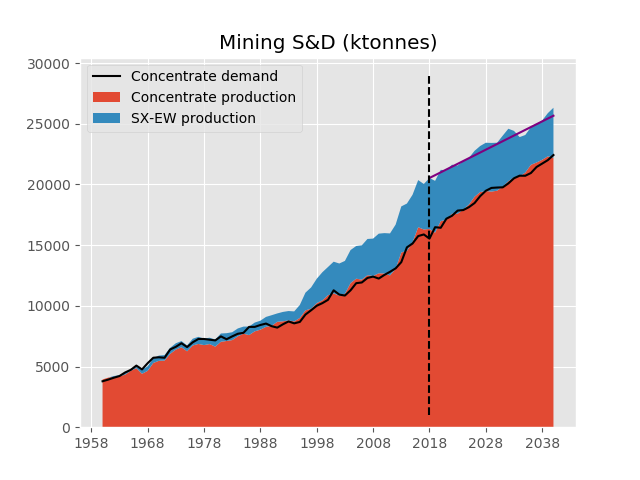

In [26]:
%matplotlib notebook
plt.stackplot(mining_prod_df_all.loc['19600101':, :].index, mining_prod_df_all.loc['19600101':, :].transpose(), 
              labels=mining_prod_df_all.columns)
plt.plot(conc_demand_all, 'k', label='Concentrate demand')
plt.plot([pd.datetime(2018,1,1), pd.datetime(2040,1,1)], [20531, 25662], 'purple')

plt.plot([pd.datetime(2018,1,1), pd.datetime(2018,1,1)], [1000, 29000], 'k--')
plt.legend(loc=2)
plt.title('Mining S&D (ktonnes)')
plt.show()

<IPython.core.display.Javascript object>


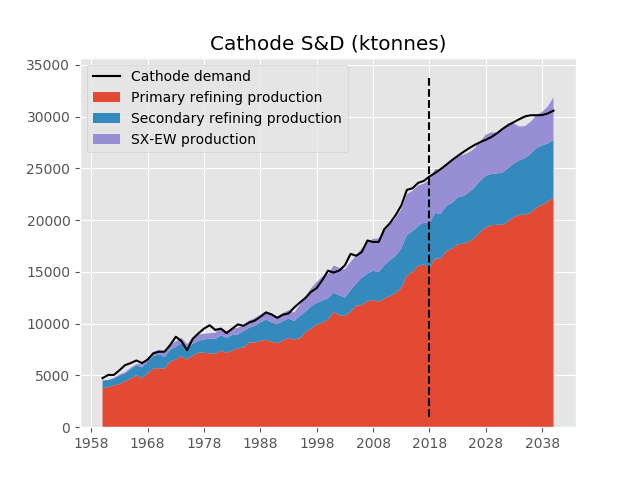

In [27]:
%matplotlib notebook
plt.stackplot(ref_prod_df_all.index, ref_prod_df_all.transpose(), 
              labels=ref_prod_df_all.columns)
plt.plot(ref_demand_all, 'k', label='Cathode demand')

plt.plot([pd.datetime(2018,1,1), pd.datetime(2018,1,1)], [1000, 34000], 'k--')
plt.legend(loc=2)
plt.title('Cathode S&D (ktonnes)')
plt.show()

In [ ]:
%matplotlib notebook
plt.plot(scrap_supply.loc['19600101':], 'k', label='Supply')
plt.stackplot(scrap_demand.loc['19600101':, :].index, scrap_demand.loc['19600101':, :].transpose(), 
              labels=scrap_demand.columns)

plt.plot([pd.datetime(2018,1,1), pd.datetime(2018,1,1)], [500, 15500], 'k--')
plt.title('Scrap S&D (ktonnes)')
plt.legend()
plt.show()

## Ore grade evolution

In [25]:
def average_og_calculator(mine_life_panel_data):
    og_estimate=mine_life_panel_data.loc[:, idx[:, 'Ore treated (kt)']]\
    .mul(mine_life_panel_data.loc[:, idx[:, 'Head grade (%)']].values).div(1e2).sum(axis=1)\
    .div(mine_life_panel_data.loc[:, idx[:, 'Ore treated (kt)']].sum(axis=1)).mul(1e2)
    
    return og_estimate

In [26]:
og_history=pd.read_excel('Data/primary supply/Ore grade history.xls', sheet_name='Sheet1', index_col=0)
og_history_series=pd.Series(og_history.loc[:, 0].values, index=pd.date_range('19910101', '20180101', freq='AS'))

mine_life_stats_panel_all=pd.concat([mine_life_stats_panel_operating, mine_life_stats_panel_new], axis=1)

In [27]:
og_future=average_og_calculator(mine_life_stats_panel_all)
og_future.loc['20180101']=og_history_series.loc['20180101']

<IPython.core.display.Javascript object>


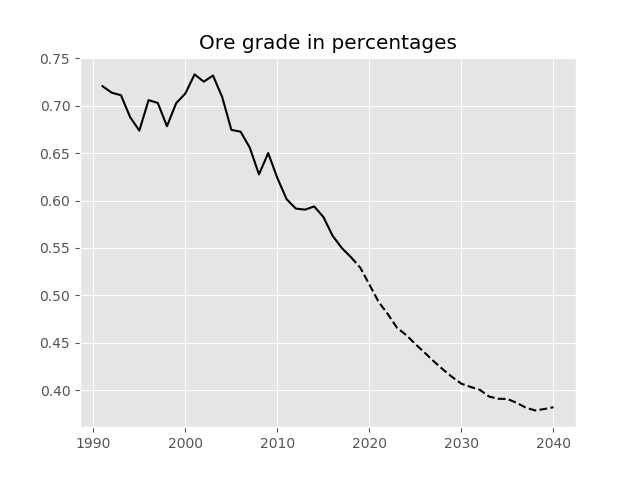

In [28]:
%matplotlib notebook
plt.plot(og_history_series, 'k', label='Historical ore grade')
plt.plot(og_future, 'k--', label='Future ore grade')

#plt.plot([pd.datetime(2018,1,1), pd.datetime(2018,1,1)], [0.4, 0.7], 'k--')
plt.title('Ore grade in percentages')
#plt.legend()
plt.show()

In [14]:
scrap_demand.sum(axis=1)

1950-01-01      756.136390
1951-01-01      789.993244
1952-01-01      801.278861
1953-01-01      762.907761
1954-01-01      799.021738
1955-01-01      981.848746
1956-01-01      950.249016
1957-01-01      929.934904
1958-01-01      934.449151
1959-01-01     1060.848070
1960-01-01     2021.640131
1961-01-01     2008.052818
1962-01-01     2018.966487
1963-01-01     2250.523860
1964-01-01     2346.717142
1965-01-01     2666.556720
1966-01-01     2750.351248
1967-01-01     2803.087736
1968-01-01     3029.540228
1969-01-01     3264.691716
1970-01-01     3426.018532
1971-01-01     3142.960190
1972-01-01     3366.378752
1973-01-01     3554.163142
1974-01-01     3661.596270
1975-01-01     3170.299950
1976-01-01     3467.493281
1977-01-01     3550.334600
1978-01-01     3764.158214
1979-01-01     4016.183613
                  ...     
2011-01-01     9165.029880
2012-01-01     9273.334435
2013-01-01     9678.079481
2014-01-01    10025.049229
2015-01-01    10237.134125
2016-01-01    10420.830965
2

In [29]:
og_future

2018-01-01    0.540173
2019-01-01    0.529229
2020-01-01    0.511303
2021-01-01    0.492989
2022-01-01    0.480173
2023-01-01    0.465682
2024-01-01    0.458036
2025-01-01    0.448443
2026-01-01    0.439494
2027-01-01    0.430258
2028-01-01    0.421672
2029-01-01    0.413704
2030-01-01    0.406653
2031-01-01    0.403313
2032-01-01    0.400255
2033-01-01    0.393154
2034-01-01    0.390808
2035-01-01    0.390588
2036-01-01    0.386520
2037-01-01    0.381418
2038-01-01    0.378526
2039-01-01    0.379952
2040-01-01    0.381938
Freq: AS-JAN, dtype: float64

In [24]:
og_future

NameError: name 'og_future' is not defined